In [1]:
import pypsa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('bmh')
%matplotlib inline

In [2]:
def set_parameters_from_optimized(n,n_optim):
    links_i = n.links.index
    n.links.loc[links_i, 'p_nom'] = n_optim.links['p_nom_opt'].reindex(links_i, fill_value=0.)
    n.links.loc[links_i, 'p_nom_extendable'] = False

    gen_extend_i = n.generators.index[n.generators.p_nom_extendable]
    n.generators.loc[gen_extend_i, 'p_nom'] = n_optim.generators['p_nom_opt'].reindex(gen_extend_i, fill_value=0.)
    n.generators.loc[gen_extend_i, 'p_nom_extendable'] = False


    stores_extend_i = n.stores.index[n.stores.e_nom_extendable]
    n.stores.loc[stores_extend_i, 'e_nom'] = n_optim.stores['e_nom_opt'].reindex(stores_extend_i,fill_value=0.)
    n.stores.loc[stores_extend_i, 'e_nom_extendable'] = False
    
    return n

def prepare_network(n):
    n.add("Generator", "load_shedding",
                bus="elec",
                carrier='load',
                marginal_cost=1e6,  # Eur/kWh
                p_nom=1e9  # kW
                )
   # n.loads["p_set"]=n.loads["p_set"]+50
    return n
    

In [4]:
# Perfect foresight:  sovled network
n_de = pypsa.Network("data/DE-2050-steel_tanks.nc")

Importing PyPSA from older version of PyPSA than current version 0.17.1.
Please read the release notes at https://pypsa.org/doc/release_notes.html
carefully to prepare your network for import.

INFO:pypsa.io:Imported network DE-2050-steel_tanks.nc has buses, generators, links, loads, stores


In [5]:
n_network = pypsa.Network("data/DE-2050-steel_tanks.nc")
n_network.lopf(pyomo=False, solver_name="gurobi", solver_logfile=None, keep_shadowprices=True )

Importing PyPSA from older version of PyPSA than current version 0.17.1.
Please read the release notes at https://pypsa.org/doc/release_notes.html
carefully to prepare your network for import.

INFO:pypsa.io:Imported network DE-2050-steel_tanks.nc has buses, generators, links, loads, stores
INFO:numexpr.utils:NumExpr defaulting to 8 threads.
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.41s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver



--------------------------------------------
--------------------------------------------

Using license file /Users/linyang/gurobi.lic
Academic license - for non-commercial use only - expires 2021-01-31
Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9bpuzbqc.lp
Reading time = 0.15 seconds
obj: 61336 rows, 29208 columns, 121243 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 61336 rows, 29208 columns and 121243 nonzeros
Model fingerprint: 0x95e94113
Coefficient statistics:
  Matrix range     [1e-03, 3e+00]
  Objective range  [9e+02, 9e+04]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+00]

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Presolve removed 33549 rows and 7254 columns
Presolve time: 0.14s
Presolved: 27787 rows, 21954 columns, 77521 nonzeros

Ordering time: 0.01s

Ba

INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e+06


('ok', 'optimal')

In [6]:
n_operation = pypsa.Network("data/DE-2050-steel_tanks.nc")
n_operation = set_parameters_from_optimized(n_operation,n_network )
n_operation = prepare_network(n_operation)
#operation_network.loads["p_set"]=operation_network.loads["p_set"]+50
n_operation.lopf(pyomo=False, solver_name="gurobi", solver_logfile=None, keep_shadowprices=True)

Importing PyPSA from older version of PyPSA than current version 0.17.1.
Please read the release notes at https://pypsa.org/doc/release_notes.html
carefully to prepare your network for import.

INFO:pypsa.io:Imported network DE-2050-steel_tanks.nc has buses, generators, links, loads, stores
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.35s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3eqwkyi7.lp
Reading time = 0.14 seconds
obj: 67160 rows, 32120 columns, 105120 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 67160 rows, 32120 columns and 105120 nonzeros
Model fingerprint: 0x99073a95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e+06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Presolve removed 58400 rows and 12150 columns
Presolve time: 0.08s
Presolved: 8760 rows, 19970 columns, 37490 nonzeros

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 1.168e+04
 Factor NZ  : 1.051e+05 (roughly 12 MBytes of memory)
 Factor Ops : 1.424e+06 (less than 1 second per iteration)
 Threads    : 3

                  Objective      

('warning', 'infeasible or unbounded')

<AxesSubplot:xlabel='name'>

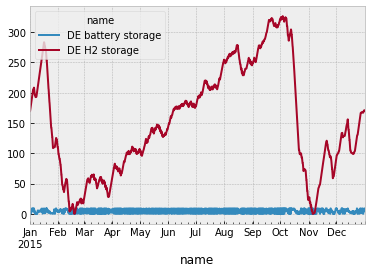

In [7]:
n_operation.stores_t.e.plot()

<AxesSubplot:xlabel='name'>

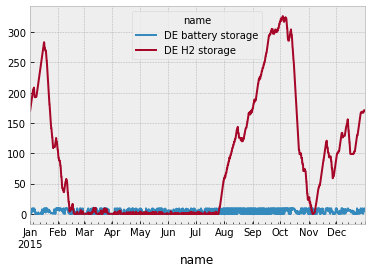

In [8]:
n_network.stores_t.e.plot()

In [9]:
def get_storeage_bid_de(n, snapshots, bus, charger, discharger):
    charge_efficiency = n.links.efficiency[charger]
    discharge_efficiency = n.links.efficiency[discharger]
    #λ = n.stores_t.mu_state_of_charge.loc[snapshots,"DE H2 storage"]
    λ = n.buses_t.marginal_price.loc[snapshots, bus] 
    charging_bid = charge_efficiency * λ
    discharging_bid =  λ/discharge_efficiency
    return charging_bid, discharging_bid  


def solve_network_de_rh_sp(n, opti_n):

    solver_name = "gurobi"

    freq = 1

    window = 2 * 24 // freq
    overlap = 1 * 24 // freq
    kept = window - overlap
    length = len(n.snapshots)


    for i in range(length-1):
        # set initial state of charge
        snapshots = n.snapshots[i]
                    
        h2_charging_bid, h2_discharging_bid = get_storeage_bid_de(opti_n,snapshots, "DE H2", "DE H2 electrolysis", "DE H2 to power")
        n.links.loc["DE H2 electrolysis", "marginal_cost"] = -h2_charging_bid
        n.links.loc["DE H2 to power", "marginal_cost"] = h2_discharging_bid
        
        battery_charging_bid, battery_discharging_bid = get_storeage_bid_de(opti_n,snapshots, "DE battery", "DE battery charge", "DE battery discharge")
        n.links.loc["DE battery charge", "marginal_cost"] = -battery_charging_bid
        n.links.loc["DE battery discharge", "marginal_cost"] = battery_discharging_bid

        if i == 0:

            n.stores.e_initial = opti_n.stores_t.e.iloc[0]
            n.storage_units.state_of_charge_initial = opti_n.storage_units_t.state_of_charge.iloc[-1]
        else:
            n.stores.e_initial = n.stores_t.e.iloc[i - 1]

            n.storage_units.state_of_charge_initial = n.storage_units_t.state_of_charge.iloc[i - 1]
        #n.lopf(pyomo=False, solver_name="gurobi", solver_logfile=None, snapshots=snapshots,  keep_shadowprices=True)
        pypsa.linopf.network_lopf(n,snapshots,solver_name="gurobi", solver_logfile=None,
                                     keep_shadowprices=True)
    
    return n

def solve_network_de_sp_3h(n, opti_n):

    solver_name = "gurobi"

    freq = 1
    window = 14 * 24 // freq
    overlap = 7 * 24 // freq
    kept = window - overlap
    length = len(n.snapshots)
    #nodelist = n.buses[n.buses.carrier == "AC"].index
    h2_charging_bid, h2_discharging_bid = get_storeage_bid_de(opti_n,n.snapshots, "DE H2", "DE H2 electrolysis", "DE H2 to power")
                # n.links.loc[node + link_charger, "marginal_cost"] = -charging_bid
                # n.links.loc[node + link_discharger, "marginal_cost"] = dicharging_bid
    n.links_t.marginal_cost["DE H2 electrolysis"] = 0
    n.links_t.marginal_cost.loc[n.snapshots, "DE H2 electrolysis"] = - h2_charging_bid
    n.links_t.marginal_cost["DE H2 to power"] = 0
    n.links_t.marginal_cost.loc[n.snapshots, "DE H2 to power"] = h2_discharging_bid
    
    
    battery_charging_bid, battery_discharging_bid = get_storeage_bid_de(opti_n,n.snapshots, "DE battery", "DE battery charge", "DE battery discharge")
    n.links_t.marginal_cost["DE battery charge"] = 0
    n.links_t.marginal_cost.loc[n.snapshots, "DE battery charge"] = - battery_charging_bid
    n.links_t.marginal_cost["DE battery discharge"] = 0
    n.links_t.marginal_cost.loc[n.snapshots, "DE battery discharge"] = battery_discharging_bid


    for i in range(length -1):
        # set initial state of charge
        snapshots = n.snapshots[i]
                    
#        charging_bid, dicharging_bid = get_storeage_bid_de(opti_n, snapshots)
#         n.links.loc["DE H2 electrolysis", "marginal_cost"] = -charging_bid
#         n.links.loc["DE H2 to power", "marginal_cost"] = dicharging_bid
        if i == 0:

            n.stores.e_initial = opti_n.stores_t.e.iloc[0]
            n.storage_units.state_of_charge_initial = opti_n.storage_units_t.state_of_charge.iloc[-1]
        else:
            n.stores.e_initial = n.stores_t.e.iloc[i - 1]

            n.storage_units.state_of_charge_initial = n.storage_units_t.state_of_charge.iloc[i - 1]
        #n.lopf(pyomo=False, solver_name="gurobi", solver_logfile=None, snapshots=snapshots,  keep_shadowprices=True)
        pypsa.linopf.network_lopf(n,snapshots,solver_name="gurobi", solver_logfile=None,
                                     keep_shadowprices=True)
    
    return n



def solve_network_de_sp_2w(n, opti_n):

    solver_name = "gurobi"

    freq = 1
    window = 14 * 24 // freq
    overlap = 7 * 24 // freq
    kept = window - overlap
    length = len(n.snapshots)
    #nodelist = n.buses[n.buses.carrier == "AC"].index
    h2_charging_bid, h2_discharging_bid = get_storeage_bid_de(opti_n,n.snapshots, "DE H2", "DE H2 electrolysis", "DE H2 to power")
                # n.links.loc[node + link_charger, "marginal_cost"] = -charging_bid
                # n.links.loc[node + link_discharger, "marginal_cost"] = dicharging_bid
    n.links_t.marginal_cost["DE H2 electrolysis"] = 0
    n.links_t.marginal_cost.loc[n.snapshots, "DE H2 electrolysis"] = - h2_charging_bid
    n.links_t.marginal_cost["DE H2 to power"] = 0
    n.links_t.marginal_cost.loc[n.snapshots, "DE H2 to power"] = h2_discharging_bid
    
    
    battery_charging_bid, battery_discharging_bid = get_storeage_bid_de(opti_n,n.snapshots, "DE battery", "DE battery charge", "DE battery discharge")
    n.links_t.marginal_cost["DE battery charge"] = 0
    n.links_t.marginal_cost.loc[n.snapshots, "DE battery charge"] = - battery_charging_bid
    n.links_t.marginal_cost["DE battery discharge"] = 0
    n.links_t.marginal_cost.loc[n.snapshots, "DE battery discharge"] = battery_discharging_bid


    for i in range(length // kept):
        # set initial state of charge
        snapshots = n.snapshots[i * kept:(i + 1) * kept + overlap]
                    
#        charging_bid, dicharging_bid = get_storeage_bid_de(opti_n, snapshots)
#         n.links.loc["DE H2 electrolysis", "marginal_cost"] = -charging_bid
#         n.links.loc["DE H2 to power", "marginal_cost"] = dicharging_bid
        if i == 0:

            n.stores.e_initial = opti_n.stores_t.e.iloc[0]
            n.storage_units.state_of_charge_initial = opti_n.storage_units_t.state_of_charge.iloc[-1]
        else:
            n.stores.e_initial = n.stores_t.e.iloc[i * kept - 1]

            n.storage_units.state_of_charge_initial = n.storage_units_t.state_of_charge.iloc[i * kept - 1]
        #n.lopf(pyomo=False, solver_name="gurobi", solver_logfile=None, snapshots=snapshots,  keep_shadowprices=True)
        pypsa.linopf.network_lopf(n,snapshots,solver_name="gurobi", solver_logfile=None,
                                     keep_shadowprices=True)
    
    return n



In [10]:
n_de_rh = n_de.copy()
n_de_rh = set_parameters_from_optimized(n_de_rh, n_operation)
n_de_rh = prepare_network(n_de_rh)
n_de_rh.stores.e_cyclic = False
n_de_rh = solve_network_de_sp_2w(n_de_rh, n_operation)

INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-45kdoqsz.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x4076053d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 6772 rows and 1403 columns
Presolve time: 0.01s
Presolved: 956 rows, 2293 columns, 4255 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4685288e+04   3.306563e+04   0.000000e+00      0s
     897    7.8661943e+03   0.000000e+00   0.000000e+00      0s

Solved in 897 iterations and 0.03 seconds
Optimal objective  7.866194337e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 7.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-58xmucrb.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x9a36a1df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6776 rows and 1419 columns
Presolve time: 0.01s
Presolved: 952 rows, 2277 columns, 4235 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7046943e+04   6.431545e+04   0.000000e+00      0s

Solved in 869 iterations and 0.05 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lv2m6549.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x7293ac71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6729 rows and 1397 columns
Presolve time: 0.01s
Presolved: 999 rows, 2299 columns, 4301 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1603983e+03   7.694944e+04   0.000000e+00      0s
Extra simplex iterations after uncrush: 14

Solved in 878 iterations and 0.04 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n7qj9up3.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x74902a0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 6737 rows and 1427 columns
Presolve time: 0.01s
Presolved: 991 rows, 2269 columns, 4266 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1500499e-03   8.516057e+04   0.000000e+00      0s
     496    3.2130262e-04   0.000000e+00   0.000000e+00      0s

Solved in 496 iterations and 0.03 seconds
Optimal objective  3.213026207e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 3.21e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7g2lv8ux.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0xf9ae02ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 6751 rows and 1462 columns
Presolve time: 0.01s
Presolved: 977 rows, 2234 columns, 4217 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0418023e-03   5.899400e+04   0.000000e+00      0s
     542    1.0460111e-04   0.000000e+00   0.000000e+00      0s

Solved in 542 iterations and 0.03 seconds
Optimal objective  1.046011149e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 1.05e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aqtl5sg8.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x65b7427c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 6787 rows and 1502 columns
Presolve time: 0.01s
Presolved: 941 rows, 2194 columns, 4141 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8675264e-03   5.215182e+04   0.000000e+00      0s
     507    1.9386210e-04   0.000000e+00   0.000000e+00      0s

Solved in 507 iterations and 0.04 seconds
Optimal objective  1.938621025e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 1.94e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfq7f8az.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0xc99ef38f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 6739 rows and 1458 columns
Presolve time: 0.01s
Presolved: 989 rows, 2238 columns, 4233 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6166250e-03   3.745397e+04   0.000000e+00      0s
     586    2.0672001e-04   0.000000e+00   0.000000e+00      0s

Solved in 586 iterations and 0.03 seconds
Optimal objective  2.067200067e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 2.07e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-96no5lg5.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x66bd767e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 6753 rows and 1469 columns
Presolve time: 0.01s
Presolved: 975 rows, 2227 columns, 4208 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5874635e-03   5.205502e+04   0.000000e+00      0s
     581    1.7037955e-04   0.000000e+00   0.000000e+00      0s

Solved in 581 iterations and 0.03 seconds
Optimal objective  1.703795513e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xw07ihyl.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0xf6aa874e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6728 rows and 1443 columns
Presolve time: 0.01s
Presolved: 1000 rows, 2253 columns, 4259 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7361407e-03   6.973831e+04   0.000000e+00      0s
     544    2.1758273e-04   0.000000e+00   0.000000e+00      0s

Solved in 544 iterations and 0.03 seconds
Optimal objective  2.175827271e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 2.18e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47b2norp.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x585ccdee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 6738 rows and 1452 columns
Presolve time: 0.01s
Presolved: 990 rows, 2244 columns, 4240 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1671107e-03   4.235196e+04   0.000000e+00      0s
     524    3.6283914e-04   0.000000e+00   0.000000e+00      0s

Solved in 524 iterations and 0.03 seconds
Optimal objective  3.628391352e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 3.63e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ybfe2ndw.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x1d9e6cd2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6764 rows and 1470 columns
Presolve time: 0.01s
Presolved: 964 rows, 2226 columns, 4196 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7505665e-03   1.112115e+05   0.000000e+00      0s
     512    4.0336242e-04   0.000000e+00   0.000000e+00      0s

Solved in 512 iterations and 0.03 seconds
Optimal objective  4.033624166e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 4.03e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e_lojrop.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x2b77896b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6760 rows and 1451 columns
Presolve time: 0.01s
Presolved: 968 rows, 2245 columns, 4219 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5444619e-03   4.818229e+04   0.000000e+00      0s
     566    4.9309382e-04   0.000000e+00   0.000000e+00      0s

Solved in 566 iterations and 0.03 seconds
Optimal objective  4.930938158e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 4.93e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-grmzdprz.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0xb376b617
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 6766 rows and 1429 columns
Presolve time: 0.01s
Presolved: 962 rows, 2267 columns, 4235 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9522722e+05   7.256941e+04   0.000000e+00      0s
     773    3.9948804e+05   0.000000e+00   0.000000e+00      0s

Solved in 773 iterations and 0.04 seconds
Optimal objective  3.994880414e+05


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e+05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w4m7ewkv.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x476f89ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 6725 rows and 1372 columns
Presolve time: 0.01s
Presolved: 1003 rows, 2324 columns, 4333 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5545070e+06   7.844213e+04   0.000000e+00      0s

Solved in 760 iterations and 0.03 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hnr22h14.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x218b83de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 6749 rows and 1389 columns
Presolve time: 0.01s
Presolved: 979 rows, 2307 columns, 4292 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7371538e+05   6.572366e+04   0.000000e+00      0s

Solved in 660 iterations and 0.03 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a3ec_899.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0xc9936424
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6733 rows and 1370 columns
Presolve time: 0.01s
Presolved: 995 rows, 2326 columns, 4327 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0448867e+04   8.696552e+04   0.000000e+00      0s
     657    1.3402407e+03   0.000000e+00   0.000000e+00      0s

Solved in 657 iterations and 0.04 seconds
Optimal objective  1.340240701e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47bnt5g2.lp
Reading time = 0.01 seconds
obj: 5336 rows, 2552 columns, 8350 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 5336 rows, 2552 columns and 8350 nonzeros
Model fingerprint: 0xdb4e1cb6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 4665 rows and 963 columns
Presolve time: 0.01s
Presolved: 671 rows, 1589 columns, 2954 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0842361e+04   7.353046e+04   0.000000e+00      0s
     380    5.2210329e+02   0.000000e+00   0.000000e+00      0s

Solved in 380 iterations and 0.02 seconds
Optimal objective  5.221032933e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 5.22e+02


In [11]:
n_de_rh_sp_3h = n_de.copy()
n_de_rh_sp_3h = set_parameters_from_optimized(n_de_rh_sp_3h, n_operation)
n_de_rh_sp_3h = prepare_network(n_de_rh_sp_3h)
n_de_rh_sp_3h.stores.e_cyclic = False
n_de_rh_sp_3h = solve_network_de_sp_3h(n_de_rh_sp_3h, n_operation)

INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.22s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zm2xe9wn.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15c05926
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.766841e+00   0.000000e+00      0s
       1    5.5977361e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.03 seconds
Optimal objective  5.597736069e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i637fcdz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa35d4d7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.714091e+00   0.000000e+00      0s
       2    6.1982833e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  6.198283331e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.23s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z500uaed.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71161729
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.639327e+00   0.000000e+00      0s
       2    6.4092953e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  6.409295325e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.41e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a65ycx8c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6688a330
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483599e+01   1.473080e+00   0.000000e+00      0s
       1   -2.5483532e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -2.548353162e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-irpwzs1q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd36d6fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483596e+01   8.294830e-01   0.000000e+00      0s
       1   -2.5483560e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548355956e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0idq2zf1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe197e301
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483596e+01   2.134740e+00   0.000000e+00      0s
       1   -2.5483495e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548349454e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b22p3jwg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a7022c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483594e+01   1.938920e+00   0.000000e+00      0s
       1   -2.5483506e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548350629e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nmtn0ubn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53e5ad10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483550e+01   1.599345e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352398e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rvqdxinc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57a8b2bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   1.345314e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352395e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ickoahuk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6890856a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.040820e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352362e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-smgqv77a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58feb9c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   8.600430e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352380e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bmuuyv7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1164d13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   7.928700e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352417e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n1ctmdaj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b1afb01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352341e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7gu1acpq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56962168
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_vr6moxe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd851b32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x8llhjor.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c4195b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dom45p5_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7b72c80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rktk6deg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0a610ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.889771e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352287e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c67g2sxy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e8497c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.958222e-01   0.000000e+00      0s
       2   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -2.548352273e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7_4tfqub.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcac21dfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352425e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mhk2of17.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x116bd825
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ep_9g_5q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d98c89c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.691400e-01   0.000000e+00      0s
       2   -8.9147199e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.914719877e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.91e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rd0o9m6q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3095a03b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.598680e-01   0.000000e+00      0s
       2   -4.8424048e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.842404847e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.84e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-50uzu1ta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd681e8e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.637270e-01   0.000000e+00      0s
       2   -9.1576817e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.157681711e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.16e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qrolac3b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5412bee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.338530e-01   0.000000e+00      0s
       2   -1.9475548e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.947554770e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mojfj9m0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x088cd5cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.245700e-01   0.000000e+00      0s
       2   -1.9892214e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.989221400e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wo42p621.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b7876b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.397830e-01   0.000000e+00      0s
       2   -1.4720893e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.472089278e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-96mabipm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d4ec989
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tnqzktcd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61a26587
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mpe1gu8a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa75338be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.833430e-01   0.000000e+00      0s
       2   -1.2765708e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.276570758e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.28e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hlp__wx4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04727f4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.659060e-01   0.000000e+00      0s
       2   -8.2902366e-02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.290236597e-02


INFO:pypsa.linopf:Optimization successful. Objective value: -8.29e-02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xe4aqpw1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b744947
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.206030e-01   0.000000e+00      0s
       2    1.2610162e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.261016245e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ptyllcun.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a7b52a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6832665e+01   1.178316e+00   0.000000e+00      0s
       2    1.4881987e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.488198658e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h6o1xaud.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62d6d414
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0226457e+01   1.422694e+00   0.000000e+00      0s
       2    8.6967981e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.696798092e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.70e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fr8c63_k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf412f8d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8053571e+01   1.513639e+00   0.000000e+00      0s
       2    2.4956003e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.495600329e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.50e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wu4m5htz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6676b59b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0299611e+01   4.903723e-01   0.000000e+00      0s
       1   -4.2471259e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.247125874e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_9wgtlwx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe77ab0ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3311872e+01   0.000000e+00   0.000000e+00      0s
       0   -4.3311872e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.331187212e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lrlgp9wt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf98ff691
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.002341e+00   0.000000e+00      0s
       2    4.5153769e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.515376949e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ehejyosp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x638dd8c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0637303e+01   2.276521e+00   0.000000e+00      0s
       1    7.4672330e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.467232967e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y4i06q0y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55e86a44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2121551e+02   2.715555e+00   0.000000e+00      0s
       1    8.5321891e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.532189089e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xvp4r5fd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd747015c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4552015e+01   2.085207e+00   0.000000e+00      0s
       2    1.0052601e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.005260088e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-op6g2xxb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf17d1456
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352870e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rcvdfzjp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad114182
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5602843e+01   2.146732e+00   0.000000e+00      0s
       1    8.5396594e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.539659420e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qgr6hkyf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91b673e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.021481e+00   0.000000e+00      0s
       1   -1.5648475e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.564847537e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.56e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-st8gqmme.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7d7349e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.450852e+00   0.000000e+00      0s
       1   -5.8869758e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.886975839e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hcxipsap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d7dd5ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.549257e+00   0.000000e+00      0s
       1    3.3370347e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.337034704e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.34e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_w288v_a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf053f738
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.521961e+00   0.000000e+00      0s
       1    3.0534288e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.053428782e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z6tle6ra.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7ccff1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.544609e+00   0.000000e+00      0s
       2    3.9799576e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.979957568e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.98e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wpmjpzgb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5bda01f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.605018e+00   0.000000e+00      0s
       2    5.8745887e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.874588719e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.87e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-63syfh1d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3dc8561
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.582314e+00   0.000000e+00      0s
       2    5.5207463e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.520746277e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mmakvzhl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53f37826
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.613609e+00   0.000000e+00      0s
       2    6.0084797e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.008479682e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wjxqdvor.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f5893bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   1.991277e+00   0.000000e+00      0s
       1   -1.0628875e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.062887495e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1aidfwre.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85de1892
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.620290e+00   0.000000e+00      0s
       1   -2.7280582e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.728058243e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zm81dx8_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52ec8577
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.489673e+00   0.000000e+00      0s
       1    1.6106407e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.610640716e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k5n5gnc4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdff5e058
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.439972e+00   0.000000e+00      0s
       1    1.3046293e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.304629262e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lz402uh0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x098b71af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.371238e+00   0.000000e+00      0s
       1    8.8143068e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.814306776e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.81e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-urest4tq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1db1fa58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5775509e+01   2.202209e+00   0.000000e+00      0s
       1   -1.1612166e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.161216627e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cj756r7v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x136a260a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3011767e+01   2.024131e+00   0.000000e+00      0s
       1   -9.1542256e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.154225575e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.15e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xpi1d_2l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5bd62fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0117664e+01   1.944296e+00   0.000000e+00      0s
       1   -1.2737610e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.273760965e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6cr9ry4s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x180b10bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847648e+01   1.640884e+00   0.000000e+00      0s
       1   -2.6190408e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.619040766e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z488tl8a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x149d6233
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847622e+01   1.427902e+00   0.000000e+00      0s
       1   -3.3933741e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.393374132e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-co1r7bka.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1b9c1c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847620e+01   1.969152e+00   0.000000e+00      0s
       1   -1.1621951e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.162195117e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8mtlots9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e1d41a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   1.863563e+00   0.000000e+00      0s
       1   -1.6361300e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.636130034e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mis78b16.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1b97ea7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5488471e+01   1.655951e+00   0.000000e+00      0s
       1   -2.5483536e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548353604e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eoj0hshb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87987c90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483545e+01   1.591447e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lw1asmrj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75c4b4a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   1.340860e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352396e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1kvx0tkn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66060f37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   7.112380e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352395e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xji3b_v7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3168f33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6nntihnl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x961709fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l45eiq5e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4eadab28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a36kni45.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7dd51878
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vnul7di4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66a0f847
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7i1axihv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9d26bff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5on7s0vn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4520c36a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hdegwz5g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf497a3d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iqpau5gj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f489be5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-basetf36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea5e11b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3h71zx5h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6eab585
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pj27_o00.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e6c6011
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7bqgrlj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b87e823
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a1vqj76n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8283b9cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-52hj_3zs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x783919c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3d20hf5u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7eebdc34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rp7l94kq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x022157a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ng9qyy9i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4e2dd02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovevfxp2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0635d548
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dmvfaqod.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ab144ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k6x7rcsx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62be4570
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zq0g0b2p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec0c1e19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g8nyrnvy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec0ef529
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8iniofkb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1cab0c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v__zw76c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04ec3102
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_8ih7j3u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda279c3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2xggg8cb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba0a1bad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ld7lbzp2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc42b6182
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8l6gyn45.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b181d41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pbzyrj2s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b834654
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.348794e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m96yesmm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc11fe82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.895169e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352324e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8dri92ig.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddce9133
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nkkoqqa8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x249ff02a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bppq8wxh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa463e6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352413e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jnw_a0th.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0172c041
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hhbbwxua.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66fa47ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.753071e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352280e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jk2gys2t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55a602b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.476676e-01   0.000000e+00      0s
       2   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352223e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d23sc6if.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9db8beb2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.882759e-01   0.000000e+00      0s
       2   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352167e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9xoy7rmh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0219a04c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.062661e+00   0.000000e+00      0s
       2   -2.5483521e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352121e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f9owikt6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3709b539
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.336502e+00   0.000000e+00      0s
       2   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352221e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jxlann7s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4813eb27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   6.213890e-01   0.000000e+00      0s
       1   -2.5483527e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352714e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ze79coo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd943fa43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ldtpvo6e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffcb9f8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.169820e-01   0.000000e+00      0s
       2   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351983e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x85a5rgl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa3e649d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   9.065019e-01   0.000000e+00      0s
       2   -2.5483518e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351785e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.21s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mvw4_mhf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae979141
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.512840e+00   0.000000e+00      0s
       2   -2.5483518e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351815e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vkfc56ty.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d90f1cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483535e+01   2.294958e+00   0.000000e+00      0s
       1   -2.5483517e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548351711e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gylc5ln6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9010a7af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483535e+01   1.952969e+00   0.000000e+00      0s
       1   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352008e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jejlm5y7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8f86f26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.484398e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352371e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0_9l0a19.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2b34921
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   4.848000e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352535e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yhoo3y5h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcdd6cb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   4.410700e-01   0.000000e+00      0s
       1   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352579e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rhkw4bhu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3466ad69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uzbpzua0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c148735
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ja83_48x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2172c883
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352350e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1w3ya2_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6abc53da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_uny7y3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1ee51e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.335700e-02   0.000000e+00      0s
       2   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352276e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1c7_j__l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a338ff1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.076890e-01   0.000000e+00      0s
       2   -2.5483521e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352131e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dhl24c_7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x472b5389
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352484e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m8t7dwmg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b3bb55c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2k4jmq3c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8a03cbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.692070e-01   0.000000e+00      0s
       2    4.1711142e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.171114152e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.17e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-66x3pygb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09aff8ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3023551e+01   1.663005e+00   0.000000e+00      0s
       2    6.2301664e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.230166360e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2nllm5jf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11198654
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2949634e+02   3.450458e+00   0.000000e+00      0s
       1    7.3589067e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.358906721e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d3jt6hxs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff0c046a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0746392e+02   2.212768e+00   0.000000e+00      0s
       1    7.8535443e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.853544298e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j2u8zqmd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4de9d400
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.4585371e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.458537099e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fkw_ggoo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x815012f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.842440e+00   0.000000e+00      0s
       2    9.5748170e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.574816983e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oln3pdzz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71dd965f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.515964e+00   0.000000e+00      0s
       1   -5.3937965e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.393796526e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z9vaac5e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9320955
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   7.639650e-01   0.000000e+00      0s
       1   -1.1089680e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.108967977e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.11e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qdsuyf8j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08816e3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1216556e+02   2.060614e+00   0.000000e+00      0s
       2    3.6203082e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.620308185e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5pd_pb_u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3083d29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.814018e+00   0.000000e+00      0s
       1    4.8853656e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.885365579e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b5utyyr9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b242d04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.687896e+00   0.000000e+00      0s
       1    4.7774964e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.777496415e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jdah_vmn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fe75bc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.692406e+00   0.000000e+00      0s
       1    4.8243554e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.824355395e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.82e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5scnsbh7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcabc52bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.738186e+00   0.000000e+00      0s
       2    7.8462910e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.846291026e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cy6usq7k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0dc0aed5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.794937e+00   0.000000e+00      0s
       2    8.8344815e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.834481461e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.83e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r5cddo2i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcde9ee8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.346382e+00   0.000000e+00      0s
       1   -6.6782654e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.678265352e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-idsibh4n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07a70abc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   4.998940e-01   0.000000e+00      0s
       1   -1.2880437e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.288043710e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p2vggssx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1e678f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.8826376e+01   1.685268e+00   0.000000e+00      0s
       2    3.7818031e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.781803065e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hzf5_1fz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38ca1b98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2694710e+02   2.321241e+00   0.000000e+00      0s
       2    6.4704765e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.470476459e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qggwlyfx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80932102
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7167311e+02   2.841170e+00   0.000000e+00      0s
       1    7.4049052e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.404905175e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3tn7mrvt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0402f1ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3785250e+02   2.236133e+00   0.000000e+00      0s
       2    9.8977508e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.897750778e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ku1awdqf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c1eb2db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331656e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-stfm_0jm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbd27ff4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5030974e+01   2.403786e+00   0.000000e+00      0s
       1    1.1613118e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.161311765e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-plyn37l3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x086181c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074083e+02   2.337066e+00   0.000000e+00      0s
       1   -1.0256559e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.025655918e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zd07v4uo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9c7503c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074083e+02   2.036861e+00   0.000000e+00      0s
       1   -5.2175070e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.217506958e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fqeypkqz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b5a5501
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0316269e+02   2.046402e+00   0.000000e+00      0s
       2    8.3113179e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.311317884e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1x032r_0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf8653ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4156767e+02   2.706380e+00   0.000000e+00      0s
       1    1.0655245e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.065524525e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.07e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-scfr6aak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e9720c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0409649e+02   2.083905e+00   0.000000e+00      0s
       2    1.2304283e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.230428277e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w6fu006p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x407184ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331706e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p168yil3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e15604c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1409745e+02   3.268090e+00   0.000000e+00      0s
       1    1.1958205e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.195820497e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-11r9rnip.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x869fe8f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2120366e+01   2.029897e+00   0.000000e+00      0s
       1    1.2041453e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.204145338e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wcdm89vq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x557e2eba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.503048e+00   0.000000e+00      0s
       2    3.9326614e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.932661404e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kvdqv35_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0df00831
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.311998e+00   0.000000e+00      0s
       2    1.3078643e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.307864268e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_o48we5d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe06497b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331706e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x148d4hc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9cec15ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2052870e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.205286968e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.21e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-voq_0lyn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d4da3b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9661546e+01   2.063905e+00   0.000000e+00      0s
       2    1.1863288e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.186328807e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mjmy08cf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59a833cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331709e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z7ixtj7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82ac1414
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.7767602e+01   2.055364e+00   0.000000e+00      0s
       1    1.1714784e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.171478353e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yiqd2y3i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78f07667
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9378196e+02   4.498431e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xqaoe16_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13f1092e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.182018e+00   0.000000e+00      0s
       1   -4.3072650e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.307264990e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.31e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ajuey8oc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94275f31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   1.788656e+00   0.000000e+00      0s
       1   -4.1090609e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.109060855e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-01nk3s9q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4fff9c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.875385e+00   0.000000e+00      0s
       1    8.3030993e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.303099260e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eu4mfo6n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8b1293c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.8553736e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.855373572e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gyi7ve07.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbf8ddb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331704e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-67h4prs8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf96fc989
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2513764e+02   2.178793e+00   0.000000e+00      0s
       1    1.0131537e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.013153714e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vpzhykzr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c348fde
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1195428e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.119542752e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wf164ook.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0e2cb1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331706e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p03g0mwe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa99d77da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.333763e+00   0.000000e+00      0s
       1    1.3556151e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.355615111e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-53puksu5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x480ba8c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.224846e+00   0.000000e+00      0s
       1   -3.0241185e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.024118542e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.02e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b88grqo0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96cbcac5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.791407e+00   0.000000e+00      0s
       1    7.2258981e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.225898142e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z7dz16we.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4e5b03c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0878169e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.087816927e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.09e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-supwtxhf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b37d84f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331706e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aekqqyiq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7df6cc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2027095e+02   2.156846e+00   0.000000e+00      0s
       1    1.0413055e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.041305531e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rneywr_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7242a9c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7200651e+02   4.366187e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pu88051k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a45f086
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1333536e+02   2.125569e+00   0.000000e+00      0s
       2    1.1363125e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.136312492e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.14e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lyq29h1q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56d35e7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074096e+02   2.479219e+00   0.000000e+00      0s
       2    3.9140080e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.914008012e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.91e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ihai5fn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5117bcfd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074096e+02   2.533883e+00   0.000000e+00      0s
       2    4.7659479e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.765947910e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-23g1_tuj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x915fe6e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331704e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jsf400j0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c3d983e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2385822e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.238582154e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.24e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zr32zo2g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7671612
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331704e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovrspyi3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3495995
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074096e+02   2.794725e+00   0.000000e+00      0s
       2    8.5434777e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.543477655e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-td1oe2hb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa84d14da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.731157e+00   0.000000e+00      0s
       2    7.8404685e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.840468460e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-18bhplt9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20c52a46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.656752e+00   0.000000e+00      0s
       2    6.6808646e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.680864551e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xk3acp29.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5158f31c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.190690e+00   0.000000e+00      0s
       1   -3.4963445e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.496344471e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.50e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qb4qtj8n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b1cd264
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.191462e+00   0.000000e+00      0s
       1   -3.4241546e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.424154599e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.42e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8s8cgg5n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x826f2121
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.669174e+00   0.000000e+00      0s
       2    6.7091383e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.709138261e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.71e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yjujhm06.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16b23cf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.710998e+00   0.000000e+00      0s
       2    7.5262899e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.526289908e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-icbej5do.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54765546
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.748026e+00   0.000000e+00      0s
       2    8.1033723e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.103372275e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n3phhej_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4e9d313
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.707772e+00   0.000000e+00      0s
       2    7.4760126e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.476012612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4b4eg7nn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5a51f02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.701041e+00   0.000000e+00      0s
       2    7.3711098e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.371109797e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.37e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6d9cel5g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33ed68ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.774949e+00   0.000000e+00      0s
       2    8.5229679e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.522967948e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5lbuvh8n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ad4fdfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.226855e+00   0.000000e+00      0s
       1   -1.1454993e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.145499252e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.15e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-444sh7ih.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2eb47d21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.134668e+00   0.000000e+00      0s
       1   -8.7349695e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -8.734969478e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.73e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3hnyxlo4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17b3c6dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.765473e+00   0.000000e+00      0s
       2    8.1638787e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.163878741e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hsbjkq9e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x694a5921
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331696e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pk582apk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad61f2c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1699157e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.169915687e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0whk5hw0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62c5388e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331696e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bwds4752.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8363253a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0663738e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.066373788e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.07e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jph19lji.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41fb0665
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6058818e+02   2.760935e+00   0.000000e+00      0s
       2    8.3045594e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.304559384e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u6xdatsw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e343d78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.150233e+00   0.000000e+00      0s
       1   -3.4941536e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.494153643e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.49e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-guix7a2o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x728b3d94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.733692e+00   0.000000e+00      0s
       1   -2.2190546e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.219054605e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-28c29nys.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8d05c24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.029817e+00   0.000000e+00      0s
       1   -8.8990110e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.899010963e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.90e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ivuh2vm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66a3c7de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.124852e+00   0.000000e+00      0s
       1   -4.6333763e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.633376289e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.63e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9out167o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x981109c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.193192e+00   0.000000e+00      0s
       1   -1.5659437e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.565943659e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-au2v3qyb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe17b45af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.048950e+00   0.000000e+00      0s
       1   -8.0402284e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.040228375e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.04e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i2c_uzt0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x442793e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.132974e+00   0.000000e+00      0s
       1   -4.2688212e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.268821207e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.27e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8nxe8pan.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x953246e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.090323e+00   0.000000e+00      0s
       1   -6.1832061e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.183206139e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.18e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s3t_2c9f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c4fc3cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.291866e+00   0.000000e+00      0s
       1   -4.2021851e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.202185117e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8qzp99to.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e8ae1e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3233370e+01   5.418833e-01   0.000000e+00      0s
       1   -4.8911007e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.891100665e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6suzj8nn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84209e72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.993060e-01   0.000000e+00      0s
       1   -7.5607229e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.560722876e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.56e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-we_cw48v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34278468
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.285770e-01   0.000000e+00      0s
       2    2.2216106e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.221610647e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9lhkgdh3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f034d5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5478025e+01   1.622985e+00   0.000000e+00      0s
       2    3.7543831e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.754383091e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hru5flme.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x641eb42e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9267478e+01   2.376055e+00   0.000000e+00      0s
       2    3.7560332e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.756033180e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m0o250bg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa55fe2e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.695282e+00   0.000000e+00      0s
       1    2.8765851e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.876585088e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-djcx6k7s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x893d8717
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.428469e+00   0.000000e+00      0s
       1    1.2338046e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.233804625e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2nqlen44.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x714cd914
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483532e+01   1.430873e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352472e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4zsun1ff.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf512fff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   4.962000e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352474e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8vpb1_58.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8faa05a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.097813e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352451e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6efciuem.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b83efa6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rszfiksj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x120a6203
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n16k2i1q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28f64c26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ibf3e6fu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e5260d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7umr2kzp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1aad6af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w9f_7uxh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b19818c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a39gf6u6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x661fc124
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4i_0m010.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0b39ee7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.443100e-02   0.000000e+00      0s
       2   -2.4835790e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.483578991e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qlt884sa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfcee2f29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.540340e-01   0.000000e+00      0s
       2    8.9646109e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.964610855e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.96e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ewf0tusd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4878814a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3551664e+01   9.299976e-01   0.000000e+00      0s
       2    2.6569873e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.656987268e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a288n3r2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2109c9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7464560e+01   1.438994e+00   0.000000e+00      0s
       2    4.6652323e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.665232272e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.67e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o75dpqcc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6052831e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9451641e+01   2.117507e+00   0.000000e+00      0s
       2    5.9554543e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.955454290e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.96e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nigrlv7j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x759738ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.729823e+00   0.000000e+00      0s
       1    5.2131187e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.213118746e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.21e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4tjm7roh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a57224b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.979466e+00   0.000000e+00      0s
       1   -1.8830827e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.883082738e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zrsbf8qd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61924148
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.867814e+00   0.000000e+00      0s
       1   -2.7287710e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.728771050e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7y7s4efk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78622138
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.657415e+00   0.000000e+00      0s
       1    4.4607983e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.460798330e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7n3ejbun.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x909286b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.865677e+00   0.000000e+00      0s
       1    6.6246442e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.624644236e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jop9oam5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x171edf7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.863795e+00   0.000000e+00      0s
       2    8.6086857e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.608685650e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3lfq3r1i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe254a32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.821680e+00   0.000000e+00      0s
       2    9.2512718e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.251271829e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r5wibkec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa2d2b98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.776242e+00   0.000000e+00      0s
       2    8.5431194e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.543119388e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8bvwuc0w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefb8dc74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.779500e+00   0.000000e+00      0s
       2    8.5938954e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.593895405e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ftxpq5rc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x112a95bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.825193e+00   0.000000e+00      0s
       1   -3.0515963e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.051596311e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-duh0cozy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4f88dec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.670572e+00   0.000000e+00      0s
       1   -4.2227457e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.222745723e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hj76fo0m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fedfc6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.376061e+00   0.000000e+00      0s
       1    1.5375253e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.537525254e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pg_t_ou4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20743653
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.733261e+00   0.000000e+00      0s
       1    5.2488397e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.248839683e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nusevg9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1b6eb72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.765106e+00   0.000000e+00      0s
       2    7.7214456e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.721445639e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.72e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7f7f3rf0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ae46b22
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.854827e+00   0.000000e+00      0s
       2    9.7678687e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.767868708e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xpwn2od9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x143c6f11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352870e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q0sidq5q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c9db18d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1727414e+02   2.267386e+00   0.000000e+00      0s
       1    7.2860625e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.286062463e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zbajfked.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa92408b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.954166e+00   0.000000e+00      0s
       1   -2.0747131e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.074713138e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5qcsb847.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd441f01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.751426e+00   0.000000e+00      0s
       1   -3.6103314e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.610331403e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rjl5i5r1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b18b362
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.540849e+00   0.000000e+00      0s
       1    3.2496755e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.249675540e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3uc46krm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe67625ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.599654e+00   0.000000e+00      0s
       1    3.8606605e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.860660548e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-digqjjbe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x629415ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.607375e+00   0.000000e+00      0s
       2    4.5245188e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.524518762e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-16z9dall.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa09780a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.606633e+00   0.000000e+00      0s
       2    5.8997586e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.899758600e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ugdtbpsy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x347213dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.612731e+00   0.000000e+00      0s
       2    5.9947961e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.994796092e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zeruv5ko.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24545402
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.586306e+00   0.000000e+00      0s
       2    5.5829618e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.582961763e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9xc0d_sz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d0183a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.564119e+00   0.000000e+00      0s
       1   -5.0290551e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.029055140e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_vkb186h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fd93fcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.384797e+00   0.000000e+00      0s
       1   -6.3872979e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.387297907e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x90rj3wi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49daec8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.258457e+00   0.000000e+00      0s
       1    3.1561758e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.156175768e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.16e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dr3x815t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20874093
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.591223e+00   0.000000e+00      0s
       1    3.7730623e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.773062307e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ta3z1q6b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccaa8387
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.639374e+00   0.000000e+00      0s
       1    4.2733521e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.273352063e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qr9mwxxh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9f8f57c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.715756e+00   0.000000e+00      0s
       2    5.4390419e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.439041926e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tfc3o6te.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37ff5e4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.766762e+00   0.000000e+00      0s
       2    8.3953733e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.395373335e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ve3sk73.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2bfa7745
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.828488e+00   0.000000e+00      0s
       2    9.3573747e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.357374691e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1enga6o6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07c71fbc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.880209e+00   0.000000e+00      0s
       1   -2.6348874e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.634887386e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2lxhu1mi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4deea70e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.512815e+00   0.000000e+00      0s
       1   -5.4176483e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.417648284e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ftbrgt7d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd946459a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.581842e+00   0.000000e+00      0s
       1    3.6755936e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.675593587e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-71ru8blx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x807b9297
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0880529e+02   2.220236e+00   0.000000e+00      0s
       2    9.0280929e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.028092914e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-notejsd0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0bde84e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0y7i8rmv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9226165b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0302274e+02   3.157930e+00   0.000000e+00      0s
       1    8.5672038e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.567203815e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w99q5w3s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x036aeda6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0415380e+01   2.117851e+00   0.000000e+00      0s
       1    8.8397340e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.839733993e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d_l_0uk_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebd0ecb3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2072752e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.207275245e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.21e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fo6toz4g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49152f77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.991647e+00   0.000000e+00      0s
       1   -1.7908200e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.790819981e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-__ekram0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d5efac9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.740159e+00   0.000000e+00      0s
       1   -3.6956714e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.695671399e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7_tabjhw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c286b48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.693996e+00   0.000000e+00      0s
       1    4.8408757e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.840875730e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xdhlzc0v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d41a782
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7562520e+02   4.422104e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t_kmlcbg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2504922
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0383145e+02   2.619213e+00   0.000000e+00      0s
       1    9.5377874e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.537787368e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ig0b_ecw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa756dfec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6059810e+01   2.037927e+00   0.000000e+00      0s
       2    1.1666177e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.166617663e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-axsqmwrl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9f4314a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fnvl4pjt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6be78478
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1233418e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.123341780e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ify3wzbw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c91cf19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.895574e+00   0.000000e+00      0s
       1   -2.5185079e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.518507877e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tvkz2xwr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20f7e11c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.529341e+00   0.000000e+00      0s
       1   -5.2924749e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.292474949e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xd67fal_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95aed1b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.383881e+00   0.000000e+00      0s
       1    1.6187752e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.618775177e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u45hkcx7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00b57b60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.497224e+00   0.000000e+00      0s
       1    2.7964110e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.796410975e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-89nfh6m0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02986d7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.617845e+00   0.000000e+00      0s
       1    4.0496653e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.049665322e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-798tl3sh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71cb2858
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.742352e+00   0.000000e+00      0s
       2    7.9079360e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.907935961e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.91e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d5i768v5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82fac880
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.747389e+00   0.000000e+00      0s
       2    8.0934445e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.093444527e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.09e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3wklsdw7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f7f2848
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.731770e+00   0.000000e+00      0s
       2    7.8500220e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.850021998e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gpu34jqr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79cd0eda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.215383e+00   0.000000e+00      0s
       1   -7.6704940e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.670493977e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.67e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jpujrm8b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e8419a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   4.872660e-01   0.000000e+00      0s
       1   -1.2937118e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.293711755e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a9dggqgf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9a0af8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4536857e+01   1.132290e+00   0.000000e+00      0s
       1   -6.2935048e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.293504815e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.29e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7og2n44v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b238dfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8243353e+01   1.738578e+00   0.000000e+00      0s
       2    6.2993430e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.299343031e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-of8cwy3i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e00b872
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3756948e+02   3.045619e+00   0.000000e+00      0s
       1    7.5861779e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.586177889e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hlfne4o_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7b34f96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0493691e+02   2.198699e+00   0.000000e+00      0s
       1    7.9997214e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.999721372e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9stewsj1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb78a5079
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0381314e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.038131395e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m38_dlmt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55cd12f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.825536e+00   0.000000e+00      0s
       2    9.3113676e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.311367593e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j8i52e37.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52b06d7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.012489e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352430e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ym0zhzhc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b128c0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   2.842750e-01   0.000000e+00      0s
       1   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352576e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bclb8_7z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4a1aa6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   2.022744e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352326e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3q9a5ivb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x116e7fd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.259411e+00   0.000000e+00      0s
       2   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352301e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-htn7z7el.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd38b6f5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   9.078877e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352371e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6z5rt353.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbedfdf72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.466157e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g60rje9y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x757db54a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352325e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_bk6xcm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a0bdbc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-623dc21n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52546255
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1m9mwk0m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x695f44bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_v3f6dfp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x190d1fa0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8bfg9urt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf707b3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.641300e-01   0.000000e+00      0s
       2    4.8065222e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.806522204e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.81e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xbas0yte.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e3fb1a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9809397e+01   7.117101e-01   0.000000e+00      0s
       2    1.2454557e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.245455676e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zpi3sg5t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00991a4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930303e+01   5.315498e-01   0.000000e+00      0s
       2   -8.3493949e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.349394864e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.35e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2vvxm6kl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8ce22f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930303e+01   3.502868e-01   0.000000e+00      0s
       2   -1.6485362e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.648536214e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-owytvhf8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x520295be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930303e+01   3.250228e-01   0.000000e+00      0s
       2   -1.7619334e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.761933365e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zebdxnk6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa80f8d9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930303e+01   0.000000e+00   0.000000e+00      0s
       0   -3.0930303e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.093030337e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.09e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m4df_l0m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b316477
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c39vag9i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a43eea4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.355800e-01   0.000000e+00      0s
       2   -1.4909544e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.490954392e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ttm7rx3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9799caf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.628540e-01   0.000000e+00      0s
       2   -2.1989101e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.198910075e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.20e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_hr8mikp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7791e6d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.293470e-01   0.000000e+00      0s
       2    1.6789645e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.678964479e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v4s9no8x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaaa0cdcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0594213e+01   1.032528e+00   0.000000e+00      0s
       2    2.7562223e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.756222327e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mbw_j01o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8934f26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5400205e+01   1.354546e+00   0.000000e+00      0s
       2    2.6992539e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.699253889e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u4ayv4ij.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd11b8b5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9693500e+01   1.781067e+00   0.000000e+00      0s
       2    3.7984035e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.798403520e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w3lijx35.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3088f43a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.597251e+00   0.000000e+00      0s
       1   -8.9776937e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.977693684e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.98e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t1kxt7ih.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7966aa3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1490144e+02   1.536999e+00   0.000000e+00      0s
       1   -1.6004090e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.600409025e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1gdej_8p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77003619
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8897342e+01   1.838611e+00   0.000000e+00      0s
       2    3.1337541e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.133754143e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uag_uzjl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13d9611b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   3.225755e+00   0.000000e+00      0s
       1    5.8953171e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.895317119e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g2c7ugyc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x376fed80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1521683e+02   2.255932e+00   0.000000e+00      0s
       1    7.4050700e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.405069966e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.41e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2blw9map.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb6fb98c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0895726e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.089572594e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.09e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3xurqlpt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcda6419d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0a17k3q0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x804e0e2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.6856583e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.685658314e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-38wrrtsj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b0d35b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.553053e+00   0.000000e+00      0s
       1    3.3764755e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.376475464e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n3bump0_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x669eb7ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.195962e+00   0.000000e+00      0s
       1   -2.4327212e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.432721190e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-py5itre6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d03f57f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.649284e+00   0.000000e+00      0s
       1    4.3763173e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.376317329e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uid4mbiz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e74732e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7683271e+02   4.431158e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ik7yjzc_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8856dee0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0475586e+02   2.197691e+00   0.000000e+00      0s
       1    8.0101951e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.010195110e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5uq8e9pf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f466df3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0853315e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.085331452e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.09e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5kjm9bxd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f64a195
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k9lt7tnv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa941f40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3823322e+01   2.081150e+00   0.000000e+00      0s
       2    1.1060115e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.106011540e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.11e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sgcalo00.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c45c8e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.961090e+00   0.000000e+00      0s
       1   -2.0222686e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.022268578e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q1d1z5zg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05a49071
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.556146e+00   0.000000e+00      0s
       1   -5.0894454e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.089445352e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.09e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-25vxiukl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e66a2b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.497825e+00   0.000000e+00      0s
       1    2.8026555e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.802655465e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-35d98_vw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4fd2d38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9746572e+01   2.169802e+00   0.000000e+00      0s
       2    9.9003182e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.900318173e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ub9t9xrj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x489603ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dxxmx_oq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5dfc0235
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3796995e+01   2.136678e+00   0.000000e+00      0s
       2    9.7781051e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.778105086e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uhwnr3st.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9fddfc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_k4hlxbq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2792075
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0915505e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.091550463e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.09e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x658oxly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb35e44e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.053225e+00   0.000000e+00      0s
       1   -5.2733225e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.273322452e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fg9s3wy0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f8817ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.000070989e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7uoesxa7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5376b538
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7273718e+01   4.601385e-01   0.000000e+00      0s
       1   -2.6620458e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.662045826e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j5l6y86q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f7df0ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   8.625030e-01   0.000000e+00      0s
       2    1.8147901e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.814790094e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.81e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e71wn7_k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59d8414d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1816633e+01   1.380052e+00   0.000000e+00      0s
       2    2.7608822e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.760882193e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i92fladu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc812a737
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6664573e+01   2.066962e+00   0.000000e+00      0s
       2    3.5817277e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.581727671e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-enew_xux.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x747264b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.910621e+00   0.000000e+00      0s
       1    3.9974393e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.997439291e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fzy76tc4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15380dc5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3587410e+01   2.305827e+00   0.000000e+00      0s
       1    4.0809842e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.080984212e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.08e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2dzo7e08.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4ab2372
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   3.953580e-01   0.000000e+00      0s
       1   -8.2261495e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.226149478e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jw509iyk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0af46b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.000070884e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-too0qwoa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5df63bc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0304341e+01   2.853403e-01   0.000000e+00      0s
       1   -2.7496878e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.749687773e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l71x9py7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45d4a624
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7096121e+01   1.355077e+00   0.000000e+00      0s
       2    5.2156221e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.215622126e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tbtkt0yy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e2c0410
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4036720e+01   2.092740e+00   0.000000e+00      0s
       2    6.4409065e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.440906471e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f3myctru.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04e6622f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2441581e+02   2.307147e+00   0.000000e+00      0s
       1    6.8729441e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.872944148e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.87e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7eg2ula1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c6f9515
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.869469e+00   0.000000e+00      0s
       1    6.6640425e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.664042471e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4p4kbsvt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f035d35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.799974e+00   0.000000e+00      0s
       2    8.7372849e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.737284870e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.74e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pc6ubkhu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ec1ae61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847616e+01   6.534520e-01   0.000000e+00      0s
       1   -6.2090225e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.209022452e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.21e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dksjd64z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8843085e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847616e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.584761553e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oj8gnm97.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4ff430e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9240786e+01   4.158915e-01   0.000000e+00      0s
       1   -3.4120322e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.412032233e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-29d9upoz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65e1e266
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0603985e+01   1.031943e+00   0.000000e+00      0s
       2    2.4087719e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.408771914e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.41e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wm1z33vq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8344aae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2771884e+01   1.393498e+00   0.000000e+00      0s
       2    1.7466452e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.746645155e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w5t8147f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5090aea1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8491695e+01   2.024248e+00   0.000000e+00      0s
       2    2.7359727e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.735972700e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.74e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lw9pipuk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55956bd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   2.906822e+00   0.000000e+00      0s
       1    2.8790707e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.879070678e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m50v0qvi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40f69eb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   2.700104e+00   0.000000e+00      0s
       1    2.3540822e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.354082184e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a9bob_y8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf878195e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5486781e+01   6.506560e-01   0.000000e+00      0s
       1   -2.5485503e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548550328e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87fz_bfs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16166f7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5486781e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548678052e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mg66ow9d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe1ba900
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483935e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483935e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548393477e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r7ykqngj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x699da5fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   8.851570e-01   0.000000e+00      0s
       2    3.2978329e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.297832885e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lwijfm3y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f79c8db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5164008e+01   1.555667e+00   0.000000e+00      0s
       2    6.1930423e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.193042297e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d8n5hhg6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84231edc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2039227e+02   3.407664e+00   0.000000e+00      0s
       1    8.0590685e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.059068550e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pydvboks.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb352c0f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.8438524e+01   2.106845e+00   0.000000e+00      0s
       1    8.9540855e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.954085481e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xsc4h8lk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7d696e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7295720e+02   4.402101e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f9q4grgo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc71e56f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   1.217632e+00   0.000000e+00      0s
       1   -7.6534588e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.653458819e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ezqwk732.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cc17929
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   1.243224e+00   0.000000e+00      0s
       1   -7.4596168e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.459616763e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tc445m7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8849e349
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2557652e+01   1.697074e+00   0.000000e+00      0s
       2    2.5328264e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.532826367e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eij34jlg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5793b043
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2533859e+02   3.364014e+00   0.000000e+00      0s
       1    7.3492330e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.349232986e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kfhka4n9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a6264c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0852813e+02   2.218693e+00   0.000000e+00      0s
       1    7.7919828e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.791982776e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lyi8d2p7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbd19959
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1261393e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.126139323e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v910pn1b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x588ea70d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352865e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tk9hur32.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1027d0b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.9877515e+01   1.845154e-01   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dd_nfetz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3313025
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9537687e-05   1.758334e+00   0.000000e+00      0s
       1   -8.4554280e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.455428000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ge_rda3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f149127
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6741854e-05   4.787530e-01   0.000000e+00      0s
       1   -2.9560559e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.956055900e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.96e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dms2qi5u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8490cf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8756117e-05   1.327363e+00   0.000000e+00      0s
       1   -7.3264560e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.326456000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-txohrl60.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ab5740d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0861906e-05   1.571876e+00   0.000000e+00      0s
       2    5.7053033e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.705303333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lhpggstt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb73d623
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5425905e-05   1.827945e+00   0.000000e+00      0s
       2    4.6366833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.636683333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z52pdbxs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba0feb05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5606348e-05   2.967488e+00   0.000000e+00      0s
       1    6.1169033e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.116903333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ws3q1hjg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7313c300
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5038595e-05   2.678017e+00   0.000000e+00      0s
       1    9.5574033e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.557403333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7v_derid.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f5ca896
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2810515e-05   2.634322e+00   0.000000e+00      0s
       1    9.0276000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.027600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ncfybaja.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf929456b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0658511e-05   1.667670e-01   0.000000e+00      0s
       1   -1.0158210e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.015821000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.02e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ff8k6c_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a6023b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1098478e-06   0.000000e+00   0.000000e+00      0s
       0   -9.1098478e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -9.109847778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -9.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-soexvnw7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf42b900
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-soj4v30o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13cf099e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   6.201170e-01   0.000000e+00      0s
       2    5.2364000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.236400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.24e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85u2p_u_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22539510
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5623063e-06   7.822220e-01   0.000000e+00      0s
       2    1.4982200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.498220000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nau7imqh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d207c3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8570651e-06   1.032101e+00   0.000000e+00      0s
       2    2.1473500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.147350000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qeiqy2c8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c65a7bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.7127989e-06   1.264326e+00   0.000000e+00      0s
       2    1.8185600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.818560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j6d7n064.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda6933c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0284395e-05   1.331884e+00   0.000000e+00      0s
       2    1.5824967e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.582496667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.58e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1r7vqurv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20230bed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4304310e-06   2.557245e-01   0.000000e+00      0s
       1   -8.0515800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.051579963e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m1ioaf0u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a9a9480
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4334310e-06   1.495294e+00   0.000000e+00      0s
       1   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vek30j4m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbda8927
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6078751e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6078751e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.607875100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2pcgypy_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7dd3635e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   5.392660e-01   0.000000e+00      0s
       2   -3.1630144e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.163014444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.16e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jfjcnf6x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59ca504e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.7700996e-06   1.245394e+00   0.000000e+00      0s
       2    4.2525222e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.252522222e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 4.25e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3b3x328g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c020e67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6164313e-05   2.539530e+00   0.000000e+00      0s
       1   -5.2126400e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.212640000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.21e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r0k8ko6m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7491002
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6164313e-05   2.572036e+00   0.000000e+00      0s
       1   -2.6121600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.612160000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xc0vd71q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ab33cae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6164313e-05   2.578471e+00   0.000000e+00      0s
       1   -2.0973600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.097360000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.10e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5j3jxhsp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f7e1ff2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4503986e-05   1.117531e+00   0.000000e+00      0s
       1   -1.0058448e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.005844800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0bb1pepr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81f1e933
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3137462e-06   0.000000e+00   0.000000e+00      0s
       0   -7.3137462e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.313746222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mvoup1y1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f1faf73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-koyrmzx1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf9fd82a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.068191e+00   0.000000e+00      0s
       2    8.8966756e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.896675556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ntll6sg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x751d3843
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2573747e-05   1.773427e+00   0.000000e+00      0s
       2    1.1103814e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.110381444e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.11e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-490i6n_g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47bb5736
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5608486e-05   3.044085e+00   0.000000e+00      0s
       1    1.3604968e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.360496778e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1u8n5k02.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f07b17a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9440052e-05   2.198920e+00   0.000000e+00      0s
       1    1.4539193e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.453919333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5sv0ez2h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa18e5e71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.0056164e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.005616433e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g3vdks54.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e0b23e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7824640e-05   7.691850e-01   0.000000e+00      0s
       1   -1.1671160e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.167116000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nnkogvi9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79dc1861
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7824640e-05   1.094726e+00   0.000000e+00      0s
       1   -9.0668320e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.066832000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -9.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8_0io6yi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25b0c5e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0369236e-05   9.521105e-01   0.000000e+00      0s
       1   -2.7523520e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.752352000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xj9umtdy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46aa1423
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6168833e-06   1.355571e+00   0.000000e+00      0s
       2    4.4829000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.482900000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p4ya4kq6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe7b1c74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1601683e-05   1.476450e+00   0.000000e+00      0s
       2    2.9155556e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.915555556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u31nu7u8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfeeabf1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1860845e-05   1.249786e+00   0.000000e+00      0s
       1   -1.8625600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.862560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-au4dj8dk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x992e5b9e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9982847e-06   7.928366e-01   0.000000e+00      0s
       1   -3.6555920e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.655592000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oge65ge3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb0c09d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3426936e-06   3.462337e-01   0.000000e+00      0s
       2   -3.5728240e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.572824000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q04ncrfx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdaaf97f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3426936e-06   0.000000e+00   0.000000e+00      0s
       0   -6.3426936e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.342693630e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sopsb54t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed8df0cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k8_119j7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d368d8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   5.796400e-01   0.000000e+00      0s
       2    1.3207778e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.320777778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-46jxh_x_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40b934ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6594255e-06   8.250792e-01   0.000000e+00      0s
       2    2.6961222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.696122222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vnfrk7c1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0c16aa0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0559796e-06   1.134184e+00   0.000000e+00      0s
       2    2.8020778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.802077778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-stz4xhtm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3247cb84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5467144e-06   1.420680e+00   0.000000e+00      0s
       2    2.5260111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.526011111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-01ee4lky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x566e0893
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1792057e-05   1.633350e+00   0.000000e+00      0s
       2    1.5934300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.593430000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p5prcld1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x531f3604
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2262840e-05   1.714891e+00   0.000000e+00      0s
       2    4.4164000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.416400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.42e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ml9v8zur.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0715518
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0329509e-05   0.000000e+00   0.000000e+00      0s
       0   -1.0329509e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.032950919e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x62159xw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d52df50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2849659e-05   1.495294e+00   0.000000e+00      0s
       1   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-on4qmiqv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb05ac080
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_16vlf7g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4dfad81b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   6.909430e-01   0.000000e+00      0s
       2    1.5056556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.505655556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kuhc7l9x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7309156a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4951340e-06   1.046420e+00   0.000000e+00      0s
       2    4.3544133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.354413333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7dc2595.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd94e76cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5269969e-06   1.708790e+00   0.000000e+00      0s
       2    7.8101867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.810186667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgqj831l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cdd0cc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9970022e-05   3.293426e+00   0.000000e+00      0s
       1    9.0676267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.067626667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y7h6r14v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1921a023
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5474489e-05   2.266227e+00   0.000000e+00      0s
       1    9.3655333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.365533333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tprv1f2x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c557b87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3936233e-05   1.052760e-01   0.000000e+00      0s
       1   -1.3304577e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.330457700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.33e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-exj2za2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dd8c664
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3936233e-05   5.234170e-01   0.000000e+00      0s
       2   -1.2555238e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.255523767e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1lv1lriv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x710dd3b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-240jegtn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x388baaff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.629717e+00   0.000000e+00      0s
       1    1.4116133e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.00 seconds
Optimal objective  1.411613333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.41e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xkuetjl7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6ce4cee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8090406e-05   3.337798e+00   0.000000e+00      0s
       1    1.3484517e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.348451667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.35e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aj7x9ow2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7da8117
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5178994e-05   2.149080e+00   0.000000e+00      0s
       1    1.3659367e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.365936667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d1jnbdb0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96b179d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.7523040e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.752304000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_s825rl1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d01d3ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2414741e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5d43k865.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8edb59a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6345980e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.634598000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g4b1fkny.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c905519
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6345980e-06   4.391695e-02   0.000000e+00      0s
       1   -5.6020669e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.602066926e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jx9r2bcj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c0e3e35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3063364e-06   0.000000e+00   0.000000e+00      0s
       0   -4.3063364e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.306336400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fn1i7723.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x923cbd28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   5.013490e-01   0.000000e+00      0s
       2   -4.6482800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.648280000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p38vveb7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc40d6ec2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   6.169860e-01   0.000000e+00      0s
       2    4.3762667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.376266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tsg1stdq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1120af24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3997414e-06   9.637995e-01   0.000000e+00      0s
       2    3.3526500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.352650000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z7d_syv6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x206423ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2970932e-06   1.550551e+00   0.000000e+00      0s
       2    5.0810900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.081090000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oowzgp3l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f88dbb2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1688160e-05   2.277615e+00   0.000000e+00      0s
       2    6.0787800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.078780000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ed480dgd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21992605
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5596560e-05   6.073060e-01   0.000000e+00      0s
       1   -1.1345418e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.134541800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-athr_7us.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72fe1138
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5960077e-06   0.000000e+00   0.000000e+00      0s
       0   -5.5960077e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.596007667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oey4vf8b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c148279
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.401960e-01   0.000000e+00      0s
       2   -2.9928990e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.992899000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0e9ddfvm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d1faf43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.164154e+00   0.000000e+00      0s
       2    9.2773489e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.277348889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-exrwuwnz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07703a7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3251618e-05   2.517440e+00   0.000000e+00      0s
       1    1.0437389e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.043738889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7m0vsq51.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf37cc99e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9871418e-05   2.793541e+00   0.000000e+00      0s
       1    1.1559878e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.155987778e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m3wbwfuh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef243e17
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5102608e-05   2.195582e+00   0.000000e+00      0s
       2    1.2755274e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.275527400e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.28e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dvh1t1xs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe03a448b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1666934e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-td9qqwak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdd780cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6345980e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.634598000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rlh0b2sy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8148f5ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6345980e-06   5.078995e-02   0.000000e+00      0s
       1   -5.5969758e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.596975815e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9s29t6hq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f0dd6d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j_w8yr7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa25ce444
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4723691e-06   9.698991e-01   0.000000e+00      0s
       1   -1.7928143e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.792814333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o3d986cc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6492a6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6538261e-06   1.330017e+00   0.000000e+00      0s
       1   -2.7738777e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.773877667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uxn_mnrw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2853d1bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8542191e-06   1.666580e+00   0.000000e+00      0s
       1   -2.8523943e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.852394333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6uh64pil.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43afae47
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9552520e-06   1.818001e+00   0.000000e+00      0s
       1   -3.4486910e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.448691000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s70kc7q7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc18d0f13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   1.626519e+00   0.000000e+00      0s
       1   -3.4741340e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.474134000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tn1gfguv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73c4e42e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   6.950050e-01   0.000000e+00      0s
       1   -5.3371620e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.337162000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7mfgci17.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8281290
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1336706e-06   0.000000e+00   0.000000e+00      0s
       0   -5.1336706e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.133670593e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pcjyv9il.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x339b5199
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xf7hsd2r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f2ef9ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9046161e-06   7.533201e-01   0.000000e+00      0s
       1   -1.9469913e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.946991333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4y7lhev.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49406eaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0282147e-06   1.126254e+00   0.000000e+00      0s
       2   -8.0346022e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.034602222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mpsrm88j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2db4488
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3164361e-06   1.871057e+00   0.000000e+00      0s
       1   -1.6330213e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.633021333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0aww9y60.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cb587b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   1.921011e+00   0.000000e+00      0s
       1   -2.5375713e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.537571333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p8nekepl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d3e2327
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   1.565688e+00   0.000000e+00      0s
       1   -3.5957960e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.595796000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9vpgs15z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f7ba253
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.066845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qbgce4_j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d4cfcb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0111694e-06   0.000000e+00   0.000000e+00      0s
       0   -4.0111694e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.011169367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-siv4mie1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7febe0e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5725507e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5725507e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.572550700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-79lsvwfa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8050c8e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5725507e-06   3.972961e-01   0.000000e+00      0s
       1   -3.3155913e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.315591333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y3wg_3so.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1edb026a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6634774e-06   4.238701e-01   0.000000e+00      0s
       1   -3.3769913e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.376991333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ywnwpwj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69e8e0f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6930040e-06   3.291601e-01   0.000000e+00      0s
       2   -3.5012280e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.501228000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gidmna05.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef8a4b73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6077650e-06   3.820750e-01   0.000000e+00      0s
       1   -3.3677180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.367718000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zamf4e2e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31593968
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6465650e-06   6.200380e-01   0.000000e+00      0s
       1   -3.1421147e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.142114667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-obcerd6t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a72ff15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9109684e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9109684e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.910968367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ya84ljyx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c5f7283
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0678450e-06   1.495294e+00   0.000000e+00      0s
       1   -3.5725507e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.572550700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lp0akk_d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfd9dc19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.738583400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q8no5nw9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4db82cc2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.285750e-01   0.000000e+00      0s
       2    4.0548000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.054800000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.05e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rraviba6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49e35adc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7819624e-06   7.668399e-01   0.000000e+00      0s
       2    8.2665333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.266533333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.27e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yxygv27y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5652dc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5473828e-06   7.839950e-01   0.000000e+00      0s
       2   -7.1586000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.158600000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -7.16e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tag6nvch.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaabc67c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5473828e-06   8.668110e-01   0.000000e+00      0s
       2    4.7256667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.725666667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.73e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0llvizso.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48ba28f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6692587e-06   9.405242e-01   0.000000e+00      0s
       2    3.8057333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.805733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.81e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u0g4qusf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd77c9abf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9472531e-06   0.000000e+00   0.000000e+00      0s
       0   -4.9472531e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.947253100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hojoqrm9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc37a3567
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9046161e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9046161e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.904616100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-svv7b6v5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2fed9f5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r_4yacjp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3321ce4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.261900e-01   0.000000e+00      0s
       2   -8.4937800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.493780000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.49e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rvekwzey.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f047955
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.301010e-01   0.000000e+00      0s
       2   -2.2591200e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.259120000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-epkt0k5e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x164d70e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   7.647210e-01   0.000000e+00      0s
       2    1.7508267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.750826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ohg12ldp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc2761f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8655402e-06   1.176693e+00   0.000000e+00      0s
       2    3.2512889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.251288889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4a2wihdf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b1d695f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5749469e-06   1.786766e+00   0.000000e+00      0s
       2    4.6602222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.660222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6230h31t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4049fb3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   1.430225e+00   0.000000e+00      0s
       1   -7.3656480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.365648000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tm_i48i6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6914828
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0928158e-06   0.000000e+00   0.000000e+00      0s
       0   -4.0928158e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.092815778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-am1tbz65.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78bb9fda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.343200e-02   0.000000e+00      0s
       1   -3.0859260e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.085926000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-86wm03h2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc33c6ca3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.187248e+00   0.000000e+00      0s
       2    8.2599333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.259933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p8b8hwi4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb1f864c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1054603e-05   1.955156e+00   0.000000e+00      0s
       2    8.3012533e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.301253333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-go6beoeo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a607502
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0009788e-05   3.051947e+00   0.000000e+00      0s
       1    8.7009867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.700986667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rko3eg1c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c1c9299
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6593732e-05   2.313606e+00   0.000000e+00      0s
       1    8.7199200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.719920000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s6_ip6ad.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x840b1c74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0009788e-05   2.821942e+00   0.000000e+00      0s
       2    1.1691425e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.169142500e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n6u_ighd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7df44625
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   1.001741e+00   0.000000e+00      0s
       1   -1.1037051e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.103705100e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i97ry_z6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5df4672c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   1.038277e+00   0.000000e+00      0s
       1   -1.0708227e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.070822700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-48w9kiee.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1452a4a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1547098e-05   1.301192e+00   0.000000e+00      0s
       1   -1.5396300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.539630000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4u7yzrx6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9779787a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0007468e-05   1.862351e+00   0.000000e+00      0s
       2    6.8586100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.858610000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1mq9xdqc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x236ff6cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.999405e+00   0.000000e+00      0s
       1    5.5646678e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.564667778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-45i_tx99.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89a0088e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.642340e+00   0.000000e+00      0s
       1    5.0631778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.063177778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tvtw_zq5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d794cdc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.624927e+00   0.000000e+00      0s
       1    4.8503522e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.850352222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p8o26bhu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a0214ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6689134e-05   2.478364e+00   0.000000e+00      0s
       1    2.7809333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.780933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l6moml0z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb69af2b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.066845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6j_bte9n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64a4e7ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   2.967195e-02   0.000000e+00      0s
       1   -5.0448658e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.044865778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kwluxk1e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa98eee2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.738583400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x8ih_eas.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27eda297
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.609070e-01   0.000000e+00      0s
       2   -8.4592356e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.459235556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.46e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3q4krwmc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6374b4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6826024e-06   1.095906e+00   0.000000e+00      0s
       2   -4.7937911e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.793791111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.79e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4cozmeb6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d40fad0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2845032e-06   1.832240e+00   0.000000e+00      0s
       2   -2.3846667e-09   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.384666667e-09


INFO:pypsa.linopf:Optimization successful. Objective value: -2.38e-09
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gxn0pgaz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb915b2df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   2.401502e+00   0.000000e+00      0s
       1    7.1112089e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.111208889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tw_u9890.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b857b91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   2.358408e+00   0.000000e+00      0s
       2    6.2729413e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.272941333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.27e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-54nhm5i7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ded981e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -5.066845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zka7qeg4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xced2e42a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   4.450000e-06   0.000000e+00      0s
       1   -5.0668417e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.066841704e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85ppm9gf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x870e36d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.738583400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1lyyug5f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x732566c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   8.188910e-01   0.000000e+00      0s
       2    2.5113800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.511380000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qta3ihye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51b2e799
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8868943e-06   1.213587e+00   0.000000e+00      0s
       2    3.7309667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.730966667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-82tsew0o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa176911c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2033091e-06   1.783324e+00   0.000000e+00      0s
       2    5.4552444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.455244444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wlu4mcka.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x927e50e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6279157e-05   3.241306e+00   0.000000e+00      0s
       1    7.5052222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.505222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nylxc21b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x376f60a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2070294e-05   2.251182e+00   0.000000e+00      0s
       1    7.9717778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.971777778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0s0jfi6y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc32805a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.727172000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sxcf7c2c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0948af36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   3.648380e-01   0.000000e+00      0s
       1   -6.2407214e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.240721400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tinc3b4s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a33df61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zkql007i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18f593a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.557363e+00   0.000000e+00      0s
       1    9.9327189e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.932718889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f8ykb2y6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b91ae6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2436261e-05   1.995352e+00   0.000000e+00      0s
       2    5.1858156e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.185815556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lj_4ycg3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12f2d9ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.838183e+00   0.000000e+00      0s
       1    5.2589778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.258977778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dk5yykxk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x181fd09d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4563141e-05   2.296719e+00   0.000000e+00      0s
       1    8.2123922e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.212392222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vrpno7lt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02997d88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.793952e+00   0.000000e+00      0s
       2    8.5909143e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.590914333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gdf5gi5u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb648568c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   2.084430e-01   0.000000e+00      0s
       1   -1.0665938e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.066593800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yam4jp3b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdaa45c41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   1.255210e-01   0.000000e+00      0s
       1   -1.1080548e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.108054800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.11e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6cccwgws.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x748b27e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0763217e-06   1.696607e-01   0.000000e+00      0s
       1   -4.2280180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.228018000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kmmwpyou.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7830c65d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7638039e-06   1.116300e+00   0.000000e+00      0s
       2    4.2098444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.209844444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-36yhonkn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a7291d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5058869e-06   1.627762e+00   0.000000e+00      0s
       2    4.6954222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.695422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dwpvjzjd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99b77ac7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2679597e-05   2.349205e+00   0.000000e+00      0s
       2    6.9146333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.914633333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hmf9c27l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b797c1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3236895e-05   2.312235e+00   0.000000e+00      0s
       1    7.2934111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.293411111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qcwl302f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c8e35ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6689134e-05   2.752410e+00   0.000000e+00      0s
       2    6.2901200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.290120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nd1hg7e2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf37ed00b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   7.602900e-02   0.000000e+00      0s
       1   -6.5751140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.575114000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sr6d5ykk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ae4520b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.727172000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yxh1mtfp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa67c03ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5585691e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5585691e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.558569111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-70sqpz_s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb41215d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.223177e+00   0.000000e+00      0s
       1    8.7239333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.723933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_fltjnbg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac5544ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2130450e-05   2.787258e+00   0.000000e+00      0s
       1    9.8790133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.879013333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h1uhn0id.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x031537d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1683924e-05   2.103751e+00   0.000000e+00      0s
       1    1.1531880e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.153188000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hz0tey14.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa515059
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.6156958e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.615695800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.62e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2frxaurk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01a7e1e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7195778e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d21qivru.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1248478
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   1.937110e-01   0.000000e+00      0s
       1   -7.8063660e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.806366000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_3gdehuw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf61d8ba0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -8.387499000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uvwbxp0o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x239d83a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8189480e-06   0.000000e+00   0.000000e+00      0s
       0   -3.8189480e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.818948000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4osccrx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeed8d0be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.017612e+00   0.000000e+00      0s
       2    4.9984333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.998433333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pqyzshtu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22d192c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4049513e-06   1.634940e+00   0.000000e+00      0s
       2    6.2554067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.255406667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7vtjv3gd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9581c6cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5160201e-05   3.283791e+00   0.000000e+00      0s
       1    8.1732200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.173220000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0us1ep6p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5253dc8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3501215e-05   2.246673e+00   0.000000e+00      0s
       1    8.8240656e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.824065556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m2tls3dq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd105f465
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6689134e-05   2.721973e+00   0.000000e+00      0s
       2    6.8789693e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.878969333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9auixcoe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74fe1ea3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   1.767270e-01   0.000000e+00      0s
       1   -1.2308118e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.230811800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vgibdtap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53013a55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   4.458895e-01   0.000000e+00      0s
       2   -1.0693170e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.069317000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ex4x8e2d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39c58c2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hg355ch5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef13f89d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.082340e+00   0.000000e+00      0s
       2    6.2893967e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.289396667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yphaw234.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd99b47c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5563983e-06   1.797450e+00   0.000000e+00      0s
       2    7.9253867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.925386667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u9xmx1nl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5665b55f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9442035e-05   3.252145e+00   0.000000e+00      0s
       1    8.4125600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.412560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qk5kzelq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf01d3e34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5252667e-05   2.256719e+00   0.000000e+00      0s
       1    9.4923067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.492306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pd2b5eqi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd80cc87e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.873205e+00   0.000000e+00      0s
       2    1.0637937e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.063793717e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-002e8jnh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0cbe286
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   1.493253e+00   0.000000e+00      0s
       1   -6.6134430e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.613443000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zsactuli.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc8b56a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   1.547708e+00   0.000000e+00      0s
       1   -6.1233480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.123348000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pe63zcsn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91426f43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.086856e+00   0.000000e+00      0s
       1   -1.2710160e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.271016000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l465xb8w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1441da8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.674351e+00   0.000000e+00      0s
       1    5.9502800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.950280000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-18a01y_i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13d2cb6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.781603e+00   0.000000e+00      0s
       1    7.3803067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective  7.380306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ztb85yl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd03bbce2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.857977e+00   0.000000e+00      0s
       2    1.0243569e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.024356917e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.02e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fmt43tpc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5672b595
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5880218e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kp_swxuv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f6ab662
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.726464e+00   0.000000e+00      0s
       2    6.1290057e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.129005667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gxdgizl3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78374f01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.033393e+00   0.000000e+00      0s
       1   -5.9734350e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.973435000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j7t6zdcx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x512c2d35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   8.238840e-01   0.000000e+00      0s
       1   -7.0209800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.020980000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gtpflsnw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96b9947f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4476039e-06   4.746698e-01   0.000000e+00      0s
       1   -4.0742550e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.074255000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vqktt1en.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34b4a0b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2121131e-06   9.373536e-01   0.000000e+00      0s
       1   -5.2534500e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.253450000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.25e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vyb6ezq9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85eedf2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6867687e-06   9.135277e-01   0.000000e+00      0s
       1   -1.1913000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.191300000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0an9yq3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f70e2a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5676391e-06   1.037726e+00   0.000000e+00      0s
       2    8.2798667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.279866667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.28e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0lt8ps36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x857de858
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3342928e-06   1.340875e+00   0.000000e+00      0s
       2    1.8267733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.826773333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w2vf4gk0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac7d37c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1883531e-06   1.302375e+00   0.000000e+00      0s
       2   -5.1387500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.138750000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lbqnff08.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfec3cfc7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7584550e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7584550e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.758455033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yyctz7p0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cee71a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yc65d4l2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae687be2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-657hhy5t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75c13f58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   4.219330e-01   0.000000e+00      0s
       2   -7.2910000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.291000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.29e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljcebug6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x161e51bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.378610e-01   0.000000e+00      0s
       2    4.6738667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.673866667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.67e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sza6l_zd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0d94d51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2715298e-06   9.428490e-01   0.000000e+00      0s
       2    1.9236200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.923620000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ajycboi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8a2e6a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0526594e-06   1.536423e+00   0.000000e+00      0s
       2    3.5059400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.505940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_hqa2fz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa49a37ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2068731e-06   1.905855e+00   0.000000e+00      0s
       2    1.3670833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.367083333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97umm0nu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ce6dc30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   3.570800e-01   0.000000e+00      0s
       1   -4.2610387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.261038700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p29kd877.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd317e70d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nau4iag2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x216a9af8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kdfdvi73.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x484dd9a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   7.124630e-01   0.000000e+00      0s
       2    9.6473333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.647333333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ujl2za59.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9653630e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7320372e-06   1.063991e+00   0.000000e+00      0s
       2    2.4700978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.470097778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t0qhtrqo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe131c7fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2631650e-06   1.631459e+00   0.000000e+00      0s
       2    3.8342344e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.834234444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4kptys1d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc25ec6d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9148161e-06   2.383411e+00   0.000000e+00      0s
       2    4.9491244e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.949124444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4u9t6u_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42460bd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   2.426137e+00   0.000000e+00      0s
       1    1.3203800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.320380000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-htp5oo8i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a5b83ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bahgz4qt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfaf14022
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4989920e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4989920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.498992033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-irohqpld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5143a9ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r7bhd7dv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4e77873
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.444640e-01   0.000000e+00      0s
       2    3.7671100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.767110000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ib4ebn3c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x753b4441
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5593665e-06   1.578235e+00   0.000000e+00      0s
       2    6.0600778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.060077778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r_ihbk3i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf132e1c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3084518e-05   3.382685e+00   0.000000e+00      0s
       1    8.3906111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.390611111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pa8ljbb1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33d0102b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8837658e-06   2.136752e+00   0.000000e+00      0s
       1    9.2432222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.243222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xd0kzyvd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d049f43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.557508e+00   0.000000e+00      0s
       2    4.5348108e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.534810833e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b7mnfo1a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4b469cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fcu339ji.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc24ea837
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.450000e-06   0.000000e+00      0s
       1   -4.4990890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.499089033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zqcx634h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1d9f4da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zxx1sqsw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3743079
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.461824e+00   0.000000e+00      0s
       1    8.5266444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.526644444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6vccogbw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9d4b4f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2218073e-05   3.285875e+00   0.000000e+00      0s
       1    1.0560917e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.056091667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2c3pc7m_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14280bab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.6480266e-06   2.017954e+00   0.000000e+00      0s
       1    1.1619520e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.161952000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oov70yis.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x776433dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4055996e-05   4.436821e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.00 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kzaxsn92.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe963b0a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   2.511669e+00   0.000000e+00      0s
       1    3.1509889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.150988889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nccsddhp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbd32327
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qwek6nto.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd839b465
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   8.268450e-03   0.000000e+00      0s
       1   -4.4935797e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.493579700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-to3u3mfs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3eb3a714
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-64q0qb1g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cece38b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.662983e+00   0.000000e+00      0s
       1    9.5859333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.585933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ll15fjwz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f9497d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2424698e-05   3.359029e+00   0.000000e+00      0s
       1    8.9262111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.926211111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a05aj06k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x073237f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1899259e-05   2.242231e+00   0.000000e+00      0s
       1    8.0712333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.071233333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9_6glbs2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbec01eac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1285427e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.128542667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zu5dcjk1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x096e2d48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   2.597116e+00   0.000000e+00      0s
       2    6.1506000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.150600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uzm8tlzm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4ca8516
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   6.555840e-01   0.000000e+00      0s
       1   -7.8624800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.862480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nbyfs2zt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f7d62c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   9.193610e-01   0.000000e+00      0s
       1   -6.5435950e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.543595000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a_i73eyh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f1ce104
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0359446e-06   6.415949e-01   0.000000e+00      0s
       1   -1.8279700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.827970000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v_lclf2w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd590639e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2079743e-06   7.983899e-01   0.000000e+00      0s
       2    1.0453000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.045300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aaabf_me.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08577788
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1758446e-06   7.849589e-01   0.000000e+00      0s
       1   -2.5105000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.510500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.51e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qrzcrgjs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb879ad3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9247946e-06   8.682639e-01   0.000000e+00      0s
       2    5.5536667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.553666667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.55e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k350akxw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x986276f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4390224e-06   1.186917e+00   0.000000e+00      0s
       2    1.9940867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.994086667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4feuhic8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda287581
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2853983e-06   1.336621e+00   0.000000e+00      0s
       2    5.3027333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.302733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.30e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9zvv1wmt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe743b2c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4138161e-06   0.000000e+00   0.000000e+00      0s
       0   -4.4138161e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.413816111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fwpq0l8w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ebae613
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1624190e-06   1.495294e+00   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-665tj222.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6d5b3d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u68zlu3i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ffd915b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.555709e+00   0.000000e+00      0s
       1    9.0210333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.021033333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3n3skv6i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2394798
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1859798e-05   3.089929e+00   0.000000e+00      0s
       1    8.0743444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.074344444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-it9odwen.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24042733
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2274310e-05   2.261859e+00   0.000000e+00      0s
       1    7.8531444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.853144444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0xrvufaw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84f9d81a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1344840e-05   2.213216e+00   0.000000e+00      0s
       2    1.0121765e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.012176500e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yn_g3xcl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98cc4d30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.516772e+00   0.000000e+00      0s
       2    4.8115333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.811533333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yx5_uwoz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc16e6175
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wv500g2r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x597e94b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.450000e-06   0.000000e+00      0s
       1   -4.4990887e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.499088704e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d__jokb2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe708e111
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jsfgnl97.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b6b0720
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.656371e+00   0.000000e+00      0s
       1    9.5511111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.551111111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wl_l62s8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26f59308
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2389875e-05   3.457331e+00   0.000000e+00      0s
       1    9.4787000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.478700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i9zomoma.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85e154c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.6460833e-06   2.071979e+00   0.000000e+00      0s
       1    9.9629222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.962922222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_0wnmtvp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ac7e08a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3816230e-05   4.467026e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4f3s2mml.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0f561c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   2.627278e+00   0.000000e+00      0s
       2    4.7886317e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.788631667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oa0zgome.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1185e6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.819746000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wkxas2h4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb616f62d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   4.450000e-06   0.000000e+00      0s
       1   -7.8197361e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.819736111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1jcmriwj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d6bbc5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9yie1nxn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36de3d95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.854143e+00   0.000000e+00      0s
       1    9.5333100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.533310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x6rhtxca.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x693c8043
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3431332e-05   3.586672e+00   0.000000e+00      0s
       1    9.1178000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.117800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-67ax50yi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7e56afb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1223141e-05   2.206847e+00   0.000000e+00      0s
       1    8.4643889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.464388889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ugqlol17.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94b1b0fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1175740e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  1.117574000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2tkyy2q0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c4c0b43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.304178e+00   0.000000e+00      0s
       2    1.2683000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.268300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ct91ri3c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf74ff8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y4vkb_ml.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ff7ffc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   4.450000e-06   0.000000e+00      0s
       1   -6.1594124e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.159412407e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4inzsvii.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e353966
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3368631e-06   0.000000e+00   0.000000e+00      0s
       0   -3.3368631e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.336863100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4g5975hg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09126713
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.617900e-01   0.000000e+00      0s
       2    2.9403700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.940370000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8sfcytml.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bf7f748
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7428331e-06   1.413011e+00   0.000000e+00      0s
       2    4.8224900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.822490000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sbvm0vko.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0cd6f85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0505787e-05   2.107402e+00   0.000000e+00      0s
       2    6.4585667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.458566667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9re5uqa6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x598c8bd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2920027e-05   2.295652e+00   0.000000e+00      0s
       1    7.4776667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.477666667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h0g50l36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2febbdb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   2.748700e+00   0.000000e+00      0s
       1    5.7846667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.784666667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5e06jpus.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02576b5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   1.872117e+00   0.000000e+00      0s
       1   -2.8477040e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.847704000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bu8jd83y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc72c1f95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   1.460750e+00   0.000000e+00      0s
       1   -6.1386400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.138640000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xqa5niwh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b531f5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   2.232411e+00   0.000000e+00      0s
       1    4.8122222e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.812222222e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 4.81e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_k543et2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59175ec9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0560590e-05   2.172173e+00   0.000000e+00      0s
       1    8.8496556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.849655556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lzvu_c6r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ea98a45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   2.847698e+00   0.000000e+00      0s
       2    8.3312753e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.331275333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-frys0n2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96a9b476
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   2.764847e+00   0.000000e+00      0s
       2    8.0515050e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.051505000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5w_ygm91.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd07fbed2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   2.735019e+00   0.000000e+00      0s
       2    7.6040850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.604085000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lvypyrcq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72e4a6e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.394019e+00   0.000000e+00      0s
       2    2.4890850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.489085000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b1cqhnrj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x104fe535
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   4.941500e-01   0.000000e+00      0s
       1   -6.9357200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.935720000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zt0x_9bv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xede23021
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   4.483935e-01   0.000000e+00      0s
       2   -7.1187640e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.118764000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gdb3dkyu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fd8c508
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5rwdxwav.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x545b2cf6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.814780e-01   0.000000e+00      0s
       2    2.4400833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.440083333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u_6gqv8j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe6f2383
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5949009e-06   1.358738e+00   0.000000e+00      0s
       2    3.1396556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.139655556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mzjot0il.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9749e5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5850498e-06   2.037675e+00   0.000000e+00      0s
       2    4.5441589e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.544158889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ppvngwzm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2634361d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1043553e-05   2.796340e+00   0.000000e+00      0s
       1    5.7585422e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.758542222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-11jc4i4b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0d586dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   2.493247e+00   0.000000e+00      0s
       1    2.0624100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.062410000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4rbkaom1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d2a8f35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rj3n05zh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5990cf7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5063007e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5063007e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.506300700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5vkhn6ge.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a1e9ff4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bel1fya_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa88dc292
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.735250e-01   0.000000e+00      0s
       2   -9.9651200e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.965120000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.97e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8csvycq2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc9964d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9790676e-06   1.019799e+00   0.000000e+00      0s
       2   -1.5782498e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.578249778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p0o9fb1l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8c55a4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3639353e-06   1.248320e+00   0.000000e+00      0s
       2   -1.9256853e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.925685333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fipq881w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd059a9e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   2.167467e+00   0.000000e+00      0s
       1   -2.2707009e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.270700889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wx9kh1hi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cfd4ae2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   2.053541e+00   0.000000e+00      0s
       1   -2.3845640e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.384564000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xue46hp1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62e24d14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4912980e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4912980e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.491298033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pyysoiw_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b2297a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oo1sj32b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b971763
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t_ye8pmm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebd07430
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2v1hgikm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa28a7a60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kfiv1b7u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c8b5818
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1odfvdvi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7803afd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gipw_orj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5026ccd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hedy8fe4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x952bb5a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5208teb3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33180688
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wrevg8_x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8afa0d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j_n2i5ql.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e17ee0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   1.170111e-01   0.000000e+00      0s
       1   -2.3754599e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.375459895e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p5bkwcj2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d9a5792
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   8.205081e-01   0.000000e+00      0s
       1   -1.7098498e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.709849778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d8kinwvs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fcfe555
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9982070e-06   1.262258e+00   0.000000e+00      0s
       1   -1.7801787e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.780178667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ay_3m3g4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe32b1794
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4890404e-06   1.110836e+00   0.000000e+00      0s
       2   -2.4224340e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.422434000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02vij1i_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9885dc55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4k7vkig2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa4e5608
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p170r2yd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71360333
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_tvkefik.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ac886d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v83etmsg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf45db2c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-27gv3_ze.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe520c884
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-26rafrly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f11cb05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p7d19g4g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x968f1e68
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5mgk_5i8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa16841e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n9yuf0zz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d82671d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x3pfoz1n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfc13638
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-04927z_9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf017df1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z3rco5lq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48e92481
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2884742e-06   1.065880e+00   0.000000e+00      0s
       2   -2.1634164e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.163416444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hnwvjjbt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14d29282
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5421047e-06   1.594971e+00   0.000000e+00      0s
       1   -1.3666853e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.366685333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4j05nm7u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9046ead
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.167657e+00   0.000000e+00      0s
       1   -1.3856698e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.385669778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-752wxlql.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec997136
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.201538e+00   0.000000e+00      0s
       1   -1.0683209e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.068320889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yjztzcm3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c19995e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.059344e+00   0.000000e+00      0s
       1   -1.3843076e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.384307556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d1tni8nf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19941fbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sf7edpfl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6af25bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   1.193140e-01   0.000000e+00      0s
       1   -3.8517964e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.851796367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u9ed8nta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x665bab7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_dtonpqk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x028e1461
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   3.159320e-01   0.000000e+00      0s
       2   -1.2179053e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.217905333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l0oqelmf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15843af8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8222171e-06   1.189414e+00   0.000000e+00      0s
       1   -4.1094533e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.109453333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xu2xegx8.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38e3b45c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5078720e-06   1.868005e+00   0.000000e+00      0s
       2    9.8355111e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.03 seconds
Optimal objective  9.835511111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.84e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ledmgpay.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00604401
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   3.031449e+00   0.000000e+00      0s
       1    9.1265133e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.126513333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.13e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gsrdyn92.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0a454fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.928199e+00   0.000000e+00      0s
       1   -1.3781053e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.05 seconds
Optimal objective -1.378105333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2azqn3om.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d8d6f73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uqbxp6of.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae57295c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5185527e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5185527e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.518552700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y3pakbd0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bfd1954
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8mwtcv7m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x931d2496
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.304948e+00   0.000000e+00      0s
       1    6.1604356e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.160435556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pb98d38q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcbb6e761
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4314467e-06   2.770208e+00   0.000000e+00      0s
       1    6.1695200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.169520000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n1lt7wsu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0117a0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1159756e-06   2.190647e+00   0.000000e+00      0s
       1    6.9155111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective  6.915511111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.19s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4zc8l9ub.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x678c5c82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5933611e-06   2.088362e+00   0.000000e+00      0s
       2    9.4054573e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.405457333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7t7e570j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70e0bc2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   2.554015e+00   0.000000e+00      0s
       2    4.3458000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.345800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lbafcfmc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8869509
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   5.503900e-02   0.000000e+00      0s
       1   -5.4815880e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.481588000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e6okeoda.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bfc562c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   7.892600e-02   0.000000e+00      0s
       1   -5.4338140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.433814000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-suvz62fy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac0c116b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5389350e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5389350e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.538934963e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47voz2dq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdab7e9db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.122216e+00   0.000000e+00      0s
       2    4.3124900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.312490000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kyufvasn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99c9e545
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3781453e-06   1.866499e+00   0.000000e+00      0s
       2    4.7772978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.777297778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8jpf6zby.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfc486e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0652535e-05   2.767829e+00   0.000000e+00      0s
       1    5.9793067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.979306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vg9_9dg_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda02056f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7311027e-06   2.152660e+00   0.000000e+00      0s
       2    6.7004700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.700470000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l3e59u8x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7721870e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   1.842018e+00   0.000000e+00      0s
       1   -1.5442480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.544248000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vr471tkn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8317db3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4saylgwl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6743244
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.450000e-06   0.000000e+00      0s
       1   -3.9313357e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.931335704e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7veqfhv3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d76b070
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.603077400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cf5l5k9y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6c2eb02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.210238e+00   0.000000e+00      0s
       2    4.9971056e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.997105556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-89oxwhd8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b18f3a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2681183e-06   2.643372e+00   0.000000e+00      0s
       1    5.3242778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.324277778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qyhztcav.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5022710
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0964051e-05   2.790631e+00   0.000000e+00      0s
       1    5.8034278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.803427778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x4lsykdw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec38fe2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2355109e-06   2.189275e+00   0.000000e+00      0s
       2    6.9663533e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.966353333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5xkut9ry.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x671250f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0572647e-05   2.281352e+00   0.000000e+00      0s
       2    7.1029333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.102933333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.10e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u04ldmb8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53d11238
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ejujbtu2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4e4b923
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.450000e-06   0.000000e+00      0s
       1   -3.9313360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.931336033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oi977yml.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c36f08e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dlocmfed.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x487953ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.336189e+00   0.000000e+00      0s
       1    5.5055389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.505538889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nzpds0fy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x605e90e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5630573e-06   3.147902e+00   0.000000e+00      0s
       1    7.6289689e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.628968889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4whztime.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6f60396
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6746716e-06   2.026647e+00   0.000000e+00      0s
       1    8.3732889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.373288889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k8ql81fh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe55b01fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.9232900e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.923290000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i9nupm1l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04ac5e01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   1.846095e+00   0.000000e+00      0s
       1   -1.5279400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.527940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5sunpsqw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6581f4c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-po6s2l4p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86dbe16f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.450000e-06   0.000000e+00      0s
       1   -3.9313360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.931336033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zz_y90q4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b2f112b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-haveu0e8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ec9b42a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.614710e-01   0.000000e+00      0s
       2    2.1873222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.187322222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-igjz02fz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0afce1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7013694e-06   1.528785e+00   0.000000e+00      0s
       2    3.1664067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.166406667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4o9fxa_s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0d31cbf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6332268e-06   2.213528e+00   0.000000e+00      0s
       2    3.8222133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.822213333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sw1nn47d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2081ce38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0572647e-05   2.842313e+00   0.000000e+00      0s
       1    4.0948867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.094886667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yigrr5fj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09c03ec4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   2.203790e+00   0.000000e+00      0s
       1   -9.7160000e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.716000000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -9.72e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hkzf8gxj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb10683e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   1.950290e-01   0.000000e+00      0s
       1   -3.7363100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.736310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fld8boea.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7de5ff5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3199964e-06   0.000000e+00   0.000000e+00      0s
       0   -3.3199964e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.319996444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-52j75yjt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1eb632a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.603077400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8hehton.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9464677
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.758883e+00   0.000000e+00      0s
       1    7.0636533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.063653333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f5ywm4ao.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b3af29b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    8.1036711e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  8.103671111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7nk2gtn5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75548475
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2135895e-06   2.062850e+00   0.000000e+00      0s
       2    8.1512400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.151240000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_5dn4pfi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa246b6e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9913449e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wr44c1py.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3747347
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   1.993431e+00   0.000000e+00      0s
       1   -9.3859600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.385960000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9irelqe3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54236c29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gvqaj0yg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb025f79f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   5.074775e-01   0.000000e+00      0s
       1   -3.0252677e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.025267700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6oeyoo0d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc56c7ce2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2s4z3knp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2b9f913
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.881617e+00   0.000000e+00      0s
       1    7.5160711e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.516071111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-koz0opck.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80a37177
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    8.1882578e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  8.188257778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tuth6bc2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef31d3cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0663372e-06   2.052958e+00   0.000000e+00      0s
       2    8.4546575e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.454657500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-re1vws5o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd2c49f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9345696e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aaccx693.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x167b7dde
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.757241e+00   0.000000e+00      0s
       1   -1.4125170e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.412517000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f71ynixt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba4ba400
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mbu77rag.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca87925e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8475190e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8475190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.847519033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljsnmr2g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d51455e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yjyntjxb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f9581a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.586833e+00   0.000000e+00      0s
       1    4.5924667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.592466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xxcyvwz1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff892ad7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7854516e-06   2.056242e+00   0.000000e+00      0s
       2    2.5996722e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.599672222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h2i3r5_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ab8f796
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.626883e+00   0.000000e+00      0s
       1    1.7500167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.750016667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yqcecw30.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97b8464c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.505729e+00   0.000000e+00      0s
       1    1.5424944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.542494444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u2i71y4e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x069f42a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.812920e+00   0.000000e+00      0s
       1   -1.2454800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.245480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2118f715.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b0ffe96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z7vjih_x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x019b9e5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0982834e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0982834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.098283367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pmm1grvi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x440ae61a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tvyjidp2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d6da0ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   5.543881e-01   0.000000e+00      0s
       1   -1.1723123e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.172312333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d8pk8064.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37ce67c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2931997e-06   7.427364e-01   0.000000e+00      0s
       2   -3.5996100e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.599610000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.60e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6xk7lkgh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e0a6e59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2931997e-06   8.959544e-01   0.000000e+00      0s
       2    1.1077000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.107700000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cyj71qvl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc65fe913
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3752516e-06   1.314056e+00   0.000000e+00      0s
       2    1.3676900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.367690000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-48wb2lyl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbd4e4cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5519111e-06   1.206364e+00   0.000000e+00      0s
       1   -1.2400634e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.240063444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2m84upzj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82302d3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8591827e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8591827e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.859182700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nf3tst3n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b4d67ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fdy5j6la.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x978e5b25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pd4b729_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3825868b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   8.275791e-01   0.000000e+00      0s
       1   -1.1342401e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.134240111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_icn0sks.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1105a544
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4383107e-06   8.652562e-01   0.000000e+00      0s
       1   -1.6613957e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.661395667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1mzy8thc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3711463
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4801740e-06   5.643722e-01   0.000000e+00      0s
       2   -2.0041430e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.004143000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kww6lu14.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d2c3c44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2093784e-06   5.380391e-01   0.000000e+00      0s
       2   -1.7867600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.786760000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jexry1ap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c810c08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3d45xda2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x693c252f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k34mcnx_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39ee1144
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6byan4z0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0b72b16
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1342274e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1342274e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.134227367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2utoimtc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3cc6f5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.066810e-01   0.000000e+00      0s
       2    1.8829333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.882933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0dy8ubdn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9195113a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7954071e-06   1.618548e+00   0.000000e+00      0s
       2    4.2157667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.215766667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s7tp_ql4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25fca818
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1785450e-06   3.484608e+00   0.000000e+00      0s
       1    5.0283933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.028393333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-32fyy366.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ad588fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2513126e-06   2.872620e+00   0.000000e+00      0s
       1    3.6876389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.687638889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xo43oyjf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea74bdc9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.531251e+00   0.000000e+00      0s
       1   -1.9614110e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.961411000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ywvdr0ji.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe717ff28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oseuq2_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x377e3cb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9136367e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9136367e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.913636700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8v7kpr_n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20f26d1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jhdimd8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf752fbb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.413050e-01   0.000000e+00      0s
       2   -7.9344000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.934400000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -7.93e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xk53bcwk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b17dc51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.124343e+00   0.000000e+00      0s
       1    8.0376000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.037600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.04e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gpp7_7bf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x032a841d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0051171e-06   1.547624e+00   0.000000e+00      0s
       1    1.4109367e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.410936667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jscocjxu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c871afd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4160541e-06   1.927217e+00   0.000000e+00      0s
       1    1.2653100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.265310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1o0b6kux.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6be8054
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.772410e+00   0.000000e+00      0s
       1   -2.0926140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.092614000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-axkyc327.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf240688
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6788744e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6788744e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.678874367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j1zm8bbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba678334
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-48q1dfja.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27c41acc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ld825muk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10cd7825
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.681400e-01   0.000000e+00      0s
       2   -2.9883900e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.988390000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ev7b8j5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00173683
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.045221e+00   0.000000e+00      0s
       1    5.4002000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.400200000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.40e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e08hjxxo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01b68f9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3032812e-06   1.197324e+00   0.000000e+00      0s
       2    1.9091733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.909173333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-151j_gyj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f57d955
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8942590e-06   1.920468e+00   0.000000e+00      0s
       2    2.7661422e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.766142222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2z0of7ip.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6db6626
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.807211e+00   0.000000e+00      0s
       1   -1.8458670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.845867000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ny0zfslc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16e09abc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.144485e-01   0.000000e+00      0s
       1   -3.1539537e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.153953700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w1np11ck.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72c131d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p65n31t2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8fe8963b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xfei9rzx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe94832eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.080034e+00   0.000000e+00      0s
       2    3.4152067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.415206667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xs8ppiot.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf654e14a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8654868e-06   1.795746e+00   0.000000e+00      0s
       2    3.9703133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.970313333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r1x_n6rz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x376bf290
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.7384625e-06   3.185790e+00   0.000000e+00      0s
       1    4.5124800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.512480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jyp7rig2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda1e853e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3717216e-06   2.234892e+00   0.000000e+00      0s
       1    4.8916667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.891666667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r4ovildo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf48c3c41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.913917e+00   0.000000e+00      0s
       1   -9.4248900e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.424890000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.42e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-livpttxv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ae9e088
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o01bvwa5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89b945fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8379664e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8379664e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.837966407e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4q23fdxm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23a9dd64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hhxr86q5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59a67972
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.452400e-01   0.000000e+00      0s
       2    2.0971500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.097150000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5foq__7l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61eee184
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5673923e-06   1.461657e+00   0.000000e+00      0s
       2    2.3770611e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.377061111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ybawxyi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50c35023
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6803360e-06   2.129008e+00   0.000000e+00      0s
       2    3.1499222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.149922222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z4dcgl6_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe41769cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2618048e-06   2.769050e+00   0.000000e+00      0s
       1    4.2630278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.263027778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_z5gdxk9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x269794c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.304067e+00   0.000000e+00      0s
       1   -2.0595190e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.059519000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ch4kupxs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaea6a4dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f958gro1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ab70fa5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4317957e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4317957e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.431795700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2i7mckrb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51c6ec54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8whs5y_n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc05ca959
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.375711e+00   0.000000e+00      0s
       1    4.8439067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.843906667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-snu4tva6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86e83a3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3544827e-06   3.040439e+00   0.000000e+00      0s
       1    6.1334622e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.133462222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1viauagt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d2a16c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1206007e-06   2.143949e+00   0.000000e+00      0s
       1    6.4142789e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.414278889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jaov5ql2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b24ce25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    8.3590267e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  8.359026667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9sy7ep7p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05cd9c7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.417714e+00   0.000000e+00      0s
       1   -2.1884850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.188485000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ymhawf5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10183d8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xwq96pbd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa267fc19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.275320e-01   0.000000e+00      0s
       1   -3.1452314e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.145231367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8oz9k2__.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14acce49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_7kl0dhx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b8af583
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.356037e+00   0.000000e+00      0s
       1    4.7817467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.781746667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bz_0lzub.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7e50ade
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4850050e-06   2.779255e+00   0.000000e+00      0s
       1    4.4942200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.494220000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dm44rrr_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99cfdcb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2839308e-06   2.227366e+00   0.000000e+00      0s
       1    4.9418400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.941840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x6r4flal.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1433963
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0189075e-06   2.290373e+00   0.000000e+00      0s
       2    5.1278573e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.127857333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hv81_js_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53e43ed3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.073264e+00   0.000000e+00      0s
       1   -2.2903220e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.290322000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t8tcmst7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8bc4bff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1w8txpzs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83c2bcff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eqq9s1y1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26031204
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8352264e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8352264e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.835226367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wm_vspqw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2394f5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.899240e-01   0.000000e+00      0s
       2    2.3453944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.345394444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ldwc11z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf59bb54a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7880546e-06   1.740893e+00   0.000000e+00      0s
       2    3.6218944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.621894444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8tn7uxrz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c629682
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0592983e-06   2.793481e+00   0.000000e+00      0s
       1    4.3807833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.380783333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p9124rd5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13b607dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.770692e+00   0.000000e+00      0s
       1    3.0145111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.014511111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0624d5bx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2938d79e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.457090e-01   0.000000e+00      0s
       1   -2.5178770e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.517877000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ppyyfhi2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01ee8f3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8qs3z7pz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55ba829b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wgkldkd6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52a66819
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3143580e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3143580e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.314358033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n48ltoyh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7dd83f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   9.472231e-01   0.000000e+00      0s
       1    2.1336000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.133600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.13e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2lg05x60.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02d04ff9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9403257e-06   9.064422e-01   0.000000e+00      0s
       2    1.1540756e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.154075556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tjbvlio5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87eab603
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9020557e-06   1.381303e+00   0.000000e+00      0s
       2    1.8397822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.839782222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i5_zul_h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68d85afa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6601111e-06   2.150700e+00   0.000000e+00      0s
       1    1.7661967e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.766196667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0aysbtr9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a654574
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.716622e+00   0.000000e+00      0s
       1   -1.8486010e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.848601000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_62tah62.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfee67096
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.270720e-01   0.000000e+00      0s
       1   -3.2122047e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.212204700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kgjvwf47.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2721fea2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zg37ed56.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93188810
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gy9b_6fl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0bc1917d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.538253e+00   0.000000e+00      0s
       1    5.3574667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.357466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ekf0t669.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d11173f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0607250e-06   3.278777e+00   0.000000e+00      0s
       1    5.4964667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.496466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-88qttcvl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b3b2a49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6887008e-06   2.176339e+00   0.000000e+00      0s
       1    5.2820200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.282020000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-28umo6qx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fecb33d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.2196490e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  7.219649000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x8m7q5ns.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a438f22
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.494823e+00   0.000000e+00      0s
       1   -2.0342670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.034267000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9s1xa6xk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf26aed7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8bgz2yh8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x011c5d57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.234350e-01   0.000000e+00      0s
       1   -3.2146294e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.214629367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1usiclk8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd3c1faa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ft6hiqc0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f41c24e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.527937e+00   0.000000e+00      0s
       1    5.3248733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.324873333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iegq4eep.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfff520e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0281330e-06   3.308648e+00   0.000000e+00      0s
       1    5.6234533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.623453333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k3ma697y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa643dda2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7514181e-06   2.095989e+00   0.000000e+00      0s
       1    5.8176867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.817686667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nx9cmtp1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66c02691
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.6407600e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  7.640760000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8s8akmsd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad4ac49f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.332573e+00   0.000000e+00      0s
       1   -2.0310130e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.031013000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gg89h_vi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf6f568e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hldw1dje.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b58c9fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.424725e-01   0.000000e+00      0s
       1   -3.0686044e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.068604367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zcmt6txu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba95d7cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yznhxprl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0c73fc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.533368e+00   0.000000e+00      0s
       1    4.4516944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.451694444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k9_b4lwu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf24535c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1549540e-06   2.913154e+00   0.000000e+00      0s
       1    3.6305833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.630583333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a1dk4eqd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6dbf703
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.603584e+00   0.000000e+00      0s
       1    2.0861333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.086133333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-thqq587w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca838f6f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.601751e+00   0.000000e+00      0s
       1    2.0759500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.075950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tyc0whfp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c18b1e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.045511e+00   0.000000e+00      0s
       1   -5.4770700e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.477070000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.48e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sd5tmt62.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x194e1c41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.450310e-01   0.000000e+00      0s
       1   -6.2491470e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.249147000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y5bbtg9u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe9bde33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5721551e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5721551e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.572155100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kgc8zn6p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x746a6c6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.491900e-02   0.000000e+00      0s
       2   -1.5085020e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.508502000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cz5yntv4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d9c7d58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.150627e+00   0.000000e+00      0s
       2    3.2381889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.238188889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u212eok2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97003e5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5816486e-06   1.829119e+00   0.000000e+00      0s
       2    3.0098278e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.009827778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2kx9vnxz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c303d18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.133827e+00   0.000000e+00      0s
       1    2.9928389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.992838889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x_ujvexl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce2eb947
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.872818e+00   0.000000e+00      0s
       1    3.5818778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.581877778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fezw2pc3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60d30341
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.999231e+00   0.000000e+00      0s
       1   -6.8654700e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.865470000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.87e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_oiftpi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d0a659b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qlrfj851.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x139786e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6635794e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6635794e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.663579370e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jaylsrm9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbccc4136
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dzc2_xns.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf59a41ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.779054e+00   0.000000e+00      0s
       1    6.1182933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.118293333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-igosgxdt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefa16793
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.9588400e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.958840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9p7uw344.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x583be469
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2968152e-06   2.142744e+00   0.000000e+00      0s
       1    5.5059867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.505986667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8jhor0sm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x587e11e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8139476e-05   4.498273e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gct4hwz_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac4ddc77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.100221e+00   0.000000e+00      0s
       1   -5.1143600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.114360000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6zrvcx29.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd534a852
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.149520e-01   0.000000e+00      0s
       1   -4.7940090e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.794009000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2xlos8yq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa51d3553
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   3.535275e-01   0.000000e+00      0s
       1   -4.5525431e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.552543067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ul6rfgrq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf459b555
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xnv3pg0q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3531196
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.028586e+00   0.000000e+00      0s
       2    2.5601833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.560183333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-omo2_70w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41989e52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9789775e-06   1.666898e+00   0.000000e+00      0s
       2    2.9456389e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.945638889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eovgn37k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05b6f036
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5973227e-06   2.384015e+00   0.000000e+00      0s
       2    3.2930333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.293033333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-69zcq7fn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc636f888
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5899274e-06   2.803394e+00   0.000000e+00      0s
       1    4.0722278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.072227778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-anx_eo8z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5f6dae4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.992304e+00   0.000000e+00      0s
       1   -7.0732800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.073280000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.07e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k_ymsla8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde0f68f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ppo4ofu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96816f25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7370157e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7370157e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.737015700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gttbt3oq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea166613
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nt6vsk4j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x370a527e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.132674e+00   0.000000e+00      0s
       2    3.1384500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.138450000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-17z35lue.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde3e0b04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4929923e-06   1.811515e+00   0.000000e+00      0s
       2    3.0351611e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.035161111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-11i0kav8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3b1510c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.209226e+00   0.000000e+00      0s
       1    3.2877111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.287711111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tqp8q7u7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba783f94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.859953e+00   0.000000e+00      0s
       1    3.5104056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.510405556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tiydmejn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0084060a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.480170e-01   0.000000e+00      0s
       1   -2.5155690e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.515569000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z_ip2zbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe28cd36e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3so50s0t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe5306f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2382640e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2382640e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.238264033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hkkp9s6l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf472284e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l8bkxr_u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4ad7c5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.152643e+00   0.000000e+00      0s
       2    2.5995111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.599511111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hen3f973.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd50306f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9669005e-06   1.838733e+00   0.000000e+00      0s
       1    1.6472356e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.647235556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dzc_5r9k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61a6622d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6141365e-06   2.264692e+00   0.000000e+00      0s
       1    1.8931511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.893151111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0agmid5z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde9714ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.793752e+00   0.000000e+00      0s
       1    2.5140978e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.514097778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-91hcl8xi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e7358d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.708994e+00   0.000000e+00      0s
       1   -1.5572580e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.557258000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-upibykox.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc275ef6f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n8a52p78.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0581a73a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5384960e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5384960e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.538496033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b45z9b_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aa8d2c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-shzkpvkb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2438d6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.535151e+00   0.000000e+00      0s
       1    5.3476667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.347666667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a2pxuiyx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8398158
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0509250e-06   3.062598e+00   0.000000e+00      0s
       1    4.8232400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.823240000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9nf3_vj2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3fdec00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1617221e-06   2.302616e+00   0.000000e+00      0s
       1    4.4401733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.440173333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dgcndes1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd77c896a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1059812e-06   2.212111e+00   0.000000e+00      0s
       2    5.9050930e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.905093000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lfyxs5q6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe38b298a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.884576e+00   0.000000e+00      0s
       1   -1.0305120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.030512000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-znsammbr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb8a3e38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   3.612850e-01   0.000000e+00      0s
       1   -4.3013430e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.301343000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bhl25ij_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1dd2361a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.023913000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c2_hiz0k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x366ee693
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7388146e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7388146e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.738814556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r5cw6yp4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a1cc099
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.505223e+00   0.000000e+00      0s
       1    5.2531067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.253106667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5pf6bynl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99ab6072
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9563650e-06   3.234237e+00   0.000000e+00      0s
       1    5.4601533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.460153333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cbqrktf0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75197234
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5475956e-06   2.078516e+00   0.000000e+00      0s
       1    5.9341733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.934173333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hpidak6a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ddaab3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6908310e-05   4.342325e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6z2u9ggb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x535afd6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.488972e+00   0.000000e+00      0s
       1   -2.0459690e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.045969000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mfpid4dl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8fc1c18e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-724kg324.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd7f5f7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.865844e-01   0.000000e+00      0s
       1   -3.1058630e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.105863033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v24m6wp1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b0ccb97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lngd8afr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fd4178a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.636264e+00   0.000000e+00      0s
       1    4.7226167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.722616667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tqvceut7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x637c5dd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3703990e-06   3.264525e+00   0.000000e+00      0s
       1    5.1416000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.141600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-__607uj7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95e07542
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1455777e-06   2.301232e+00   0.000000e+00      0s
       1    4.4494000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.449400000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u3vef2co.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0f66b84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.809802e+00   0.000000e+00      0s
       2    4.0349707e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.034970667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d3s9g1nc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bfbd9af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.817552e+00   0.000000e+00      0s
       1   -1.2315840e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.231584000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0__giep6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97692e62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.023913000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8pmgh9tf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95e4d231
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9530546e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9530546e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.953054556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pi2r5pq3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a45cc10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   1.655661e-01   0.000000e+00      0s
       1   -1.8610443e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.861044263e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ppkrmbq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf298dea0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.075710e-01   0.000000e+00      0s
       2    1.3272667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.327266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85gzn5ny.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f51318e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8015753e-06   6.973321e-01   0.000000e+00      0s
       2    2.6807000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.680700000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.68e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ngmzp1cl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc17e3c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0001457e-06   8.595193e-01   0.000000e+00      0s
       2    4.7774333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.777433333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f7n8aho2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc78ca0d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3540294e-06   1.157106e+00   0.000000e+00      0s
       2    8.7989333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.798933333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.80e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-va2c2nqg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ded72b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3545305e-06   4.232055e-01   0.000000e+00      0s
       1   -1.9313250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.931325000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oxlryxj3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05167037
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2501767e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2501767e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.250176700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3mr53qjj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27c14dd8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-erwa8_6a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76c9d1a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xv1qtvnm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1735ec4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.662798e+00   0.000000e+00      0s
       1    2.8754867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.875486667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vxfrzla4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5532b68b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0768441e-06   2.100345e+00   0.000000e+00      0s
       1    1.1816133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.181613333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rj10kqhr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc77a716
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.401195e+00   0.000000e+00      0s
       1   -1.1932800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.193280000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hu_h5b8t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe268454b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.323856e+00   0.000000e+00      0s
       1   -3.5134500e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.513450000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.51e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j3dr_fvl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9663d7cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.682849e+00   0.000000e+00      0s
       1   -1.8936280e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.893628000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hl7v2hv5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0435824
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.698895e-01   0.000000e+00      0s
       1   -3.0503264e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.050326367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3lznj721.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd20d5f3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s2p_qsjw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43ad0e21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ysb_y6cj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45e32215
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   4.773141e-01   0.000000e+00      0s
       1   -1.3435879e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.343587889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xmexmo9v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6c00b84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1028938e-06   9.489994e-01   0.000000e+00      0s
       2    6.0476333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.047633333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.05e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3z_cdbfn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x849cfec9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5508664e-06   1.479713e+00   0.000000e+00      0s
       2    1.6271867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.627186667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i5zu83ar.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x67188e83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7561901e-06   2.058769e+00   0.000000e+00      0s
       2    1.5485000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.548500000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-js22it14.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fe953ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.466118e+00   0.000000e+00      0s
       1   -1.9789310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.978931000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l4dvz370.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c5e5076
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.536200e-01   0.000000e+00      0s
       1   -3.0611727e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.061172700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-txroguob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78c00afe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sfe7ccv6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd3b815a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5gd7y3bs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd485ec01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.227000e-01   0.000000e+00      0s
       2   -5.4170344e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.417034444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.42e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qcl77bpu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae2c856e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3485675e-06   1.223974e+00   0.000000e+00      0s
       2   -4.1733678e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.173367778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.17e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1i9vi34x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2ee94c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.533501e+00   0.000000e+00      0s
       1   -6.6472344e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.647234444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j1acs_27.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae4a9570
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.157761e+00   0.000000e+00      0s
       1   -5.9785011e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.978501111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2xm8_z93.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8e28910
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.284610e-01   0.000000e+00      0s
       1   -3.2351250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.235125000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s2mc80_m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1bca3134
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-whn2w5om.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc928913a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p0c5jgvy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d0762be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7863230e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7863230e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.786323033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qmf3w53d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ca5bf26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.287984e+00   0.000000e+00      0s
       1    4.5667267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.566726667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mhld5bgw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfaf4e9af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2699850e-06   3.292173e+00   0.000000e+00      0s
       1    6.3299467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.329946667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0w1ro9u_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2c20b1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0088709e-06   2.032333e+00   0.000000e+00      0s
       1    6.2420600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.242060000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_n7063w1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73093a7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7554755e-05   4.424208e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jx4jh1hm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24161c42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.559589e+00   0.000000e+00      0s
       1   -1.9047350e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.904735000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l4hmjrxu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde70d027
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c6zemx06.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbecba46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.771810e-01   0.000000e+00      0s
       1   -3.1787987e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.178798700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_k71hq7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb60a3c63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2jvklllq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4938f113
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.202452e+00   0.000000e+00      0s
       2    3.5261056e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.526105556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1lxtj70r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60a0e4a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8375746e-06   1.885872e+00   0.000000e+00      0s
       2    2.9696667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.969666667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ls8qfyzp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x427d9a87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.118597e+00   0.000000e+00      0s
       1    3.3211500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.321150000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ret4dn7j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x623673a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.785080e+00   0.000000e+00      0s
       1    3.0944444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.094444444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0y6fvc9e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x402e0646
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.836064e+00   0.000000e+00      0s
       1   -1.1760480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.176048000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hjvmwbja.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd66a21f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d3ozg5yx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfe977e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6044564e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6044564e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.604456367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j3d2ts5e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27dcadaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fac4y9am.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a8bc2e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.362770e-01   0.000000e+00      0s
       2   -2.8931011e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.893101111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.89e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wlhfs7m4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x975bd5f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4492731e-06   1.564683e+00   0.000000e+00      0s
       1   -3.4116122e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.411612222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6kuj524q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf49c27e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.290851e+00   0.000000e+00      0s
       1   -6.5633011e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.563301111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jt9wq5oc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xacc43092
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.055581e+00   0.000000e+00      0s
       1   -8.2491678e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.249167778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.25e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3fte9_7r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1582658
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   5.266080e-01   0.000000e+00      0s
       1   -2.8369780e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.836978000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-20xfxfvz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa63bc727
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h2k4y6pw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45118003
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-86p5gmn9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdbd5313
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.459740e-01   0.000000e+00      0s
       1   -3.1996034e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.199603367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w_ux2ue2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f5873a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.292250e+00   0.000000e+00      0s
       1    3.8168389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.816838889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gs2p4mon.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8069bf7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5200973e-06   2.919433e+00   0.000000e+00      0s
       1    4.2823056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.282305556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kul4w27r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17a55007
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.790706e+00   0.000000e+00      0s
       1    3.1257000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective  3.125700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-033wpwga.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc902d68
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.756911e+00   0.000000e+00      0s
       1    2.9379500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.937950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rh6kz8ac.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08208216
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.115419e+00   0.000000e+00      0s
       1   -2.2481670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.248167000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x2cymyut.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56326bfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vnbeb__r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e4922d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7171387e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7171387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.717138700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y5fnymx9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f4702d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ib45v61k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1285b17
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.137950e-01   0.000000e+00      0s
       2    8.2014000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.201400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.20e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xqsemf82.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a3797b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0214971e-06   1.294103e+00   0.000000e+00      0s
       1    5.4948667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.494866667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.49e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6gtkjy4m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x275de2b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5709841e-06   1.763446e+00   0.000000e+00      0s
       1    1.5644767e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.564476667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-if7b7as0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab29c999
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1354611e-06   2.278068e+00   0.000000e+00      0s
       1    1.7154067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.715406667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cr10t8e6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe852763c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.409761e+00   0.000000e+00      0s
       1   -1.9538250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.953825000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-etrtf6cw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bebfe9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.549500e-01   0.000000e+00      0s
       1   -3.1936194e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.193619367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y7539ads.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8bdbb2c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jaye4xnp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea380121
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rm2uc2oa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf75fb66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0w1jjxfa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d1277bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   1.078189e+00   0.000000e+00      0s
       1   -8.3101111e-09   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.310111111e-09


INFO:pypsa.linopf:Optimization successful. Objective value: -8.31e-09
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-krfakgu4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b065bdd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7302731e-06   2.018953e+00   0.000000e+00      0s
       1    3.8732767e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.873276667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g3l6o3sb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf74c314
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.500576e+00   0.000000e+00      0s
       1    1.6396100e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.639610000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8vnonyps.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f9077b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.819130e-01   0.000000e+00      0s
       1   -3.1816730e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.181673000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6yk364li.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a71ebc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zpepej8w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5959cfc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nz_b3cfa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee38e13f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8708024e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8708024e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.870802367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-694uaz4c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdf6f455
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.309141e+00   0.000000e+00      0s
       1    1.8930044e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.893004444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ih4upsi1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd074bf09
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8065968e-06   1.707708e+00   0.000000e+00      0s
       2    3.4117833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.411783333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xl0250d3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dca7d94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2796020e-06   3.363253e+00   0.000000e+00      0s
       1    3.6711889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.671188889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i4hyzssy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd788dfac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1827886e-06   2.863125e+00   0.000000e+00      0s
       1    2.9923111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.992311111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xx5pxffc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x934f4b2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.503058e+00   0.000000e+00      0s
       1   -2.0177970e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.017797000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u4zel87s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cfd574a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8x6uln6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe93515c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8713784e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8713784e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.871378367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cxet_upe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52001666
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e0b8gvv8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe5f4f77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.530174e+00   0.000000e+00      0s
       1    4.4432833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.443283333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uxwzd0j5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a3443d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0351990e-06   3.307503e+00   0.000000e+00      0s
       1    5.6127667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.612766667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wwxxbm02.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6cab78b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3250911e-06   2.145168e+00   0.000000e+00      0s
       1    5.4898267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.489826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wf9sacht.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33fa274f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.3124325e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.312432500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_jn7sad2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabe5b86e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.836085e+00   0.000000e+00      0s
       1   -1.1759850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.175985000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-23xcw7yd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb171a9dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vanjlsdc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8db2fa7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0107877e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0107877e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.010787700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dzz0zvjm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29e28337
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yfb_6uay.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7229568d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.140026e+00   0.000000e+00      0s
       2    3.1792944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.179294444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dd8xdp84.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57ec9cfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8825540e-06   2.743211e+00   0.000000e+00      0s
       1    4.4562000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective  4.456200000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3mb7py58.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4509491c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3171340e-06   2.670173e+00   0.000000e+00      0s
       1    4.8123444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.812344444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dhe15an7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x786ac5e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7997161e-06   2.720684e+00   0.000000e+00      0s
       2    5.5500475e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.550047500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vwiiojsv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x289d19fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.268203e+00   0.000000e+00      0s
       1   -2.4875070e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.487507000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-od5nkzna.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5195a07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fk7z5rrk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37d8488d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0106714e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0106714e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.010671367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nleih33e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22f63c9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ec7tz_1a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d93ae36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   8.477711e-01   0.000000e+00      0s
       1   -5.2035011e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.203501111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.20e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-czs4nvrp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19205a94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0176020e-06   1.395202e+00   0.000000e+00      0s
       2    5.6759333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.675933333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.68e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o6jg0xyx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0138620d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4380412e-06   1.759677e+00   0.000000e+00      0s
       2    1.0817767e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.081776667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_pwipit.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3508547f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2393575e-06   2.261086e+00   0.000000e+00      0s
       2    1.4176133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.417613333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bi2ko6qs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc36a28f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.257640e-01   0.000000e+00      0s
       1   -2.5378220e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.537822000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6cc7ltoz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1601fb37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7319670e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7319670e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.731967033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rcmud0vr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe72e71b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0c_ipa35.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6295c442
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3yklms65.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f2b7b6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.196906e+00   0.000000e+00      0s
       1    1.3941822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.394182222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eiqyfph7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x087a029a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4459873e-06   2.063059e+00   0.000000e+00      0s
       1    4.1027056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.102705556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ll13joy4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x834d1ec3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4499804e-06   2.994275e+00   0.000000e+00      0s
       1    4.1536056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.153605556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k9y993r3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0371ba7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2061623e-06   2.763226e+00   0.000000e+00      0s
       1    4.2953833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.295383333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u2scd2qf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0728c3da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.274535e+00   0.000000e+00      0s
       1   -2.0890510e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.089051000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8nxgp3b7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9ec1ca1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c5yvyqzi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a5705fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8866690e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8866690e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.886669033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1wnaooow.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ed59adb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2d5fslf5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24472331
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.968450e-01   0.000000e+00      0s
       2    7.6364000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.636400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-14tg59bh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f62fa11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9649971e-06   1.336558e+00   0.000000e+00      0s
       1    7.4750333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.475033333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.48e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dwf2dk6a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xadce05ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7125001e-06   1.782693e+00   0.000000e+00      0s
       1    1.4871167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.487116667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j68bosmv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7defc2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1996171e-06   2.315666e+00   0.000000e+00      0s
       1    1.7765767e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.776576667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5otm1myy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17df96a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.337153e+00   0.000000e+00      0s
       1   -2.0264330e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.026433000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2crx6lnt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x500df7c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.903079e-01   0.000000e+00      0s
       1   -3.1700474e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.170047367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-36yquu19.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5dbdc3e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xs65xl7y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b732f34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bd227tpu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69d88cb0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.019164e+00   0.000000e+00      0s
       2    2.5078389e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.507838889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ys7ru5f6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf423a2f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2110973e-06   2.242623e+00   0.000000e+00      0s
       1    3.8099778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.809977778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_gemc98j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefce3f8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0288286e-06   3.095899e+00   0.000000e+00      0s
       1    3.8170111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.817011111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r2m61_ug.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x871e36db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4732349e-06   2.791180e+00   0.000000e+00      0s
       1    4.1400833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.140083333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hy55kx5m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8d28194
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.923567e+00   0.000000e+00      0s
       1   -9.1353900e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.135390000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2h__zkr6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e51b4b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   3.568250e-01   0.000000e+00      0s
       1   -4.3102630e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.310263000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vjriba7y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf341a2f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.708210e-01   0.000000e+00      0s
       1   -4.7418470e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.741847000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z3iit3wq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f6f0ac2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7930464e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7930464e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.793046407e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfsznpug.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb45c2860
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.170252e+00   0.000000e+00      0s
       2    3.3472167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.347216667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zqj2nmbl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51d0a695
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6785627e-06   1.940389e+00   0.000000e+00      0s
       2    3.4933889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.493388889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aevzvwxd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9a1a22b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.039501e+00   0.000000e+00      0s
       1    3.4564500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.456450000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-im5ayw3c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2841c0ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4654388e-06   2.790364e+00   0.000000e+00      0s
       1    4.1446167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.144616667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pdr0_9v_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6e07bf3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.101367e+00   0.000000e+00      0s
       1   -2.2622190e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.262219000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hrujseu5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6abf916
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-adgxdoyp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2511b9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7602677e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7602677e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.760267700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gef45ct9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f9359a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ura6v643.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e2845d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.150722e+00   0.000000e+00      0s
       2    3.2387167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.238716667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4sihwwov.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16cf1d46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9419757e-06   2.909603e+00   0.000000e+00      0s
       1    4.8348500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.834850000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c_3j8ciz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b29a792
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1550122e-06   2.653204e+00   0.000000e+00      0s
       1    4.9066167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.906616667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-22f0wrer.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f629151
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.4208275e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.420827500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8skc4djz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02f1bf1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.033590e-01   0.000000e+00      0s
       1   -2.5602270e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.560227000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wdrx4_03.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb432e3c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u3yioonl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd330bedf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5923117e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5923117e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.592311700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uja0wpqy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfebcd4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5xkza8u3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb356ed6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.379022e+00   0.000000e+00      0s
       1    4.0453056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.045305556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g1nik7bn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9436390b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5576250e-06   3.236183e+00   0.000000e+00      0s
       1    5.8652533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.865253333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-32oo1al6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93f525aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2397967e-06   2.137856e+00   0.000000e+00      0s
       1    5.5385733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.538573333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-to4pqfq4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7201acb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.3475667e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.347566667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t7n_ut6b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81c62a29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.142849e+00   0.000000e+00      0s
       1   -2.5569300e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.556930000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rybjwzsw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3276f8c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.023913000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z4zdetlw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa454a3c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.150665e-01   0.000000e+00      0s
       1   -4.8704911e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.870491067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cuu0bos7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f659f2e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-96rppkgw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3e1fd3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.072738e+00   0.000000e+00      0s
       2    2.8054722e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.805472222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wmhfgwmf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffa06b8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5087307e-06   2.290946e+00   0.000000e+00      0s
       1    3.6394222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.639422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8tgdyaw4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7af7ab5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8958007e-06   2.731052e+00   0.000000e+00      0s
       1    4.4758556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.475855556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z59eas9s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5a4d0e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8585324e-06   2.622172e+00   0.000000e+00      0s
       2    5.6074350e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.607435000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t10t4bef.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73964b21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.742403e+00   0.000000e+00      0s
       1   -1.4570310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.457031000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dvy2ojbz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd105798
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_y331yqy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17cb4b6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.450000e-06   0.000000e+00      0s
       1   -3.3635830e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.363583033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vcjnp54k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc1a8cf7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-55mc7pnw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7b3c398
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.351716e+00   0.000000e+00      0s
       1    3.9734111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.973411111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ocp2d6e2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4eebb77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4713530e-06   3.345535e+00   0.000000e+00      0s
       1    6.2970733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.297073333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h5wefbdl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5231db3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9006251e-06   2.108780e+00   0.000000e+00      0s
       1    5.7324133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.732413333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mdokfpu7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8ce15e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.0605033e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.060503333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fwzqi5uq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77a8ff0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.997758e+00   0.000000e+00      0s
       1   -6.9096600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.909660000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.91e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5xx_b_39.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c034ff5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.023913000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rs2rekiv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27a50d66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   6.870040e-01   0.000000e+00      0s
       1   -4.2717830e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.271783000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sncw0n2k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0fff5c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9947390e-06   0.000000e+00   0.000000e+00      0s
       0   -1.9947390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.994739000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v9cnbz6d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69be90e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.052406e+00   0.000000e+00      0s
       2    2.6925167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.692516667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d1v5e4g1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69d72432
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0966071e-06   1.813424e+00   0.000000e+00      0s
       2    3.5963000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.596300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ozo9hn25.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x127d415f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.233282e+00   0.000000e+00      0s
       1    3.6133667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.613366667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iry7b7ci.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7389b84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6844642e-06   2.813289e+00   0.000000e+00      0s
       1    4.0172556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.017255556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sfwm3ph0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b78383c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.548087e+00   0.000000e+00      0s
       1   -1.9277390e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.927739000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p6a0r2af.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21bab2cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vzh0466j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2e16aa1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.731955e-01   0.000000e+00      0s
       1   -2.9489660e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.948966000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yfkn4u4w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09314447
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1702064e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1702064e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.170206400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3fmcf8so.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4759cd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.609310e-01   0.000000e+00      0s
       2    1.3030133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.303013333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t8syprga.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9b05f27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7891034e-06   1.401269e+00   0.000000e+00      0s
       2    2.0958578e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.095857778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n7bnfnnv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99014a08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5356512e-06   2.002939e+00   0.000000e+00      0s
       2    2.1824667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.182466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hbi1evof.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a9a81ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.982351e+00   0.000000e+00      0s
       1    2.6925822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.692582222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aqeyiiw7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e2df39f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.544229e+00   0.000000e+00      0s
       1   -1.9354550e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.935455000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ozmdisgj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72a48b46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.799550e-01   0.000000e+00      0s
       1   -3.0836310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.083631000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a9t22z5r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf05904fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5051001e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5051001e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.505100111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rkliaj4i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63d12711
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-azcth1y0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3bfa7fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.206141e+00   0.000000e+00      0s
       2    2.8372800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.837280000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t9wyvfb3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdebae4a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5405390e-06   2.609945e+00   0.000000e+00      0s
       1    2.9902533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.990253333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d465gejv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85e78356
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.739037e+00   0.000000e+00      0s
       1    2.0215156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.021515556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zh63zrxd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28fb9e25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.571031e+00   0.000000e+00      0s
       1    1.5242267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.524226667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vqucz3ar.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87037a04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   9.144260e-01   0.000000e+00      0s
       1   -2.4491600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.449160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rngvr7sd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d9fb8be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c5j1q5d8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56b20b97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0470054e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0470054e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.047005367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1rgi1bn7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3735b7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fspl2j0c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecb8e23e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.040260e-01   0.000000e+00      0s
       2    1.4945467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.494546667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-236tls9s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb219ce30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0036893e-06   2.024789e+00   0.000000e+00      0s
       1    3.8764222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.876422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hkvp2p77.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57a43c0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5175512e-06   2.871219e+00   0.000000e+00      0s
       1    4.3656611e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.365661111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h5vhp0kd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7482e0fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5949370e-06   2.205106e+00   0.000000e+00      0s
       1    4.2418667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.241866667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v_pim83o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb56f17e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.007359e+00   0.000000e+00      0s
       1   -1.7884740e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.788474000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wiukxod1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x598de5b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ujm4kga4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29e7ae35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0899997e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0899997e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.089999700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a_6s80oe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05b39f6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h_9p1bcv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3b2a7fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   1.149813e+00   0.000000e+00      0s
       1    5.9244000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.924400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.92e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sj0ihv4c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabfa5dfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7937727e-06   1.039850e+00   0.000000e+00      0s
       2    4.7654667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.765466667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.77e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1r3y5_ud.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccdb4f31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1467704e-06   1.222909e+00   0.000000e+00      0s
       2    4.9841333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.984133333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3qhfvcao.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44ce878e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7099847e-06   1.713445e+00   0.000000e+00      0s
       1    6.0254222e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.025422222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r7sfxmjs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b750d52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2240164e-06   2.092440e-01   0.000000e+00      0s
       2   -2.0719540e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.071954000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m2u_lakt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea283c32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fgfblpkn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ad64d3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lvk49ljq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x416ca9ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3812130e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3812130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.381213033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r6qzvw2r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2baed26f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6336041e-06   1.115506e+00   0.000000e+00      0s
       1    7.7430333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.743033333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.74e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a1cwob8o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f829b91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9958427e-06   1.401598e+00   0.000000e+00      0s
       2    2.4314044e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.431404444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c6b3qn8n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe4df9ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0220127e-06   2.067213e+00   0.000000e+00      0s
       2    2.3879600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.387960000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l88h282m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9389a53c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.821953e+00   0.000000e+00      0s
       1    1.8228167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.822816667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g0q0e_fs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28b3b55d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   9.958230e-01   0.000000e+00      0s
       1   -1.8000100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.800010000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sfuhfa6a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x219dc04c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   3.270045e-02   0.000000e+00      0s
       1   -2.7740327e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.774032700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ttzapk37.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cc57ffc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9yunybid.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fff0815
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mf2e58ar.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a4eaf41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   2.387280e-01   0.000000e+00      0s
       2   -6.5805000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.580500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.58e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t02wax4_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x042eb442
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   7.726871e-01   0.000000e+00      0s
       1   -2.2105600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.210560000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.21e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jh545z3n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef1b3ff8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   9.236371e-01   0.000000e+00      0s
       1    8.9826667e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.982666667e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 8.98e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-822uinw0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59fd519f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5573981e-06   1.291331e+00   0.000000e+00      0s
       1    8.1709778e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.170977778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.17e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zo_b6_ke.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3a7afa6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6393530e-06   3.786040e-01   0.000000e+00      0s
       1   -1.2607490e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.260749000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1946mijy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1a26110
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6422824e-06   0.000000e+00   0.000000e+00      0s
       0   -1.6422824e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.642282367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yb0_uxrh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47070f06
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-su9nu7ro.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02db6b44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n4b78j30.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32d082e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.295835e+00   0.000000e+00      0s
       1    3.0610222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.061022222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fwkjuqee.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e40e7e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6863582e-06   2.069194e+00   0.000000e+00      0s
       2    2.8940311e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.894031111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6whvqi1s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f1cc401
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.589420e+00   0.000000e+00      0s
       1    1.5690844e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.569084444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nzf5ob47.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2d4a9e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.378718e+00   0.000000e+00      0s
       1    5.0212667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.021266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.02e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sl2im4d7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d532d96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   2.759400e-01   0.000000e+00      0s
       1   -2.5198930e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.519893000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uxmb6rty.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x461eb8cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nri4d0mn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d9c62a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ukq5nyn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ad00a30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5nt1tp4_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21077fe8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wnbgtlyu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f676e31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2vj46ovc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94da5581
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1040004e-06   1.100048e+00   0.000000e+00      0s
       1   -1.0662060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.066206000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n1jwuulq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf094c302
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1733004e-06   1.530262e+00   0.000000e+00      0s
       1   -6.5749044e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.574904444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.57e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3g5iywqn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34a7b0d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nml53hg6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77466ac8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-72tyf9df.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe99e6caf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-whiuvwuw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d46e606
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ip79tyo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c713e06
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.532728e+00   0.000000e+00      0s
       1    3.9054667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.905466667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.91e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ftfw_5ct.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d5d6424
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7768140e-06   2.943813e+00   0.000000e+00      0s
       1    2.8685022e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.868502222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fx6ru4nt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88ba866f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4732497e-06   2.176201e+00   0.000000e+00      0s
       2    3.7195140e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.719514000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dnsey1yc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84192fab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6534523e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g90bwzhn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x158dee04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   5.917390e-01   0.000000e+00      0s
       1   -2.2040940e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.204094000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v5jrdzn1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70169476
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bddst5dd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d6dc8e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wvbmso73.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2badad74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7537714e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7537714e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.753771367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-72icd824.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59da1268
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.889300e-01   0.000000e+00      0s
       2    1.4039233e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.403923333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x8y181ni.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x116a01f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0375271e-06   1.641245e+00   0.000000e+00      0s
       1    1.1228433e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.122843333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_3zc447r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46b16458
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1603701e-06   1.981280e+00   0.000000e+00      0s
       1    1.1334500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.133450000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s0__5txh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbecf2ee5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   3.067275e+00   0.000000e+00      0s
       1    1.4262067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.426206667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-29ih28i2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b5680f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   3.610520e-01   0.000000e+00      0s
       1   -2.4347810e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.434781000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pfaks_z0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x392f211a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1pu3m8xc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0096d963
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w84i877j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdd2e0eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l1m3r2g1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01498750
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5198254e-06   1.525375e+00   0.000000e+00      0s
       1    3.7476889e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.747688889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.75e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-79orkmbc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc53bac5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7210867e-06   1.372722e+00   0.000000e+00      0s
       2    4.0596667e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.059666667e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 4.06e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qarmi2e3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4ca47ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7511586e-06   1.546402e+00   0.000000e+00      0s
       2    5.6941000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.694100000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.69e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ij0ydija.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc75db24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3012654e-06   2.174179e+00   0.000000e+00      0s
       1    1.0351156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.035115556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-igm4lhj7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf105f81e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.424572e+00   0.000000e+00      0s
       1   -1.4610950e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.461095000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nzx4goq7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56f1ac7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4429134e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4429134e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.442913367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qyffw777.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf599131d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02ewrkkz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c326caa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bo0ag1lb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9368130
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.843170e-01   0.000000e+00      0s
       2    9.6250667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.625066667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.63e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_c3fya6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03392775
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9375949e-06   1.381610e+00   0.000000e+00      0s
       2    2.4288622e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.428862222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0kd5k53i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdef04804
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5268753e-06   2.957576e+00   0.000000e+00      0s
       1    3.1681111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.168111111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v1i_ybhj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72045b31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2784420e-06   2.220266e+00   0.000000e+00      0s
       1    3.3261156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.326115556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ngk83jx3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe14c9c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.185189e+00   0.000000e+00      0s
       1   -1.6106440e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.610644000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8q_e9c_0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae6df80f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sllmiug0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f648132
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8510190e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8510190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.851019033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-08zt6lzd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62dbccc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ai2zb4o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28e2ea7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   8.379530e-01   0.000000e+00      0s
       2    1.2008889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.200888889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cntiuxh9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2dc874d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1362471e-06   1.337723e+00   0.000000e+00      0s
       2    1.9395111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.939511111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2cniuqhp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bbc5f2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7525060e-06   2.072054e+00   0.000000e+00      0s
       2    2.8087467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.808746667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g400jknn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d074c01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6143136e-06   2.815267e+00   0.000000e+00      0s
       1    3.2064711e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.206471111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6dkvov6n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05174a3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.244566e+00   0.000000e+00      0s
       1   -1.5512670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.551267000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2m9apn6b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x858ae381
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pjt9yf5q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x153ff307
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7219637e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7219637e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.721963700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ehclc9r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae699ca3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lda6qgyy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x575fd1b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.616860e-01   0.000000e+00      0s
       2    8.6192444e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.619244444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.62e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_eqfflpf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3b7ffc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8537760e-06   1.259368e+00   0.000000e+00      0s
       2    2.0097422e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.009742222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q94mqmti.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b855599
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5285616e-06   1.939374e+00   0.000000e+00      0s
       2    2.5508267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.550826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdjlqm7x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62359680
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9226845e-06   2.986072e+00   0.000000e+00      0s
       1    3.0223333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.022333333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ht_e_c2x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0f10c85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   1.581359e+00   0.000000e+00      0s
       1   -1.2934420e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.293442000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5j89jnpz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8fe52d52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   3.026250e-01   0.000000e+00      0s
       1   -3.8509100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.850910000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ago0j_3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bf0a4ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5372981e-06   0.000000e+00   0.000000e+00      0s
       0   -1.5372981e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.537298067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j8uuzjpj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88b86ea9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   0.000000e+00   0.000000e+00      0s
       0   -1.4675714e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.467571400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ucl9vl9k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72f72ce4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7996368e-06   1.346025e+00   0.000000e+00      0s
       1    2.0569333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.056933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v8hz__vv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5060c754
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4209875e-06   1.757981e+00   0.000000e+00      0s
       2    3.4381000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.438100000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8u1ie55k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9946e03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2016845e-06   3.079420e+00   0.000000e+00      0s
       1    3.9678444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.967844444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pmpxb3po.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00998375
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5772239e-06   2.203252e+00   0.000000e+00      0s
       1    4.2521667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.252166667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-608e4gsw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8eb27f7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.270654e+00   0.000000e+00      0s
       1   -1.5251790e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.525179000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qqhma6nq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63ff85ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_a20vlsh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2648549e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3023944e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3023944e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.302394367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iv3jn0dy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe196ef8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7zpqafhe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xceeb56f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.322490e-01   0.000000e+00      0s
       2    1.6199822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.619982222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gzmhe0q0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8634517c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4196195e-06   1.819903e+00   0.000000e+00      0s
       1    2.5430756e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.543075556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7se6nec4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b21bcb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5810414e-06   4.397715e+00   0.000000e+00      0s
       2    3.0960578e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.096057778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i3vgzzzr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21749959
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4251611e-06   2.170506e+00   0.000000e+00      0s
       1    3.5472711e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.547271111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5tmahyi2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47d65f91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.138260e+00   0.000000e+00      0s
       1   -1.6575730e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.657573000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4i6lqa2x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bb05d76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yvl9xn5b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3e6fd87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0389807e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0389807e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.038980700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y3atmroy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x319bbfbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-odl76syl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5577914
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.042051e+00   0.000000e+00      0s
       2    2.1079911e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.107991111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o6fqkg98.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe32ba3c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7704943e-06   2.222329e+00   0.000000e+00      0s
       1    3.6293278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.629327778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vfe9zg_9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36017b8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3770864e-06   3.076641e+00   0.000000e+00      0s
       1    3.8658500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.865850000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l387ahkg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf189cd88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7391935e-06   2.207696e+00   0.000000e+00      0s
       1    3.3819822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.381982222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8qpgjnh0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59220bbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   8.531510e-01   0.000000e+00      0s
       1   -1.9426820e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.942682000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-soci7ezw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x864744d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xrpc4ws0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62f40374
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4jubuac7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bb161af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9523150e-06   0.000000e+00   0.000000e+00      0s
       0   -1.9523150e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.952315033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gj7k7v63.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f03108e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.138163e+00   0.000000e+00      0s
       2    3.1689444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.168944444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dlb9k6j5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3146fb93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3044510e-06   2.596579e+00   0.000000e+00      0s
       1    4.0804778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.080477778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-84d1v_we.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2890d93f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2816706e-06   2.830775e+00   0.000000e+00      0s
       1    3.9213333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.921333333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e3uep6ga.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a020837
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7016074e-06   2.216271e+00   0.000000e+00      0s
       2    4.3836725e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.383672500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f7lzj23j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7106a78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   1.554718e+00   0.000000e+00      0s
       1   -1.3467240e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.346724000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-706blic_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x486e0a43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vhc7r1ki.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f0692a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1898044e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1898044e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.189804367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m1q73dzm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6df4067
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xj_f4awb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x913dcd6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6336041e-06   1.091862e+00   0.000000e+00      0s
       1    6.9549000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.954900000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.95e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5h97a1fx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e7e2940
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9082727e-06   1.337955e+00   0.000000e+00      0s
       2    2.2782800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.278280000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mwb1feif.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc140603a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8068393e-06   1.984886e+00   0.000000e+00      0s
       2    2.3408400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.340840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mt4hv8hc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cd4eb7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   3.001250e+00   0.000000e+00      0s
       1    2.7184178e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.718417778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cgp8tl65.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x209365cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.101676e+00   0.000000e+00      0s
       1   -1.6941570e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.694157000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-haz4krat.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e5f34b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ct69ax_2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81d2447c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3706727e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3706727e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.370672700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f_bhc__o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd6827bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xt9f2omx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e07881b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.142710e-01   0.000000e+00      0s
       2    1.5400800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.540080000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gh2vh4ld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87add7ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4189060e-06   1.548467e+00   0.000000e+00      0s
       2    2.4573956e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.457395556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kvpuh5i7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8454d1e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4667360e-06   2.290113e+00   0.000000e+00      0s
       2    2.7197778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.719777778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2o7m_5lt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6224fcef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8261426e-06   2.293852e+00   0.000000e+00      0s
       1    2.9990667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.999066667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hjnoazpp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45052293
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   1.701662e+00   0.000000e+00      0s
       1   -1.0528360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.052836000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xcua30s7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x453772a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zc6q0wpo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea18662c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7625480e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7625480e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.762548033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jqn6xdb6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb95c5b92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-doag08x0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b91a4ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   8.492650e-01   0.000000e+00      0s
       2    1.2511644e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.251164444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1nylsh22.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfcb0c71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5256882e-06   1.534487e+00   0.000000e+00      0s
       2    3.4399333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.439933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z6eo4gbq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02d0a02f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1393943e-06   3.349688e+00   0.000000e+00      0s
       1    4.2274778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.227477778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k0x2kcuh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3dbf0fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4697114e-06   2.686143e+00   0.000000e+00      0s
       1    4.7236222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.723622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dorytinu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x124bd92e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.365875e+00   0.000000e+00      0s
       1   -2.2921630e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.292163000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u6ff21ug.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8b5a630
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pnsz69ec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fce9f3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9009884e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9009884e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.900988367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-90nsuofh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74fe19dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g63htxls.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd4379bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.266233e+00   0.000000e+00      0s
       1    1.7023022e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.702302222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zuk2jqa3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3af78893
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8311373e-06   2.171493e+00   0.000000e+00      0s
       1    4.0028556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.002855556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mru_yziz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc99a09f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9336823e-06   2.734910e+00   0.000000e+00      0s
       1    4.4538278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.453827778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jg02l90s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c0193c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4178905e-06   2.680719e+00   0.000000e+00      0s
       2    4.9514500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.951450000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mknaeglb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbde0f13c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   7.248180e-01   0.000000e+00      0s
       1   -2.6387680e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.638768000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-khxvutv0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37e65703
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ixlrksp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12ebeb9e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r21u1xww.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60969f30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5216250e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5216250e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.521625033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4a7yivi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x404c229c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.553340e-01   0.000000e+00      0s
       2    1.7225822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.722582222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-060lz44v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5ee73a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1387446e-06   1.569596e+00   0.000000e+00      0s
       2    2.3259911e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.325991111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gpc92qfn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x588808ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0770701e-06   2.201273e+00   0.000000e+00      0s
       2    2.2618489e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.261848889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hhibhsay.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8375799
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.761035e+00   0.000000e+00      0s
       1    2.3686889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.368688889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o0ijmjji.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc331a6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.973953e+00   0.000000e+00      0s
       1   -7.6238100e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.623810000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.62e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vvje6wz8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90222a7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.106970e-01   0.000000e+00      0s
       1   -3.0528890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.052889000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wukekvfz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x584d7625
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5103664e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5103664e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.510366407e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s8ihxdq2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd938c425
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1_dy4x5t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb43d988
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   9.951531e-01   0.000000e+00      0s
       1    3.7312667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.731266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.73e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rewpnqu1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81d2f5bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5744841e-06   1.428114e+00   0.000000e+00      0s
       1    1.4432033e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.443203333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3dm_6sob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd447a32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7214034e-06   1.658688e+00   0.000000e+00      0s
       2    1.8587556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.858755556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kijd1pvm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc38a7606
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4117541e-06   2.368318e+00   0.000000e+00      0s
       1    1.7399467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.739946667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e6yvnw3k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe09006b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.661741e+00   0.000000e+00      0s
       1   -1.7001168e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.700116778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-22fe3ipw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b095ee6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5x7lkltx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7b6cb0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0266830e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0266830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.026683033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_l_j01c2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73986d08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-woq90s01.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x878dc42b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.233330e-01   0.000000e+00      0s
       2    1.5803556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.580355556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xu06nry_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdaffc50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9477458e-06   1.830336e+00   0.000000e+00      0s
       1    2.6290711e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.629071111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2m501v3l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf29fa3e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3803997e-06   2.356459e+00   0.000000e+00      0s
       2    3.4412278e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.441227778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gj0k0_u3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36b26bdc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.873905e+00   0.000000e+00      0s
       1    2.8703333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective  2.870333333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8qberpff.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2cdb0c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.995136e+00   0.000000e+00      0s
       1   -6.9883200e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.988320000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kis3dznk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x645db7d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.743020e-01   0.000000e+00      0s
       1   -4.4753090e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.475309000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qd4yu03u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c46f632
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8156075e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8156075e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.815607519e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bpc_de7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a7ed4cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iwmnl253.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27a98265
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.015164e+00   0.000000e+00      0s
       2    2.4856167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.485616667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-foaq0zgy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76f54667
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1888757e-06   2.373116e+00   0.000000e+00      0s
       1    4.1757944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.175794444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cy0nouh9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea6ac0df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0275216e-06   2.744858e+00   0.000000e+00      0s
       1    4.3992611e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.399261111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s2ewl8p0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdde827c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4369698e-06   2.682716e+00   0.000000e+00      0s
       2    5.1728642e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.172864167e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2o5gm_xz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c0b23f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.003572e+00   0.000000e+00      0s
       1   -6.7352400e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.735240000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.74e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xtmbnwlz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48ee51be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   4.069080e-01   0.000000e+00      0s
       1   -4.2100970e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.210097000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j3okzbox.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2099547e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   5.647300e-01   0.000000e+00      0s
       1   -3.8944530e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.894453000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-42u8_vrv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x659f1994
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1975123e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1975123e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.197512333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1gvpz4mi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29a9b4db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.060438e+00   0.000000e+00      0s
       2    2.7371389e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.737138889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c21lb8lf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b36714a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1362709e-06   1.776323e+00   0.000000e+00      0s
       2    3.3350944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.335094444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wnb5cwxl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc99acafd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.203711e+00   0.000000e+00      0s
       1    3.0881111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.088111111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f84_z_ht.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcca23f64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.881043e+00   0.000000e+00      0s
       1    3.6275722e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.627572222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-me8w4qwo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82232404
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.930115e+00   0.000000e+00      0s
       1   -8.9389500e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.938950000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.94e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l5f_sf_8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f13626a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   3.798490e-01   0.000000e+00      0s
       1   -5.5446930e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.544693000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljd7jife.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x905061df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5867181e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5867181e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.04 seconds
Optimal objective -4.586718100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tyzwu2by.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20c9952b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.894400e-02   0.000000e+00      0s
       2   -1.4964270e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.496427000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lkggawy0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2527cb8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.124062e+00   0.000000e+00      0s
       2    3.0906056e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.090605556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vkbf3ag3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2da17fd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7938640e-06   2.461899e+00   0.000000e+00      0s
       1    3.8042500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.804250000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nh4eb6rk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f35af20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1428174e-06   2.970706e+00   0.000000e+00      0s
       1    3.7507278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.750727778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j20ara91.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e4cd3a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2158195e-06   2.868905e+00   0.000000e+00      0s
       1    3.7082778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.708277778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oesfjukz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfec151e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.512666e+00   0.000000e+00      0s
       1   -1.9985810e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.998581000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f_lfi18i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed94563c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7vjl7w36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac83fc2e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.760670e-01   0.000000e+00      0s
       1   -3.1128747e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.112874700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1893aao7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13c8241e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xtwrgem6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3338ddc5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.913460e-01   0.000000e+00      0s
       2    7.4531000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.453100000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.45e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k360tb_g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f969e59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9466671e-06   1.447149e+00   0.000000e+00      0s
       1    1.1344700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.134470000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oox822o8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x323b3310
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0811371e-06   1.758988e+00   0.000000e+00      0s
       1    1.0394633e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.039463333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ugz5a41_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a246e85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8656612e-06   2.009071e+00   0.000000e+00      0s
       2    1.2003900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.200390000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yxyvr9l9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb85453e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.720014e+00   0.000000e+00      0s
       1   -1.9471350e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.947135000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dwhc2hrb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36bb9311
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   6.038145e-01   0.000000e+00      0s
       1   -3.1060130e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.106013000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iuqdrj_c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f6dad28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8702797e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8702797e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.870279700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hf19y343.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b7d2084
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h7isp1qj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a2c32a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.287270e-01   0.000000e+00      0s
       2    1.6043289e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.604328889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgqrfa2k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8ab9b11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0402001e-06   1.631595e+00   0.000000e+00      0s
       2    2.7475333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.747533333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ec6ms4ll.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x096a5e9b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3298112e-06   2.334991e+00   0.000000e+00      0s
       2    2.4817200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.481720000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0pdzbb0n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c8ecdf5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5007907e-06   2.857761e+00   0.000000e+00      0s
       1    3.0161511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.016151111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1e4vuhbw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d88821a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.317925e+00   0.000000e+00      0s
       1   -2.0456610e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.045661000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ncbrm3k6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a23a6b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rva9wr35.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77980d19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5292690e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5292690e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.529269033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xu0bhhvm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08c3c86e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-311e7eml.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23f3fe44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.180985e+00   0.000000e+00      0s
       2    3.4068444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.406844444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gkoe4xum.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fc600ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7914730e-06   3.197493e+00   0.000000e+00      0s
       1    6.5095667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.509566667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y2fj8pfz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd66fa4ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7035910e-06   2.634804e+00   0.000000e+00      0s
       1    6.0106067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.010606667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5wrm_skr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0110258
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.5372550e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective  6.537255000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cvrb_j9k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x536d6863
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.541466e+00   0.000000e+00      0s
       1   -1.9409810e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.940981000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljh_3trs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x632a72bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jwweuzep.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2706c3a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.604670e-01   0.000000e+00      0s
       1   -3.2566080e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.256608033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y7w8f66h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2536f20a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-empu_ce7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28a93da4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.414225e+00   0.000000e+00      0s
       1    4.1379944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.137994444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j3uz47kc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x798ebbe8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8412540e-06   3.342424e+00   0.000000e+00      0s
       1    5.0747000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.074700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-40yivdo3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d2743aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9048464e-06   2.836356e+00   0.000000e+00      0s
       1    3.8891056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.889105556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g7f8rimy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b8a86df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.843050e+00   0.000000e+00      0s
       2    4.2041858e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.204185833e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e72cp0ll.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc980fbac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.168693e+00   0.000000e+00      0s
       1   -1.7816100e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.781610000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.78e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ypkf7yl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85d809ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.372050e-01   0.000000e+00      0s
       1   -2.9263810e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.926381000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9hkm4_a8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa23e9d9e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dz2pxgo2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7cc5e16
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0810738e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0810738e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.081073815e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2n5p106y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb364512
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   9.401531e-01   0.000000e+00      0s
       1    1.8979333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.897933333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.90e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zkugflan.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ff4f8bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9141401e-06   1.085708e+00   0.000000e+00      0s
       2    1.9896044e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.989604444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ol2jmg6l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf316921c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5721434e-06   1.729045e+00   0.000000e+00      0s
       2    2.3925822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.392582222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vjyq1cst.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x945b2059
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4380388e-06   3.253015e+00   0.000000e+00      0s
       1    3.0536222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.053622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4b3efa8g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c0c81ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.993280e-01   0.000000e+00      0s
       1   -2.4642580e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.464258000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lr88_2ku.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca11154e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.854650e-01   0.000000e+00      0s
       1   -3.1066094e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.106609367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vwirhnoo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc063ec67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.24s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w2adzygf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1879ef38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m57e8a6l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc291546
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.330705e+00   0.000000e+00      0s
       1    3.9180889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.918088889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ki110eo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x584539a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6213473e-06   3.258752e+00   0.000000e+00      0s
       1    5.0744167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.074416667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jml8gqxp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8640f714
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5962541e-06   2.699388e+00   0.000000e+00      0s
       1    4.6500389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.650038889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h0zy5k1q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64cb5f2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.7507075e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.750707500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zj5q9218.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f4243df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.705882e+00   0.000000e+00      0s
       1   -1.5665940e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.566594000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wqh7mm9s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8661d592
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ajbrbdr5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00b7500e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.450000e-06   0.000000e+00      0s
       1   -3.3635830e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.363583033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r5b8gjnl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20262bff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-23cxdj_v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51736926
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.189090e-01   0.000000e+00      0s
       2    1.9508667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.950866667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-glzmfdck.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98d10123
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6541257e-06   2.177321e+00   0.000000e+00      0s
       1    4.1953056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.195305556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jfmlyo03.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5ccb89b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5864517e-06   2.698691e+00   0.000000e+00      0s
       1    4.6557389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.655738889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w8km3yq_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x753cd0bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1826232e-06   2.656094e+00   0.000000e+00      0s
       2    5.2653325e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.265332500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ko2gtmy0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5471cae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.453720e-01   0.000000e+00      0s
       1   -2.5182140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.518214000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ymvw4n9_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebe5e2ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-osv4eson.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21dace63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o88qcum6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8508f7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6301234e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6301234e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.630123367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dcv0bv02.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe37c61eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.654980e-01   0.000000e+00      0s
       2    1.3233111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.323311111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0vf_2skt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbe1a746
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8060179e-06   1.457173e+00   0.000000e+00      0s
       2    2.3192622e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.319262222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85btz5ew.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93b68c97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7387368e-06   2.163310e+00   0.000000e+00      0s
       2    2.5943600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.594360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g2webt3_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa989a8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6542058e-06   2.878373e+00   0.000000e+00      0s
       1    2.9245422e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.924542222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nu3yhom6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5283d62a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   5.969550e-01   0.000000e+00      0s
       1   -2.7666310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.766631000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jmbf8j0_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60958640
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lqi83xcg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6aaeae4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5m9ptrfx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a97d9ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5u3u9m97.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3954d424
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.411743e+00   0.000000e+00      0s
       1   -5.6997900e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.699790000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.70e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-md4sse69.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf11df113
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.253153e+00   0.000000e+00      0s
       1   -3.8586789e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.858678889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.86e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-61al18bo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbca20f9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.408687e+00   0.000000e+00      0s
       2    2.4088003e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.408800333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.41e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a6bqgf48.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6dcf8212
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.560912e+00   0.000000e+00      0s
       2    2.7736000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.773600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9z6hm2zy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4df66600
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.504650e-01   0.000000e+00      0s
       1   -2.9131210e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.913121000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-24imvfvn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d163ac8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e8pgr47b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf1d6b1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qqk3h2k4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9288e846
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lqii9j7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef6d1172
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8461557e-06   1.128098e+00   0.000000e+00      0s
       1   -7.0823233e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.082323333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.08e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qkyvc0oe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c12d22b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7097679e-06   1.702369e+00   0.000000e+00      0s
       2    4.3787333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.378733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v1o3v43k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77689831
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0341183e-06   2.168351e+00   0.000000e+00      0s
       2    1.4505600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.450560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l4h9l9tz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x250514f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.863618e+00   0.000000e+00      0s
       1    2.1184600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.118460000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-45tjz6ef.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4dbca08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.119825e+00   0.000000e+00      0s
       1   -2.2437610e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.243761000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4y1x46zz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed333131
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k8melq9y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x976fc74c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ps1ht0xa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a42e18a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1271057e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1271057e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.127105700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z1pszmlb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a81a15c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.352860e-01   0.000000e+00      0s
       2    1.6334800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.633480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wov6jnei.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd072966e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5182368e-06   1.647349e+00   0.000000e+00      0s
       2    3.4769556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.476955556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4dj00ruo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1974d64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2220640e-06   3.384564e+00   0.000000e+00      0s
       1    3.8041167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.804116667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-msyft84m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf02c2b72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9025914e-06   2.829942e+00   0.000000e+00      0s
       1    3.1397911e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.139791111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bxm0ls9k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x114ff5e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   9.736020e-01   0.000000e+00      0s
       1   -2.3899840e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.389984000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-82s0kirt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa874c932
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4vqt4zst.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fbd01d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fm9mhuho.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07e52e9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4064767e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4064767e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.406476700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x99ia70n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb1d47fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.209373e+00   0.000000e+00      0s
       1    1.4495911e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.449591111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nnktrusr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9179db0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5152473e-06   1.916476e+00   0.000000e+00      0s
       1    3.6474611e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.647461111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0xrvis1l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19e88ba0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1627090e-06   3.521447e+00   0.000000e+00      0s
       1    4.2239111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.223911111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u2v4dnuo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c892602
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5970662e-06   2.699473e+00   0.000000e+00      0s
       1    4.6495667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.649566667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eb8mjon2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fa3fc68
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.252628e+00   0.000000e+00      0s
       1   -2.1109580e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.110958000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lft0rnb0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd30e59b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-niv3d3c7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80edcb21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8746540e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8746540e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.874654033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3mymxwt0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c919336
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-shxrziw6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a3f73c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.347450e-01   0.000000e+00      0s
       2    1.2233067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.223306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xj56xv75.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51823bdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6094123e-06   1.316714e+00   0.000000e+00      0s
       2    9.8628000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  9.862800000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.86e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m5r138d6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28dd0bdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3399901e-06   1.675307e+00   0.000000e+00      0s
       2    9.6396000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.639600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-boouaf8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebea48f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0540346e-06   1.922711e+00   0.000000e+00      0s
       2    5.9856667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.985666667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47h0btbt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfba36538
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.083837e+00   0.000000e+00      0s
       1   -2.6351330e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.635133000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6refk7gr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8025d69b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sk_vgn99.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x910923bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vmouj8x1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe4a21d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2879764e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2879764e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.287976367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n7_4jygh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5710edf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.493630e-01   0.000000e+00      0s
       2    2.1200556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.120055556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hapj4lxb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4db8e03f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8233140e-06   2.654350e+00   0.000000e+00      0s
       1    5.2820278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.282027778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nz388bwk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x997fe956
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8767997e-06   2.625038e+00   0.000000e+00      0s
       1    5.0683944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.068394444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ofwvp1c4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ed58646
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0693491e-06   2.748906e+00   0.000000e+00      0s
       2    5.8969300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.896930000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vqi64b46.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec6ce601
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   7.848100e-01   0.000000e+00      0s
       1   -2.5787760e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.578776000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4uddehd_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc76cb56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8s7_wti9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4852810
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5756177e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5756177e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.575617700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9h6yxry4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2cbdd38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lz87stor.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fc5e54a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.383473e+00   0.000000e+00      0s
       1    1.6675267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.667526667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ku26mvs2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d5e6021
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8688841e-06   1.854799e+00   0.000000e+00      0s
       1    1.5710867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.571086667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mmv0eww6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84ee7bbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4399711e-06   2.199547e+00   0.000000e+00      0s
       1    1.1491600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.149160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i89pgj2v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x361b136e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.546799e+00   0.000000e+00      0s
       1    9.0388333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.038833333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.04e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cbikwmso.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb35a92e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   9.328610e-01   0.000000e+00      0s
       1   -2.4307250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.430725000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zeiyt8te.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x284e9808
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nbns2zhi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cbab7cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1994050e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1994050e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.199405000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-79zfs9bb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5325b42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9844580e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2751990e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.275199033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s4exau9g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0cdda2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-766_3exy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cbb42d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.432000e-02   0.000000e+00      0s
       2    1.6515556e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.651555556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-htntpknc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a2acbcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9722073e-07   4.843620e-01   0.000000e+00      0s
       1    2.1017778e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.101777778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.10e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_8ya5x4y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f8a93e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0851852e-07   3.473845e-01   0.000000e+00      0s
       2    3.0859111e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.085911111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-phu60tlh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9807939
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0799503e-07   0.000000e+00   0.000000e+00      0s
       0   -5.0799503e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.079950333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.08e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kz2796yq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dbf5816
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1f99j5lg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb42d44b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jyh2feen.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dbbeecd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7rhem72u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e6182d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uk1_ab80.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x071ec210
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jxv0335j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc11292b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.882800e-02   0.000000e+00      0s
       2    1.7517333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.751733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zeba62vf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0be3d09
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5361937e-07   5.101391e-01   0.000000e+00      0s
       1    1.2872111e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.287211111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.29e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9rv4maz6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf71fb413
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yq1cqm6b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x996e07c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n8fzn5gl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ce9c6e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pbd3_l28.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f8d3093
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ye7nl676.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9bdc8041
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.6136741e-07   4.651899e-01   0.000000e+00      0s
       3    1.2491556e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.249155556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iadua3zk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcaee7907
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3306933e-06   1.917368e+00   0.000000e+00      0s
       4    4.6257056e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.625705556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qfat1i0r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x448ad347
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1505518e-06   2.159072e+00   0.000000e+00      0s
       4    4.5002722e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.500272222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sbbgqec1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x847a851d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2175636e-06   2.165607e+00   0.000000e+00      0s
       3    5.2413433e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  5.241343333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-96ha6zf0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8798b05d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7572545e-06   9.048085e-01   0.000000e+00      0s
       1   -1.8524460e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.852446000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w09hu8xp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b96433d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ki41a0qd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ba78d26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6896164e-06   4.552024e-01   0.000000e+00      0s
       1   -9.8035737e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.803573667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.80e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rd8bzupg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb348f91b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nx1a9gq8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ca34531
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.532880e-01   0.000000e+00      0s
       3    2.5182667e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.518266667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3we3_gkw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf04f53b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5182667e-06   1.767651e+00   0.000000e+00      0s
       4    4.0438333e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.043833333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yzmb5_ed.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c4dae55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5381958e-06   2.199393e+00   0.000000e+00      0s
       4    4.2748611e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.274861111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x7u6cu3p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5e560bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5183235e-06   2.197087e+00   0.000000e+00      0s
       3    4.4307767e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.430776667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jjh9tlta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dff2850
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5236603e-06   9.857548e-01   0.000000e+00      0s
       1   -1.5521508e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.552150750e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iez7uy9v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd4dbf94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ophsraee.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4cc618d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6950105e-06   4.552024e-01   0.000000e+00      0s
       1   -9.8575148e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.857514815e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.86e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pts2tfmg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd95ec27f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2k8sqelt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5db7b20a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.988970e-01   0.000000e+00      0s
       3    3.3272056e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.327205556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ir7tf445.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6c9333f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9575156e-06   1.369520e+00   0.000000e+00      0s
       3    3.5007833e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.500783333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fwg6761g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f8716c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.443360e+00   0.000000e+00      0s
       4    3.2777111e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.277711111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ntbug4dz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd444af0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5373054e-06   2.303742e+00   0.000000e+00      0s
       2    3.6938889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.693888889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cnz7l9ji.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf8300b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   1.683041e+00   0.000000e+00      0s
       2    1.2618889e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.261888889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.26e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fqjfrlb8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d825525
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   0.000000e+00   0.000000e+00      0s
       0   -4.9809810e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.980981000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xst0vyd3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91fd7068
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   4.614570e-01   0.000000e+00      0s
       1   -4.3028700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.302870000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fs5yhaas.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x599910e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hvlvl13v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba053bc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.511680e-01   0.000000e+00      0s
       3    4.3411200e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.341120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9xn_rbxc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0b1e6f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3411200e-06   2.210188e+00   0.000000e+00      0s
       4    4.9309267e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.930926667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z7hmxbch.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x466c261d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6193929e-06   2.256124e+00   0.000000e+00      0s
       1    4.7501200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.750120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pjgu0r2t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74f36cb3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5361281e-06   2.248986e+00   0.000000e+00      0s
       2    5.2418860e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.241886000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pp51zy2_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32291799
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4741442e-06   1.897624e+00   0.000000e+00      0s
       2   -1.6126000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.612600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i5ugtqfd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88a7a11a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1534902e-06   1.823021e-01   0.000000e+00      0s
       1   -3.7888861e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.788886083e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-32uwhsug.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e11a84f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-azh0n7jx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c6e7ba2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8763673e-07   0.000000e+00   0.000000e+00      0s
       0   -5.8763673e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.876367333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.88e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l1p6pd_8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe878eab8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.190160e-01   0.000000e+00      0s
       3    2.3278667e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.327866667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_k7ac4q6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb04e08de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3278667e-06   1.675228e+00   0.000000e+00      0s
       4    3.9909889e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.990988889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kvyb0msc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94a50f90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2826722e-06   2.509801e+00   0.000000e+00      0s
       4    3.8419556e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.841955556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iwb1kq3t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49c2637e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8017811e-06   2.226756e+00   0.000000e+00      0s
       2    4.1215889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.121588889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ciqmz3ly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecba19c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   9.232830e-01   0.000000e+00      0s
       1   -1.4740880e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.474088000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_a3q_bo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x440d8271
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2c2efdnn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78016bf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5741374e-06   4.552024e-01   0.000000e+00      0s
       1   -8.6487837e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.648783667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fp4s7jxt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6a8e9a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4til2x7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba217b14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.285790e-01   0.000000e+00      0s
       3    4.1905267e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.190526667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ysr5e1cv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69707e2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1905260e-06   2.553909e+00   0.000000e+00      0s
       4    6.1676067e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  6.167606667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-km0rches.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa9eb8c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9492798e-06   2.112951e+00   0.000000e+00      0s
       1    5.7046067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.704606667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5hj7jyur.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3f0869a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.5889320e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  7.588932000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jcq1dlkp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf9e0638
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.583427e+00   0.000000e+00      0s
       1   -1.8570590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.857059000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hzlad0yp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbad8c7c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7olknllz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd037eb54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8289070e-06   1.038195e-01   0.000000e+00      0s
       1   -1.7596940e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.759694033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-48xjaf38.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80964e0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1hg6yxtn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe49c1470
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.982810e-01   0.000000e+00      0s
       3    2.7682278e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.768227778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1rair90v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43e63f53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7682283e-06   1.797990e+00   0.000000e+00      0s
       4    3.8736222e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.873622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ap31hmm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x141c9caf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4775260e-06   2.494816e+00   0.000000e+00      0s
       4    3.7286500e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.728650000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c9_ph5o1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xadd8172a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0213129e-06   2.249734e+00   0.000000e+00      0s
       2    3.9939333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.993933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i_a3cy_t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2a41d57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   8.762470e-01   0.000000e+00      0s
       1   -1.5681600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.568160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-81g724ww.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40f23d0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_tolr307.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ddd09c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5482120e-06   4.552024e-01   0.000000e+00      0s
       1   -8.3895303e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.389530333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c5gn8lit.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff9f8b25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.01s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-37djb064.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaffef2dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-07   5.323401e-01   0.000000e+00      0s
       2    9.6390222e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.639022222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i_fuhvnc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec057eb2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2048783e-06   1.186351e+00   0.000000e+00      0s
       4    3.8273722e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.827372222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-76f3tu5l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9c8fed6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0322500e-06   2.675475e+00   0.000000e+00      0s
       4    3.9187944e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.918794444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4h8yjm0d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1890849
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8362806e-06   2.230367e+00   0.000000e+00      0s
       2    4.1015278e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.101527778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_8zztk4f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d728fb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   8.481110e-01   0.000000e+00      0s
       1   -1.6244320e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.624432000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9zf_ms03.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94992f9b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v5_bbqep.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0072cd2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2605177e-06   4.552024e-01   0.000000e+00      0s
       1   -5.5125870e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.512587000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.51e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rvqbhali.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc97bfd34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-auejr8t4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc044a55e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   3.755080e-01   0.000000e+00      0s
       3    2.0861556e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.086155556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-txi3wpg0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb270f98b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5033860e-06   1.757523e+00   0.000000e+00      0s
       4    5.3394067e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.339406667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wo27ziwp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x420bd791
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9817202e-06   2.116228e+00   0.000000e+00      0s
       4    5.6860667e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.686066667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s57m_ceo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe495fedb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2745467e-06   2.140835e+00   0.000000e+00      0s
       2    6.0767420e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.076742000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7p7y2afc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f7b1b92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6876117e-06   1.958426e+00   0.000000e+00      0s
       2   -2.0267600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.026760000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i197hiox.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1ebc3fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7066307e-06   9.972692e-02   0.000000e+00      0s
       1   -2.6069038e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.606903833e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kp6ht12b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f99dfe3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-my_5ztqw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75f7d7a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9054815e-08   0.000000e+00   0.000000e+00      0s
       0   -4.9054815e-08   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.905481481e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -4.91e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vs5gs5u1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb809734
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   2.984330e-01   0.000000e+00      0s
       3    1.3263689e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.326368889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ij1k4vfj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53736b6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1053078e-06   9.009429e-01   0.000000e+00      0s
       3    2.3666978e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.366697778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7zc9cj7c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0c3c96f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0775556e-06   1.433004e+00   0.000000e+00      0s
       3    1.8095644e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.809564444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1u8ayy67.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf21b2fd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.01s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   2.343386e+00   0.000000e+00      0s
       2    2.2449067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.244906667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-obt0uuye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x445ba46b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   5.356790e-01   0.000000e+00      0s
       1   -1.1246480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.124648000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9zcp1cok.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbead03a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7999927e-06   4.552024e-01   0.000000e+00      0s
       1   -1.0907337e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.090733700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_7sxw_dp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x370ef39c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ctc1ulce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce7c2fc9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nayi437t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12654a59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.408800e-01   0.000000e+00      0s
       3    3.5604444e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.560444444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e2efnap1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f99d33a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5604450e-06   2.381646e+00   0.000000e+00      0s
       4    4.6177333e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.617733333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-60vk3gkq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c25cc8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.183711e+00   0.000000e+00      0s
       2    2.9076889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.907688889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dxrinq3u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4216f46b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.049809e+00   0.000000e+00      0s
       2    2.1637889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.163788889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ytao7df5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c413cd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   5.485250e-01   0.000000e+00      0s
       1   -1.1118020e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.111802000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zgjrxmqx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b0a21de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-we701i00.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1bca8b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0303067e-06   4.552024e-01   0.000000e+00      0s
       1   -3.2104770e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.210477000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.21e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-izmhmusz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc533cb3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h07a1cf3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x460a3385
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   3.469780e-01   0.000000e+00      0s
       3    1.9276556e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.927655556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hp7tuogh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x706f6645
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3131860e-06   2.000580e+00   0.000000e+00      0s
       4    6.2976600e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  6.297660000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n0fi3fit.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb374a5b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7638242e-06   2.012362e+00   0.000000e+00      0s
       4    6.3821067e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  6.382106667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ihi1lb51.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9202eb01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.3133690e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  7.313369000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_6n5a7ly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x501f93cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.442129e+00   0.000000e+00      0s
       1   -2.1396550e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.139655000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eyxii9_a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cd4c03b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6913232e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6913232e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.691323250e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v0layyz8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ef43677
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3695860e-06   7.497744e-01   0.000000e+00      0s
       2   -1.4639457e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.463945700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fmlplqi3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a323472
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tfwxmg9_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26be163b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.690530e-01   0.000000e+00      0s
       3    2.6058500e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.605850000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4oegfl69.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd15d96fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1270200e-06   1.817070e+00   0.000000e+00      0s
       4    4.9035867e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.903586667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q8a3mp8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e94e491
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8680152e-06   2.192000e+00   0.000000e+00      0s
       4    5.1795400e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.179540000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lu4gxmoh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb483e24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6024847e-06   2.205896e+00   0.000000e+00      0s
       3    4.4798813e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.479881333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sc3a37fr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a81b9e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3218610e-06   1.320648e+00   0.000000e+00      0s
       2   -1.3599180e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.359918000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lquvwrod.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x548038af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0012070e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0012070e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.001207000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sy3mk7n4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec4e8db3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9616077e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2523487e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.252348700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kjq7og3h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffc13ae8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1e_43wq8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6870314
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.229850e-01   0.000000e+00      0s
       3    3.4865667e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.486566667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3q9ajreu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ed97bcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4865660e-06   2.174490e+00   0.000000e+00      0s
       4    5.6731400e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.673140000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k4_g6lte.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x608b8dd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6651321e-06   2.088592e+00   0.000000e+00      0s
       1    5.8670000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.867000000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kdmbanf0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b115f94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.3653060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  7.365306000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wczoi8lk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa39d5688
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.617341e+00   0.000000e+00      0s
       1   -1.7892310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.789231000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i3l1fv_z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51b07372
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7448795e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7448795e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.744879500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m09ginbt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cfdebaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3695860e-06   5.132379e-01   0.000000e+00      0s
       2   -1.6216367e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.621636700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-htjvhqdd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeaff1223
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zajus066.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde5d29aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.981220e-01   0.000000e+00      0s
       3    6.6040667e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  6.604066667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.60e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o_15hc9p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec7473dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8919037e-07   4.293762e-01   0.000000e+00      0s
       3    6.1593667e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  6.159366667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.16e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sd0zmhww.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a7c0a19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4544000e-07   7.435190e-01   0.000000e+00      0s
       3    9.0266333e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  9.026633333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z_0oy_tq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbcb1ab6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6140793e-06   1.088810e+00   0.000000e+00      0s
       3    9.3923333e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  9.392333333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qwzx2y_3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78d339a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2054460e-06   2.665431e-01   0.000000e+00      0s
       2   -9.8439100e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.843910000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.84e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-obc7nzj3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x913acb3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ngv4c0_1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5ff8bee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uxpnjw7g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf568ab54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0h28d59u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe25338d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cbqqnotf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19a10f10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wi3cotwn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a6a3bff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5myjd7y1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84852cc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o08914ht.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x672772c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zcwywcbv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59779c38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-osfbhs6v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb66b813
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vnyxm27_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3bda790
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1949403e-07   0.000000e+00   0.000000e+00      0s
       0   -3.1949403e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.194940333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ny21xl_c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec96b289
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.656032e-01   0.000000e+00      0s
       4    4.1883667e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.188366667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g5lqcvl7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe07a5a98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1883667e-06   2.265595e+00   0.000000e+00      0s
       4    3.6839222e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.683922222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vbs0b2c_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x658fe8b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.187178e+00   0.000000e+00      0s
       2    2.9269500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.926950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hln7tgte.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73d26389
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.142983e+00   0.000000e+00      0s
       2    2.6814222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.681422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cap4bwcm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4354808d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   1.248405e+00   0.000000e+00      0s
       2   -1.2357660e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.235766000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f327zqmw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b88d0f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5df391x8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf810e2e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7063997e-06   4.552024e-01   0.000000e+00      0s
       1   -9.9714070e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.971407000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.97e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-94ceurar.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x293da062
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rgo4ddic.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3c032c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2n3uravh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefd28252
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   2.437761e-01   0.000000e+00      0s
       1   -7.5458947e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.545894737e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -7.55e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n95y2y5c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33fffd85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   2.612841e-01   0.000000e+00      0s
       1   -5.7029474e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.702947368e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -5.70e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_spbb59f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d9910a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.940000e-03   0.000000e+00      0s
       2    1.7644444e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.764444444e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 1.76e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-501ffuwc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa509c5a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7485503e-07   0.000000e+00   0.000000e+00      0s
       0   -1.7485503e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.748550333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.75e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bk4tgnkq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddb12aab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7102590e-06   4.563135e-01   0.000000e+00      0s
       2    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ev4lynnw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf6b547b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7102590e-06   4.563135e-01   0.000000e+00      0s
       2    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ysk111n0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5addf0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-botauf93.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a663769
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   1.097311e-01   0.000000e+00      0s
       1   -2.1655895e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.165589474e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.17e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8szhj80d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a2aff65
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   4.781071e-01   0.000000e+00      0s
       1    3.6143333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.614333333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fwqbew1e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafea5111
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0159259e-07   3.467293e-01   0.000000e+00      0s
       3    4.8644333e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.864433333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.86e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3gg_gyu_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x375b4bbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0177941e-06   8.046730e-01   0.000000e+00      0s
       1    4.0140667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.014066667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.01e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-huw4rwep.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf702d6de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0960037e-07   0.000000e+00   0.000000e+00      0s
       0   -7.0960037e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.096003667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.10e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hyed0ill.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd3f601e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7102590e-06   4.563135e-01   0.000000e+00      0s
       2    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c8f9jztq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa55a2f36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iwjkfp0y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34188861
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0h8gi10e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3f8cdc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-datkp4u6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2debcfe1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t6m8h20j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76c5c4e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b2t48jnz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0eb25a86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   2.906813e-02   0.000000e+00      0s
       1   -1.5073368e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.507336842e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.51e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-di__za9w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d46f710
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dwqkbuqd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecafd302
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7x33pdyc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3c8f859
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gjv024_c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01c885a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qxqh4v8l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8cbf536
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cwlt_zc1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec7fb966
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-07   6.053601e-01   0.000000e+00      0s
       2    9.6632667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.663266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x68p6co4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3102c21c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4644251e-06   9.658012e-01   0.000000e+00      0s
       2    1.2014700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.201470000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fr4jpg1y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3621ce1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6658951e-06   1.441363e+00   0.000000e+00      0s
       2    1.5852067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.585206667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fa11bdm3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x567fc098
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   6.976515e-01   0.000000e+00      0s
       3   -1.3276150e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -1.327615000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rpuaz_zl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecab3576
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9324394e-06   4.552024e-01   0.000000e+00      0s
       1   -2.2218037e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.221803667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-inzwur5x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x038f440c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8zppotl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb9b53c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8_0xrdnk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef447d6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.368980e-01   0.000000e+00      0s
       3    3.5793200e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.579320000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k76215v7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf583d72e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5793200e-06   1.873218e+00   0.000000e+00      0s
       4    4.6284533e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.628453333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6325w0ez.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f56f571
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6252316e-06   2.171301e+00   0.000000e+00      0s
       4    5.3182933e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.318293333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8i7iszkk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc14fd51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3204485e-06   2.144770e+00   0.000000e+00      0s
       2    6.3077555e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.307755500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jl3kpaoy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x020aaa14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0000748e-06   1.503305e+00   0.000000e+00      0s
       2   -1.4901600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.490160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-erwciu0o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa818f5ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6794208e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6794208e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.679420750e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3t9c4094.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x957530a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9235350e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2132760e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.213276033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hx9sarit.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe976a56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ywt83sd1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b8ece21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.284740e-01   0.000000e+00      0s
       3    4.1898267e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.189826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3oa_icd6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb53cb3c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1898260e-06   2.121631e+00   0.000000e+00      0s
       4    4.8025000e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.802500000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uv5pko0q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x793a3971
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7577652e-06   2.115547e+00   0.000000e+00      0s
       1    6.6351833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.635183333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tr5fqjzg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x639cbbaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    8.0176490e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  8.017649000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mcn8136e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42098970
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.389130e+00   0.000000e+00      0s
       1   -2.2456530e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.245653000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-221xhw7c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07fc7b13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.01s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5101545e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5101545e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.510154500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rk7q_12s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcce80de0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   8.213229e-01   0.000000e+00      0s
       2   -1.4162467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.416246700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nrr75s7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe68e6466
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.02s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4y3a4nsv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a3060ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.269080e-01   0.000000e+00      0s
       3    2.9272667e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.927266667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qd8rjq2i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39e5df83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6020148e-06   1.196070e+00   0.000000e+00      0s
       3    3.0309222e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.030922222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ifkwq9pn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc592e59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.01s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.735418e+00   0.000000e+00      0s
       4    3.4505889e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.450588889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cz5nr3_8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b440dd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.293173e+00   0.000000e+00      0s
       2    3.5158111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.515811111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-owu8127r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9dd99c21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   4.689510e-01   0.000000e+00      0s
       1   -1.1913760e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.191376000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e4j_9w7p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ef9ffe7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-241i8gdx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87c6c4ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7102590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z_eb64av.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3bcf1f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8946767e-06   4.552024e-01   0.000000e+00      0s
       1   -1.8441770e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.844177000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fnupy96m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90467b1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.688150e-01   0.000000e+00      0s
       3    2.0836222e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.083622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xg3dosbz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78e9a33e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3151363e-06   1.054025e+00   0.000000e+00      0s
       3    2.6402278e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.640227778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g8tpie6r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb93f319a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6620059e-06   1.612776e+00   0.000000e+00      0s
       3    2.4848611e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.484861111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-idlm2gvu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe22a9c67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   2.080149e+00   0.000000e+00      0s
       2    1.8658756e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.865875556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hkts9qej.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6aea03e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   9.017660e-01   0.000000e+00      0s
       1   -1.5171220e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.517122000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u3le9ti5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d9f9287
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   7.021124e-01   0.000000e+00      0s
       2   -1.4774307e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.477430741e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k7_q4et7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07603a18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zq2ds_xm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b60c88e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-28essa9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01754889
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.028770e-01   0.000000e+00      0s
       3    2.2382056e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.238205556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mmyg2hxg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2eae7cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4868944e-06   1.039619e+00   0.000000e+00      0s
       3    3.6149333e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.614933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ref6d5su.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6996d518
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8340556e-06   1.812156e+00   0.000000e+00      0s
       3    4.3023000e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.302300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-av_o3d5o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9da7bee0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7465590e-06   2.220976e+00   0.000000e+00      0s
       2    4.1537000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.153700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdak7xs6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4583b360
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   9.236990e-01   0.000000e+00      0s
       1   -1.4732560e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.473256000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c2y8m4u8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83467c62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gch4d1ij.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ff0c991
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3169520e-06   4.552024e-01   0.000000e+00      0s
       1   -6.0669303e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.066930333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.07e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mwac3mzk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8bc39694
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eu650y3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57d6affb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.619959e-01   0.000000e+00      0s
       4    3.9155722e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.915572222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gyt8dkoy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe18fd1bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4805081e-06   1.363904e+00   0.000000e+00      0s
       3    2.7432056e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.743205556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xsnr1evs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6aa3ee2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.399076e+00   0.000000e+00      0s
       4    2.7496722e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  2.749672222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-chxhhbx5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1587b339
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.216773e+00   0.000000e+00      0s
       2    3.0913667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.091366667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wj91__1b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaead7fce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   7.071220e-01   0.000000e+00      0s
       1   -9.5320500e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.532050000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.53e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ogu43cmj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdab8738d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-26rjsr0_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb69d69b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0240757e-06   4.552024e-01   0.000000e+00      0s
       1   -3.1381670e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.138167000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g5rsojlb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf8e7573
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f30nomru.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1adbcee9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.644590e-01   0.000000e+00      0s
       4    5.1222656e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.122265556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a7nenjmd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44c055d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1222663e-06   2.169642e+00   0.000000e+00      0s
       4    5.5456333e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.545633333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x43spzj2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x004c7dfd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3918685e-06   2.200625e+00   0.000000e+00      0s
       1    5.9734656e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.973465556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l444phpm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d92dbd7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7180222e-06   2.112436e+00   0.000000e+00      0s
       2    7.8497032e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.849703167e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ihdu8h8j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf378a05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.592791e+00   0.000000e+00      0s
       1   -1.8383310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.838331000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b5at8csb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9dfa6e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8700870e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8700870e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.870087000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g2hb8jnq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5ed1b0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   5.463804e-01   0.000000e+00      0s
       2   -1.5995417e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.599541700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jtd1axva.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1b042e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ugfbhlxs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4aada8df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.327040e-01   0.000000e+00      0s
       3    3.5513600e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.551360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e708mji9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x020fee79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2882963e-06   1.306380e+00   0.000000e+00      0s
       3    4.3248067e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.324806667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uk2ytt8i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa115b6e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4861202e-06   2.306322e+00   0.000000e+00      0s
       4    4.8262867e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.826286667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ejnhua99.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee346f4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6195329e-06   2.256136e+00   0.000000e+00      0s
       1    4.7500400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.750040000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lor2kvde.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99b11b3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   1.189225e+00   0.000000e+00      0s
       1   -1.4133060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.413306000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h3fi6h2x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x735d1ea4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5lmyk66m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa334922c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4345074e-06   4.552024e-01   0.000000e+00      0s
       1   -1.1564954e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.156495367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5d77oguy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2eb7aea8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h16f5uky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc477ce88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   2.390960e-01   0.000000e+00      0s
       3    1.5939733e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.593973333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vri3z2z4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb88b8253
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4759019e-06   8.750754e-01   0.000000e+00      0s
       3    3.8659667e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.865966667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hsdlmmql.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ffde509
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4599400e-06   2.608955e+00   0.000000e+00      0s
       4    5.0714467e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.071446667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xcp60j12.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d25e5e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4352671e-06   2.154613e+00   0.000000e+00      0s
       1    5.4268600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.426860000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-poe4w3ft.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba9a0315
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   1.007438e+00   0.000000e+00      0s
       1   -1.3057780e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.305778000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eb6mw3oa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x665545e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g1rqllmq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32d56f6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0218580e-06   4.552024e-01   0.000000e+00      0s
       1   -7.4384603e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.438460333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.44e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a95thso5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf33196a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ulr7x9hb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4122d63a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.799990e-01   0.000000e+00      0s
       3    3.1999933e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.199993333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-693w7gu9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ea0a3c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9629574e-06   1.177114e+00   0.000000e+00      0s
       3    4.5462900e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.546290000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7vbpjo1w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77bd7088
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0359295e-06   2.384284e+00   0.000000e+00      0s
       4    5.8570011e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.857001111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dcr08vwi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x737d8b02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4961857e-06   2.173349e+00   0.000000e+00      0s
       1    6.1856122e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.185612222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q9n_6mtd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bdd4716
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   1.306988e+00   0.000000e+00      0s
       1   -1.0600170e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.060017000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wkkya2xs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x426db7e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w9dakyny.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa9ba47d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5359210e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2569090e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.256909033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nyws1tqt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7940eb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_zgiv92.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62beb912
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.431740e-01   0.000000e+00      0s
       3    2.9544933e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.954493333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dz89k__v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafd019fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7356426e-06   1.180122e+00   0.000000e+00      0s
       3    4.9232789e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.923278889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-owdweki7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09d17a7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5995417e-06   2.365281e+00   0.000000e+00      0s
       4    5.8562156e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.856215556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ogl7f0c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf949a2cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4593043e-06   2.170462e+00   0.000000e+00      0s
       1    6.2080667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.208066667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-37yf3vby.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdeb3e765
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   1.262954e+00   0.000000e+00      0s
       1   -1.1921190e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.192119000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4jg59s16.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x836d5468
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h_cl_2do.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85efc0e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5123250e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2333130e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.233313033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-96g0ce_u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01778019
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ivuli3ik.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04565cdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.596930e-01   0.000000e+00      0s
       3    3.5753900e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.575390000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jp4ir5pw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb46a62eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5753900e-06   1.639039e+00   0.000000e+00      0s
       4    5.1374400e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.137440000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r16mvtx7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56cf23db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.01s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2225615e-06   2.188495e+00   0.000000e+00      0s
       4    6.0690544e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  6.069054444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-092z9x7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6f05391
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3479095e-06   2.124844e+00   0.000000e+00      0s
       2    6.8662000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.866200000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b7wg25ng.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdb5c28d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.02s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0962980e-06   1.484381e+00   0.000000e+00      0s
       2   -1.1587720e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -1.158772000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4uxjt193.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27a3b7b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.01s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1153170e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1153170e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.115317000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zmapm2ta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c7f851d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9393390e-06   8.462924e-01   0.000000e+00      0s
       2   -1.3996004e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.399600367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q7vqx2gp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee4e6565
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nw9blnma.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26556f6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.486540e-01   0.000000e+00      0s
       3    3.6576933e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.657693333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqydvdzx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcedfb9c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3867537e-06   1.322564e+00   0.000000e+00      0s
       3    5.0183233e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  5.018323333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ivd87u4f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a83bd31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9454073e-06   2.454641e+00   0.000000e+00      0s
       4    5.3032856e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.303285556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aavjn99h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x846175ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2751292e-06   2.312338e+00   0.000000e+00      0s
       1    4.3753600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.375360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7_vrd11w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c06e043
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   7.523270e-01   0.000000e+00      0s
       1   -1.8160000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.816000000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-epjn9iqq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1dbdab0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dokgl4q8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x251a86e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9469084e-06   4.552024e-01   0.000000e+00      0s
       1   -6.6789637e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.678963667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.68e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g8vfrbvq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc556e4a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9403390e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9auulw0l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d99cafe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.936200e-02   0.000000e+00      0s
       3    3.0827556e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.082755556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.08e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m5lkw6cn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x114d985d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5689667e-07   3.222052e-01   0.000000e+00      0s
       3    1.0514356e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.051435556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o5zxiuj8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x559d97ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1330933e-06   6.475398e-01   0.000000e+00      0s
       3    1.1992978e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.199297778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5pw_ggtk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c2970b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1325078e-06   9.926119e-01   0.000000e+00      0s
       3    1.2523378e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.252337778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-po7fo_dl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefcb707d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2377387e-06   3.691041e-01   0.000000e+00      0s
       2   -1.6078220e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.607822000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m9519m7w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfafaf20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6743614e-06   4.552024e-01   0.000000e+00      0s
       1   -3.9534937e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.953493667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.95e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0jl42rni.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x486103da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9403390e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cmjac7_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ac1b828
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fbh6iich.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fe9cecc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.228290e-01   0.000000e+00      0s
       3    4.0664478e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.066447778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fbi0d6ku.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa73e5e08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8728067e-06   1.270071e+00   0.000000e+00      0s
       3    4.8580233e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.858023333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lkyl2abe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x076ae908
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.8067603e-06   2.306921e+00   0.000000e+00      0s
       4    5.7392222e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.739222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h67q6s4y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98b3cb18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9088544e-06   2.165563e+00   0.000000e+00      0s
       1    6.2461700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.246170000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iugwl3q_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e5a6a23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-03, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3016350e-06   1.508539e+00   0.000000e+00      0s
       2   -7.5894000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.589400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.59e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fpstzbjj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7555cf1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hq2wj94x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeee56e57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5996660e-06   6.623144e-01   0.000000e+00      0s
       2   -3.0138215e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.013821481e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x6v0iiop.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86b5b085
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-07   0.000000e+00   0.000000e+00      0s
       0   -4.9809810e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.980981000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2t1mipbv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfbbf795
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.734347e-01   0.000000e+00      0s
       4    8.0501100e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  8.050110000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u01id8z1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43d09c6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0501100e-06   2.764198e+00   0.000000e+00      0s
       4    8.4827900e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  8.482790000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1u6tg9ua.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6ac410a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4739268e-06   2.102965e+00   0.000000e+00      0s
       1    8.6567700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.656770000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-022wawr1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x278e8782
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7041759e-05   3.798852e+01   2.533333e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5sq5rkm_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3ec00d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.682032e+00   0.000000e+00      0s
       1    4.5395200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.539520000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-28e70km4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77ce429c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   1.454995e+00   0.000000e+00      0s
       1   -5.4115950e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.411595000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ryekyhbj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9efcd6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   1.190787e+00   0.000000e+00      0s
       1   -7.2610510e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.261051000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r8j3vj29.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cb62c5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.365466e+00   0.000000e+00      0s
       1   -2.1281960e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.128196000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-in15vflr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1388136e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4762883e-06   2.239936e+00   0.000000e+00      0s
       2    6.4285800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.428580000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-687zyul9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7210f3c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3140371e-05   2.306679e+00   0.000000e+00      0s
       1    6.6196300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.619630000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1bdsez8v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a3d0ade
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   2.872061e+00   0.000000e+00      0s
       2    6.7492373e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.749237333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3m_p6htr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ee9965f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3816852e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4c5ahgmm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1aeaa1b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.608235e+00   0.000000e+00      0s
       1    3.8015500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.801550000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h5w975h4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf26c90e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   1.592126e+00   0.000000e+00      0s
       1   -4.4516780e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.451678000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7n_s1p4r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x268a953c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   1.186729e+00   0.000000e+00      0s
       1   -7.2894570e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.289457000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8txt8alr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75530db1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0828504e-05   1.652243e+00   0.000000e+00      0s
       1   -9.6606300e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.660630000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hkv4h3_t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x223ded30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8624420e-06   2.231223e+00   0.000000e+00      0s
       2    5.7898000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.789800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-izbzrrxx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1852453
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.794339e+00   0.000000e+00      0s
       1    5.6625900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.662590000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ohols4s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb014efd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.803159e+00   0.000000e+00      0s
       1    5.7507900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.750790000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-udkcxa5z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1cb56c74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.876739e+00   0.000000e+00      0s
       2    9.2750235e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.275023500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vpm44owo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b014948
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.337994e+00   0.000000e+00      0s
       2    1.6487100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.648710000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ep5zutcs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57a5d72e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   8.489400e-01   0.000000e+00      0s
       1   -8.2748400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.274840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-znaqwvn6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdbfae73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   8.914950e-01   0.000000e+00      0s
       1   -8.0195100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.019510000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kggl2lxl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16017afc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9005653e-06   7.953126e-01   0.000000e+00      0s
       1   -2.2641960e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.264196000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ur1izr_p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1aefe31f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1142450e-06   2.063669e+00   0.000000e+00      0s
       1    8.6821200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.682120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5zaflzb7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddd05105
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0428143e-05   2.678830e+00   0.000000e+00      0s
       1    8.5787100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.578710000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ua0pyj9w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbeee8bf4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0051270e-06   2.101828e+00   0.000000e+00      0s
       2    9.1056060e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.105606000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z0dopvtx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb25dfed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3816852e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-074o2j44.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x884897e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   2.160562e+00   0.000000e+00      0s
       1   -4.0510800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.051080000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.05e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2ah0psq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x507b2901
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   5.234500e-02   0.000000e+00      0s
       1   -8.7029400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.702940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rjbdp93p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d708ca3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   7.061945e-01   0.000000e+00      0s
       2   -7.6380080e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.638008000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-10wxwwud.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d39bf59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vs_8io5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cb1433d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.738952e+00   0.000000e+00      0s
       1    8.9873800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.987380000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85bh419r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7799467
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.4089600e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.408960000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-giv3ebzf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ccb535d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7569183e-06   2.028391e+00   0.000000e+00      0s
       2    9.8532990e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.853299000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_9nt8unj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1081e621
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3816852e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6kl0n3c1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25cf63ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   2.249898e+00   0.000000e+00      0s
       1    1.6969556e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.696955556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-husfr22p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x475634a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.591666000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8z4flvf7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fb9c9f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.486335e-01   0.000000e+00      0s
       1   -5.2601547e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.260154733e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r4haduoy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xacf11ad3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-odigcklc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c6228f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.693104e+00   0.000000e+00      0s
       1    8.7700900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.770090000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-62t13_iw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45c1f0e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1041101e-05   3.467908e+00   0.000000e+00      0s
       1    8.4067800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.406780000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ip4wbpmb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8f8307a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2291985e-06   2.115011e+00   0.000000e+00      0s
       1    8.5363100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.536310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sxqlk8wl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87d1d883
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1947235e-05   4.424773e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ifgco883.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf71c9097
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   1.668272e+00   0.000000e+00      0s
       1   -2.2392320e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.239232000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tsl8k01k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12d6e58d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g_zlxz52.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbb7504a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   1.174465e-01   0.000000e+00      0s
       1   -3.8530414e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.853041367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-786cmqq6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf3bf1d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-13q42tfw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8930f26c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.524044e+00   0.000000e+00      0s
       1    7.0834311e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.083431111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7yq0ez_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2edb1089
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3544440e-06   3.024570e+00   0.000000e+00      0s
       1    6.3176000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.317600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xzb35bs0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c072c52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0329418e-05   2.233210e+00   0.000000e+00      0s
       1    6.5371733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.537173333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mchztbjq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda45e5ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3204663e-06   2.169702e+00   0.000000e+00      0s
       2    9.2543950e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.254395000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v6k1df4w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63a560ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.477065e+00   0.000000e+00      0s
       1   -2.6375360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.637536000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dssedl8_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64f87bb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qu2wnkrp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96b79de1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   2.474080e-01   0.000000e+00      0s
       1   -3.7664004e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.766400367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nl51sjbk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x172577cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m27l3nkc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf419449
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.333900e-01   0.000000e+00      0s
       2    2.0313167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.031316667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7w75_dtw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6fa0374
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0766268e-06   1.300191e+00   0.000000e+00      0s
       2    1.5613000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.561300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ymongnom.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55027374
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4644490e-06   1.764924e+00   0.000000e+00      0s
       2    2.2156222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.215622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wnaqhj0_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb1953d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   3.158733e+00   0.000000e+00      0s
       1    2.3982389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.398238889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-elb06x8c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64b32a7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.323872e+00   0.000000e+00      0s
       1   -2.9439220e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.943922000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_4b_jgx1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76bcfd30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   2.337130e-01   0.000000e+00      0s
       1   -3.7755304e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.775530367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ercrs5cd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b99452a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9nzjg6ny.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a34f250
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uch0xbl5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa498ba01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.091420e-01   0.000000e+00      0s
       2   -2.3444400e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.344440000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.34e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8sfwtrq5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x613a6fb3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   6.314890e-01   0.000000e+00      0s
       2    4.2490667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.249066667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.25e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lv_03g1e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c3bf0b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6644435e-06   9.959333e-01   0.000000e+00      0s
       2    2.7182867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.718286667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yd6ae3rq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19f59fb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3319742e-06   1.632214e+00   0.000000e+00      0s
       2    4.3112300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.311230000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0aeoz3w4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9ad9092
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4379076e-06   1.592582e+00   0.000000e+00      0s
       1   -1.0179240e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.017924000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4yfk5rc4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f7e6627
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4199831e-06   1.244460e+00   0.000000e+00      0s
       1   -2.0887320e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.088732000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_j53ekvp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46682386
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3312520e-06   9.809747e-01   0.000000e+00      0s
       1   -1.5809100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.580910000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqwrcuws.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dbffd3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7503409e-06   1.438136e+00   0.000000e+00      0s
       2    3.5557044e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.555704444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eo3j2ooh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d14c9a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1591064e-06   1.694811e+00   0.000000e+00      0s
       2    1.1623033e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.162303333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cvak60at.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03778e73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0815694e-06   1.768300e+00   0.000000e+00      0s
       2    2.5624000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.562400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kbk5vts8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x509223cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3188287e-06   1.663748e+00   0.000000e+00      0s
       1   -5.6784000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.678400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fitumgi7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b520f61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6549927e-06   1.577586e+00   0.000000e+00      0s
       1   -3.4464800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.446480000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gsx91e27.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7dd7fdee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4207774e-06   7.086951e-01   0.000000e+00      0s
       2   -3.1204760e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.120476000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e1wr5nsm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff5dd25a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9636360e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9636360e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.963636033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-frucoxuo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4dcc072d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hpqhxcz9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fcd4271
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bpjogok0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3d67f4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9351428e-06   1.324058e+00   0.000000e+00      0s
       1    1.9593022e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.959302222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cuvfxnsi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dfadae8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4480150e-06   1.449535e+00   0.000000e+00      0s
       2    1.8751722e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.875172222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hk174_6m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c9e2052
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1148342e-06   1.737526e+00   0.000000e+00      0s
       2    1.1600944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.160094444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9s8a01ja.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f0bc418
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3226588e-06   2.108668e+00   0.000000e+00      0s
       1    1.0589422e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.058942222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j10bfgsa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39c11e6f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.702435e+00   0.000000e+00      0s
       1   -2.5848340e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.584834000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nsvew_dt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83b355fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.108495e-01   0.000000e+00      0s
       1   -3.6574394e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.657439367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9e3_l5i1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25681e5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ctrxya7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e01563d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vt5k9zkf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5d18929
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.680780e-01   0.000000e+00      0s
       2    1.3347778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.334777778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yv9a2fxm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cce0dc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2699201e-06   1.129680e+00   0.000000e+00      0s
       2   -2.1544000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.154400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.15e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ygmpwp_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba3dfa5f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2699201e-06   1.304919e+00   0.000000e+00      0s
       1    5.3946222e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.394622222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lzl11cmt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c804a40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8093828e-06   1.572121e+00   0.000000e+00      0s
       1    1.1875644e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.187564444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zo2vpjsh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x656baf24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8225153e-06   1.182424e+00   0.000000e+00      0s
       2   -9.4332000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.433200000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.43e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jsu3_o8x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2b463f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9720142e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9720142e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.972014222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1u5u6wqu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fdcfd02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5946660e-06   1.495294e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-13hly1ou.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ab9fbdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kmtzyaw3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbdefb38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.348173e+00   0.000000e+00      0s
       1    7.1353500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.135350000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rtze2my4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba2efa69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4063620e-06   2.813692e+00   0.000000e+00      0s
       1    6.9418300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.941830000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e6k_6hi1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1db1761e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0813065e-05   2.267030e+00   0.000000e+00      0s
       1    7.0161200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.016120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7sr829rj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78dbdc83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.6323518e-06   2.197564e+00   0.000000e+00      0s
       2    8.6641845e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.664184500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pyllm6sm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0805605
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.402879e+00   0.000000e+00      0s
       2    2.6219850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.621985000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nu_xcmel.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x748f5d0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   6.560120e-01   0.000000e+00      0s
       1   -6.8560250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.856025000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-orwkhuhp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbec5e3ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   2.192540e-01   0.000000e+00      0s
       1   -8.6030570e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.603057000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xdeb5127.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a61fb27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3398154e-06   2.914046e-01   0.000000e+00      0s
       1   -5.1741970e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.174197000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gou3gsn5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35f37540
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1991410e-06   2.145479e+00   0.000000e+00      0s
       1    8.5524300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.552430000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pmjvn_o_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdc81a02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2189838e-05   2.677004e+00   0.000000e+00      0s
       1    9.5529778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.552977778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iegx07b5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb209ae60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2254952e-06   2.102302e+00   0.000000e+00      0s
       2    1.0122461e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.012246100e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fhfcvdsw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60e3183c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1976815e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-402e8t6m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96d4cc25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.857023e+00   0.000000e+00      0s
       1   -1.8552850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.855285000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2_4yc2di.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19549da4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ghy92muy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc76cad00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   1.308840e-01   0.000000e+00      0s
       1   -4.4118360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.411836033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ux1xd1z6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb4b868a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cfvmomio.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77f49253
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.830275e+00   0.000000e+00      0s
       1    9.4201900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.420190000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oh34t7lu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x666e6192
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2258954e-05   3.442207e+00   0.000000e+00      0s
       1    7.6345300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.634530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rvv2zuvk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf798eab0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0898702e-05   2.182128e+00   0.000000e+00      0s
       1    7.8651400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.865140000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5w903tfl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6d21570
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2565557e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.256555733e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.26e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yhop_ytv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ab9987c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.847107e+00   0.000000e+00      0s
       1   -1.9048650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.904865000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-arb9qxrs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c93fe2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6uhug_80.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66e7c987
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.450000e-06   0.000000e+00      0s
       1   -4.4990890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.499089033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-em375ohl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a9bb17e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vjcrvi_v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab811e70
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.552721e+00   0.000000e+00      0s
       1    8.1047700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.104770000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-endcv739.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae90f8f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0943535e-05   3.168554e+00   0.000000e+00      0s
       1    7.6537100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.653710000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nqr02fyf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa091ced9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0247283e-05   2.145934e+00   0.000000e+00      0s
       1    8.2270800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.227080000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_khnbkyc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2541c7af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1906460e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.190646000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4j_lzmji.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9b720d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.906575e+00   0.000000e+00      0s
       1   -1.6075250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.607525000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pi_5_tnt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25119198
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t2wtnkn6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc68942d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.450000e-06   0.000000e+00      0s
       1   -4.4990890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.499089033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mz9udkb8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x010d95bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yn0r4ops.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb979763a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.207366e+00   0.000000e+00      0s
       2    4.9747678e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.974767778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rc6gfvbj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74936d01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7869928e-06   1.862538e+00   0.000000e+00      0s
       2    3.9288589e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.928858889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0b1nkz8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce47841d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   3.012759e+00   0.000000e+00      0s
       1    3.5090067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.509006667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qz1ffs6i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x436660fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   2.702526e+00   0.000000e+00      0s
       1    3.1629733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.162973333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kbnh7yc1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x345712c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.822379e+00   0.000000e+00      0s
       1   -2.0285050e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.028505000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vic_nxa7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1972278
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.819746000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1a5v9mmq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41c98db5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7551671e-06   0.000000e+00   0.000000e+00      0s
       0   -5.7551671e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.755167100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uiwt0dac.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf948eab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9o65vmgq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46b398f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.127370e-01   0.000000e+00      0s
       2    1.3610222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.361022222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-76_fp82v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3121c59b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0485620e-06   1.142828e+00   0.000000e+00      0s
       2    1.5145889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.514588889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ffayu_y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe802ce11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3948628e-06   1.599149e+00   0.000000e+00      0s
       2    2.1798444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.179844444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f1lky0pm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f04ef5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3325028e-06   2.167562e+00   0.000000e+00      0s
       2    2.6465278e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.646527778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0hx6tu7w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x010a3baf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   1.473469e+00   0.000000e+00      0s
       1   -3.3993390e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.399339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1c6rnj4q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99486e9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   1.831050e-01   0.000000e+00      0s
       1   -4.3634587e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.363458704e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hlgwxkrg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x840a7840
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5010920e-06   1.495294e+00   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_pp1gy5h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa83e0530
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-40pb3d9g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98bc999a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.499095e+00   0.000000e+00      0s
       1    8.7229111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.722911111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o9ja7gh7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b717c1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1561675e-05   3.196266e+00   0.000000e+00      0s
       1    8.9325889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.932588889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mduohw88.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65e4ed80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0382160e-05   2.162835e+00   0.000000e+00      0s
       1    8.9534111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.953411111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nyunk3f0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02e2eeda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2268093e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  1.226809333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j4dsfsvr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20fe0e2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.300165e+00   0.000000e+00      0s
       2    1.2014167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.201416667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n_ies_0p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4f60e3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   8.923800e-02   0.000000e+00      0s
       1   -7.5520320e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.552032000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ln7d7zna.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c1805d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   8.588000e-02   0.000000e+00      0s
       1   -7.5621060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.562106000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pd7gq613.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x877622ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3641094e-06   0.000000e+00   0.000000e+00      0s
       0   -3.3641094e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.364109444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9yma3pt8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb798ef0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.693884e+00   0.000000e+00      0s
       1    8.7737900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.773790000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-00i6otdd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc2a0acb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2587422e-05   3.484639e+00   0.000000e+00      0s
       1    9.4248556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.424855556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rr22afsg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6975ac2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1548111e-05   2.223854e+00   0.000000e+00      0s
       1    8.2754222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.275422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tlzolbnt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35834a84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   2.861971e+00   0.000000e+00      0s
       2    9.1026980e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.102698000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5i04rsil.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52bdff8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.880899e+00   0.000000e+00      0s
       1   -1.7359050e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.735905000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6p0v6s13.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cb8a7f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-947_g9ra.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23021d5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.686990e-01   0.000000e+00      0s
       1   -4.1866260e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.186626033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a93w33h_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1732dc32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-528nyv34.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b6ddfe6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.619020e-01   0.000000e+00      0s
       2    9.9191056e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.919105556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.92e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ucbsco2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x612777af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3335718e-06   1.968681e+00   0.000000e+00      0s
       1    6.7819944e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.781994444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.78e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-md41y3io.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc9e584a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   2.356046e+00   0.000000e+00      0s
       1    2.5331944e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.533194444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.53e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i_0bm9tu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0552231
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   2.298144e+00   0.000000e+00      0s
       2    1.6099267e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.609926667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yr7pvkya.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7db51ff6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   1.343598e+00   0.000000e+00      0s
       1   -3.4722230e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.472223000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ze_19tlk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77e293e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aoawwi0d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98d41d1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.275885e-01   0.000000e+00      0s
       1   -4.2140330e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.214033033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-69j_7e4a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d893d20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wxmg34kj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e6c180b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   5.656651e-01   0.000000e+00      0s
       1   -2.5607617e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.560761667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u5msaqao.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e833827
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2828010e-06   8.228081e-01   0.000000e+00      0s
       1   -2.5530506e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.553050556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1q0kknvz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e6a2d81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5685154e-06   9.562660e-01   0.000000e+00      0s
       1   -2.6904783e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.690478333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ngm3udns.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x319beadc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7168020e-06   9.912620e-01   0.000000e+00      0s
       1   -2.7998806e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.799880556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6pnwrnd1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae70cdfc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7556864e-06   1.127119e-01   0.000000e+00      0s
       1   -3.6963643e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.696364298e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zkpn0b5g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x416e43ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-anpx8qnx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x676b84a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-llfgbe5h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd91c45c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3m0bezj8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cac365f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   2.972790e-01   0.000000e+00      0s
       2   -1.5175250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.517525000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q9329k9f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd09e8e2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3068094e-06   1.038043e+00   0.000000e+00      0s
       2    5.7377222e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.737722222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.74e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2yn43j5p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55a8fda3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8168287e-06   1.431106e+00   0.000000e+00      0s
       2    2.0490944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.049094444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2c27wwik.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2a7b53f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6382465e-06   1.978812e+00   0.000000e+00      0s
       2    2.5621611e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.562161111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c26nz1x8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f476b36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   2.254838e+00   0.000000e+00      0s
       1   -8.1855000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.185500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0iyodrir.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc7cf3f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   1.904680e-01   0.000000e+00      0s
       1   -5.9054617e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.905461733e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ad6igmyh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe80a3d8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1614190e-06   1.495294e+00   0.000000e+00      0s
       1   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uttcgwi7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4d33078
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-49hj_gcj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15292e48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.165457e+00   0.000000e+00      0s
       2    5.9770400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.977040000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-paicxdhs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6ffbf72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4799217e-06   2.639525e+00   0.000000e+00      0s
       1    8.0836778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.083677778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-446ppsuy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01f706ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3764643e-05   2.759535e+00   0.000000e+00      0s
       1    8.6372444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.637244444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a2jac8_n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcfb08071
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1309490e-05   2.211366e+00   0.000000e+00      0s
       2    9.6429363e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.642936333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lkl3l8cf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x67cc1320
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2800727e-05   2.088345e+00   0.000000e+00      0s
       1   -8.3841000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.384100000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.38e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2pkzt5p5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2fa275c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w1tq6zqe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50463338
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   1.886465e-01   0.000000e+00      0s
       1   -5.9078904e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.907890400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gj2q7zj7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x866e1029
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4yxuomik.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x139ab69f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.418158e+00   0.000000e+00      0s
       1    8.2967000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.296700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aef135t6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe675b167
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1135465e-05   3.070700e+00   0.000000e+00      0s
       1    8.6978000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.697800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hzqpibad.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x313774b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8791417e-06   2.136510e+00   0.000000e+00      0s
       1    9.2459111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.245911111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_wlzlf46.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe48a5dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.3103005e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.310300467e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.31e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lskhb_mp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fcf472c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.888740e+00   0.000000e+00      0s
       1   -1.6967000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.696700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9z6t1uxp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8ac136b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h20sjsb_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc6725a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.581135e-01   0.000000e+00      0s
       1   -4.1936830e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.193683033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nsxwuq9v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x229259c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wlppezz1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44ad40a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.045743e+00   0.000000e+00      0s
       2    4.2488000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.248800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqt7r49j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd75439e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9695428e-06   1.659330e+00   0.000000e+00      0s
       2    4.4574756e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.457475556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m36sfq19.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fc07f5f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1303199e-05   2.420662e+00   0.000000e+00      0s
       2    5.7218133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.00 seconds
Optimal objective  5.721813333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ifwhx1jc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5015811c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0938271e-05   2.271534e+00   0.000000e+00      0s
       1    6.1965156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.196515556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ags4hae.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafdfcc28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.884490e+00   0.000000e+00      0s
       1   -1.7179500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.717950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-15zju5aq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ed674dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qo3sr4y3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2f0e506
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7793477e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7793477e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.779347700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oehaqggl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb58da919
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-plh_5s2y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fdeee01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.345220e-01   0.000000e+00      0s
       2    2.8526478e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.852647778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q5_b4tng.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a304ccf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5555717e-06   1.438308e+00   0.000000e+00      0s
       2    3.2491978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.249197778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m86q98ky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1cb064b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.6500450e-06   2.045340e+00   0.000000e+00      0s
       2    3.9592000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.959200000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mompye48.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x695f7c83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2800727e-05   2.907047e+00   0.000000e+00      0s
       1    4.6158311e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.615831111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qq7kri51.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x864f9b15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.975563e+00   0.000000e+00      0s
       1   -1.2625850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.262585000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yrxm5xsb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11d514ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ph9bnid7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x200970d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2555835e-06   0.000000e+00   0.000000e+00      0s
       0   -3.2555835e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.255583519e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5d7oy8te.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce340a9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2st_53px.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84ec2902
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.108400e+00   0.000000e+00      0s
       2    5.4064700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.406470000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_88of74p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1cdaf4fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1784894e-06   1.744945e+00   0.000000e+00      0s
       2    5.6636222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.663622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q50_irob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c4edaf6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   3.343796e+00   0.000000e+00      0s
       1    6.9433000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.943300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kgm_0atg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0edd0c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2185721e-05   2.253637e+00   0.000000e+00      0s
       1    7.1500500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.150050000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-56om59em.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdcea59d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.384022e+00   0.000000e+00      0s
       1    1.5594200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.559420000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2fniax56.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c230c7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h8b5rrfx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07d30433
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   2.391875e-01   0.000000e+00      0s
       1   -5.8405024e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.840502400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lbtdpj1w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x980596b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_1paz96n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe63b656
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.038640e-01   0.000000e+00      0s
       2    1.8364189e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.836418889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-amot054a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52103982
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5877361e-06   1.226150e+00   0.000000e+00      0s
       2    3.2613511e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.261351111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u9v7are7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc585ef60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0499902e-06   1.910513e+00   0.000000e+00      0s
       2    5.3182133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.318213333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tm8965pa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26b69c86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4297605e-05   2.936780e+00   0.000000e+00      0s
       1    6.2229156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.222915556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o2wmxwm8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe82ac13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   2.352406e+00   0.000000e+00      0s
       1    9.6698000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.669800000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.67e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wcylti5e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3502cdc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   9.937000e-03   0.000000e+00      0s
       1   -1.0008078e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.000807800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kqeoezmw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41bf14e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8084943e-06   0.000000e+00   0.000000e+00      0s
       0   -6.8084943e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.808494296e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ga7b3ou6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d051eab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.809400e-02   0.000000e+00      0s
       2   -2.9979540e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.997954000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hj_pgd1g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdb88239
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   9.100350e-01   0.000000e+00      0s
       2    2.6621933e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.662193333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p3hq443r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x522ebfaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9419402e-06   1.283202e+00   0.000000e+00      0s
       2    2.2779478e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.277947778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-khurd45b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x477267b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1114136e-06   1.644646e+00   0.000000e+00      0s
       2    2.2768978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.276897778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7lyhjzzu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4240a15e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0279887e-05   2.154969e+00   0.000000e+00      0s
       2    3.4350944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.435094444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ctrfwivq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfcb0c954
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   2.382405e+00   0.000000e+00      0s
       1    1.2003056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.200305556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-okq3sgiu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c0e3241
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   9.806800e-01   0.000000e+00      0s
       1   -6.8047530e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.804753000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e93479yh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65c829d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4149791e-06   1.661872e-01   0.000000e+00      0s
       1   -8.5840430e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.584043000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0dvxbona.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde415f9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2374532e-06   0.000000e+00   0.000000e+00      0s
       0   -4.2374532e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.237453185e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2pyidq1u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4d60345
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.956390e-01   0.000000e+00      0s
       2    8.5257333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.525733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.53e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mlekivyq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x846ab621
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1959384e-06   7.379281e-01   0.000000e+00      0s
       2    8.1940000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.194000000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 8.19e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b1zg5hx8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6dcb6543
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2718087e-06   8.503561e-01   0.000000e+00      0s
       2    7.3030000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.303000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.30e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pejlgp5w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07f91bcd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9480124e-06   1.049538e+00   0.000000e+00      0s
       2    1.1565733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.156573333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e0gla468.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c105511
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4964350e-06   7.210363e-01   0.000000e+00      0s
       2   -2.3034236e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.303423556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aqiik1eb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5a518d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2634010e-06   0.000000e+00   0.000000e+00      0s
       0   -4.2634010e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.263401033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fifagcy6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0371a436
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8195395e-06   1.495294e+00   0.000000e+00      0s
       1   -2.3242452e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.324245200e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ky5ki7ct.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad634c12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zij72x99.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a1506a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.730000e-03   0.000000e+00      0s
       3    1.1533333e-08   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.153333333e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-65myjqrw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54b8dd2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0679630e-08   2.111999e-01   0.000000e+00      0s
       3    1.6260533e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.626053333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-86pr6hwj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d2f6caa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5614378e-06   7.076536e-01   0.000000e+00      0s
       3    3.4798867e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.479886667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jcyrghwd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3360593c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8756156e-06   1.344456e+00   0.000000e+00      0s
       3    4.1366344e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.136634444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p37lp1t1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88a081d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3016350e-06   2.094712e+00   0.000000e+00      0s
       2    1.3718367e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.371836667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cex38qpc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5de7e3d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   4.738400e-02   0.000000e+00      0s
       1   -4.8388290e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.838829000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hrymty5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x122ad7f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2206000e-07   0.000000e+00   0.000000e+00      0s
       0   -2.2206000e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.220600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o11o2mfq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f76a545
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2jemfqfq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde625ead
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-07   1.655031e-01   0.000000e+00      0s
       1   -3.1570316e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.157031579e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.16e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jh__6ic7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99d23bbc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kj5rwwl_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0cdfd4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-07   7.526913e-02   0.000000e+00      0s
       1   -5.0566947e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.056694737e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.06e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ixt2gqi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9be1ebd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mmaiz2v9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec5f9b8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0tk700ul.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd75f5c1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7431720e-06   1.950497e+00   0.000000e+00      0s
       2    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ajvv9xum.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5683371c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47th1b_y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7cb5617
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dqwuqdo6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b795a49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q3ui21zi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73753c66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pp7v8kuf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b29f744
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.986500e-02   0.000000e+00      0s
       3    3.9910000e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.991000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-egqqw32_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb15561b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6953704e-07   3.868304e-01   0.000000e+00      0s
       3    2.0861533e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.086153333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hqzwgx2j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ac0d8f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8409289e-06   1.872952e-01   0.000000e+00      0s
       1   -1.0917480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.091748000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7md3v_tx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68639ce2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4243131e-06   4.552024e-01   0.000000e+00      0s
       1   -1.0037951e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.003795100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nf7krq5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8938d49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9722520e-06   1.950497e+00   0.000000e+00      0s
       2   -4.9809810e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.980981000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o0yfr3os.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ec0a569
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-07   0.000000e+00   0.000000e+00      0s
       0   -6.6413080e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.641308000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ev3vieyx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9ba4cfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.363565e-01   0.000000e+00      0s
       4    1.0689539e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.068953889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yuuiq8ky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9971720a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1363593e-06   1.532969e+00   0.000000e+00      0s
       3    8.9459211e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  8.945921111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6nsjv2l6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e1df9d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-05   2.260944e+00   0.000000e+00      0s
       2    8.6755789e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.675578889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_u6ouiqo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06308cca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6548488e-05   2.312403e+00   0.000000e+00      0s
       1    9.4790078e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.479007778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t0xj_5ol.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f8e8911
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-05   1.777942e+00   0.000000e+00      0s
       3    2.0829555e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.082955500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ezua0in8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd52cc9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3926062e-05   0.000000e+00   0.000000e+00      0s
       0   -1.3926062e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.392606183e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.39e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3k4tdwjq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebf561db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3282616e-05   7.295845e-02   0.000000e+00      0s
       3   -1.2698984e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -1.269898400e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sfq3aouw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xedd3f5a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8360593e-07   0.000000e+00   0.000000e+00      0s
       0   -5.8360593e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.836059259e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.84e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c0ugutve.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60147c1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.081719e-01   0.000000e+00      0s
       4    9.8120244e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  9.812024444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3sowg2kd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf236acc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2249789e-06   1.465449e+00   0.000000e+00      0s
       3    9.0539944e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  9.053994444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ab9aqrx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83d1d4b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8263597e-05   2.326447e+00   0.000000e+00      0s
       4    8.6887233e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  8.688723333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vdzvvvfc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3957056
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8263597e-05   2.221371e+00   0.000000e+00      0s
       2    8.1039689e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.103968889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6p6wmt2m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe605a7b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-05   1.781158e+00   0.000000e+00      0s
       2    1.6110800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.611080000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h667s2k1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfffaf70f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3016350e-06   0.000000e+00   0.000000e+00      0s
       0   -8.3016350e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.301635000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uxo7b1ns.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5018e437
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2859659e-05   6.222339e-01   0.000000e+00      0s
       2   -7.6830000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.683000000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8pokt2kd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19cad514
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfo_bbuq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2eb57c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.853430e-01   0.000000e+00      0s
       3    7.0105100e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  7.010510000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bxj0gxsb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4340cf77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5910778e-06   1.165044e+00   0.000000e+00      0s
       3    8.8021889e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  8.802188889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-42ortvyo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8acf496
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8054150e-05   2.772574e+00   0.000000e+00      0s
       4    1.0296144e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.029614444e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1qli16fy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1920dcee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6089403e-05   2.232748e+00   0.000000e+00      0s
       1    1.1447240e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.144724000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.14e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-upnul72l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x215b2f3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-05   1.698862e+00   0.000000e+00      0s
       2    5.1380000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.138000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n_pohk8u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcafaea0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3016350e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.301635000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1851n21b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39820fbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2860659e-05   7.922154e-01   0.000000e+00      0s
       2   -7.0534389e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.053438889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a7z1m7xg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8aaa76d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p523rhrk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1aa1015d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.027907e+00   0.000000e+00      0s
       4    1.5693399e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.569339889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c_slv0ve.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x117ad779
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4359971e-05   1.529322e+00   0.000000e+00      0s
       3    9.5126333e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  9.512633333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gkz9icms.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4150b2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3244578e-05   2.200089e+00   0.000000e+00      0s
       4    9.8672156e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  9.867215556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-exkqvdyr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5d96396
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3244578e-05   2.153067e+00   0.000000e+00      0s
       2    9.3073111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.307311111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vqw5eqy9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdca7035
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1584251e-05   1.749093e+00   0.000000e+00      0s
       2    1.5780622e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.578062222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2hv5roqa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b85659d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1584251e-05   2.097870e-01   0.000000e+00      0s
       2   -1.8857020e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.885702000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.89e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ja97025j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b928513
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1584251e-05   3.596434e-01   0.000000e+00      0s
       3   -1.8674227e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -1.867422700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kz_bqtlw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c4d9ab5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8488833e-06   9.885689e-02   0.000000e+00      0s
       2   -3.6603000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.660300000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o1lqtb71.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad383f44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5817126e-06   6.986140e-01   0.000000e+00      0s
       3    1.3327933e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.332793333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cn3q228j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f78fd33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5107360e-05   2.111259e+00   0.000000e+00      0s
       4    1.4757222e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.475722222e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.48e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uhd664e3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe92736e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3913662e-05   2.245587e+00   0.000000e+00      0s
       4    1.6075511e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.607551111e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.61e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_l9r_zi5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6d8a84a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3052541e-05   2.222711e+00   0.000000e+00      0s
       2    1.7948557e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.794855667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.79e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ejp7k98.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6732d597
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9138319e-05   2.393476e+00   0.000000e+00      0s
       3    1.5861333e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.586133333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wsoj71gb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb58370a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2242762e-05   1.553424e+00   0.000000e+00      0s
       1   -1.0794496e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.079449600e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.08e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nwdbuit1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe055ec3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2242762e-05   1.009069e+00   0.000000e+00      0s
       1   -1.9504176e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.950417600e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-664d8ppt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd03187a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2242762e-05   2.401814e+00   0.000000e+00      0s
       1   -2.2604640e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.260464000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8apim251.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03d75212
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5978251e-05   2.729898e+00   0.000000e+00      0s
       1    1.8176400e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.817640000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.82e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rnxxdqt_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x364eb4ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6375384e-05   2.309660e+00   0.000000e+00      0s
       1    1.4644044e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.464404444e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.46e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dvndalve.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b97dec2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2242762e-05   2.820496e+00   0.000000e+00      0s
       2    1.8544627e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.854462650e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.85e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sucivgi1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d5938d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2242762e-05   2.786638e+00   0.000000e+00      0s
       2    1.9549530e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.954953000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8kbkz3xi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab93662e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8922108e-05   2.262552e+00   0.000000e+00      0s
       2    1.2065200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.206520000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mjk8h_cu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf736ac0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0658511e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.065851100e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-la9lea19.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e24dbf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0658511e-05   4.450000e-06   0.000000e+00      0s
       1   -1.0658501e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.065850111e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o6sn1ate.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95ff5026
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-08n4jd_2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b99a3f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.019880e+00   0.000000e+00      0s
       2    8.5401767e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.540176667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1hn86cpd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43f55102
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3492071e-05   1.636824e+00   0.000000e+00      0s
       2    9.6501444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.650144444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j6ndn1vp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f3f8f77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2322270e-05   2.362509e+00   0.000000e+00      0s
       2    1.1443758e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.144375778e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.14e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.19s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_0rr6gie.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99a4ef2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1696717e-05   2.267545e+00   0.000000e+00      0s
       1    1.3242943e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.324294333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s6hn47cx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcefb9353
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8922108e-05   2.469897e+00   0.000000e+00      0s
       1    4.5676544e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.567654444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-esew82ap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5031aeb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3941127e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.394112700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.39e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qmifabus.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0efee67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3941127e-05   7.182395e-01   0.000000e+00      0s
       2   -1.9504913e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.950491259e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8x4aqi86.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4214d8b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   2.308950e-01   0.000000e+00      0s
       1   -3.3685800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.368580000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1s9uk8zv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7c0f571
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2636229e-06   1.348520e+00   0.000000e+00      0s
       4    1.9533042e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.953304222e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-800_uurb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf00e3c6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3796668e-05   3.087877e+00   0.000000e+00      0s
       4    2.0140242e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  2.014024222e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v8lp2xuo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7203a3c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2977186e-05   2.151823e+00   0.000000e+00      0s
       1    1.9966687e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.996668667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.00e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h3muaxje.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69420c66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.7184839e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.718483900e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.72e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eelxe28v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc40a2ed6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4470842e-05   2.544801e+00   0.000000e+00      0s
       2    1.1613103e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.161310333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-633c5eal.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc11c9a62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1150188e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.115018800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -3.12e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wu11csc_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa57b787d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1150188e-05   9.713535e-01   0.000000e+00      0s
       1   -1.8850965e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.885096500e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.89e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w5ppddpe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6718320
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2702764e-05   6.768586e-01   0.000000e+00      0s
       1   -4.7117920e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.711792000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hzft7v_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e6b4b2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1000774e-06   1.288090e+00   0.000000e+00      0s
       2    1.4262057e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.426205667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.43e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-er2n20ap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebed29f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0928384e-05   2.056551e+00   0.000000e+00      0s
       2    1.4585340e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.458534000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.46e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6lqt7dfl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4958cdac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1397291e-05   2.806494e+00   0.000000e+00      0s
       1    1.7038817e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.703881667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0a3vb0hj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e74ed81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3190261e-05   2.189761e+00   0.000000e+00      0s
       2    2.0335114e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.033511400e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.03e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e55pzhcg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12828ba8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1150188e-05   2.293349e+00   0.000000e+00      0s
       2    2.5019783e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.501978333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ajf3dlo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb90b79ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2886591e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.288659100e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z_uudc4i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd46adf02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2886591e-05   4.450000e-06   0.000000e+00      0s
       1   -1.2886578e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.288657781e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ctknxtsg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x008cb54f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wnlb_80d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5c439e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5107562e-06   1.031225e+00   0.000000e+00      0s
       3    1.5183813e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.518381333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.52e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x8u3ntvg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcceabef2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9694570e-05   2.476986e+00   0.000000e+00      0s
       4    1.7154280e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.715428000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.72e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4z_7sjkp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06729772
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8431594e-05   2.584673e+00   0.000000e+00      0s
       4    1.9423140e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.942314000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.94e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pq1o3m8b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2d88341
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1628082e-05   2.120033e+00   0.000000e+00      0s
       2    2.4582482e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.458248250e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.46e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_69ai1r8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26953fbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4470842e-05   2.350607e+00   0.000000e+00      0s
       2    4.6968683e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.696868333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mcqrjryf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5525e8b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1226264e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.122626400e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.12e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-me6k9kp3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6b855af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1226264e-05   4.450000e-06   0.000000e+00      0s
       1   -1.1226254e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.122625411e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.12e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cp9g0rca.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3338c6b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1619713e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1619713e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.161971250e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-36tmhw_v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68f90569
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.190270e-01   0.000000e+00      0s
       3    7.4493689e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  7.449368889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ynn9h6o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9bb79d38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7251263e-06   1.074767e+00   0.000000e+00      0s
       3    9.9102222e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  9.910222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-53zjbqbl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0681a224
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5671856e-05   1.858452e+00   0.000000e+00      0s
       3    1.1607556e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.160755556e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x_rjy2d5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17e43f2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0441553e-05   2.277488e+00   0.000000e+00      0s
       1    1.2287182e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.228718222e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mf6vv_9q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36faa016
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9923924e-05   1.660950e+00   0.000000e+00      0s
       2    9.6911111e-09   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.691111111e-09


INFO:pypsa.linopf:Optimization successful. Objective value: 9.69e-09
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ice2ch9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fa28243
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w_xk9gz5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x844deefa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2476893e-06   4.552024e-01   0.000000e+00      0s
       1   -2.4106533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.410653333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y23jy_j5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x417248f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-07   0.000000e+00   0.000000e+00      0s
       0   -4.9809810e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.980981000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-875plfer.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9412fe9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   2.023540e-01   0.000000e+00      0s
       3    2.9228911e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.922891111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xajwlupt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0520b11e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7480159e-06   5.905906e-01   0.000000e+00      0s
       3    4.9222478e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.922247778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f8g5x2bb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5070e7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3757689e-06   1.189397e+00   0.000000e+00      0s
       3    7.4948322e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  7.494832222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-028o_k80.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6639761b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8115132e-05   2.762691e+00   0.000000e+00      0s
       2    9.5315133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.531513333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ne6l99z1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf66d1563
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-05   1.695026e+00   0.000000e+00      0s
       2    5.0120778e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.012077778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.01e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ztjslfte.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbec30bcd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7n0hit0j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8264c2cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0850034e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2469674e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.246967400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vuezdkwp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x871cfa48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aihdpqnc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7db21c7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.746670e-01   0.000000e+00      0s
       3    1.0548156e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.054815556e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.05e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sbnbz4pz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc38fe3a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3761363e-06   1.196206e+00   0.000000e+00      0s
       3    1.3559933e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.355993333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5i8dn3p1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5bd3ff00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3757206e-05   2.453003e+00   0.000000e+00      0s
       4    1.6166489e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.616648889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.62e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xd09fael.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe1380bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2132643e-05   2.198640e+00   0.000000e+00      0s
       1    1.7111156e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.711115556e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.71e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-to14dkkr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63a98d7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1584251e-05   1.554762e+00   0.000000e+00      0s
       2   -1.3723450e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.372345000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s72guspu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d99eb5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dhtw41e8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x507f8f52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0728443e-05   7.766684e-01   0.000000e+00      0s
       2   -2.8920327e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.892032733e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l9k675rv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb1b9e10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t9djl6t0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd96219b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.757650e-01   0.000000e+00      0s
       4    2.2761660e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  2.276166000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-673tm8m_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c7523d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3604681e-05   2.562253e+00   0.000000e+00      0s
       4    2.4854169e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  2.485416889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.49e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_pu30qg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1feb836d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6597202e-05   2.127637e+00   0.000000e+00      0s
       1    2.6164600e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.616460000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.62e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fzg5ykox.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b8b743a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.5368785e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  3.536878550e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 3.54e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tc3li_pc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb793b04f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1155082e-05   2.317389e+00   0.000000e+00      0s
       2    4.3166017e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.316601667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4mpehukz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfea09f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1269196e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.126919600e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1nmn5g2c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x738bb26c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1269196e-05   4.450000e-06   0.000000e+00      0s
       1   -1.1269189e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.126918941e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2gxkimzi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8ea8cdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0836998e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0836998e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.083699767e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ylk8oh3d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa023c24e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.496640e-01   0.000000e+00      0s
       3    2.0933618e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.093361778e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c3lv36v2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d950136
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8447252e-05   1.430245e+00   0.000000e+00      0s
       3    2.0241710e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.024171000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vf9wjyd4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03d44aba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6002661e-05   2.275194e+00   0.000000e+00      0s
       4    2.2348753e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  2.234875333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.23e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-55vmggp3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03a7ea5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1505618e-05   2.193611e+00   0.000000e+00      0s
       2    2.6171087e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.617108667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.62e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u7jp46vm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ed539b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8300350e-05   1.906534e+00   0.000000e+00      0s
       3    6.8265067e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  6.826506667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ckj2t_7d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2978d82e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4421530e-05   0.000000e+00   0.000000e+00      0s
       0   -2.4421530e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.442153033e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_yfjhjqk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2404879
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7380645e-05   4.552069e-01   0.000000e+00      0s
       2   -1.8263561e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.826356074e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.83e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-joq70b0t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0cf426a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdxczo74.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5cc3e85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.178841e+00   0.000000e+00      0s
       4    4.2889875e+03   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.288987464e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.29e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zltus10f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b805990
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2889879e+03   2.995396e+00   0.000000e+00      0s
       4    4.0897907e+03   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.089790719e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.09e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-90itpq_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabdd469f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5296387e+03   2.165734e+00   0.000000e+00      0s
       1    3.8162844e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.816284352e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.82e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-skftz4m7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdae38e9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.7674822e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.767482205e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.77e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z4w73cuf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16e74a6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.598692e+00   0.000000e+00      0s
       2    2.6423216e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.642321617e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.64e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_knedtea.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4fb7b77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749828e+03   5.457140e-01   0.000000e+00      0s
       1   -3.4544521e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.454452076e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rl96cy24.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4330bf06
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749828e+03   2.594835e-01   0.000000e+00      0s
       2   -4.0421869e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.042186901e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.04e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ramx60xr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa69bdff4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.233050e-01   0.000000e+00      0s
       1   -5.0193234e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.019323378e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rzy0nllf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ccdf22f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.695903e+00   0.000000e+00      0s
       1    4.1747995e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.174799521e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ev0hmcby.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ded2fe9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3405841e+03   3.533230e+00   0.000000e+00      0s
       1    4.1366418e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.136641812e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7tri77c5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02ea2b6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9712014e+03   2.097771e+00   0.000000e+00      0s
       1    4.1393178e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.139317795e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xgr4q5_1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cfe2d69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2101256e+04   4.478325e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ov9_dkw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b67eaf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.605537e+00   0.000000e+00      0s
       2    2.0270421e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.027042087e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.03e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eeiyuwrd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c77b45f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1667536e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.166753566e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovfm6dla.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd77a9d1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1667536e+03   4.450000e-06   0.000000e+00      0s
       1   -1.1667536e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.166753564e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zif4jrtj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x353b5b69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.050160e-01   0.000000e+00      0s
       2   -9.5015162e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.501516245e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -9.50e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-58run4wt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0aeb4b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.887130e-01   0.000000e+00      0s
       2    7.3226300e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.322630034e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.32e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fmui9e_v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ecdba30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8248210e+03   1.281725e+00   0.000000e+00      0s
       2    7.2488242e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.248824242e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.25e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d93jnyx7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06a47eba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4772150e+03   1.678765e+00   0.000000e+00      0s
       2    7.3580386e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.358038568e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.36e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hwb_lxm_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbf0316c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1394385e+03   2.051655e+00   0.000000e+00      0s
       2    6.7814408e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.781440771e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.78e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sbrynhiw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x356520ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   2.422120e+00   0.000000e+00      0s
       1    1.1405562e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.140556209e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.14e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n5fg50s3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ecac918
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   6.974710e-01   0.000000e+00      0s
       1   -2.8682060e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.868206000e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4fr3o7y_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3a7cdb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1499964e+03   0.000000e+00   0.000000e+00      0s
       0   -2.1499964e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.149996359e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.15e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8o4gxmea.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa57bee3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.913200e-01   0.000000e+00      0s
       2   -3.6227512e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.622751190e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -3.62e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wa0s_kl9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02aa29d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.313440e-01   0.000000e+00      0s
       2    7.7756079e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.775607855e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.78e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9qpjrrob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c3ce544
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8655884e+03   1.066028e+00   0.000000e+00      0s
       2    1.4083893e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.408389300e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.41e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r1cu4eie.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02e7b439
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1331383e+03   1.530580e+00   0.000000e+00      0s
       2    1.8776892e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.877689212e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ryocukd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf01f023b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8230582e+03   2.048591e+00   0.000000e+00      0s
       2    2.0217027e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.021702723e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4fk8vzp7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1762027
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.580964e+00   0.000000e+00      0s
       1    1.1657732e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.165773186e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4yt3zhp9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3b8ff79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.460779e+00   0.000000e+00      0s
       1   -2.6586933e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.658693265e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qbc5961a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e00e29d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0330933e+03   1.102623e+00   0.000000e+00      0s
       1   -2.0139896e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.013989575e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-otl_jiwx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c8dace4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0191041e+03   1.274565e+00   0.000000e+00      0s
       2    8.1725374e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.172537417e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 8.17e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zds2wzke.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42a7dafe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7546325e+03   1.845015e+00   0.000000e+00      0s
       2    2.5196922e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.519692217e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.52e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cck90qng.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8adb7c4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   3.169813e+00   0.000000e+00      0s
       1    2.8160371e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.816037127e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.82e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0bbw4njh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d0cc09d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3262805e+03   2.262687e+00   0.000000e+00      0s
       1    3.3554592e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.355459199e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.36e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gjaadwl5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf248e35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.9872177e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.987217739e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.99e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sy7raa99.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb7e8ec5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.823372e+00   0.000000e+00      0s
       2    4.2442040e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.244203986e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.24e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a4rphu0s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7bf95986
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.864515e+00   0.000000e+00      0s
       1   -1.2597505e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.259750501e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xjbl8b7c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a91ac7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.155294e+00   0.000000e+00      0s
       1   -2.5220304e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.522030448e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9d9v7ne7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea381362
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.697362e+00   0.000000e+00      0s
       2    2.5058265e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.505826539e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xblc7j_h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb44a96b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_tf6vy72.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1822ab96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.3440044e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.344004368e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-js6kyejw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6af952d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4809059e+03   2.038101e+00   0.000000e+00      0s
       2    4.8552286e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.855228567e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.86e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r_l162yi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x267e0a3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-brcz_33n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9890fa6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1381080e+03   2.239786e+00   0.000000e+00      0s
       2    3.9195804e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.919580404e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vpd6ge8w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf442517
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.578348e+00   0.000000e+00      0s
       1   -2.2513174e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.251317405e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fl9nnyd4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x791bb32e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.448229e+00   0.000000e+00      0s
       1   -2.7021789e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.702178944e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.70e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kjufbqb1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x976bd68c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.329765e+00   0.000000e+00      0s
       1    4.8331674e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.833167393e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 4.83e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_6qrrdol.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd207a357
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.878796e+00   0.000000e+00      0s
       1    3.0929039e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.092903922e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l4w5rk3z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9051413
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4888003e+03   2.282466e+00   0.000000e+00      0s
       2    3.9283399e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.928339850e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.93e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kyn9a689.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8050537
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1od2pctq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2739c66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4840099e+03   2.281883e+00   0.000000e+00      0s
       1    3.2642191e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.264219113e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.26e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-se45q000.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58210b22
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.664100e+00   0.000000e+00      0s
       2    2.9485201e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.948520145e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_57ylbof.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x040111cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657842e+03   9.158100e-02   0.000000e+00      0s
       1   -1.1657842e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784187e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5udoh3l6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x692371b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657842e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784192e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m4jln2bv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63ffae54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784107e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w6wbtdle.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe46d34f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.860830e-01   0.000000e+00      0s
       2    2.6996723e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.699672269e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 2.70e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4h1jmj5n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf2d4295
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4087544e+03   9.889693e-01   0.000000e+00      0s
       2    6.2770289e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.277028917e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.28e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xewfue5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4dd5818
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9736870e+03   1.420534e+00   0.000000e+00      0s
       2    8.3736611e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.373661067e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 8.37e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9nmhgdtm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9552b266
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7273167e+03   1.927828e+00   0.000000e+00      0s
       2    9.6096058e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.609605848e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 9.61e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ccl0yzsz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6d44abc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   2.534929e+00   0.000000e+00      0s
       1    7.9598467e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.959846683e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.96e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oscz0pbh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x803b88e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   2.138115e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784104e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-01awja7w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27da67b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.495294e+00   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3a1kzrb8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9b46071
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cndowc2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd398bd23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.366710e-01   0.000000e+00      0s
       2    1.5723486e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.572348631e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2qfg3ifx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59e9ac53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3072957e+03   9.458781e-01   0.000000e+00      0s
       2    6.6856643e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.685664344e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.69e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rdjtum17.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x624583cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9090053e+03   1.458206e+00   0.000000e+00      0s
       2    1.0120406e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.012040584e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4w3t8egb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb198bbe2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8198416e+03   2.099349e+00   0.000000e+00      0s
       2    1.2253610e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.225361007e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tn6siums.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82db641c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   2.380029e+00   0.000000e+00      0s
       1    3.3820850e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.382084992e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ask7v_w9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89e422cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1667972e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.166797217e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3v89ekmr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e49f967
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1658941e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1658941e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165894099e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p4rjqy9i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0049c037
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.590400e-02   0.000000e+00      0s
       2   -1.1331279e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.133127946e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f32wrrd4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02a84aa6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.109780e-01   0.000000e+00      0s
       2    1.6313752e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.631375206e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7663ca7s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x873f7312
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6340214e+03   1.534199e+00   0.000000e+00      0s
       2    2.5795525e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.579552484e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x7m23qne.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf622176d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3767113e+03   3.100270e+00   0.000000e+00      0s
       1    3.1251916e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.125191583e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4liryfey.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36559e2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7440300e+03   2.313528e+00   0.000000e+00      0s
       1    3.1138080e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.113807962e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.11e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k96urka7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b782614
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.719469e+00   0.000000e+00      0s
       2    2.3361374e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.336137378e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qcxpokxr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84fe3f35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.413291e+00   0.000000e+00      0s
       1   -2.8232389e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.823238903e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.82e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iurkoy2c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf02e61bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.966996e+00   0.000000e+00      0s
       1   -9.0465446e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.046544637e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -9.05e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jewx7eqc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf52a0463
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6437075e+03   2.643619e+00   0.000000e+00      0s
       1    2.2239573e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.223957265e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vk2ecppx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd63386f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9636669e+03   2.202358e+00   0.000000e+00      0s
       2    4.8881163e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.888116309e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.89e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ln9dt1ey.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59890428
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7599694e+04   4.556339e+01   3.931549e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-75go79g5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee4fe403
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9079421e+03   2.206369e+00   0.000000e+00      0s
       1    4.8306236e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.830623613e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.83e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9btska2l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa03531d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9622749e+03   2.753799e+00   0.000000e+00      0s
       1    4.5932572e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.593257244e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gimux156.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbdcc631
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.871671e+00   0.000000e+00      0s
       1    3.7765904e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.776590420e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.78e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p4300hwf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc36c744
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.099227e+00   0.000000e+00      0s
       1   -5.5120353e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.512035267e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -5.51e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2xuoh8em.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08f70a73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.297109e+00   0.000000e+00      0s
       1    4.0506200e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.050620039e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 4.05e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-grwid4_p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x715a1063
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.702257e+00   0.000000e+00      0s
       2    3.1553655e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.155365468e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.16e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1b6z1_mi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a0720d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7599694e+04   4.556339e+01   3.931549e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w8186m2k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c2ad0b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0492687e+03   2.096854e+00   0.000000e+00      0s
       1    4.3846558e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.384655801e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bsvjeuto.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0827fbb0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0701887e+03   2.869279e+00   0.000000e+00      0s
       1    4.5308335e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.530833489e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.53e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8bo5uxgb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86fd9cd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5974142e+03   2.264832e+00   0.000000e+00      0s
       1    4.1299554e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.129955367e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-17tf1xlh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31aaaec2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.788959e+00   0.000000e+00      0s
       2    3.8151601e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.815160052e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.82e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t975r_l_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4d99dc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.278812e+00   0.000000e+00      0s
       2    3.6169973e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.616997320e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 3.62e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z6cwlk1p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed58cf4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.367192e+00   0.000000e+00      0s
       2    9.9181529e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.918152866e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 9.92e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k4kg0ylg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x300d70b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.550326e+00   0.000000e+00      0s
       2    2.2974906e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.297490575e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.30e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6s15ot_h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21ffc84b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.814551e+00   0.000000e+00      0s
       2    4.1813136e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.181313639e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.18e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-loju9uj0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d987db8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q31ye_96.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7176734f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9599257e+03   1.836477e+00   0.000000e+00      0s
       1    5.6004881e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.600488091e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.60e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-okdf9zeb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4348ab50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5604131e+03   3.650169e+00   0.000000e+00      0s
       1    5.8142274e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.814227445e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.81e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0rbybhy0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8113f4db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1130293e+03   2.136982e+00   0.000000e+00      0s
       1    5.6282959e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.628295931e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.63e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-93x5qih3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71cd3708
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.660614e+00   0.000000e+00      0s
       2    3.0642366e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.064236602e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.06e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g7rcnd9j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c66937e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.687560e+00   0.000000e+00      0s
       2    3.2759164e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.275916441e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-egpb96yy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x060571d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.851211e+00   0.000000e+00      0s
       2    4.4426854e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.442685400e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.44e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8u0rp9os.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12ced860
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8df55v2o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49927044
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0579633e+03   3.002753e+00   0.000000e+00      0s
       1    6.2414964e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.241496360e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.24e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2d4f591o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4606a993
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8253046e+03   2.026913e+00   0.000000e+00      0s
       1    6.3731928e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.373192773e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.37e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aewk57ta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e12bf05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9232933e+04   4.277889e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-556d7i0p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec1e7ff3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4594624e+03   2.081118e+00   0.000000e+00      0s
       1    6.0063580e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.006358032e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ctp18vyq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x707b936f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.377316e+00   0.000000e+00      0s
       1    1.0099612e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.009961249e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cbtu5ia5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf78a02c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.583699e+00   0.000000e+00      0s
       2    2.4573717e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.457371653e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.46e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h2z4wl_2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5eea85fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1d7kfary.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f07f460
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8379923e+03   2.582252e+00   0.000000e+00      0s
       1    6.4617529e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.461752859e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.46e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2c3ptgg1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c5ab439
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8362902e+03   2.027852e+00   0.000000e+00      0s
       2    6.4696993e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.469699281e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.47e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s72pia3c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3df899a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t9ifujwh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf0cac91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3097120e+03   2.068318e+00   0.000000e+00      0s
       2    6.1468122e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.146812201e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.15e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l6i1cxst.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1a74f10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s0hj8b3o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4eeee0b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.174133e+00   0.000000e+00      0s
       1   -2.6614967e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.661496732e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nf1w6vl5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44677bb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.344071e+00   0.000000e+00      0s
       1    7.8497424e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.849742364e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g54q6scm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22072fea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.8070719e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.807071858e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.81e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9x_h5ytj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63213c9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y0fgwgsb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc63c4d89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0503279e+03   2.046147e+00   0.000000e+00      0s
       1    6.2430258e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.243025823e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.24e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ubrls9iz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe18586ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0900426e+04   4.469833e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ce9jxwax.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60841aa1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.0890224e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.089022430e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.09e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xrfljfu0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b848c74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a5q262o1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba04c502
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.019466e+00   0.000000e+00      0s
       1   -1.0292055e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.029205477e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x4xt_8y6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebf92dcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.168421e+00   0.000000e+00      0s
       1   -2.9433005e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.943300525e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -2.94e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nmhrm_1p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57730467
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.782616e+00   0.000000e+00      0s
       2    3.8356655e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.835665489e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.84e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rk9o3vf5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x914c4b54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02dl4oif.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc37fb0d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5702960e+03   2.005116e+00   0.000000e+00      0s
       1    6.5207049e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.520704931e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.52e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sbkszxi2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aaa9069
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9575159e+04   4.317282e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ed67pr8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd15fb899
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.7302375e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.730237455e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.73e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0o874izd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe23d8358
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7hxyvlcb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdba9a1b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.122444e+00   0.000000e+00      0s
       1   -4.5188654e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.518865361e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -4.52e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mehrw2eu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa832369
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.290187e+00   0.000000e+00      0s
       1    3.6444373e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.644437252e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 3.64e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4kaq9wh9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x235d58a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.831067e+00   0.000000e+00      0s
       2    4.2694711e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.269471072e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yr8c2gmr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7eba8461
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7599694e+04   4.556339e+01   3.931549e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g8j5cb_7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ada19ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1332747e+03   2.120499e+00   0.000000e+00      0s
       2    5.0204013e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.020401326e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.02e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cczbu2sw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cb83710
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7599694e+04   4.556339e+01   3.931549e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7xg9kls_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3980cb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.8827598e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.882759824e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.88e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-byw5xtgm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d281e52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7599694e+04   4.556339e+01   3.931549e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d4oay4fi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x330c747c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.821348e+00   0.000000e+00      0s
       1   -1.4093239e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.409323894e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bvn76911.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa446d604
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.428944e+00   0.000000e+00      0s
       1   -2.7690014e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.769001354e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mi5d1u04.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcbe5bde5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.480551e+00   0.000000e+00      0s
       1    1.2000144e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.200014364e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w9t_urfc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12701d38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.773867e+00   0.000000e+00      0s
       1    2.5941682e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.594168200e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dx8ctc8p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d6c6083
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.644464e+00   0.000000e+00      0s
       2    2.5444584e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.544458371e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.54e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1zslbnce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93209e42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.649193e+00   0.000000e+00      0s
       2    3.0023744e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.002374423e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.00e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9_m4im4j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1a91931
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.667080e+00   0.000000e+00      0s
       2    3.1299019e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.129901883e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aigfo5uo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48032b4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.574358e+00   0.000000e+00      0s
       2    2.4688295e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.468829532e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qtbszz33.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf99bdf6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   1.382268e+00   0.000000e+00      0s
       1   -1.7367309e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.736730924e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.74e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d5fsxsim.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0bfd49d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   1.452740e+00   0.000000e+00      0s
       1   -1.5920287e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.592028671e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-28lulnpb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d99f4cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.191093e+00   0.000000e+00      0s
       1   -7.5946507e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.594650661e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2q__outw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x955bf367
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.326772e+00   0.000000e+00      0s
       1    2.7797972e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.779797222e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 2.78e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z_k8f6n_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5228871
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.428103e+00   0.000000e+00      0s
       1    5.6339255e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.633925542e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 5.63e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0hgu43rm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x043bb9c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.467455e+00   0.000000e+00      0s
       1    6.7423293e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.742329266e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.74e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w6sitrun.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x593c906e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.505543e+00   0.000000e+00      0s
       1    7.8151307e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.815130674e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.82e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fzit6dnr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x827a5aa2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.468484e+00   0.000000e+00      0s
       1    6.7713125e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.771312477e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.77e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-18tm7aa3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3ef79c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.574982885e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.57e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-45w2gg7a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80a51ccd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   1.361563e+00   0.000000e+00      0s
       2   -2.7618927e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.761892747e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.76e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bnc6ghas.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf60e52f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.405820e-01   0.000000e+00      0s
       2    1.2967775e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.296777526e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.30e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9pnoh8ie.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ac28a11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4625616e+03   2.107998e+00   0.000000e+00      0s
       1    3.8056422e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.805642234e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.81e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z09ak09v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ce3e7a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4830107e+03   2.707880e+00   0.000000e+00      0s
       1    3.9391562e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.939156196e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.94e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xowkr1nb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc74f24c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8138162e+03   2.200319e+00   0.000000e+00      0s
       1    3.6518992e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.651899172e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.65e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3qrbbwbb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cd0bc6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2447447e+04   4.535064e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rhnqv8q9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3eb3214
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.850256e+00   0.000000e+00      0s
       2    3.0421334e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.042133445e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.04e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-omcr35wf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe30a5d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   9.143430e-01   0.000000e+00      0s
       1   -4.5520907e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.552090661e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.55e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6f4z2uwf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde8fe20e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   3.827470e-01   0.000000e+00      0s
       1   -6.1329012e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.132901205e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -6.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t97enksz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3677f54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3667048e+03   1.201346e+00   0.000000e+00      0s
       2    1.3641619e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.364161913e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jkmc5qf2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe30a1e11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5944509e+03   1.861066e+00   0.000000e+00      0s
       2    2.8157139e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.815713919e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.82e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0seiopkw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc13a66e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   3.110761e+00   0.000000e+00      0s
       1    2.7320930e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.732093018e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.73e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ddp6560.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ac034a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.814601e+00   0.000000e+00      0s
       1    2.7877801e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.787780080e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.79e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ix_tfhc_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21cc7003
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.871213e+00   0.000000e+00      0s
       2    3.7101037e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.710103702e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.71e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1dzxmqex.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7e36b3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.826389e+00   0.000000e+00      0s
       2    4.2657140e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.265714045e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0q41ha_v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a56177e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.688866e+00   0.000000e+00      0s
       1   -1.8683732e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.868373213e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5jmcvwms.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ce78af4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.605566e+00   0.000000e+00      0s
       1   -2.1570072e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.157007203e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.16e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-769ljt6c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75aed73f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.680874e+00   0.000000e+00      0s
       1    2.1521652e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.152165215e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.15e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-45jlwave.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad842306
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.1496775e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  5.149677476e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.15e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ervev11s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a6b7375
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vgo2hiyu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x619e1bff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9431493e+03   2.094357e+00   0.000000e+00      0s
       1    4.1555448e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.155544827e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.16e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lftjy0er.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a7eb8fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.4313316e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  5.431331571e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.43e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m0l79ane.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x580a041f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_srjtt63.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68d4ac3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   5.045970e-01   0.000000e+00      0s
       1   -3.5388790e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.538878961e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.54e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8y5_0_v7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13534ee9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5749762e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.574976204e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.57e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q94gqrm2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb207c6fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   5.759870e-01   0.000000e+00      0s
       2    2.3192205e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.319220503e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bdqzyehu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x990c053b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1866573e+03   8.532316e-01   0.000000e+00      0s
       2    7.7545732e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.754573189e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.75e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-decz3zv3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4399a5ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8845689e+03   1.340444e+00   0.000000e+00      0s
       2    1.1904046e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.190404569e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vh4uaq3i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2107e9eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9559333e+03   2.004666e+00   0.000000e+00      0s
       2    1.5916432e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.591643238e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-us5hj_wb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c501808
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4855384e+03   2.931398e+00   0.000000e+00      0s
       1    1.8938770e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.893877047e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-96p34r1i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x064f590b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2276094e+03   2.277329e+00   0.000000e+00      0s
       1    1.9471791e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.947179122e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-soj8jp2r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30e0f429
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   5.480780e-01   0.000000e+00      0s
       1   -3.4495982e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.449598152e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qmbvarn7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6818f089
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   9.126895e-02   0.000000e+00      0s
       1   -4.4361643e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.436164286e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.44e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r4ymhvaj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4bc26ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.139890e-01   0.000000e+00      0s
       2    6.9507112e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.950711181e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.95e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-clac96rh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0dddc531
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7913477e+03   1.039945e+00   0.000000e+00      0s
       2    1.3862542e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  1.386254219e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.39e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d4f1c4zd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6c11269
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0389765e+03   1.628218e+00   0.000000e+00      0s
       2    2.4709351e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.470935144e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gk26dko6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78427add
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7180446e+03   3.310596e+00   0.000000e+00      0s
       1    3.2574697e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.257469743e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.26e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljxt95v8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e0577c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4524903e+03   2.278047e+00   0.000000e+00      0s
       1    3.2824519e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.282451921e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b1jd_v1e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01497fdf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.860267e+00   0.000000e+00      0s
       2    3.6611004e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.661100417e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.66e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fav2emup.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c6be8c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.111797e+00   0.000000e+00      0s
       1   -3.8679138e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.867913766e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sh43fd97.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff465268
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   5.508970e-01   0.000000e+00      0s
       1   -5.7876338e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.787633823e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -5.79e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ar8kim23.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc85fd29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0508819e+03   1.368697e+00   0.000000e+00      0s
       2    1.2210800e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.221080006e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.22e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a97mtgoo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62969046
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1498535e+03   1.957500e+00   0.000000e+00      0s
       2    2.5122014e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.512201370e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ecc82igk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e73fee7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6971884e+03   2.972097e+00   0.000000e+00      0s
       1    3.2368034e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.236803365e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.24e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hzeurjpm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6260d6ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4856543e+03   2.160381e+00   0.000000e+00      0s
       2    3.9026690e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.902668958e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.90e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qlf3ig1o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x267f9a11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pmqbt2qg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3b589eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.3130761e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.313076096e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.31e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ctxthzr7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6aa9b732
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.861644e+00   0.000000e+00      0s
       1   -1.2696985e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.269698500e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aclwysk4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3307511d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.811005e+00   0.000000e+00      0s
       1   -1.4451623e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.445162326e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.45e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wy1pf_j_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb834474a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4971180e+03   2.831197e+00   0.000000e+00      0s
       1    3.3525361e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.352536062e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.35e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-088w2i0v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb56cda70
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0611762e+03   1.987019e+00   0.000000e+00      0s
       2    5.2746582e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.274658241e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3xk7sdmg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1d6f9d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.01 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1dkbajpb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde37f087
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3135958e+03   2.017739e+00   0.000000e+00      0s
       1    4.5197162e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.519716164e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.52e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jc_fluv8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1041780
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0968394e+04   4.292654e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0wfiqcne.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe655c764
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9404542e+03   2.094029e+00   0.000000e+00      0s
       2    4.9753569e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.975356915e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.98e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q1e9pktv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x476ac8c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.218455e+00   0.000000e+00      0s
       1   -3.3350566e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.335056617e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.34e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xz5rzdra.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf79583a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.619514e+00   0.000000e+00      0s
       1   -2.1086775e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.108677470e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.11e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zxhxxiak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98f344be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.817727e+00   0.000000e+00      0s
       2    3.0139422e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.013942229e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y0v5asow.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48af742a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.815331e+00   0.000000e+00      0s
       2    4.1868747e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.186874739e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_dj_6bfv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf469debb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.802408e+00   0.000000e+00      0s
       2    4.0947387e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.094738698e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.09e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d98n7kow.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98efdbce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.869896e+00   0.000000e+00      0s
       2    4.5759023e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.575902293e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9e9z_0ia.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf81b9880
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jgrknn10.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3295b84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.4623567e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  4.462356725e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.46e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-muddb98z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e8e4a45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751615e+03   4.480430e-01   0.000000e+00      0s
       1   -3.6551815e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -3.655181495e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47jylaoy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6832496c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751615e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5751547e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.575154729e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oug9glph.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e77b636
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.617710e-01   0.000000e+00      0s
       2    3.1042632e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.104263189e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 3.10e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0d1etlxa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1232b304
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4451675e+03   9.123025e-01   0.000000e+00      0s
       2    7.5438304e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.543830388e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.54e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-luqscnxe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe19a2e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1241119e+03   1.375116e+00   0.000000e+00      0s
       2    1.3511525e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.351152528e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.35e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hb4a7twv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab650d31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3401495e+03   2.027366e+00   0.000000e+00      0s
       2    1.8366456e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.836645582e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.84e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6kg9267_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x599d37d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9420663e+03   2.843959e+00   0.000000e+00      0s
       1    2.2867535e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.286753510e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.29e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wfnu2vvt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed605324
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6816171e+03   2.259474e+00   0.000000e+00      0s
       1    2.3415135e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.341513455e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rzzp4910.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5646a069
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e+00, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-06, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1681977e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.168197653e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-swtb9a15.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x293ca2ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e+00, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1681977e+03   4.950000e-06   0.000000e+00      0s
       1   -1.1681976e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.168197648e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1e6ni447.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a7caf9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.379230e-01   0.000000e+00      0s
       2    1.7594469e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.759446894e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.76e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ldwa6ays.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff7b0322
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9252310e+03   2.500168e+00   0.000000e+00      0s
       1    4.2261470e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.226147046e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.23e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ygzk9i6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cdb87a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7378296e+03   2.739098e+00   0.000000e+00      0s
       1    3.7917537e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.791753739e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.79e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s532din4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44962419
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3954586e+03   2.149404e+00   0.000000e+00      0s
       2    4.3372861e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.337286131e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9s9_eh8z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa49ef24d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xepg9uk9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb98de75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9496899e+03   2.095153e+00   0.000000e+00      0s
       2    4.9617565e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.961756454e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.96e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-snwq8nxs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a842eb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751698e+03   2.163230e-01   0.000000e+00      0s
       1   -4.1309873e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.130987328e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ikfc3yfe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6611951
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751698e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5751630e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.575163002e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zg9y143u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1a392da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.029953e+00   0.000000e+00      0s
       2    2.1968727e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.196872664e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.20e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y329e2ys.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc69e8ae2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3626572e+03   2.330468e+00   0.000000e+00      0s
       1    3.4062173e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.406217320e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.41e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2gyrpuhw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60deec0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3814174e+03   2.896555e+00   0.000000e+00      0s
       1    3.4194641e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.419464149e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.42e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sfehh79_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c14569e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7233576e+03   2.189310e+00   0.000000e+00      0s
       1    3.7042258e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.704225806e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.70e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uvjah1yp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11d8e5bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2494948e+04   4.542850e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0001yke5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55f027fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2572112e+03   2.132579e+00   0.000000e+00      0s
       2    4.7267992e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.726799210e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.73e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n3io6nzu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b24364c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751415e+03   1.104800e-01   0.000000e+00      0s
       1   -4.3482896e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.348289607e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.35e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xtbxjes1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9305dba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751415e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5751347e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.575134705e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yi8i4b3h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5557e3c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.047167e+00   0.000000e+00      0s
       2    2.2786921e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.278692149e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wvk46j1q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8107efbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4444767e+03   2.802916e+00   0.000000e+00      0s
       1    4.3886120e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.388612005e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.39e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1m5hsifj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab668408
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1101965e+03   2.114687e+00   0.000000e+00      0s
       1    4.0589147e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.058914747e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.06e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-att8560p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fdd1bc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7140644e+03   2.188179e+00   0.000000e+00      0s
       2    4.5352706e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.535270604e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.54e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kkoauas9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1dccfd2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfivgo6b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06b68bae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0659810e+03   2.231008e+00   0.000000e+00      0s
       2    4.2961768e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.296176757e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.30e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9gg31oqf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2409dfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5754311e+03   4.806410e-01   0.000000e+00      0s
       1   -3.5885166e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.588516643e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cgsonu43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x418e80b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5754311e+03   1.181215e-01   0.000000e+00      0s
       2   -4.3328979e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.332897941e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.33e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iplix_lo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07c3c790
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.083786e+00   0.000000e+00      0s
       2    2.4527451e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.452745112e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.45e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rucs3_7h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b7a75bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3732547e+03   1.813579e+00   0.000000e+00      0s
       2    2.8934267e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.893426741e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.89e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-podzdmw4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7bd68999
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   3.234522e+00   0.000000e+00      0s
       1    3.0402398e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.040239815e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.04e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e9x4x9es.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdd3d48a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3824176e+03   2.269519e+00   0.000000e+00      0s
       1    3.3229862e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.322986168e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.32e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p9lom73u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf90bf259
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.7197730e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.719772969e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.72e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1jk9k_f8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47966dd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.00 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fmcyb__w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc3780c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0041135e+02   4.055380e-01   0.000000e+00      0s
       1   -8.2208824e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.220882388e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-79uguimd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x417b2e67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0041135e+02   1.152245e-01   0.000000e+00      0s
       2   -9.5239714e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.523971396e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -9.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4kyrmu6c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6558c8fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   9.892290e-01   0.000000e+00      0s
       2    4.3791438e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.379143789e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f933gi4_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x750feceb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4895824e+01   1.670010e+00   0.000000e+00      0s
       2    6.0461186e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.046118555e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dtcgyguh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f9b314a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1931089e+02   2.274267e+00   0.000000e+00      0s
       2    4.8600147e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.860014715e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s49hkc8u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x067cbc7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124208e+02   2.767651e+00   0.000000e+00      0s
       1    5.6061532e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.606153182e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5hvgotqk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55bd6893
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124208e+02   2.743265e+00   0.000000e+00      0s
       1    5.3527822e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.352782167e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2acq3s6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd356b781
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124208e+02   2.584215e+00   0.000000e+00      0s
       2    4.6993212e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.699321226e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8kt4if7d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabc02fa8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   1.564145e+00   0.000000e+00      0s
       1   -2.9800646e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.980064612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.98e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pctuc2we.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14d746eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   1.120964e+00   0.000000e+00      0s
       1   -4.9692774e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.969277434e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-63ujon0e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63214a12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.01s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.644362e+00   0.000000e+00      0s
       1    1.6427006e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.642700584e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bijr2qqk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e92d7de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.492501e+00   0.000000e+00      0s
       1    1.6280530e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.628052965e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fwheat0u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x620d22ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.400633e+00   0.000000e+00      0s
       1    1.0624172e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.062417219e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k1tujwuw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c0c120f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.299546e+00   0.000000e+00      0s
       1    4.4001963e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.400196321e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.40e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n02wv76o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb931a732
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.324680e+00   0.000000e+00      0s
       1    5.9477089e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.947708905e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.95e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s0zqyxd0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70e1884b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.541115e+00   0.000000e+00      0s
       1    1.9273717e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.927371660e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-py8b78rf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6765dda6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2845372e+01   2.026964e+00   0.000000e+00      0s
       1   -9.0270673e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.027067325e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.03e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xddzmp20.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7788b648
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847667e+01   1.600213e+00   0.000000e+00      0s
       1   -2.7669076e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -2.766907612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.19s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hl5tkbts.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa505f364
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847658e+01   2.209331e+00   0.000000e+00      0s
       1   -8.4154660e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.415465964e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.42e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c_vgb5ob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34576f28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847644e+01   1.767714e+00   0.000000e+00      0s
       1   -2.0663472e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.066347175e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.21s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zvmdgx2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c9c5e8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847621e+01   1.376927e+00   0.000000e+00      0s
       1   -3.5787028e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -3.578702766e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.22s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fcjcp9nq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b2ab21c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847619e+01   1.268240e+00   0.000000e+00      0s
       1   -3.9738534e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.03 seconds
Optimal objective -3.973853357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0f0qb8d6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50a927fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847619e+01   1.760060e+00   0.000000e+00      0s
       1   -2.1007021e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -2.100702060e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xmxzw81t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ac2dd5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847618e+01   2.238401e+00   0.000000e+00      0s
       1    5.1472980e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.147297950e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.15e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.22s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bniiudco.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e0eb9fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5949075e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.594907485e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.21s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_isibpzm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e18fb9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.02s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5659956e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5659956e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.03 seconds
Optimal objective -2.565995606e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.26s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6qdm8uzr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x517f3b45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.063195e+00   0.000000e+00      0s
       2    2.4708726e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  2.470872581e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n6r4a0yz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a938d92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7721373e+01   1.509717e+00   0.000000e+00      0s
       2    1.6473099e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.04 seconds
Optimal objective  1.647309896e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-so5mw3t9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87b69545
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2547158e+01   1.621001e+00   0.000000e+00      0s
       2    1.6859259e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  1.685925852e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.69e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mj5h_090.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x082d0898
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4064487e+01   1.436013e+00   0.000000e+00      0s
       2   -8.6590560e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -8.659056009e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.66e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.19s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hit8gc6d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b477ee3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4064486e+01   1.355627e+00   0.000000e+00      0s
       2   -1.2267172e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -1.226717181e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_7k7gj6u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0e59efb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4064485e+01   1.335937e+00   0.000000e+00      0s
       2   -1.3150955e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.315095506e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nndn1p68.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30167486
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352520e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h5ld5elb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x690607eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.02s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.04 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.37s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lb5x89gx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a960439
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.05s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.08 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.34s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lxept76s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x509f547c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.23s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-enjzdo6s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fa54154
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.03 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.27s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sl_965kn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ea2c724
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.06s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.07 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.38s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-seevocp0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29fededa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.34s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t02kd67a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ece2998
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.03 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.35s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uahumzbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb8210b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.26s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wn5cazys.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b86a452
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.3s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-if11rwuu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30b9a9b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.27s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fqld4ldq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c69d7a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.926270e-01   0.000000e+00      0s
       2   -1.6837484e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.683748437e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.28s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-839191hw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd291abfc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.166600e-01   0.000000e+00      0s
       2   -1.5758766e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.575876612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.29s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqmm5gwc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x044ffd5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.455620e-01   0.000000e+00      0s
       2   -9.9730157e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.973015706e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.97e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.34s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-77qyf4nw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x392056a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.861480e-01   0.000000e+00      0s
       2   -3.6628304e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.03 seconds
Optimal objective -3.662830388e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.33s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-losgdbcx.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf93d3efe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.503520e-01   0.000000e+00      0s
       2   -7.8104174e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.03 seconds
Optimal objective -7.810417447e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.81e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ncb9lib2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a46a889
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.28s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_kehr_i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb41a41c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.04 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.26s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r8o68dq8.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ccb3f26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.083760e-01   0.000000e+00      0s
       2   -2.6651293e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.03 seconds
Optimal objective -2.665129342e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.67e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k2761pem.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x460e4a3a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.04s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.649990e-01   0.000000e+00      0s
       2    4.8498610e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.07 seconds
Optimal objective  4.849861048e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.85e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.28s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y7vjh551.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a440cea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9848394e+01   7.976047e-01   0.000000e+00      0s
       2    5.4757059e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.04 seconds
Optimal objective  5.475705878e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.48e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.25s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3wk5rtm7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bc7d150
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4776525e+01   9.227169e-01   0.000000e+00      0s
       2    4.9551909e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.955190897e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.96e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.29s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ipdc6jj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe19001e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9236192e+01   1.019504e+00   0.000000e+00      0s
       2    3.6646510e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  3.664650964e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.66e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.27s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ooix9k2t.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35b950d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.05s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2534382e+01   1.084420e+00   0.000000e+00      0s
       2    2.3779012e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.08 seconds
Optimal objective  2.377901198e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.38e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.25s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ptwfk4bf.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x780208f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4674489e+01   0.000000e+00   0.000000e+00      0s
       0   -4.4674489e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.03 seconds
Optimal objective -4.467448898e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.26s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-___jhj73.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fbfc721
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.05s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.08 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.29s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ald0cit.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9d856c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.668240e-01   0.000000e+00      0s
       2    1.9902505e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  1.990250527e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.35s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t4ku716i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8087a357
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3395783e+01   1.701483e+00   0.000000e+00      0s
       2    3.1970504e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.03 seconds
Optimal objective  3.197050401e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.28s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-284w_5rn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c029f92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.02s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847624e+01   3.201099e+00   0.000000e+00      0s
       1    2.3196158e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.04 seconds
Optimal objective  2.319615791e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.3s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r7l0u3ug.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa9cf45e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847624e+01   2.596767e+00   0.000000e+00      0s
       1    1.8387192e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.07 seconds
Optimal objective  1.838719166e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.28s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nxreak69.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec213063
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.04s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847624e+01   2.516039e+00   0.000000e+00      0s
       1    1.4361117e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.09 seconds
Optimal objective  1.436111716e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.28s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gqsyiflm.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x451de6fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847622e+01   2.211312e+00   0.000000e+00      0s
       1   -7.5262962e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.03 seconds
Optimal objective -7.526296175e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.53e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.27s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gsek47xf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x593851cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   8.664360e-01   0.000000e+00      0s
       1   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.06 seconds
Optimal objective -2.548352595e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.27s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j9lzfafq.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x215a2121
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.04s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   4.749620e-01   0.000000e+00      0s
       1   -2.5483527e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.05 seconds
Optimal objective -2.548352713e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.29s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sbxrx30o.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdebc0a93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   9.799876e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.05 seconds
Optimal objective -2.548352322e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.24s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_fs8gg1c.lp
Reading time = 0.02 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e76d8a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.07s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.022320e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.14 seconds
Optimal objective -2.548352343e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.24s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zoey_1cn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x437ca3e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   5.986757e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.05 seconds
Optimal objective -2.548352412e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.23s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fliwb5vw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xceba95e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   2.727566e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.03 seconds
Optimal objective -2.548352422e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.26s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h56htiio.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x472115d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.621920e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352381e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.27s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8a894urm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f228b58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.223260e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.04 seconds
Optimal objective -2.548352408e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.25s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sawt4u55.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70e8c7a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352403e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.26s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kq10u9kw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0851b7b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.03s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483527e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.04 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.29s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-us1hqeyl.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x276693c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.05s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.08 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.19s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pd2993zz.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cba7b54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.04s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.645370e-01   0.000000e+00      0s
       2   -2.5483513e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.05 seconds
Optimal objective -2.548351304e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.23s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kyfwbqe5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaedbcfd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.05s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483533e+01   9.810076e-01   0.000000e+00      0s
       2   -2.5483508e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.09 seconds
Optimal objective -2.548350764e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.24s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uab0762_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f07af1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483548e+01   1.595773e+00   0.000000e+00      0s
       2   -2.5483509e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -2.548350886e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.21s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k51homzo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a2e13ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   1.941061e+00   0.000000e+00      0s
       1   -2.5483515e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.03 seconds
Optimal objective -2.548351515e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.21s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wh9q_wq6.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95b08d91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   1.582083e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.06 seconds
Optimal objective -2.548352529e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.21s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jlxiplf7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3cb3f03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.05s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   9.576290e-01   0.000000e+00      0s
       1   -2.5483539e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.10 seconds
Optimal objective -2.548353903e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.23s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-45jxr8fs.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c428da0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   9.545250e-01   0.000000e+00      0s
       1   -2.5483551e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.04 seconds
Optimal objective -2.548355050e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h6gso142.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x278d4e7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.04 seconds
Optimal objective -2.548352472e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.26s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vqt7_71n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2260325f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.453750e-01   0.000000e+00      0s
       2   -1.8958385e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.04 seconds
Optimal objective -1.895838458e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.23s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j6uaoyfe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x383acedc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.017970e-01   0.000000e+00      0s
       2   -2.9604269e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -2.960426947e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.96e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qryt8a97.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e7673a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.467990e-01   0.000000e+00      0s
       2    3.9421887e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.03 seconds
Optimal objective  3.942188699e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.94e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0c6x1r6g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0019444
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.04s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9031498e+01   6.919048e-01   0.000000e+00      0s
       2    1.3248020e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.07 seconds
Optimal objective  1.324802022e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fb2l7f3i.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa42078a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0223824e+01   4.682030e-01   0.000000e+00      0s
       2   -1.0320514e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.04 seconds
Optimal objective -1.032051442e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-veiirn9x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fce6498
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0223824e+01   0.000000e+00   0.000000e+00      0s
       0   -3.0223824e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.03 seconds
Optimal objective -3.022382410e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9wjfsael.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc866c27c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.02s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.03 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tr5rrzo0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ed87e40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.226090e-01   0.000000e+00      0s
       2   -1.1003258e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.100325829e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.22s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sgfo1g27.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc3c39e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.872240e-01   0.000000e+00      0s
       2   -8.1030220e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.03 seconds
Optimal objective -8.103021960e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.10e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.23s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ijieqc_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c9ec638
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.720040e-01   0.000000e+00      0s
       2    2.1200623e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.04 seconds
Optimal objective  2.120062310e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.26s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aj5q7yha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b697a7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.04s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5674329e+01   6.888531e-01   0.000000e+00      0s
       2    5.7777809e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.05 seconds
Optimal objective  5.777780856e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.78e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.25s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-plpvof8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x212b35cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0874327e+01   8.182912e-01   0.000000e+00      0s
       2    5.1000690e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.05 seconds
Optimal objective  5.100068972e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.10e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.26s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-24gdewre.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31fa2e14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.04s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5464394e+01   8.575689e-01   0.000000e+00      0s
       2    7.6254417e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.07 seconds
Optimal objective  7.625441712e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.63e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.3s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wihnd25g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3aebcd9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   9.758959e-02   0.000000e+00      0s
       1   -2.5483527e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective -2.548352690e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.24s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4i3ponh1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d003656
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.03s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.04 seconds
Optimal objective -2.548352504e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.24s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2g1bga_v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd469212f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.289480e-01   0.000000e+00      0s
       2   -2.5483517e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351699e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w2rb6b05.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a5f3c43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   3.763145e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352387e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8y56guyk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x716a4b1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352408e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f6xd_m2o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x051723dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.24s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jdvi4asm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x428bacc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.21s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-panvroe2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcf90748
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.24s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-98_l98h_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x621ee37f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o55nwa1x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf64afd43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.19s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wn4zcynw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cafe8a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ep5o3ww.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93930b20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kkh7mxpv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda4c6c19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p01tz1w4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2de94e79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-il9az1fa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x188f9726
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7boohzkt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f1fc8d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bvz2ec80.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8eb5088
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-la2ad4cw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xadcc1178
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xthzxex7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x979945e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wzbisu3j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf43e80da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tx2eq2tf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c55a384
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.017150e-01   0.000000e+00      0s
       2   -7.4525952e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.452595207e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.45e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cv640vkm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89bd41bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.793250e-01   0.000000e+00      0s
       2   -3.9690799e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.969079903e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6fa6tdhh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x620fa5b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.192720e-01   0.000000e+00      0s
       2   -2.1760637e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.176063722e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.18e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-96h0627_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34d35536
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.890620e-01   0.000000e+00      0s
       2   -3.5320359e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.532035856e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uksgj5zl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbacdf547
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9l1o4e97.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24013a59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.024500e-02   0.000000e+00      0s
       2   -2.3228283e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.322828293e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h13tuzkg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ef42a5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.055133e+00   0.000000e+00      0s
       2    5.0638869e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.063886865e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rj5ebo5l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb53d1a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1058506e+01   1.685546e+00   0.000000e+00      0s
       2    5.3621739e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.362173885e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m32d3yay.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf52ed18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1931808e+02   2.298304e+00   0.000000e+00      0s
       2    5.1087718e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.108771796e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wny7jhw9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c35571c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.704349e+00   0.000000e+00      0s
       1    4.9484434e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.948443430e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-baeo86y8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafe3438d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.732103e+00   0.000000e+00      0s
       1    5.2368080e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.236807986e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.24e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s11gf91p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf903c08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.822110e+00   0.000000e+00      0s
       2    8.1448596e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.144859640e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.14e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2are3qe2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0a48352
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.614759e+00   0.000000e+00      0s
       1   -4.6454914e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.645491357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lm93e8ux.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33bc0276
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.879853e+00   0.000000e+00      0s
       1   -2.6375838e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.637583775e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-glcfbqdn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e389bf3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.862401e+00   0.000000e+00      0s
       1    6.5906065e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.590606537e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w0gx302c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbaefa0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.796725e+00   0.000000e+00      0s
       2    8.1114968e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.111496766e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8h14arsc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4345b158
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.795211e+00   0.000000e+00      0s
       2    8.8387518e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.838751758e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cg24g9ds.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc248c5f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.759650e+00   0.000000e+00      0s
       2    8.2845326e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.284532625e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.28e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-98jl0coh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf53496a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.675865e+00   0.000000e+00      0s
       2    6.9787412e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.978741166e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.98e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-10pa9ekm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89aebafe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.619277e+00   0.000000e+00      0s
       2    6.0968157e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.096815677e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jdmgtdsm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4285ccd8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.439788e+00   0.000000e+00      0s
       1   -5.9707782e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.970778226e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rjc2i56r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdda12454
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.191206e+00   0.000000e+00      0s
       1   -7.8536186e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.853618586e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ewbvwpuz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d1683f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.516384e+00   0.000000e+00      0s
       1    6.8332030e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.833202992e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.83e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-14qn3u41.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a85766a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.558742e+00   0.000000e+00      0s
       1    2.2622913e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.262291301e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fpfh9f_c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x161c7686
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.601021e+00   0.000000e+00      0s
       1    3.8748637e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.874863662e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c3jhy4b6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8736df81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.786564e+00   0.000000e+00      0s
       1    5.8026588e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.802658751e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tt76ikq8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ccfcc18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.861229e+00   0.000000e+00      0s
       2    8.4989904e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.498990414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.50e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dz6wrggh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd863504b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352870e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f8yh6wqo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1eac6572
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.899449e+00   0.000000e+00      0s
       1   -2.4891573e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.489157342e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qd2zr76j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb217913a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.499200e+00   0.000000e+00      0s
       1   -5.5207725e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.520772548e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xwq_1qeu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb2bb176
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   3.020462e+00   0.000000e+00      0s
       1    6.1900089e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.190008941e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5crmicjk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5d8867d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.785722e+00   0.000000e+00      0s
       1    5.7939103e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.793910294e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yqnolf1d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe640fb6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.715355e+00   0.000000e+00      0s
       2    5.9867246e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.986724607e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pha080jl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10f2f28d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.590035e+00   0.000000e+00      0s
       2    5.6410783e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.641078327e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xynix8tq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5c32499
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.535692e+00   0.000000e+00      0s
       2    4.7941412e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.794141223e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z8qrm7o9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x412aef25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.435203e+00   0.000000e+00      0s
       2    3.2280175e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.228017478e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d1agr8hw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03f44fe5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   9.624290e-01   0.000000e+00      0s
       1   -5.6808593e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.680859326e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x546ezf6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79c84b5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.065520e-01   0.000000e+00      0s
       1   -9.0736041e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.073604061e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -9.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_hh96ecf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08aa79ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3198356e+01   5.270746e-01   0.000000e+00      0s
       1   -1.9540677e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.954067727e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jzr_ucyp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35a21347
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.966830e-01   0.000000e+00      0s
       1   -1.2166944e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.216694361e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gcf__6e8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa79528fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.715740e-01   0.000000e+00      0s
       2    3.9700216e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.970021590e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.97e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-63nvhjsv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81df2f15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5840835e+01   8.240914e-01   0.000000e+00      0s
       2    2.6143466e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.614346635e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z9krahkr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47bf3531
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9369965e+01   1.336655e+00   0.000000e+00      0s
       2    4.7122991e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.712299103e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.71e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7_14z9q7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdcb7b82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1780648e+01   1.965090e+00   0.000000e+00      0s
       2    5.4240984e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.424098449e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-diuscmg2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xead07de7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.607463e+00   0.000000e+00      0s
       1    1.9705916e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.970591594e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6man3pvj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0e2f813
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.444555e+00   0.000000e+00      0s
       1    2.2491791e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.249179147e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v44gdcfz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x315b7f85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2087328e+02   2.287424e+00   0.000000e+00      0s
       1    7.0778673e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.077867282e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.08e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7xlv6wjd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb74385f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2124903e+02   2.289516e+00   0.000000e+00      0s
       2    8.6550823e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.655082343e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8hvjxvvu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x348d3efd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1qn_dat7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7474c99e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4844591e+02   3.149687e+00   0.000000e+00      0s
       1    6.9570211e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.957021057e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.96e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9dp3vek6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde41dbce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2575853e+02   2.313594e+00   0.000000e+00      0s
       1    6.7874560e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.787455961e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xdzkp30s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd93118d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0107470e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.010746963e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k4lte8n5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9111851f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.070703e+00   0.000000e+00      0s
       1   -1.1920243e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.192024262e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7pu_rpg2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff243cd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.748707e+00   0.000000e+00      0s
       1   -3.6309260e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.630926035e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9moymhbq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63261d3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0133922e+02   2.178669e+00   0.000000e+00      0s
       2    9.6323337e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.632333696e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-my1189_g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba210f27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wozkakqo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88f6c578
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5535671e+01   2.146358e+00   0.000000e+00      0s
       1    8.5435457e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.543545652e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yh92mxnd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0664fb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0817679e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.081767928e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-291d1arj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e1d33ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352870e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y4cmdmct.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f3a71ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.5689570e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.568957046e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h2bpwcpn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73ced6ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847650e+01   1.563199e+00   0.000000e+00      0s
       1   -2.9014784e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.901478393e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-58nw0o02.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x473c9c75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847645e+01   8.662990e-01   0.000000e+00      0s
       1   -5.4351815e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.435181456e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-swbt130m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa268565a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847645e+01   2.594497e+00   0.000000e+00      0s
       1    1.8273989e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.827398852e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.83e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-guuwsigd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5daf1c8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847645e+01   2.361817e+00   0.000000e+00      0s
       1    6.6697461e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.669746078e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.67e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vu8byzeq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4209eb71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847642e+01   2.270867e+00   0.000000e+00      0s
       1    2.1338778e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.133877828e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.13e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-740al5he.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa651a3f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847640e+01   2.218459e+00   0.000000e+00      0s
       1   -4.3183740e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.318374016e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.32e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5rz1e7os.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbedcb1cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847635e+01   2.203676e+00   0.000000e+00      0s
       1   -1.0953705e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.095370538e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_j02mun9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb57615e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847631e+01   2.171657e+00   0.000000e+00      0s
       1   -2.5325394e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.532539415e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-taxds44l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4e709fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847619e+01   1.475090e+00   0.000000e+00      0s
       1   -3.2218139e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.221813906e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xxstthe9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcba77ed1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   1.086447e+00   0.000000e+00      0s
       1   -4.6347935e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.634793526e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lfrsi90u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc16471ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   2.059309e+00   0.000000e+00      0s
       1   -7.5752656e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.575265576e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.58e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8qfx_4s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1763398
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   2.020993e+00   0.000000e+00      0s
       1   -9.2950745e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.295074523e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.30e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0r7s8cmt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d1d4c07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847614e+01   1.746815e+00   0.000000e+00      0s
       1   -2.1601520e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.160152033e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-109bw8x2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1395f8e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   1.343125e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352452e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ih7bxs0e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9715495a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483527e+01   1.151551e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352459e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e7cux_nf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6cfc3ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.386973e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352404e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-00_55q91.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fa6a5d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   4.426319e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352429e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ic0ogmdy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd9519b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352403e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mwp6pv5t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13ab6b8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9yp94ja1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c701923
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fehdw39f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1759e6f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8wngqqye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60a208b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h65b0gd_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8887820
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kcsuzbft.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d116562
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nobejabr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f14abb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wnwe8rkn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02a43bbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9t1cdumx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32f7c5f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.994240e-01   0.000000e+00      0s
       2   -1.2043914e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.204391389e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ybqy4whq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd82a7ec8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.182100e-01   0.000000e+00      0s
       2   -2.0177682e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.017768181e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9b516edd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49b9c592
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wel6jrqe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69dcd7f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ncpeam5e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7556a70f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.928100e-02   0.000000e+00      0s
       2   -2.3271551e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.327155143e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dquk7lcy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d8d0c34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.439620e-01   0.000000e+00      0s
       2   -5.5563437e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.556343685e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -5.56e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fjvor77o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcddeb3ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pry105h8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a2a053b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-stvkmfec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93fa3e65
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.263900e-01   0.000000e+00      0s
       2    1.2898768e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.289876832e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vdcky52i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x92d7057c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7092410e+01   1.266023e+00   0.000000e+00      0s
       2    1.8899777e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.889977743e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mfxw8tmx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee2a2ed7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4102215e+01   1.627492e+00   0.000000e+00      0s
       2    1.3593936e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.359393571e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1dot9ral.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed9d8a07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.580145e+00   0.000000e+00      0s
       2   -4.9950134e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.995013426e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -5.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xhs3_xcc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd725e988
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.480649e+00   0.000000e+00      0s
       2   -9.4608790e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.460879048e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.46e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qjhnbuk4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72b76416
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.534937e+00   0.000000e+00      0s
       2   -7.0241689e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.024168900e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.02e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q77fz817.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb271653
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.482216e+00   0.000000e+00      0s
       2   -9.3905444e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.390544447e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.39e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x4ct8v_l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4443b55e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.596168e+00   0.000000e+00      0s
       2   -4.2758231e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.275823058e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.28e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ku3a3el.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94838f5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.735797e+00   0.000000e+00      0s
       2    2.2126752e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.212675165e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.21e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gl9a1qzn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d369831
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8328169e+01   1.788649e+00   0.000000e+00      0s
       2    2.1168210e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.116821002e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a1g_m6ni.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6091748
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0233303e+01   1.855385e+00   0.000000e+00      0s
       2    2.8317375e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.831737459e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.83e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pxivwalx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3c86cf8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847627e+01   2.841401e+00   0.000000e+00      0s
       1    6.3917571e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.391757098e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.39e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9eb638m_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ff24090
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847627e+01   2.719918e+00   0.000000e+00      0s
       1    1.0986074e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.098607408e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sh8bef0p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x156692f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847627e+01   2.527847e+00   0.000000e+00      0s
       1    1.4950008e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.495000780e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.50e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bnj9ps02.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd144fea8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   1.428166e+00   0.000000e+00      0s
       1   -3.3924144e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.392414360e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zahe2tjg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e222f1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   7.494720e-01   0.000000e+00      0s
       1   -5.8599255e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.859925508e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vhqmfp0h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcfe97df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0320552e+01   1.791795e+00   0.000000e+00      0s
       2    1.3258097e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.325809674e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nl5nay34.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf773c47
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   3.027593e+00   0.000000e+00      0s
       1    1.4697854e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.469785417e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-10l33xus.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4360ffef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   2.500003e+00   0.000000e+00      0s
       1    1.2882260e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.288226037e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k6oy4ps_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd424eb3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   2.389414e+00   0.000000e+00      0s
       1    8.0460639e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.046063947e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.05e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7t18qgv3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8260e03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847622e+01   2.009098e+00   0.000000e+00      0s
       1   -9.8289799e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.828979916e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.83e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yyh_bhzt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35f131d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847613e+01   1.529485e+00   0.000000e+00      0s
       1   -3.0240513e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.024051263e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1l9je17z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x682a17bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847612e+01   7.098960e-01   0.000000e+00      0s
       1   -6.0038102e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.003810241e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pitpgbn_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc2dad54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5004815e+01   2.326225e-01   0.000000e+00      0s
       1   -5.6547418e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.654741842e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-37gji8ro.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf303a9b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940924e+01   5.063406e-01   0.000000e+00      0s
       2   -1.3197725e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.319772451e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r72ku75k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4cd973e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940924e+01   5.608596e-01   0.000000e+00      0s
       2   -1.0750646e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.075064596e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.08e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-udg3s2g2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x642c8d8c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940924e+01   5.850076e-01   0.000000e+00      0s
       2   -9.6667660e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.666765974e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.67e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-21lukn4k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xada074bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940924e+01   5.982056e-01   0.000000e+00      0s
       2   -9.0743754e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.074375381e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.07e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ape_iqd8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1e039fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940924e+01   5.609516e-01   0.000000e+00      0s
       2   -1.0746517e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.074651655e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q7watm2i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a202328
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940923e+01   4.016176e-01   0.000000e+00      0s
       2   -1.7898203e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.789820338e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s1aj0cc0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x151ccdcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352338e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-768j45qy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb577d742
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n_6embhc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2203f52f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-avlk_fmb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x051c0347
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0dpv66wx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x604734cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dv5n9foq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19dd8f50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dat96s61.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d4a3f7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9zffdjia.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd3505f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pzaujafe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7339c565
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-70u3iqwl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62a66414
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lc3wpxpb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x593ca46c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k3b5moii.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5748dee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ww_tze98.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcae3e926
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.589050e-01   0.000000e+00      0s
       2   -1.8351092e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.835109178e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vtovdva9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34a14829
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.746940e-01   0.000000e+00      0s
       2    6.5844082e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.584408226e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.58e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qx_axd2a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f375448
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1409491e+01   1.186477e+00   0.000000e+00      0s
       2    2.9966228e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.996622839e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e1gzyv6_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaaad2475
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2034166e+01   2.556146e+00   0.000000e+00      0s
       1    4.2611819e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.261181940e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pz_myc04.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3971e15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.726432e+00   0.000000e+00      0s
       1   -2.6940847e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.694084696e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v5_dh8c5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x594a3976
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9788888e+01   3.863849e-01   0.000000e+00      0s
       1   -5.2446051e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.244605052e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.24e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4kydfv1_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d269818
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.556108e+00   0.000000e+00      0s
       1    8.4375463e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.437546327e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gzrsq1ou.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8681d69b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0985899e+02   3.151336e+00   0.000000e+00      0s
       1    7.8507493e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.850749299e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fxs6ll8o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12420ed7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2408515e+02   2.305306e+00   0.000000e+00      0s
       1    6.8920728e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.892072759e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-48xbwyvw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f9e4bc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.862457e+00   0.000000e+00      0s
       2    7.5038100e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.503809985e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.50e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-brj6w460.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97539483
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352868e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ph_a_t5j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2801a37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2491425e+02   2.309922e+00   0.000000e+00      0s
       2    7.7633630e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.763363016e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f4ggur6a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4582d5f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   5.668860e-01   0.000000e+00      0s
       1   -7.4562490e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.456249002e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_e22l3bh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd886262
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   4.450000e-06   0.000000e+00      0s
       1   -1.0000695e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.000069499e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kzz26w_h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36df14b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.475840e-01   0.000000e+00      0s
       2    1.1072281e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.107228059e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x3vech9v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x424c0c6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5448581e+01   9.410907e-01   0.000000e+00      0s
       2    9.3170911e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.317091147e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.32e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ikgiaapq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8304b29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3833958e+01   1.305258e+00   0.000000e+00      0s
       2    2.0236492e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.023649244e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nrcpycn9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2e05c8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2046795e+01   1.772584e+00   0.000000e+00      0s
       2    2.4026648e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.402664798e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wan9f5mt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29f41c30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   3.171727e+00   0.000000e+00      0s
       1    2.7848389e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.784838917e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m9iwp91n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f8e6456
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.595152e+00   0.000000e+00      0s
       1    2.2600799e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.260079883e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x1m3bsz7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd0c029b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.600519e+00   0.000000e+00      0s
       1   -2.8168000e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.816799955e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.82e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zpppnmwg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x519c13b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.258201e+00   0.000000e+00      0s
       1   -4.3532902e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.353290156e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-96_i8nlm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8382aefb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7374146e+01   1.560487e+00   0.000000e+00      0s
       2    1.7377406e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.737740568e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.74e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-utxn8uys.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e466fd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3013817e+01   1.898050e+00   0.000000e+00      0s
       2    1.6707704e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.670770358e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.67e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kic9wibp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42973315
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.979511e+00   0.000000e+00      0s
       1    2.4124607e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.412460661e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.41e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hy173m4u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17263355
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.606969e+00   0.000000e+00      0s
       1    2.3328377e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.332837718e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.29s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3s2ovtru.lp
Reading time = 0.01 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88b2d6a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.476134e+00   0.000000e+00      0s
       1    1.5272803e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.04 seconds
Optimal objective  1.527280329e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.22s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qv4a6th8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x333cba99
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.382998e+00   0.000000e+00      0s
       1    9.5383751e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.538375104e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.54e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.21s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_hvfeqz_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70a4dd7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847615e+01   3.364850e-01   0.000000e+00      0s
       1   -7.3614114e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.361411431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vzjnkxzx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4dffd491
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847615e+01   1.906605e-01   0.000000e+00      0s
       1   -8.0712953e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.071295269e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x3a63ubv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fdfd318
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.340980e-01   0.000000e+00      0s
       2   -1.0487576e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.048757570e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c6x1m2q4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed68b69f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.616770e-01   0.000000e+00      0s
       2   -9.2496957e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.249695707e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.25e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ui921bb2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd554aa7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.977200e-01   0.000000e+00      0s
       2   -7.6319101e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.631910121e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.63e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a1hotiu6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf94712d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.788070e-01   0.000000e+00      0s
       2   -3.9923302e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.992330181e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.99e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ugo7m1yz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb78eafa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.135070e-01   0.000000e+00      0s
       2   -2.4348250e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.434824983e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sdxwywhv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x754dd7a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.334070e-01   0.000000e+00      0s
       2   -6.0301036e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.030103551e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.03e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cfsedv3j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd869ae9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2lk3t51r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16286201
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_m4k6anb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5d0febd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.608400e-02   0.000000e+00      0s
       2   -2.2966200e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.296619962e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-33ctg6un.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4d598ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.260370e-01   0.000000e+00      0s
       2   -1.5337880e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.533788029e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h4k6t4os.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x213e0ace
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.382280e-01   0.000000e+00      0s
       2   -1.9279176e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.927917636e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d1npbztl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0bfa68f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.540860e-01   0.000000e+00      0s
       2   -1.8567392e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.856739200e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wavryxm7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd4baa30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.578760e-01   0.000000e+00      0s
       2   -9.4203031e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.420303120e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.42e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-61580z3z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c8b5a20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.668520e-01   0.000000e+00      0s
       2   -4.5289289e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.528928873e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z4tj7j04.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x377d1523
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m805aqb1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cbcd6a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4u38hccl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57490a77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.596250e-01   0.000000e+00      0s
       2    1.9543475e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.954347478e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gc89xd4b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56ea20e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3072650e+01   1.404961e+00   0.000000e+00      0s
       2    1.7625544e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.762554429e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iuy4jlcr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x192706bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8935641e+01   1.376946e+00   0.000000e+00      0s
       2   -4.9783611e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.978361137e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vo00izot.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3928832d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8935641e+01   7.331424e-01   0.000000e+00      0s
       1   -3.2280963e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.228096333e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cjsipakp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8fa2ffa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2138194e+01   1.416802e-01   0.000000e+00      0s
       1   -4.6987161e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.698716085e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-th4ieo4p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce6713a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0634561e+01   1.726370e-03   0.000000e+00      0s
       1   -3.0571796e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.057179601e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-91o2lxh9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65a0aa59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5546286e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5546286e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.554628553e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mpcbsbc2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02ff55ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fsdqvimp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0578fbac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.183539e+00   0.000000e+00      0s
       2    6.3980276e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.398027624e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7954d_m5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x137969bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9463800e+01   2.828271e+00   0.000000e+00      0s
       1    8.3005127e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.300512739e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yml4anxt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9dfb6916
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1836955e+01   2.070091e+00   0.000000e+00      0s
       1    9.3359613e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.335961264e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.34e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oa2r9d0o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbe20878
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2661151e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.266115106e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zu9x4gzv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x858efe89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-582qnyao.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d2088fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1067204e+01   2.121480e+00   0.000000e+00      0s
       1    8.8020286e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.802028617e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l2nsejmx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79ddb877
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.020767e+00   0.000000e+00      0s
       1   -1.5702557e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.570255686e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ngkwr769.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1dc7c483
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.771773e+00   0.000000e+00      0s
       1   -3.4562167e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.456216742e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-llm_wo79.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc18b52e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.818741e+00   0.000000e+00      0s
       1    6.1369786e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.136978619e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.14e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gww2mbk0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23856ea1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.768285e+00   0.000000e+00      0s
       2    6.2546751e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.254675064e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ycx73xyq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x467b74b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.853184e+00   0.000000e+00      0s
       2    9.7422624e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.742262405e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.74e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lk36w5jw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a315276
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352873e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-69r7e_4s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e57337e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2596185e+02   2.742196e+00   0.000000e+00      0s
       1    8.2576333e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.257633311e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4l6my840.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b8b0460
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1384584e+01   2.123247e+00   0.000000e+00      0s
       2    1.0267439e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.026743921e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aomgm0hu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76433918
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.302982e+00   0.000000e+00      0s
       2    1.1673497e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.167349655e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-05_xa99s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe761f1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.892459e+00   0.000000e+00      0s
       1   -2.5421020e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.542101960e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-svz4a03u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde2a7aa2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1865353e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.186535305e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0fjcv2cm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b4e682c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02_tr0nl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd89d92a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0739567e+02   2.212388e+00   0.000000e+00      0s
       2    7.8735745e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.873574508e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.87e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ar1qs8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e94f792
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-am_2rwmp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe75f697c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.848650e+00   0.000000e+00      0s
       2    7.2275064e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.227506376e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_nux7mud.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ddec04e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.729994e+00   0.000000e+00      0s
       2    7.8223430e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.822342991e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.82e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4f37ragn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d28ef36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.166812e+00   0.000000e+00      0s
       1   -4.6406363e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.640636277e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.64e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0hezpr_s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b0c7a00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.816470e+00   0.000000e+00      0s
       1   -3.1176671e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.117667131e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.12e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ib1ait5q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b227438
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.504177e+00   0.000000e+00      0s
       1    2.8686528e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.868652769e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.87e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ocrf92p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94d9be23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.468365e+00   0.000000e+00      0s
       2    3.1893230e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.189322964e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wh350c7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x874fa64c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.437801e+00   0.000000e+00      0s
       2    3.2685073e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.268507343e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3tnbv6oo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d1cb4a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.415121e+00   0.000000e+00      0s
       2    2.9150389e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  2.915038942e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ld36zmo5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5805ca3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.419975e+00   0.000000e+00      0s
       2    2.9906887e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.990688660e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_2tjdipu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cc78738
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.428849e+00   0.000000e+00      0s
       2    3.1289902e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  3.128990185e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wihysdiv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e1f8ab6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.989538e+00   0.000000e+00      0s
       1   -1.8067941e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.806794109e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.81e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7c1qshs4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf43c4222
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.605746e+00   0.000000e+00      0s
       1   -4.7137586e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.713758605e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.71e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t1_oqw6h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b047fb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.262519e+00   0.000000e+00      0s
       1    3.5782181e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.578218146e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qk8ugyc0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x971b102d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.228086e+00   0.000000e+00      0s
       1    6.2340105e-04   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.234010533e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 6.23e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jedoxdv0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e4438b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.265871e+00   0.000000e+00      0s
       1    3.9264915e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.926491492e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.93e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rkd1i4lq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75c0677b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.307170e+00   0.000000e+00      0s
       1    8.2174648e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.217464797e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.22e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-spypv92l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d26ab44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.338305e+00   0.000000e+00      0s
       1    1.1452397e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.145239673e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gxihyvuk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb17bd9a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.329795e+00   0.000000e+00      0s
       1    1.0568206e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.056820624e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljfrjbu9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7935c58e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.857983e+00   0.000000e+00      0s
       1   -2.8032341e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.803234108e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rbqgbilh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81573bb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.742051e+00   0.000000e+00      0s
       1   -3.6813405e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.681340488e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-occ87ugo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ab4b0f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.455734e+00   0.000000e+00      0s
       1    2.3653290e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.365329006e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.37e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mz4yry46.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x243a1494
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.465372e+00   0.000000e+00      0s
       1    2.4654680e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.465467993e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xh0ydoq0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43b7d0dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.431730e+00   0.000000e+00      0s
       1    2.1159270e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.115927030e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rddibvvf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d11c68c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.487337e+00   0.000000e+00      0s
       1    2.6936847e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.693684724e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-syg_tldu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5b8dd54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.568739e+00   0.000000e+00      0s
       2    4.7914839e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.791483891e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ivwusu2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd8bf065
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.595803e+00   0.000000e+00      0s
       2    5.7309727e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.730972700e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zx1mala7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8940111c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.663176e+00   0.000000e+00      0s
       1   -2.5355647e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.535564712e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bqo4hlk_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7cdebe0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   7.045680e-01   0.000000e+00      0s
       1   -6.8382649e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.838264873e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cpanlx03.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x974c7ed5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0792231e+01   1.941112e+00   0.000000e+00      0s
       2    8.6890718e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  8.689071792e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.69e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6p_vav6d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17d6cb59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.713420e+00   0.000000e+00      0s
       1    8.7813044e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.781304365e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.78e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rtlfbnzx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6757557e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.575807e+00   0.000000e+00      0s
       1    1.4943955e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.494395483e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fhmm_f1q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf31b153
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.535712e+00   0.000000e+00      0s
       1    1.8941049e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.894104854e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y13e696u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a96f27f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.545222e+00   0.000000e+00      0s
       1    1.9526584e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.952658376e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w7uww8s6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f91d555
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   2.442129e+00   0.000000e+00      0s
       1    1.3179098e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.317909848e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7zsvkstv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x169232fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   1.097117e+00   0.000000e+00      0s
       1   -4.5960011e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.596001099e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_tvt3qyo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61344dc9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   8.864880e-01   0.000000e+00      0s
       1   -5.3617797e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.361779716e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rbo92ndq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x390adefe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   2.414947e+00   0.000000e+00      0s
       1    3.9596944e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.959694418e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.96e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-erjq593y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70c8cecf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   2.311930e+00   0.000000e+00      0s
       1    4.1817748e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.181774840e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.18e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ttjaeg2y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8f0723a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   2.367399e+00   0.000000e+00      0s
       1    6.9481299e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.948129862e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.95e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2w2lfamm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98e9773a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   2.429768e+00   0.000000e+00      0s
       1    1.0058602e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.005860209e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nr4zcufd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0bfcf92e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847622e+01   2.335457e+00   0.000000e+00      0s
       1    5.3551154e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.355115408e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.36e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c4ay52w9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb08fcec9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847620e+01   2.254700e+00   0.000000e+00      0s
       1    1.3275950e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.327594977e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2qqz3dpg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b987a91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.370250e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352416e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r7_qezf1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb77a520f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   6.742820e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352498e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p81bxpyb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7732bf63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.864521e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352331e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j9y173g6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a262caf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.536264e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352360e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kb1vrqhw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a24677b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6utl8j42.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb3ed255
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i934v99d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a684c80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.636101e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352299e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vl3o81tm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ee67829
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.628262e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352269e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hjsy21ks.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x508cb365
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352367e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x1ibievz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffcc56a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pd82l622.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ae1d805
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bt5541wo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x041df571
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tu261i85.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb57d3dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8yxil0h6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a3125d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1aajpuwq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fa2afb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h_5r2pgp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a7de21e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l8gl40lj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcaba2c7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iyumnash.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7b2fb28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0s8d2pg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e53b245
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.148030e-01   0.000000e+00      0s
       2   -2.0330605e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.033060458e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z1cn1g13.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fee3c18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.652200e-01   0.000000e+00      0s
       2   -1.1369339e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.136933909e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qj69jo0u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28039d21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.542830e-01   0.000000e+00      0s
       2    1.9277058e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.927705809e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9o4puzfa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57db8f85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4760576e+01   2.040794e+00   0.000000e+00      0s
       1    3.2669110e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.266911008e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l7ab7jfj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6aa35d44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.03s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847620e+01   3.356877e+00   0.000000e+00      0s
       1    3.1087068e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.09 seconds
Optimal objective  3.108706771e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mzg4tja9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66598117
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847620e+01   2.687490e+00   0.000000e+00      0s
       1    2.2911736e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.291173585e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-im4xjsnn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ed66d2e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   9.173890e-01   0.000000e+00      0s
       1   -2.5483931e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548393088e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_o8tvk_b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76c893fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484433e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548443286e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kpeqz34o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3bd1421
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483643e+01   3.468846e-01   0.000000e+00      0s
       2   -2.5483427e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548342708e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0pfucmef.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e5c50bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483730e+01   3.365326e-01   0.000000e+00      0s
       1   -2.5483545e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548354511e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_hfpu34h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c4454a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483708e+01   2.071456e-01   0.000000e+00      0s
       1   -2.5483594e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548359404e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_mb3u5sq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ee188f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483637e+01   4.736096e-01   0.000000e+00      0s
       2   -2.5483322e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548332227e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a95qqhd3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfcc0b88a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483817e+01   1.103042e+00   0.000000e+00      0s
       2   -2.5483096e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548309592e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h_4arr1l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d4184b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484202e+01   1.933395e+00   0.000000e+00      0s
       2   -2.5482998e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548299765e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8nh_45o6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66634f8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   1.055795e+00   0.000000e+00      0s
       1   -2.5483855e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548385489e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rlpf96rb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x599ed4b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   9.059985e-01   0.000000e+00      0s
       1   -2.5484062e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548406156e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4hba2mty.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a9a2b9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483804e+01   1.244897e+00   0.000000e+00      0s
       2   -2.5482971e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548297130e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l7ghsduz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfb14847
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   2.646793e+00   0.000000e+00      0s
       1   -2.5483028e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548302813e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-456obu2s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x929ceb6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484433e+01   1.934247e+00   0.000000e+00      0s
       1   -2.5483317e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548331695e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pu4xnsvd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15da32f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.400833e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352404e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6zdvjlzt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9746ae9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.188806e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352395e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3jxm_06x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf21e6116
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.204876e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352391e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bly3x8em.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe09a19af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   3.772965e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352438e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oejtl9u0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x551941ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-__1o8ms8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc77f3345
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.696013e-02   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352341e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mg3e12b3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ed6abba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352314e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wu7eukox.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9acfd2cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.923180e-01   0.000000e+00      0s
       2   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352172e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ricsi3j2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e834d96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.551086e-01   0.000000e+00      0s
       2   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351976e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6elr5uom.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc843721a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483527e+01   1.221700e+00   0.000000e+00      0s
       2   -2.5483519e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351936e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jbm7icwg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60a731f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483531e+01   2.485478e+00   0.000000e+00      0s
       1   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352004e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jsh1mwc9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd971cd30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483531e+01   4.387740e-01   0.000000e+00      0s
       1   -2.5483529e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352911e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p7ynvv37.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e21bcef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352591e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ujetgo6a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32769765
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.277870e-01   0.000000e+00      0s
       2   -1.5259332e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.525933175e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rjdov_dm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79e48686
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.747440e-01   0.000000e+00      0s
       2   -4.1746974e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.174697432e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.17e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mtqi8buw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52b86b4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.796370e-01   0.000000e+00      0s
       2    1.3045799e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.304579888e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_b1fbyd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64757daa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7224742e+01   1.375632e+00   0.000000e+00      0s
       2    3.3635583e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.363558259e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k49_c8lj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5dc931e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2164905e+01   3.023560e+00   0.000000e+00      0s
       1    4.6115056e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.611505645e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3p683d3y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2399951
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4206196e+01   2.123739e+00   0.000000e+00      0s
       1    5.2021081e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.202108139e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-slj3yexd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3445969
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.488733e+00   0.000000e+00      0s
       1   -3.3185500e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.318549989e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zhzoxa4o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1e1e49c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   6.958480e-01   0.000000e+00      0s
       1   -6.8774046e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.877404639e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1or9kp96.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64d0fa45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3859743e+01   1.519980e+00   0.000000e+00      0s
       2    1.9704215e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.970421529e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qeir0q82.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x764a41c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1593542e+01   1.781273e+00   0.000000e+00      0s
       2    1.1465962e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.146596222e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cde5jd8g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2e8c607
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1912908e+01   1.998351e+00   0.000000e+00      0s
       2    1.0676013e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.067601299e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2bid1ywk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x021b3a20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.698460e+00   0.000000e+00      0s
       1    1.3247135e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.324713458e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dnekcatb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e4ece87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.426009e+00   0.000000e+00      0s
       1    1.2186583e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.218658310e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yg6p5jfx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36a65dad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.402757e+00   0.000000e+00      0s
       1    1.0754946e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.075494635e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-movwji7c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf50a6f8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.050232e+00   0.000000e+00      0s
       1   -5.2867564e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.286756378e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zqelgdoq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a125d11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1223541e+01   0.000000e+00   0.000000e+00      0s
       0   -7.1223541e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.122354105e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.12e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q7jkldfh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf411ae21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.237190e-01   0.000000e+00      0s
       2    3.6984928e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.698492791e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rtqgrmxa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ecf875b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8769949e+01   1.432324e+00   0.000000e+00      0s
       2    4.4168690e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.416869004e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eshs6ccw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x510418a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8521761e+01   2.053674e+00   0.000000e+00      0s
       2    5.4197862e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.419786186e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5jhew55n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74d4851b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.931672e+00   0.000000e+00      0s
       1    6.5802991e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.580299147e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8h156z9w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8bc81612
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.837167e+00   0.000000e+00      0s
       1    6.3284244e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.328424352e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kkfwpdq0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x286d4b62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.662773e+00   0.000000e+00      0s
       2    6.0234817e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.023481699e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uhbjebg5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45aa87b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   1.535579e+00   0.000000e+00      0s
       1   -3.1082822e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.108282151e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x9pluyis.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7cac10d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   7.915850e-01   0.000000e+00      0s
       1   -6.4476900e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.447689995e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.45e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0f7r2k5n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53acfbce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.605197e+00   0.000000e+00      0s
       2   -6.9217416e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective -6.921741613e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.92e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ulxpf9hh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13ab016e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.488987e+00   0.000000e+00      0s
       2   -1.2137813e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.213781305e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.21e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tt12l2f6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7369db1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.534513e+00   0.000000e+00      0s
       2   -1.0094384e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.009438419e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gn7ymmso.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38b5d252
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.538195e+00   0.000000e+00      0s
       2   -9.9291181e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.929118075e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.93e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8fhzdyk8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11c97bdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.569163e+00   0.000000e+00      0s
       2   -8.5391232e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.539123235e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.54e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-afj1rmbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4a3d530
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.617753e+00   0.000000e+00      0s
       2   -6.3581671e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.03 seconds
Optimal objective -6.358167110e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.36e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tihawhb5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf630bb4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   9.487488e-01   0.000000e+00      0s
       1   -3.6386329e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.638632869e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.28s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bihpj1vg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe981de47
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8067999e+01   5.959719e-01   0.000000e+00      0s
       1   -4.1317875e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.131787490e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-enphbgqm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96e0635b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0624353e+01   1.514892e+00   0.000000e+00      0s
       2    3.6486311e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.648631139e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jt8h6aq_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc441ffb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0346204e+02   2.142827e+00   0.000000e+00      0s
       2    5.6684090e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.668408966e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.67e+01


In [12]:
n_de_rh_sp_2w = n_de.copy()
n_de_rh_sp_2w = set_parameters_from_optimized(n_de_rh_sp_2w, n_operation)
n_de_rh_sp_2w = prepare_network(n_de_rh_sp_2w)
n_de_rh_sp_2w.stores.e_cyclic = False
n_de_rh_sp_2w = solve_network_de_sp_2w(n_de_rh_sp_2w, n_operation)

INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r9zto_jw.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x4076053d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 6772 rows and 1403 columns
Presolve time: 0.01s
Presolved: 956 rows, 2293 columns, 4255 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4685288e+04   3.306563e+04   0.000000e+00      0s
     897    7.8661943e+03   0.000000e+00   0.000000e+00      0s

Solved in 897 iterations and 0.04 seconds
Optimal objective  7.866194337e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 7.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o4cmj7qh.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x9a36a1df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6776 rows and 1419 columns
Presolve time: 0.01s
Presolved: 952 rows, 2277 columns, 4235 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7046943e+04   6.431545e+04   0.000000e+00      0s

Solved in 869 iterations and 0.04 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t0ou569y.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x7293ac71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6729 rows and 1397 columns
Presolve time: 0.01s
Presolved: 999 rows, 2299 columns, 4301 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1603983e+03   7.694944e+04   0.000000e+00      0s
Extra simplex iterations after uncrush: 14

Solved in 878 iterations and 0.04 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8syu7yut.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x74902a0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 6737 rows and 1427 columns
Presolve time: 0.01s
Presolved: 991 rows, 2269 columns, 4266 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1500499e-03   8.516057e+04   0.000000e+00      0s
     496    3.2130262e-04   0.000000e+00   0.000000e+00      0s

Solved in 496 iterations and 0.03 seconds
Optimal objective  3.213026207e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 3.21e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a6xich9y.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0xf9ae02ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 6751 rows and 1462 columns
Presolve time: 0.01s
Presolved: 977 rows, 2234 columns, 4217 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0418023e-03   5.899400e+04   0.000000e+00      0s
     542    1.0460111e-04   0.000000e+00   0.000000e+00      0s

Solved in 542 iterations and 0.03 seconds
Optimal objective  1.046011149e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 1.05e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zhv8f_2r.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x65b7427c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 6787 rows and 1502 columns
Presolve time: 0.01s
Presolved: 941 rows, 2194 columns, 4141 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8675264e-03   5.215182e+04   0.000000e+00      0s
     507    1.9386210e-04   0.000000e+00   0.000000e+00      0s

Solved in 507 iterations and 0.03 seconds
Optimal objective  1.938621025e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 1.94e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d6k6okfb.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0xc99ef38f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 6739 rows and 1458 columns
Presolve time: 0.01s
Presolved: 989 rows, 2238 columns, 4233 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6166250e-03   3.745397e+04   0.000000e+00      0s
     586    2.0672001e-04   0.000000e+00   0.000000e+00      0s

Solved in 586 iterations and 0.03 seconds
Optimal objective  2.067200067e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 2.07e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9he113je.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x66bd767e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 6753 rows and 1469 columns
Presolve time: 0.01s
Presolved: 975 rows, 2227 columns, 4208 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5874635e-03   5.205502e+04   0.000000e+00      0s
     581    1.7037955e-04   0.000000e+00   0.000000e+00      0s

Solved in 581 iterations and 0.03 seconds
Optimal objective  1.703795513e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8pu03mc3.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0xf6aa874e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6728 rows and 1443 columns
Presolve time: 0.01s
Presolved: 1000 rows, 2253 columns, 4259 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7361407e-03   6.973831e+04   0.000000e+00      0s
     544    2.1758273e-04   0.000000e+00   0.000000e+00      0s

Solved in 544 iterations and 0.05 seconds
Optimal objective  2.175827271e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 2.18e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d419b_gf.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x585ccdee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 6738 rows and 1452 columns
Presolve time: 0.01s
Presolved: 990 rows, 2244 columns, 4240 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1671107e-03   4.235196e+04   0.000000e+00      0s
     524    3.6283914e-04   0.000000e+00   0.000000e+00      0s

Solved in 524 iterations and 0.03 seconds
Optimal objective  3.628391352e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 3.63e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7yau7dag.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x1d9e6cd2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6764 rows and 1470 columns
Presolve time: 0.01s
Presolved: 964 rows, 2226 columns, 4196 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7505665e-03   1.112115e+05   0.000000e+00      0s
     512    4.0336242e-04   0.000000e+00   0.000000e+00      0s

Solved in 512 iterations and 0.03 seconds
Optimal objective  4.033624166e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 4.03e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rvaqlkw1.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x2b77896b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6760 rows and 1451 columns
Presolve time: 0.01s
Presolved: 968 rows, 2245 columns, 4219 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5444619e-03   4.818229e+04   0.000000e+00      0s
     566    4.9309382e-04   0.000000e+00   0.000000e+00      0s

Solved in 566 iterations and 0.03 seconds
Optimal objective  4.930938158e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 4.93e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_sth_kd.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0xb376b617
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 6766 rows and 1429 columns
Presolve time: 0.01s
Presolved: 962 rows, 2267 columns, 4235 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9522722e+05   7.256941e+04   0.000000e+00      0s
     773    3.9948804e+05   0.000000e+00   0.000000e+00      0s

Solved in 773 iterations and 0.04 seconds
Optimal objective  3.994880414e+05


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e+05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_cis2uc3.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x476f89ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 6725 rows and 1372 columns
Presolve time: 0.01s
Presolved: 1003 rows, 2324 columns, 4333 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5545070e+06   7.844213e+04   0.000000e+00      0s

Solved in 760 iterations and 0.03 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dzxqx8ul.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0x218b83de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 6749 rows and 1389 columns
Presolve time: 0.01s
Presolved: 979 rows, 2307 columns, 4292 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7371538e+05   6.572366e+04   0.000000e+00      0s

Solved in 660 iterations and 0.03 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jgdn9s04.lp
Reading time = 0.02 seconds
obj: 7728 rows, 3696 columns, 12094 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7728 rows, 3696 columns and 12094 nonzeros
Model fingerprint: 0xc9936424
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 6733 rows and 1370 columns
Presolve time: 0.01s
Presolved: 995 rows, 2326 columns, 4327 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0448867e+04   8.696552e+04   0.000000e+00      0s
     657    1.3402407e+03   0.000000e+00   0.000000e+00      0s

Solved in 657 iterations and 0.03 seconds
Optimal objective  1.340240701e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l60vt_v7.lp
Reading time = 0.01 seconds
obj: 5336 rows, 2552 columns, 8350 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 5336 rows, 2552 columns and 8350 nonzeros
Model fingerprint: 0xdb4e1cb6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 4665 rows and 963 columns
Presolve time: 0.01s
Presolved: 671 rows, 1589 columns, 2954 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0842361e+04   7.353046e+04   0.000000e+00      0s
     380    5.2210329e+02   0.000000e+00   0.000000e+00      0s

Solved in 380 iterations and 0.02 seconds
Optimal objective  5.221032933e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 5.22e+02


In [13]:
n_de_rh_sp_2w.links

,bus0,bus1,efficiency,p_nom_extendable,capital_cost,p_nom_opt,type,p_nom,p_nom_min,p_nom_max,p_set,p_min_pu,p_max_pu,marginal_cost,length,terrain_factor
name,,,,,,,,,,,,,,,,
DE battery charge,DE,DE battery,0.9,False,14045.986841,1.660327,,1.660327,0.0,inf,0.0,0.0,1.0,0.0,0.0,1.0
DE battery discharge,DE battery,DE,0.9,False,0.000000,1.844808,,1.844808,0.0,inf,0.0,0.0,1.0,0.0,0.0,1.0
DE H2 electrolysis,DE,DE H2,0.8,False,47073.564367,0.567753,,0.567753,0.0,inf,0.0,0.0,1.0,0.0,0.0,1.0
DE H2 to power,DE H2,DE,0.6,False,40452.442102,1.087295,,1.087295,0.0,inf,0.0,0.0,1.0,0.0,0.0,1.0


In [14]:
n_de_rh_sp_2w.links_t.marginal_cost

,DE H2 electrolysis,DE H2 to power,DE battery charge,DE battery discharge
name,,,,
2015-01-01 00:00:00,-14.961625,31.170053,-25.247742,31.170052
2015-01-01 03:00:00,-14.961625,31.170053,-25.247742,31.170052
2015-01-01 06:00:00,-14.961625,31.170053,-25.247742,31.170051
2015-01-01 09:00:00,-14.961625,31.170053,-0.000015,0.000019
2015-01-01 12:00:00,-14.961625,31.170053,-0.000015,0.000018
...,...,...,...,...
2015-12-31 09:00:00,-14.961625,31.170053,-14.961625,18.471142
2015-12-31 12:00:00,-14.961625,31.170053,-14.961625,18.471142
2015-12-31 15:00:00,-14.961625,31.170053,-25.247742,31.170051


In [15]:
n_de.links

,bus0,bus1,efficiency,p_nom_extendable,capital_cost,p_nom_opt,type,p_nom,p_nom_min,p_nom_max,p_set,p_min_pu,p_max_pu,marginal_cost,length,terrain_factor
name,,,,,,,,,,,,,,,,
DE battery charge,DE,DE battery,0.9,True,14045.986841,1.660327,,0.0,0.0,inf,0.0,0.0,1.0,0.0,0.0,1.0
DE battery discharge,DE battery,DE,0.9,True,0.000000,1.844808,,0.0,0.0,inf,0.0,0.0,1.0,0.0,0.0,1.0
DE H2 electrolysis,DE,DE H2,0.8,True,47073.564367,0.567753,,0.0,0.0,inf,0.0,0.0,1.0,0.0,0.0,1.0
DE H2 to power,DE H2,DE,0.6,True,40452.442102,1.087295,,0.0,0.0,inf,0.0,0.0,1.0,0.0,0.0,1.0


In [16]:
n_de_rh_sp = n_de.copy()
n_de_rh_sp = set_parameters_from_optimized(n_de_rh_sp, n_operation)
n_de_rh_sp = prepare_network(n_de_rh_sp)
n_de_rh_sp.stores.e_cyclic = False
n_de_rh_sp = solve_network_de_rh_sp(n_de_rh_sp, n_operation)

INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5v815spw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15c05926
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.766841e+00   0.000000e+00      0s
       1    5.5977361e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.597736069e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ul50nmal.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa35d4d7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.714091e+00   0.000000e+00      0s
       2    6.1982833e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.198283331e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cffm80n4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71161729
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.639327e+00   0.000000e+00      0s
       2    6.4092953e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.409295325e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.41e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ysbslibq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6688a330
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483599e+01   1.473080e+00   0.000000e+00      0s
       1   -2.5483532e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548353162e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vccp565k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd36d6fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483596e+01   8.294830e-01   0.000000e+00      0s
       1   -2.5483560e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548355956e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ioxkq19u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe197e301
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483596e+01   2.134740e+00   0.000000e+00      0s
       1   -2.5483495e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548349454e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-03dgdgp4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a7022c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483594e+01   1.938920e+00   0.000000e+00      0s
       1   -2.5483506e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548350629e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wync9pvi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53e5ad10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483550e+01   1.599345e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352398e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-963okz13.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57a8b2bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   1.345314e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352395e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tf7wn4d3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6890856a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.040820e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352362e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c_ao3a7j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58feb9c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   8.600430e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352380e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fq_18_sm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1164d13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   7.928700e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352417e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qcg2b35_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b1afb01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352341e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6f4_wavv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56962168
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zxt4yk81.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd851b32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tp_rcl59.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c4195b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgh0f1l0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7b72c80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dbk76xou.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0a610ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.889771e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352287e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jx0d76tt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e8497c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.958222e-01   0.000000e+00      0s
       2   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352273e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nm__6oo9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcac21dfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352425e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qp6vacyv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x116bd825
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yq4smo34.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d98c89c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.691400e-01   0.000000e+00      0s
       2   -8.9147199e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.914719877e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.91e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x9cma7_h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3095a03b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.598680e-01   0.000000e+00      0s
       2   -4.8424048e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.842404847e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.84e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6km13pjk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd681e8e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.637270e-01   0.000000e+00      0s
       2   -9.1576817e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.157681711e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.16e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n055aio6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5412bee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.338530e-01   0.000000e+00      0s
       2   -1.9475548e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.947554770e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wastezvl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x088cd5cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.245700e-01   0.000000e+00      0s
       2   -1.9892214e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.989221400e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ny7yph5i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b7876b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.397830e-01   0.000000e+00      0s
       2   -1.4720893e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.472089278e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bc1x7fub.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d4ec989
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-axrmcpmj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61a26587
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i0hm56bp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa75338be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.833430e-01   0.000000e+00      0s
       2   -1.2765708e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.276570758e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.28e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-etkauuo3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04727f4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.659060e-01   0.000000e+00      0s
       2   -8.2902366e-02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.290236597e-02


INFO:pypsa.linopf:Optimization successful. Objective value: -8.29e-02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9627uv86.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b744947
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.206030e-01   0.000000e+00      0s
       2    1.2610162e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.261016245e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-00t8508p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a7b52a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6832665e+01   1.178316e+00   0.000000e+00      0s
       2    1.4881987e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.488198658e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-db5v2nsr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62d6d414
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0226457e+01   1.422694e+00   0.000000e+00      0s
       2    8.6967981e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.696798092e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.70e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w4m0d7eq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf412f8d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8053571e+01   1.513639e+00   0.000000e+00      0s
       2    2.4956003e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.495600329e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.50e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5az_1zcj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6676b59b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0299611e+01   4.903723e-01   0.000000e+00      0s
       1   -4.2471259e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.247125874e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c3h7xuw_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe77ab0ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3311872e+01   0.000000e+00   0.000000e+00      0s
       0   -4.3311872e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.331187212e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bkc30gwx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf98ff691
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.002341e+00   0.000000e+00      0s
       2    4.5153769e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.515376949e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1iwqyvj4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x638dd8c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0637303e+01   2.276521e+00   0.000000e+00      0s
       1    7.4672330e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.467232967e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nis5xz2i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55e86a44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2121551e+02   2.715555e+00   0.000000e+00      0s
       1    8.5321891e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.532189089e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mjsr2u9e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd747015c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4552015e+01   2.085207e+00   0.000000e+00      0s
       2    1.0052601e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.005260088e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gl739vc_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf17d1456
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352870e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jt6z0j4j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad114182
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5602843e+01   2.146732e+00   0.000000e+00      0s
       1    8.5396594e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.539659420e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ez85rn3n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91b673e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.021481e+00   0.000000e+00      0s
       1   -1.5648475e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.564847537e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.56e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-59ltp471.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7d7349e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.450852e+00   0.000000e+00      0s
       1   -5.8869758e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.886975839e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1ml06485.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d7dd5ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.549257e+00   0.000000e+00      0s
       1    3.3370347e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.337034704e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.34e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0hkkzpfw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf053f738
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.521961e+00   0.000000e+00      0s
       1    3.0534288e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.053428782e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1zn5lkj7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7ccff1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.544609e+00   0.000000e+00      0s
       2    3.9799576e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.979957568e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.98e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2xh36k80.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5bda01f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.605018e+00   0.000000e+00      0s
       2    5.8745887e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.874588719e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.87e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c8ifgtr3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3dc8561
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.582314e+00   0.000000e+00      0s
       2    5.5207463e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.520746277e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47tbl24h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53f37826
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.613609e+00   0.000000e+00      0s
       2    6.0084797e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.008479682e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cakox80n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f5893bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   1.991277e+00   0.000000e+00      0s
       1   -1.0628875e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.062887495e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ufmn3fz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85de1892
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.620290e+00   0.000000e+00      0s
       1   -2.7280582e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.728058243e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rgbx9556.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52ec8577
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.489673e+00   0.000000e+00      0s
       1    1.6106407e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.610640716e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sck00359.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdff5e058
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.439972e+00   0.000000e+00      0s
       1    1.3046293e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.304629262e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iiv9c0yr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x098b71af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.371238e+00   0.000000e+00      0s
       1    8.8143068e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.814306776e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.81e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t426xl56.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1db1fa58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5775509e+01   2.202209e+00   0.000000e+00      0s
       1   -1.1612166e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.161216627e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-quwozcnr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x136a260a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3011767e+01   2.024131e+00   0.000000e+00      0s
       1   -9.1542256e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.154225575e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.15e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hen_3zk3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5bd62fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0117664e+01   1.944296e+00   0.000000e+00      0s
       1   -1.2737610e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.273760965e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5wt56m1f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x180b10bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847648e+01   1.640884e+00   0.000000e+00      0s
       1   -2.6190408e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.619040766e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6zzgvqbx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x149d6233
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847622e+01   1.427902e+00   0.000000e+00      0s
       1   -3.3933741e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.393374132e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vc7z8fje.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1b9c1c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847620e+01   1.969152e+00   0.000000e+00      0s
       1   -1.1621951e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.162195117e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5d7ff9ka.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e1d41a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   1.863563e+00   0.000000e+00      0s
       1   -1.6361300e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.636130034e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6hwssuiw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1b97ea7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5488471e+01   1.655951e+00   0.000000e+00      0s
       1   -2.5483536e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548353604e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_jpkvx5t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87987c90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483545e+01   1.591447e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qgbmc8w1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75c4b4a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   1.340860e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352396e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jznj8g5o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66060f37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   7.112380e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352395e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g5o8j2e7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3168f33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r64u5zk7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x961709fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gqnuy7w8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4eadab28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6o3s4wy7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7dd51878
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hjl45w7v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66a0f847
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sv192zgs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9d26bff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-12yuqp2e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4520c36a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-owu3h9hu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf497a3d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o2ed9q08.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f489be5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r1ntrdof.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea5e11b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xmjqwqws.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6eab585
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z9setk_u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e6c6011
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eaipw4n9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b87e823
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ikgokj3t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8283b9cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n09ph9xl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x783919c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dhomt2l4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7eebdc34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xgifng9y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x022157a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s7xgbk9r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4e2dd02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9kts4rfw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0635d548
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-la9cuosi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ab144ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fa2kxppm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62be4570
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-39t7coe6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec0c1e19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rng56in8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec0ef529
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8oo9jkmz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1cab0c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0_34cut_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04ec3102
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-intv6g8k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda279c3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s_g42sh6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba0a1bad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z1v_4bvq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc42b6182
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-13gmpr_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b181d41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ks8l4gdi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b834654
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.348794e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-45m7yrxl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc11fe82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.895169e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352324e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hukmymu2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddce9133
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y0uon2ej.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x249ff02a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-19d05i0b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa463e6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352413e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97xf7067.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0172c041
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-li6imfq5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66fa47ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.753071e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352280e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nm15l7_1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55a602b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.476676e-01   0.000000e+00      0s
       2   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352223e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tcu_bsyn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9db8beb2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.882759e-01   0.000000e+00      0s
       2   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352167e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m4j4kogg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0219a04c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.062661e+00   0.000000e+00      0s
       2   -2.5483521e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352121e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7e_k7xkk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3709b539
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.336502e+00   0.000000e+00      0s
       2   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352221e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ls2pbhrn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4813eb27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   6.213890e-01   0.000000e+00      0s
       1   -2.5483527e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352714e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6x953i8y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd943fa43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ipa0v5g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffcb9f8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.169820e-01   0.000000e+00      0s
       2   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351983e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ihrziztg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa3e649d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   9.065019e-01   0.000000e+00      0s
       2   -2.5483518e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351785e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1qmio3wc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae979141
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.512840e+00   0.000000e+00      0s
       2   -2.5483518e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351815e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oyjk6m03.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d90f1cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483535e+01   2.294958e+00   0.000000e+00      0s
       1   -2.5483517e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548351711e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-68i2pqsf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9010a7af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483535e+01   1.952969e+00   0.000000e+00      0s
       1   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352008e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ojxtkgwb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8f86f26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.484398e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352371e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c39awgsp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2b34921
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   4.848000e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352535e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kfrlouk2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcdd6cb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   4.410700e-01   0.000000e+00      0s
       1   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352579e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-71pv6a5b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3466ad69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tpt5wuka.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c148735
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7tsy04e9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2172c883
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352350e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v9s2oyel.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6abc53da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zymqwyf_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1ee51e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.335700e-02   0.000000e+00      0s
       2   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352276e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nb9upaoy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a338ff1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.076890e-01   0.000000e+00      0s
       2   -2.5483521e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352131e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vuoswn5t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x472b5389
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352484e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qnukwwn6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b3bb55c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rh6hiusn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8a03cbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.692070e-01   0.000000e+00      0s
       2    4.1711142e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.171114152e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.17e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-13xpra55.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09aff8ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3023551e+01   1.663005e+00   0.000000e+00      0s
       2    6.2301664e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.230166360e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7b_auser.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11198654
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2949634e+02   3.450458e+00   0.000000e+00      0s
       1    7.3589067e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.358906721e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ppl_sxx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff0c046a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0746392e+02   2.212768e+00   0.000000e+00      0s
       1    7.8535443e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.853544298e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-199x0s6a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4de9d400
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.4585371e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  9.458537099e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sfweq9la.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x815012f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.842440e+00   0.000000e+00      0s
       2    9.5748170e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.574816983e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t9qng1r6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71dd965f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.515964e+00   0.000000e+00      0s
       1   -5.3937965e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.393796526e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s6amuece.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9320955
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   7.639650e-01   0.000000e+00      0s
       1   -1.1089680e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.108967977e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.11e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e1qc3132.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08816e3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1216556e+02   2.060614e+00   0.000000e+00      0s
       2    3.6203082e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.620308185e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kh7ibh1s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3083d29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.814018e+00   0.000000e+00      0s
       1    4.8853656e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.885365579e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xhcdxsmh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b242d04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.687896e+00   0.000000e+00      0s
       1    4.7774964e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.777496415e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zl0b2ysu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fe75bc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.692406e+00   0.000000e+00      0s
       1    4.8243554e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.824355395e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.82e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wokrpn1y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcabc52bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.738186e+00   0.000000e+00      0s
       2    7.8462910e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.846291026e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z_gpbvk3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0dc0aed5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.794937e+00   0.000000e+00      0s
       2    8.8344815e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.834481461e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.83e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y9udabf_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcde9ee8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.346382e+00   0.000000e+00      0s
       1   -6.6782654e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.678265352e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4tcjig_a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07a70abc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   4.998940e-01   0.000000e+00      0s
       1   -1.2880437e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.288043710e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qwue_xtz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1e678f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.8826376e+01   1.685268e+00   0.000000e+00      0s
       2    3.7818031e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.781803065e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f8yqnv28.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38ca1b98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2694710e+02   2.321241e+00   0.000000e+00      0s
       2    6.4704765e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.470476459e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d1q0zcmo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80932102
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7167311e+02   2.841170e+00   0.000000e+00      0s
       1    7.4049052e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.404905175e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8vi22ij_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0402f1ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3785250e+02   2.236133e+00   0.000000e+00      0s
       2    9.8977508e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.897750778e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5hjulprw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c1eb2db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331656e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6hpe30gv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbd27ff4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5030974e+01   2.403786e+00   0.000000e+00      0s
       1    1.1613118e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.161311765e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4gar84ld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x086181c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074083e+02   2.337066e+00   0.000000e+00      0s
       1   -1.0256559e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.025655918e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-my_y2buw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9c7503c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074083e+02   2.036861e+00   0.000000e+00      0s
       1   -5.2175070e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.217506958e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-blwvanrr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b5a5501
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0316269e+02   2.046402e+00   0.000000e+00      0s
       2    8.3113179e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.311317884e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8f_t4onl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf8653ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4156767e+02   2.706380e+00   0.000000e+00      0s
       1    1.0655245e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.065524525e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.07e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c8m3r8cv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e9720c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0409649e+02   2.083905e+00   0.000000e+00      0s
       2    1.2304283e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.230428277e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-55s1dwgr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x407184ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331706e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aynmdlhw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e15604c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1409745e+02   3.268090e+00   0.000000e+00      0s
       1    1.1958205e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.195820497e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t3645eqp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x869fe8f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2120366e+01   2.029897e+00   0.000000e+00      0s
       1    1.2041453e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.204145338e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o2rvor66.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x557e2eba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.503048e+00   0.000000e+00      0s
       2    3.9326614e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.932661404e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ktawam__.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0df00831
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.311998e+00   0.000000e+00      0s
       2    1.3078643e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.307864268e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b1s_a_nc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe06497b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331706e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r7r6p8cp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9cec15ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2052870e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.205286968e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.21e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-icbopo6g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d4da3b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9661546e+01   2.063905e+00   0.000000e+00      0s
       2    1.1863288e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.186328807e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dcr1e6er.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59a833cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331709e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bwksuyg2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82ac1414
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.7767602e+01   2.055364e+00   0.000000e+00      0s
       1    1.1714784e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.171478353e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zx7a8wnp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78f07667
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9378196e+02   4.498431e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a53a5i6m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13f1092e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.182018e+00   0.000000e+00      0s
       1   -4.3072650e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.307264990e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.31e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85jjgc5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94275f31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   1.788656e+00   0.000000e+00      0s
       1   -4.1090609e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.109060855e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ppd_qjp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4fff9c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.875385e+00   0.000000e+00      0s
       1    8.3030993e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.303099260e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5a1wq7py.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8b1293c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.8553736e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.855373572e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-56pc9lmc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbf8ddb5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331704e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-52vvkzsy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf96fc989
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2513764e+02   2.178793e+00   0.000000e+00      0s
       1    1.0131537e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.013153714e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wzt93w7f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c348fde
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1195428e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.119542752e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ozeg097c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0e2cb1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331706e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sysek0bt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa99d77da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.333763e+00   0.000000e+00      0s
       1    1.3556151e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.355615111e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rt7rqogy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x480ba8c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.224846e+00   0.000000e+00      0s
       1   -3.0241185e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.024118542e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.02e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-14en_g0v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96cbcac5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074097e+02   2.791407e+00   0.000000e+00      0s
       1    7.2258981e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.225898142e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cqr104ds.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4e5b03c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0878169e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.087816927e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.09e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9xhvs0sc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b37d84f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331706e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pxwwiy5r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7df6cc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2027095e+02   2.156846e+00   0.000000e+00      0s
       1    1.0413055e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.041305531e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t8ukrnxo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7242a9c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7200651e+02   4.366187e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nk4dd1i8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a45f086
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1333536e+02   2.125569e+00   0.000000e+00      0s
       2    1.1363125e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.136312492e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.14e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fg4c9m0w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56d35e7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074096e+02   2.479219e+00   0.000000e+00      0s
       2    3.9140080e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.914008012e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.91e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hm14fz8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5117bcfd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074096e+02   2.533883e+00   0.000000e+00      0s
       2    4.7659479e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.765947910e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pjaiix8x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x915fe6e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331704e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m47vd4oo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c3d983e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2385822e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.238582154e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.24e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_101g3ml.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7671612
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331704e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gs62a7r3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3495995
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074096e+02   2.794725e+00   0.000000e+00      0s
       2    8.5434777e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.543477655e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ie3pgmc_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa84d14da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.731157e+00   0.000000e+00      0s
       2    7.8404685e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.840468460e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yzvskz7m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20c52a46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.656752e+00   0.000000e+00      0s
       2    6.6808646e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.680864551e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vtrahnor.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5158f31c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.190690e+00   0.000000e+00      0s
       1   -3.4963445e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.496344471e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.50e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dsxaeppi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b1cd264
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.191462e+00   0.000000e+00      0s
       1   -3.4241546e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.424154599e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.42e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rzb8frp_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x826f2121
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074095e+02   2.669174e+00   0.000000e+00      0s
       2    6.7091383e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.709138261e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.71e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7onnmjuc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16b23cf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.710998e+00   0.000000e+00      0s
       2    7.5262899e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.526289908e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-972zpr0d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54765546
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.748026e+00   0.000000e+00      0s
       2    8.1033723e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.103372275e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tlny421v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4e9d313
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.707772e+00   0.000000e+00      0s
       2    7.4760126e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.476012612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rp3ov_ct.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5a51f02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.701041e+00   0.000000e+00      0s
       2    7.3711098e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.371109797e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.37e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kjbr7gc0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33ed68ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.774949e+00   0.000000e+00      0s
       2    8.5229679e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.522967948e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bg9e8eud.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ad4fdfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.226855e+00   0.000000e+00      0s
       1   -1.1454993e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.145499252e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.15e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-83saylm1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2eb47d21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.134668e+00   0.000000e+00      0s
       1   -8.7349695e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.734969478e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.73e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7icb6peh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17b3c6dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8074094e+02   2.765473e+00   0.000000e+00      0s
       2    8.1638787e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.163878741e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rmf55az_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x694a5921
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331696e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sqgf8rl5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad61f2c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1699157e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.169915687e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v55zbdyz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62c5388e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0331696e+02   4.556339e+01   3.933294e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gg0i96bw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8363253a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0663738e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.066373788e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.07e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gey1442p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41fb0665
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6058818e+02   2.760935e+00   0.000000e+00      0s
       2    8.3045594e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.304559384e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3q5hrgqa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e343d78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.150233e+00   0.000000e+00      0s
       1   -3.4941536e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.494153643e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.49e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ou29u44.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x728b3d94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.733692e+00   0.000000e+00      0s
       1   -2.2190546e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.219054605e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-byijqr0c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8d05c24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.029817e+00   0.000000e+00      0s
       1   -8.8990110e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.899010963e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.90e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-td552svs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66a3c7de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.124852e+00   0.000000e+00      0s
       1   -4.6333763e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.633376289e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.63e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6z4uhce_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x981109c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.193192e+00   0.000000e+00      0s
       1   -1.5659437e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.565943659e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9xdkvmwf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe17b45af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.048950e+00   0.000000e+00      0s
       1   -8.0402284e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.040228375e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.04e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l9av_q6z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x442793e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.132974e+00   0.000000e+00      0s
       1   -4.2688212e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.268821207e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.27e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j2rouq16.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x953246e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.090323e+00   0.000000e+00      0s
       1   -6.1832061e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.183206139e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.18e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q524f4v3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c4fc3cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.291866e+00   0.000000e+00      0s
       1   -4.2021851e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.202185117e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1x0ohxcc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e8ae1e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3233370e+01   5.418833e-01   0.000000e+00      0s
       1   -4.8911007e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.891100665e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-re4fgrbf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84209e72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.993060e-01   0.000000e+00      0s
       1   -7.5607229e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.560722876e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.56e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dnxw54t8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34278468
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.285770e-01   0.000000e+00      0s
       2    2.2216106e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.221610647e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3n9v59mf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f034d5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5478025e+01   1.622985e+00   0.000000e+00      0s
       2    3.7543831e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.754383091e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vjroqg42.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x641eb42e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9267478e+01   2.376055e+00   0.000000e+00      0s
       2    3.7560332e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.756033180e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sywl94dd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa55fe2e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.695282e+00   0.000000e+00      0s
       1    2.8765851e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.876585088e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7jg1s8i8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x893d8717
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.428469e+00   0.000000e+00      0s
       1    1.2338046e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.233804625e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ibodk4pf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x714cd914
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483532e+01   1.430873e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352472e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z9ylwk3e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf512fff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   4.962000e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352474e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zbyaaoeu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8faa05a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.097813e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352451e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tji_q9n4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b83efa6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ats9qr2e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x120a6203
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ootkni_n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28f64c26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xddhl2kf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e5260d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-18cdzget.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1aad6af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5h7uqz95.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b19818c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-odvbb1dg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x661fc124
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sghqaoyi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0b39ee7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.443100e-02   0.000000e+00      0s
       2   -2.4835790e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.483578991e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.48e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k3f04r7d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfcee2f29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.540340e-01   0.000000e+00      0s
       2    8.9646109e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.964610855e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.96e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nqeuk7yl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4878814a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3551664e+01   9.299976e-01   0.000000e+00      0s
       2    2.6569873e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.656987268e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5m9lkb1a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2109c9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7464560e+01   1.438994e+00   0.000000e+00      0s
       2    4.6652323e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.665232272e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.67e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cenwlhc1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6052831e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9451641e+01   2.117507e+00   0.000000e+00      0s
       2    5.9554543e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.955454290e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.96e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d_nv3jzt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x759738ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.729823e+00   0.000000e+00      0s
       1    5.2131187e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.213118746e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.21e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oto39oi6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a57224b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.979466e+00   0.000000e+00      0s
       1   -1.8830827e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.883082738e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4j9108ld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61924148
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.867814e+00   0.000000e+00      0s
       1   -2.7287710e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.728771050e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u_7f8uzi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78622138
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.657415e+00   0.000000e+00      0s
       1    4.4607983e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.460798330e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5sqjzfsx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x909286b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.865677e+00   0.000000e+00      0s
       1    6.6246442e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.624644236e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o5jg16am.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x171edf7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.863795e+00   0.000000e+00      0s
       2    8.6086857e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.608685650e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ew88_z4n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe254a32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.821680e+00   0.000000e+00      0s
       2    9.2512718e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.251271829e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-czdqos5e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa2d2b98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.776242e+00   0.000000e+00      0s
       2    8.5431194e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.543119388e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wlwqsvgk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefb8dc74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.779500e+00   0.000000e+00      0s
       2    8.5938954e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.593895405e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0s18bf95.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x112a95bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.825193e+00   0.000000e+00      0s
       1   -3.0515963e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.051596311e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xksrexax.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4f88dec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.670572e+00   0.000000e+00      0s
       1   -4.2227457e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.222745723e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kl6oyy2e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fedfc6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.376061e+00   0.000000e+00      0s
       1    1.5375253e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.537525254e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dilkrxnh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20743653
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.733261e+00   0.000000e+00      0s
       1    5.2488397e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.248839683e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pzgo36ti.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1b6eb72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.765106e+00   0.000000e+00      0s
       2    7.7214456e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.721445639e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.72e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ikzfrowo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ae46b22
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.854827e+00   0.000000e+00      0s
       2    9.7678687e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.767868708e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k2rds1jp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x143c6f11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352870e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ztfgd9_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c9db18d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1727414e+02   2.267386e+00   0.000000e+00      0s
       1    7.2860625e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.286062463e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lg7av409.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa92408b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.954166e+00   0.000000e+00      0s
       1   -2.0747131e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.074713138e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-84m12dcx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd441f01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.751426e+00   0.000000e+00      0s
       1   -3.6103314e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.610331403e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kr_tzk8n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b18b362
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.540849e+00   0.000000e+00      0s
       1    3.2496755e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.249675540e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8n1y07ha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe67625ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.599654e+00   0.000000e+00      0s
       1    3.8606605e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.860660548e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qo4cazod.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x629415ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.607375e+00   0.000000e+00      0s
       2    4.5245188e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.524518762e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6o9riptr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa09780a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.606633e+00   0.000000e+00      0s
       2    5.8997586e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.899758600e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0h_n2jxe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x347213dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.612731e+00   0.000000e+00      0s
       2    5.9947961e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.994796092e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zdxy1v4n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24545402
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.586306e+00   0.000000e+00      0s
       2    5.5829618e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.582961763e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sm9oxbpt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d0183a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.564119e+00   0.000000e+00      0s
       1   -5.0290551e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.029055140e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eig8v15v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fd93fcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.384797e+00   0.000000e+00      0s
       1   -6.3872979e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.387297907e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ddxjja58.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49daec8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.258457e+00   0.000000e+00      0s
       1    3.1561758e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.156175768e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.16e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1nj4paof.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20874093
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.591223e+00   0.000000e+00      0s
       1    3.7730623e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.773062307e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w7euspn_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccaa8387
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.639374e+00   0.000000e+00      0s
       1    4.2733521e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.273352063e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q_bbaaop.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9f8f57c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.715756e+00   0.000000e+00      0s
       2    5.4390419e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.439041926e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kaq_ncta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37ff5e4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.766762e+00   0.000000e+00      0s
       2    8.3953733e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.395373335e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jbkt9l7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2bfa7745
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.828488e+00   0.000000e+00      0s
       2    9.3573747e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.357374691e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.18s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zcvcwynu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07c71fbc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.880209e+00   0.000000e+00      0s
       1   -2.6348874e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.634887386e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cvkvj_3u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4deea70e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.512815e+00   0.000000e+00      0s
       1   -5.4176483e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.417648284e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iula5yaf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd946459a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.581842e+00   0.000000e+00      0s
       1    3.6755936e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.675593587e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uvo6j1mq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x807b9297
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0880529e+02   2.220236e+00   0.000000e+00      0s
       2    9.0280929e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.028092914e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jdeqiz0b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0bde84e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u9lp7eqz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9226165b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0302274e+02   3.157930e+00   0.000000e+00      0s
       1    8.5672038e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.567203815e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a6i5ekcd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x036aeda6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.0415380e+01   2.117851e+00   0.000000e+00      0s
       1    8.8397340e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.839733993e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jpd4nv7m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebd0ecb3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2072752e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.207275245e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.21e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cvz6q22k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49152f77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.991647e+00   0.000000e+00      0s
       1   -1.7908200e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.790819981e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u0w1e3y3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d5efac9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.740159e+00   0.000000e+00      0s
       1   -3.6956714e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.695671399e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t24bsldo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c286b48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.693996e+00   0.000000e+00      0s
       1    4.8408757e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.840875730e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jsd1u02_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d41a782
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7562520e+02   4.422104e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-td5e1zvk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2504922
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0383145e+02   2.619213e+00   0.000000e+00      0s
       1    9.5377874e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.537787368e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tlez95uo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa756dfec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6059810e+01   2.037927e+00   0.000000e+00      0s
       2    1.1666177e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.166617663e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zl6pd2jy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9f4314a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t5nfll_s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6be78478
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1233418e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.123341780e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c0cqdyr3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c91cf19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.895574e+00   0.000000e+00      0s
       1   -2.5185079e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.518507877e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bqbew460.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20f7e11c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.529341e+00   0.000000e+00      0s
       1   -5.2924749e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.292474949e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0bb8htb0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95aed1b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.383881e+00   0.000000e+00      0s
       1    1.6187752e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.618775177e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.62e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v53hg1mi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00b57b60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.497224e+00   0.000000e+00      0s
       1    2.7964110e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.796410975e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-llefgg_5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02986d7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.617845e+00   0.000000e+00      0s
       1    4.0496653e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.049665322e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-muqd3yst.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71cb2858
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.742352e+00   0.000000e+00      0s
       2    7.9079360e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.907935961e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.91e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2cb36arq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82fac880
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.747389e+00   0.000000e+00      0s
       2    8.0934445e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.093444527e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.09e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7q9xma8g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f7f2848
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.731770e+00   0.000000e+00      0s
       2    7.8500220e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.850021998e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vs_vyzgj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79cd0eda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.215383e+00   0.000000e+00      0s
       1   -7.6704940e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.670493977e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.67e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7wsimqma.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e8419a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   4.872660e-01   0.000000e+00      0s
       1   -1.2937118e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.293711755e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-axenz0y_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9a0af8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4536857e+01   1.132290e+00   0.000000e+00      0s
       1   -6.2935048e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.293504815e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.29e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rinfg5ez.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b238dfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8243353e+01   1.738578e+00   0.000000e+00      0s
       2    6.2993430e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.299343031e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kokkz3oz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e00b872
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3756948e+02   3.045619e+00   0.000000e+00      0s
       1    7.5861779e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.586177889e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xwjg45w5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7b34f96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0493691e+02   2.198699e+00   0.000000e+00      0s
       1    7.9997214e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.999721372e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iek07ovx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb78a5079
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0381314e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.038131395e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y7wu1qj7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55cd12f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.825536e+00   0.000000e+00      0s
       2    9.3113676e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.311367593e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.31e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tualns_5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52b06d7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.012489e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352430e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s18jknw9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b128c0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   2.842750e-01   0.000000e+00      0s
       1   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352576e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mrb4tvk4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4a1aa6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   2.022744e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352326e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ripsd0o8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x116e7fd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.259411e+00   0.000000e+00      0s
       2   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352301e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4j7puma1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd38b6f5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   9.078877e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352371e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h7so4wh3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbedfdf72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.466157e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zu7d08rv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x757db54a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352325e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i5nxo0ja.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a0bdbc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qentuh8b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52546255
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iia_32gw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x695f44bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ug6iz3_o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x190d1fa0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_jd4s1qu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf707b3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.641300e-01   0.000000e+00      0s
       2    4.8065222e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.806522204e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.81e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0pgltr49.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e3fb1a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9809397e+01   7.117101e-01   0.000000e+00      0s
       2    1.2454557e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.245455676e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zm2tf61b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00991a4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930303e+01   5.315498e-01   0.000000e+00      0s
       2   -8.3493949e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.349394864e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.35e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-za5da987.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8ce22f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930303e+01   3.502868e-01   0.000000e+00      0s
       2   -1.6485362e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.648536214e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o3urnu93.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x520295be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930303e+01   3.250228e-01   0.000000e+00      0s
       2   -1.7619334e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.761933365e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kpk8xb7v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa80f8d9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0930303e+01   0.000000e+00   0.000000e+00      0s
       0   -3.0930303e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.093030337e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.09e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5cq5vluw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b316477
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljicczvp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a43eea4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.355800e-01   0.000000e+00      0s
       2   -1.4909544e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.490954392e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f5uokjre.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9799caf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.628540e-01   0.000000e+00      0s
       2   -2.1989101e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.198910075e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.20e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6dhpoe5r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7791e6d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.293470e-01   0.000000e+00      0s
       2    1.6789645e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.678964479e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47g9fhec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaaa0cdcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0594213e+01   1.032528e+00   0.000000e+00      0s
       2    2.7562223e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.756222327e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4atvqius.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8934f26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5400205e+01   1.354546e+00   0.000000e+00      0s
       2    2.6992539e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.699253889e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d047buby.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd11b8b5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9693500e+01   1.781067e+00   0.000000e+00      0s
       2    3.7984035e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.798403520e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a_oh28mo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3088f43a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.597251e+00   0.000000e+00      0s
       1   -8.9776937e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.977693684e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.98e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kz5msf7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7966aa3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1490144e+02   1.536999e+00   0.000000e+00      0s
       1   -1.6004090e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.600409025e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-as430uh1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77003619
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8897342e+01   1.838611e+00   0.000000e+00      0s
       2    3.1337541e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.133754143e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-40c50vj9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13d9611b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   3.225755e+00   0.000000e+00      0s
       1    5.8953171e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.895317119e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ddod0r1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x376fed80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1521683e+02   2.255932e+00   0.000000e+00      0s
       1    7.4050700e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.405069966e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.41e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d1bn0ext.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb6fb98c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0895726e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.089572594e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.09e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gc2u5tkm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcda6419d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b4d0vhtu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x804e0e2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.6856583e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.685658314e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zndbyq3r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b0d35b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.553053e+00   0.000000e+00      0s
       1    3.3764755e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.376475464e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jhjgt9dw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x669eb7ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.195962e+00   0.000000e+00      0s
       1   -2.4327212e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.432721190e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vggvxr1x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d03f57f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.649284e+00   0.000000e+00      0s
       1    4.3763173e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.376317329e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-poa_40sm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e74732e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7683271e+02   4.431158e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c0p_3xqu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8856dee0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0475586e+02   2.197691e+00   0.000000e+00      0s
       1    8.0101951e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.010195110e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-czptipdb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f466df3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0853315e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.085331452e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.09e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zdmpqbvm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f64a195
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lpolr7ul.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa941f40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3823322e+01   2.081150e+00   0.000000e+00      0s
       2    1.1060115e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.106011540e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.11e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nu5i2lff.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c45c8e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.961090e+00   0.000000e+00      0s
       1   -2.0222686e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.022268578e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ohq3rbed.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05a49071
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.556146e+00   0.000000e+00      0s
       1   -5.0894454e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.089445352e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.09e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1dlihh8m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e66a2b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.497825e+00   0.000000e+00      0s
       1    2.8026555e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.802655465e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yz4lvznb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4fd2d38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9746572e+01   2.169802e+00   0.000000e+00      0s
       2    9.9003182e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.900318173e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v2z15k04.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x489603ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kwcpg1ep.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5dfc0235
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3796995e+01   2.136678e+00   0.000000e+00      0s
       2    9.7781051e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.778105086e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1szcals3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9fddfc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nw5u4lw6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2792075
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0915505e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.091550463e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.09e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qr3v2d10.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb35e44e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.053225e+00   0.000000e+00      0s
       1   -5.2733225e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.273322452e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ytoc9jwe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f8817ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.000070989e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hwru5jl8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5376b538
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7273718e+01   4.601385e-01   0.000000e+00      0s
       1   -2.6620458e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.662045826e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t2gxm_ot.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f7df0ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483522e+01   8.625030e-01   0.000000e+00      0s
       2    1.8147901e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.814790094e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.81e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-anajyd2z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59d8414d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1816633e+01   1.380052e+00   0.000000e+00      0s
       2    2.7608822e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.760882193e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oco8yntj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc812a737
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6664573e+01   2.066962e+00   0.000000e+00      0s
       2    3.5817277e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.581727671e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gf421tfz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x747264b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.910621e+00   0.000000e+00      0s
       1    3.9974393e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.997439291e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3rgvr6cm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15380dc5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3587410e+01   2.305827e+00   0.000000e+00      0s
       1    4.0809842e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.080984212e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.08e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sqeeljaq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4ab2372
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   3.953580e-01   0.000000e+00      0s
       1   -8.2261495e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.226149478e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0ep1ixp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0af46b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.000070884e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0myoglob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5df63bc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0304341e+01   2.853403e-01   0.000000e+00      0s
       1   -2.7496878e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.749687773e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e90owxpy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45d4a624
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7096121e+01   1.355077e+00   0.000000e+00      0s
       2    5.2156221e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.215622126e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zcc8ic60.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e2c0410
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4036720e+01   2.092740e+00   0.000000e+00      0s
       2    6.4409065e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.440906471e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rvol48qw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04e6622f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2441581e+02   2.307147e+00   0.000000e+00      0s
       1    6.8729441e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.872944148e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.87e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-72dip2cz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c6f9515
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.869469e+00   0.000000e+00      0s
       1    6.6640425e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.664042471e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5l6jl8wo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f035d35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.799974e+00   0.000000e+00      0s
       2    8.7372849e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.737284870e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.74e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jffhc1y8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ec1ae61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847616e+01   6.534520e-01   0.000000e+00      0s
       1   -6.2090225e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.209022452e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.21e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k5p11jam.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8843085e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847616e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.584761553e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1kg7h9l3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4ff430e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9240786e+01   4.158915e-01   0.000000e+00      0s
       1   -3.4120322e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.412032233e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o_tpj7bk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65e1e266
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0603985e+01   1.031943e+00   0.000000e+00      0s
       2    2.4087719e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.408771914e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.41e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6dg0wpg_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8344aae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2771884e+01   1.393498e+00   0.000000e+00      0s
       2    1.7466452e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.746645155e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3pgpoe38.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5090aea1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8491695e+01   2.024248e+00   0.000000e+00      0s
       2    2.7359727e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.735972700e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.74e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w1jdcfq8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55956bd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   2.906822e+00   0.000000e+00      0s
       1    2.8790707e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.879070678e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lf8fnxta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40f69eb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   2.700104e+00   0.000000e+00      0s
       1    2.3540822e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.354082184e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6myuemoj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf878195e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5486781e+01   6.506560e-01   0.000000e+00      0s
       1   -2.5485503e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548550328e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ei6w32o1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16166f7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5486781e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548678052e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zkbnc_8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe1ba900
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483935e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483935e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548393477e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fu05d81j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x699da5fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483521e+01   8.851570e-01   0.000000e+00      0s
       2    3.2978329e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.297832885e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgb06rij.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f79c8db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5164008e+01   1.555667e+00   0.000000e+00      0s
       2    6.1930423e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.193042297e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x33ufj22.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84231edc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2039227e+02   3.407664e+00   0.000000e+00      0s
       1    8.0590685e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.059068550e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-08uzr0pe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb352c0f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.8438524e+01   2.106845e+00   0.000000e+00      0s
       1    8.9540855e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.954085481e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vtb7ydkj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7d696e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7295720e+02   4.402101e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wftha0ki.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc71e56f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   1.217632e+00   0.000000e+00      0s
       1   -7.6534588e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.653458819e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tlw795au.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cc17929
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   1.243224e+00   0.000000e+00      0s
       1   -7.4596168e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.459616763e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1kjvvemj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8849e349
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2557652e+01   1.697074e+00   0.000000e+00      0s
       2    2.5328264e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.532826367e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rrh5p5vb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5793b043
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2533859e+02   3.364014e+00   0.000000e+00      0s
       1    7.3492330e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.349232986e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jmjcpfqh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a6264c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0852813e+02   2.218693e+00   0.000000e+00      0s
       1    7.7919828e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.791982776e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h5ifum7q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbd19959
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1261393e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.126139323e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-il82b3oi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x588ea70d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352865e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gvz8duib.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1027d0b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.9877515e+01   1.845154e-01   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bx3ay_sk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3313025
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9537687e-05   1.758334e+00   0.000000e+00      0s
       1   -8.4554280e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.455428000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tjsj9f__.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f149127
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6741854e-05   4.787530e-01   0.000000e+00      0s
       1   -2.9560559e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.956055900e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.96e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-900efjvx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8490cf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8756117e-05   1.327363e+00   0.000000e+00      0s
       1   -7.3264560e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.326456000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5jbskq7w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ab5740d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0861906e-05   1.571876e+00   0.000000e+00      0s
       2    5.7053033e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.705303333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-91dmdugq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb73d623
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5425905e-05   1.827945e+00   0.000000e+00      0s
       2    4.6366833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.636683333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7hicdmyq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba0feb05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5606348e-05   2.967488e+00   0.000000e+00      0s
       1    6.1169033e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.116903333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bubfcki9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7313c300
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5038595e-05   2.678017e+00   0.000000e+00      0s
       1    9.5574033e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.557403333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4tyj04do.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f5ca896
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2810515e-05   2.634322e+00   0.000000e+00      0s
       1    9.0276000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.027600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rbw1r7cy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf929456b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0658511e-05   1.667670e-01   0.000000e+00      0s
       1   -1.0158210e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.015821000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.02e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-spe6aqzq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a6023b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1098478e-06   0.000000e+00   0.000000e+00      0s
       0   -9.1098478e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -9.109847778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -9.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vturtil2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf42b900
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s
       0   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kdesa_ls.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13cf099e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   6.201170e-01   0.000000e+00      0s
       2    5.2364000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.236400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.24e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j5rlk6h9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22539510
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5623063e-06   7.822220e-01   0.000000e+00      0s
       2    1.4982200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.498220000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i4ewadvu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d207c3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8570651e-06   1.032101e+00   0.000000e+00      0s
       2    2.1473500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.147350000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-miedslfc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c65a7bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.7127989e-06   1.264326e+00   0.000000e+00      0s
       2    1.8185600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.818560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uo6a8bkn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda6933c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0284395e-05   1.331884e+00   0.000000e+00      0s
       2    1.5824967e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.582496667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.58e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-axp_pc4k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20230bed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4304310e-06   2.557245e-01   0.000000e+00      0s
       1   -8.0515800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.051579963e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c5b73cn2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a9a9480
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4334310e-06   1.495294e+00   0.000000e+00      0s
       1   -5.1097770e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.109777000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4n9ksumd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbda8927
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6078751e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6078751e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.607875100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b2rmrzqq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7dd3635e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1097770e-06   5.392660e-01   0.000000e+00      0s
       2   -3.1630144e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.163014444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.16e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ywoejgw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59ca504e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.7700996e-06   1.245394e+00   0.000000e+00      0s
       2    4.2525222e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.252522222e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 4.25e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kthikhut.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c020e67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6164313e-05   2.539530e+00   0.000000e+00      0s
       1   -5.2126400e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.212640000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.21e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h50pmlz1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7491002
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6164313e-05   2.572036e+00   0.000000e+00      0s
       1   -2.6121600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.612160000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k99ct5nk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ab33cae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6164313e-05   2.578471e+00   0.000000e+00      0s
       1   -2.0973600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.097360000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.10e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l1h5ogi9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f7e1ff2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4503986e-05   1.117531e+00   0.000000e+00      0s
       1   -1.0058448e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.005844800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7ahn_09w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81f1e933
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3137462e-06   0.000000e+00   0.000000e+00      0s
       0   -7.3137462e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.313746222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qqcgkw2w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f1faf73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5m5zj6dt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf9fd82a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   1.068191e+00   0.000000e+00      0s
       2    8.8966756e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.896675556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sarrplpb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x751d3843
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2573747e-05   1.773427e+00   0.000000e+00      0s
       2    1.1103814e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.110381444e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.11e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qdvommus.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47bb5736
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5608486e-05   3.044085e+00   0.000000e+00      0s
       1    1.3604968e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.360496778e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sizxhksf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f07b17a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9440052e-05   2.198920e+00   0.000000e+00      0s
       1    1.4539193e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.453919333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3eibf_gg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa18e5e71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.0056164e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  2.005616433e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mkj_bsak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e0b23e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7824640e-05   7.691850e-01   0.000000e+00      0s
       1   -1.1671160e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.167116000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-28ry_u33.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79dc1861
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7824640e-05   1.094726e+00   0.000000e+00      0s
       1   -9.0668320e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.066832000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -9.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6u87nk9s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25b0c5e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0369236e-05   9.521105e-01   0.000000e+00      0s
       1   -2.7523520e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.752352000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-83lmq3av.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46aa1423
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6168833e-06   1.355571e+00   0.000000e+00      0s
       2    4.4829000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.482900000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6z254whh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe7b1c74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1601683e-05   1.476450e+00   0.000000e+00      0s
       2    2.9155556e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.915555556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5nba_4z4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfeeabf1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1860845e-05   1.249786e+00   0.000000e+00      0s
       1   -1.8625600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.862560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4rs4j5i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x992e5b9e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9982847e-06   7.928366e-01   0.000000e+00      0s
       1   -3.6555920e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.655592000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j3hjbj27.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb0c09d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3426936e-06   3.462337e-01   0.000000e+00      0s
       2   -3.5728240e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.572824000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jip2msiq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdaaf97f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3426936e-06   0.000000e+00   0.000000e+00      0s
       0   -6.3426936e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.342693630e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wpjjz0te.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed8df0cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0kr9u6z8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d368d8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5420240e-06   5.796400e-01   0.000000e+00      0s
       2    1.3207778e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.320777778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zyifttce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40b934ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6594255e-06   8.250792e-01   0.000000e+00      0s
       2    2.6961222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.696122222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qp3ibcm6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0c16aa0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0559796e-06   1.134184e+00   0.000000e+00      0s
       2    2.8020778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.802077778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mq9ij7cp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3247cb84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5467144e-06   1.420680e+00   0.000000e+00      0s
       2    2.5260111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.526011111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vrjkrbqt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x566e0893
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1792057e-05   1.633350e+00   0.000000e+00      0s
       2    1.5934300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.593430000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lzxh4e2c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x531f3604
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2262840e-05   1.714891e+00   0.000000e+00      0s
       2    4.4164000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.416400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.42e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-075jke_i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0715518
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0329509e-05   0.000000e+00   0.000000e+00      0s
       0   -1.0329509e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.032950919e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-itqllt9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d52df50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2849659e-05   1.495294e+00   0.000000e+00      0s
       1   -4.5420240e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.542024000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j05gcox6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb05ac080
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-trcp3hhy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4dfad81b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   6.909430e-01   0.000000e+00      0s
       2    1.5056556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.505655556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7mrcfpn2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7309156a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4951340e-06   1.046420e+00   0.000000e+00      0s
       2    4.3544133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.354413333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vs4mq5k9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd94e76cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5269969e-06   1.708790e+00   0.000000e+00      0s
       2    7.8101867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.810186667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8rvb1wjo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cdd0cc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9970022e-05   3.293426e+00   0.000000e+00      0s
       1    9.0676267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.067626667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7mnbe2ub.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1921a023
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5474489e-05   2.266227e+00   0.000000e+00      0s
       1    9.3655333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.365533333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdcppo5j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c557b87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3936233e-05   1.052760e-01   0.000000e+00      0s
       1   -1.3304577e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.330457700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.33e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-50bd1248.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dd8c664
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3936233e-05   5.234170e-01   0.000000e+00      0s
       2   -1.2555238e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.255523767e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iae9g_wv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x710dd3b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jxw1o1uc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x388baaff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.629717e+00   0.000000e+00      0s
       1    1.4116133e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.411613333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.41e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1yubbxqm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6ce4cee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8090406e-05   3.337798e+00   0.000000e+00      0s
       1    1.3484517e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.348451667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.35e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5h0yxx95.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7da8117
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5178994e-05   2.149080e+00   0.000000e+00      0s
       1    1.3659367e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.365936667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_kijwl3d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96b179d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.7523040e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.752304000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ky5p8cb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d01d3ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2414741e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-njoc7myh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8edb59a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6345980e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.634598000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f00ewjyy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c905519
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6345980e-06   4.391695e-02   0.000000e+00      0s
       1   -5.6020669e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.602066926e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hgj71ut7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c0e3e35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3063364e-06   0.000000e+00   0.000000e+00      0s
       0   -4.3063364e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.306336400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9zzg97sf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x923cbd28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   5.013490e-01   0.000000e+00      0s
       2   -4.6482800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.648280000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-56b9eijv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc40d6ec2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   6.169860e-01   0.000000e+00      0s
       2    4.3762667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.376266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uuelwi0_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1120af24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3997414e-06   9.637995e-01   0.000000e+00      0s
       2    3.3526500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.352650000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qhlvobbs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x206423ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2970932e-06   1.550551e+00   0.000000e+00      0s
       2    5.0810900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.081090000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s7fzdfky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f88dbb2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1688160e-05   2.277615e+00   0.000000e+00      0s
       2    6.0787800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.078780000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b357mdai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21992605
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5596560e-05   6.073060e-01   0.000000e+00      0s
       1   -1.1345418e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.134541800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2lwv_9_p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72fe1138
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5960077e-06   0.000000e+00   0.000000e+00      0s
       0   -5.5960077e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.596007667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-34mbqahd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c148279
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.401960e-01   0.000000e+00      0s
       2   -2.9928990e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.992899000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a3pruw6d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d1faf43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   1.164154e+00   0.000000e+00      0s
       2    9.2773489e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.277348889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-htxf99xv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07703a7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3251618e-05   2.517440e+00   0.000000e+00      0s
       1    1.0437389e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.043738889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jbhaqeya.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf37cc99e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9871418e-05   2.793541e+00   0.000000e+00      0s
       1    1.1559878e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.155987778e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pv_mhiw5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef243e17
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5102608e-05   2.195582e+00   0.000000e+00      0s
       2    1.2755274e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.275527400e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.28e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-30awqlag.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe03a448b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1666934e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-399gllbk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdd780cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6345980e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.634598000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0lzwkq61.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8148f5ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6345980e-06   5.078995e-02   0.000000e+00      0s
       1   -5.5969758e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.596975815e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9lhl981s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f0dd6d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9742710e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.974271000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0k7mta_g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa25ce444
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4723691e-06   9.698991e-01   0.000000e+00      0s
       1   -1.7928143e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.792814333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0skzmxfw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6492a6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6538261e-06   1.330017e+00   0.000000e+00      0s
       1   -2.7738777e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.773877667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pbcdgp5o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2853d1bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8542191e-06   1.666580e+00   0.000000e+00      0s
       1   -2.8523943e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.852394333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cf2q303t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43afae47
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9552520e-06   1.818001e+00   0.000000e+00      0s
       1   -3.4486910e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.448691000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eg65de7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc18d0f13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   1.626519e+00   0.000000e+00      0s
       1   -3.4741340e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.474134000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-62_d18a9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73c4e42e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   6.950050e-01   0.000000e+00      0s
       1   -5.3371620e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.337162000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1_xlhn9b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd8281290
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1336706e-06   0.000000e+00   0.000000e+00      0s
       0   -5.1336706e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.133670593e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xn1nmock.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x339b5199
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d5_hi82i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f2ef9ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9046161e-06   7.533201e-01   0.000000e+00      0s
       1   -1.9469913e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.946991333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wnlrfyz9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49406eaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0282147e-06   1.126254e+00   0.000000e+00      0s
       2   -8.0346022e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.034602222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-77xoyhr7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2db4488
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3164361e-06   1.871057e+00   0.000000e+00      0s
       1   -1.6330213e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.633021333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-04y1awv0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cb587b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   1.921011e+00   0.000000e+00      0s
       1   -2.5375713e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.537571333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2mt66r_k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d3e2327
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   1.565688e+00   0.000000e+00      0s
       1   -3.5957960e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.595796000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ic6_n_n_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f7ba253
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.066845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0qvpci7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d4cfcb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0111694e-06   0.000000e+00   0.000000e+00      0s
       0   -4.0111694e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.011169367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nkgw4zod.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7febe0e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5725507e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5725507e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.572550700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c3dzqhad.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8050c8e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5725507e-06   3.972961e-01   0.000000e+00      0s
       1   -3.3155913e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.315591333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w0bpj2gb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1edb026a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6634774e-06   4.238701e-01   0.000000e+00      0s
       1   -3.3769913e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.376991333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m8vcs1lg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69e8e0f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6930040e-06   3.291601e-01   0.000000e+00      0s
       2   -3.5012280e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.501228000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cnwdctru.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef8a4b73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6077650e-06   3.820750e-01   0.000000e+00      0s
       1   -3.3677180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.367718000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-883g5jtu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31593968
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6465650e-06   6.200380e-01   0.000000e+00      0s
       1   -3.1421147e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.142114667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xs05dij1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a72ff15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9109684e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9109684e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.910968367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tawwirsy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c5f7283
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0678450e-06   1.495294e+00   0.000000e+00      0s
       1   -3.5725507e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.572550700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7t2di9yl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfd9dc19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.738583400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g3qb06tk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4db82cc2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.285750e-01   0.000000e+00      0s
       2    4.0548000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.054800000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.05e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gfrtqtmd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49e35adc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7819624e-06   7.668399e-01   0.000000e+00      0s
       2    8.2665333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.266533333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.27e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4n_vj3dn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5652dc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5473828e-06   7.839950e-01   0.000000e+00      0s
       2   -7.1586000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.158600000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -7.16e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zsocjiyc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaabc67c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5473828e-06   8.668110e-01   0.000000e+00      0s
       2    4.7256667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.725666667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.73e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e0pnqcgr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48ba28f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6692587e-06   9.405242e-01   0.000000e+00      0s
       2    3.8057333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.805733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.81e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v3njb1rd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd77c9abf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9472531e-06   0.000000e+00   0.000000e+00      0s
       0   -4.9472531e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.947253100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gs_kstwr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc37a3567
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9046161e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9046161e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.904616100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1xxhx27k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2fed9f5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ezge4de.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3321ce4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.261900e-01   0.000000e+00      0s
       2   -8.4937800e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.493780000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.49e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q3v3u4ca.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f047955
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.301010e-01   0.000000e+00      0s
       2   -2.2591200e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.259120000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qt0g71ck.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x164d70e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   7.647210e-01   0.000000e+00      0s
       2    1.7508267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.750826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b17xp0wv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc2761f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8655402e-06   1.176693e+00   0.000000e+00      0s
       2    3.2512889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.251288889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yisok0xi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b1d695f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5749469e-06   1.786766e+00   0.000000e+00      0s
       2    4.6602222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.660222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pqvwcxf7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4049fb3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   1.430225e+00   0.000000e+00      0s
       1   -7.3656480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.365648000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-opf6smwe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6914828
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0928158e-06   0.000000e+00   0.000000e+00      0s
       0   -4.0928158e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.092815778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dhutsfra.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78bb9fda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   5.343200e-02   0.000000e+00      0s
       1   -3.0859260e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.085926000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zhka7ohu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc33c6ca3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.187248e+00   0.000000e+00      0s
       2    8.2599333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.259933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xf2meu2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb1f864c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1054603e-05   1.955156e+00   0.000000e+00      0s
       2    8.3012533e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.301253333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gtm0799b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a607502
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0009788e-05   3.051947e+00   0.000000e+00      0s
       1    8.7009867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.700986667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hl7n7r7q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c1c9299
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6593732e-05   2.313606e+00   0.000000e+00      0s
       1    8.7199200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.719920000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c_cwx714.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x840b1c74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0009788e-05   2.821942e+00   0.000000e+00      0s
       2    1.1691425e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.169142500e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xzcwei2e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7df44625
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   1.001741e+00   0.000000e+00      0s
       1   -1.1037051e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.103705100e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cdag4bz9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5df4672c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   1.038277e+00   0.000000e+00      0s
       1   -1.0708227e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.070822700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kpqw6rk_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1452a4a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1547098e-05   1.301192e+00   0.000000e+00      0s
       1   -1.5396300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.539630000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-34zc3lic.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9779787a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0007468e-05   1.862351e+00   0.000000e+00      0s
       2    6.8586100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.858610000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tivcohzd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x236ff6cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.999405e+00   0.000000e+00      0s
       1    5.5646678e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.564667778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3jc04t5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89a0088e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.642340e+00   0.000000e+00      0s
       1    5.0631778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.063177778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ywnsar0v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d794cdc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.624927e+00   0.000000e+00      0s
       1    4.8503522e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.850352222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b_b_w2jx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a0214ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6689134e-05   2.478364e+00   0.000000e+00      0s
       1    2.7809333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.780933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d5qiemqn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb69af2b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.066845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c_lha5ph.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64a4e7ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   2.967195e-02   0.000000e+00      0s
       1   -5.0448658e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.044865778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2cj39qxk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa98eee2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.738583400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-34jfhug4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27eda297
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   4.609070e-01   0.000000e+00      0s
       2   -8.4592356e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.459235556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.46e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6_7bb85i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6374b4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6826024e-06   1.095906e+00   0.000000e+00      0s
       2   -4.7937911e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.793791111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.79e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zl1mieb7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d40fad0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2845032e-06   1.832240e+00   0.000000e+00      0s
       2   -2.3846667e-09   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.384666667e-09


INFO:pypsa.linopf:Optimization successful. Objective value: -2.38e-09
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_kwm53im.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb915b2df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   2.401502e+00   0.000000e+00      0s
       1    7.1112089e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.111208889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hs3itt28.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b857b91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   2.358408e+00   0.000000e+00      0s
       2    6.2729413e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.272941333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.27e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7qzbyjqb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ded981e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.066845000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fybxexvu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xced2e42a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0668450e-06   4.450000e-06   0.000000e+00      0s
       1   -5.0668417e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.066841704e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1y5bfsy5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x870e36d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7385834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.738583400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-16a7h456.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x732566c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   8.188910e-01   0.000000e+00      0s
       2    2.5113800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.511380000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kbeqhkn_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51b2e799
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8868943e-06   1.213587e+00   0.000000e+00      0s
       2    3.7309667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.730966667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-31u4h2vh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa176911c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2033091e-06   1.783324e+00   0.000000e+00      0s
       2    5.4552444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.455244444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pa8cmdw0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x927e50e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6279157e-05   3.241306e+00   0.000000e+00      0s
       1    7.5052222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.505222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4coymvjk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x376f60a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2070294e-05   2.251182e+00   0.000000e+00      0s
       1    7.9717778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.971777778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cqzxc7j5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc32805a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.727172000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l3oplcea.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0948af36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   3.648380e-01   0.000000e+00      0s
       1   -6.2407214e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.240721400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vaycpxji.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a33df61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u50u_qx_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x18f593a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.557363e+00   0.000000e+00      0s
       1    9.9327189e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.932718889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mdsrv55q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b91ae6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2436261e-05   1.995352e+00   0.000000e+00      0s
       2    5.1858156e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.185815556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-05eeefpc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12f2d9ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.838183e+00   0.000000e+00      0s
       1    5.2589778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.258977778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dx_6i861.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x181fd09d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4563141e-05   2.296719e+00   0.000000e+00      0s
       1    8.2123922e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.212392222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7f6xf74e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02997d88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8349461e-05   2.793952e+00   0.000000e+00      0s
       2    8.5909143e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.590914333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7in8v2fz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb648568c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   2.084430e-01   0.000000e+00      0s
       1   -1.0665938e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.066593800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ei4wosyk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdaa45c41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   1.255210e-01   0.000000e+00      0s
       1   -1.1080548e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.108054800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.11e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-laa7sbc3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x748b27e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0763217e-06   1.696607e-01   0.000000e+00      0s
       1   -4.2280180e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.228018000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9hc6gsjr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7830c65d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7638039e-06   1.116300e+00   0.000000e+00      0s
       2    4.2098444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.209844444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pi0x8nkb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a7291d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5058869e-06   1.627762e+00   0.000000e+00      0s
       2    4.6954222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.695422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uj_tjuhe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99b77ac7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2679597e-05   2.349205e+00   0.000000e+00      0s
       2    6.9146333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.914633333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rtg1_kfd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b797c1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3236895e-05   2.312235e+00   0.000000e+00      0s
       1    7.2934111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.293411111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y6ykzn39.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c8e35ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6689134e-05   2.752410e+00   0.000000e+00      0s
       2    6.2901200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.290120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cxpo_fhu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf37ed00b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   7.602900e-02   0.000000e+00      0s
       1   -6.5751140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.575114000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0wakqg03.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ae4520b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7271720e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.727172000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-swc46ixz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa67c03ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5585691e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5585691e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.558569111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6_54sdyd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb41215d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.223177e+00   0.000000e+00      0s
       1    8.7239333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.723933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qcdzwihu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac5544ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2130450e-05   2.787258e+00   0.000000e+00      0s
       1    9.8790133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.879013333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b64zcs9w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x031537d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1683924e-05   2.103751e+00   0.000000e+00      0s
       1    1.1531880e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.153188000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lpjmg1uf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa515059
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.6156958e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.615695800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.62e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-84et_mz6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01a7e1e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7195778e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fmn1ji7l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1248478
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.02s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   1.937110e-01   0.000000e+00      0s
       1   -7.8063660e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.04 seconds
Optimal objective -7.806366000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eaipph2j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf61d8ba0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3874990e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.387499000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ez8_z2t8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x239d83a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8189480e-06   0.000000e+00   0.000000e+00      0s
       0   -3.8189480e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.818948000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vd33rzp8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeed8d0be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.017612e+00   0.000000e+00      0s
       2    4.9984333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.998433333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jm25o95t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22d192c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4049513e-06   1.634940e+00   0.000000e+00      0s
       2    6.2554067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.255406667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iwovxx94.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9581c6cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5160201e-05   3.283791e+00   0.000000e+00      0s
       1    8.1732200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.173220000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_oi2ohqy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5253dc8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3501215e-05   2.246673e+00   0.000000e+00      0s
       1    8.8240656e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.824065556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-arqpo5mg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd105f465
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6689134e-05   2.721973e+00   0.000000e+00      0s
       2    6.8789693e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.878969333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-utsys_pl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74fe1ea3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   1.767270e-01   0.000000e+00      0s
       1   -1.2308118e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.230811800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1j8gp1bg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53013a55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   4.458895e-01   0.000000e+00      0s
       2   -1.0693170e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.069317000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-crm1yg1h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39c58c2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4065180e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.406518000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h7tdljre.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef13f89d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   1.082340e+00   0.000000e+00      0s
       2    6.2893967e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.289396667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-otu2hopb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd99b47c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5563983e-06   1.797450e+00   0.000000e+00      0s
       2    7.9253867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.925386667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-00uswhn4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5665b55f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9442035e-05   3.252145e+00   0.000000e+00      0s
       1    8.4125600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.412560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fyzgo3ef.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf01d3e34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5252667e-05   2.256719e+00   0.000000e+00      0s
       1    9.4923067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.492306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-53885wkq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd80cc87e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.873205e+00   0.000000e+00      0s
       2    1.0637937e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.063793717e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fvfr0uzb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0cbe286
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   1.493253e+00   0.000000e+00      0s
       1   -6.6134430e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.613443000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vx2_g7q9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc8b56a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   1.547708e+00   0.000000e+00      0s
       1   -6.1233480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.123348000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p5n91gjm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91426f43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.086856e+00   0.000000e+00      0s
       1   -1.2710160e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.271016000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ba3daghx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1441da8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.674351e+00   0.000000e+00      0s
       1    5.9502800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.950280000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lact26fl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13d2cb6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.781603e+00   0.000000e+00      0s
       1    7.3803067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.380306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jho8bkir.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd03bbce2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.857977e+00   0.000000e+00      0s
       2    1.0243569e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.024356917e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.02e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0k9z27or.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5672b595
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5880218e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zoqkjvgf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f6ab662
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7781708e-05   2.726464e+00   0.000000e+00      0s
       2    6.1290057e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.129005667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wfh_p4us.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78374f01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.033393e+00   0.000000e+00      0s
       1   -5.9734350e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.973435000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u9zwdgo4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x512c2d35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   8.238840e-01   0.000000e+00      0s
       1   -7.0209800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.020980000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kbxp8emh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96b9947f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4476039e-06   4.746698e-01   0.000000e+00      0s
       1   -4.0742550e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.074255000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8zjocvkf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34b4a0b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2121131e-06   9.373536e-01   0.000000e+00      0s
       1   -5.2534500e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.253450000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.25e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vl3e6k34.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85eedf2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6867687e-06   9.135277e-01   0.000000e+00      0s
       1   -1.1913000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.191300000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e9l1o7jw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f70e2a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5676391e-06   1.037726e+00   0.000000e+00      0s
       2    8.2798667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.279866667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.28e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e0e3sya8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x857de858
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3342928e-06   1.340875e+00   0.000000e+00      0s
       2    1.8267733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.826773333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-93stm88_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac7d37c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1883531e-06   1.302375e+00   0.000000e+00      0s
       2   -5.1387500e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.138750000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pgydcjpa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfec3cfc7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7584550e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7584550e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.758455033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-llky3ne2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cee71a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-878rfai6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae687be2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u_jbpjkc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75c13f58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   4.219330e-01   0.000000e+00      0s
       2   -7.2910000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.291000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.29e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3dfx69vr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x161e51bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   6.378610e-01   0.000000e+00      0s
       2    4.6738667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.673866667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.67e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qj2bh8ut.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0d94d51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2715298e-06   9.428490e-01   0.000000e+00      0s
       2    1.9236200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.923620000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ooxu9eld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8a2e6a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0526594e-06   1.536423e+00   0.000000e+00      0s
       2    3.5059400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.505940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4bmzn10n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa49a37ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2068731e-06   1.905855e+00   0.000000e+00      0s
       2    1.3670833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.367083333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-82hvtqo7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ce6dc30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   3.570800e-01   0.000000e+00      0s
       1   -4.2610387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.261038700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3cbfu62q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd317e70d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y4he00gv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x216a9af8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wznpdj2t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x484dd9a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   7.124630e-01   0.000000e+00      0s
       2    9.6473333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.647333333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vz2efh3l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9653630e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7320372e-06   1.063991e+00   0.000000e+00      0s
       2    2.4700978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.470097778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vxxuzh0n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe131c7fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2631650e-06   1.631459e+00   0.000000e+00      0s
       2    3.8342344e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.834234444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-71s_jeuh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc25ec6d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.9148161e-06   2.383411e+00   0.000000e+00      0s
       2    4.9491244e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.949124444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-en834g43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42460bd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   2.426137e+00   0.000000e+00      0s
       1    1.3203800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.320380000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mix_8dx7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a5b83ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2dqn4o0q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfaf14022
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4989920e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4989920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.498992033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8sflcsi_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5143a9ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dj6ycu0q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4e77873
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.444640e-01   0.000000e+00      0s
       2    3.7671100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.767110000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xjial7cq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x753b4441
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5593665e-06   1.578235e+00   0.000000e+00      0s
       2    6.0600778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.060077778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4kv8s51p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf132e1c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3084518e-05   3.382685e+00   0.000000e+00      0s
       1    8.3906111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.390611111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-msiect4k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33d0102b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8837658e-06   2.136752e+00   0.000000e+00      0s
       1    9.2432222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.243222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rkk05vd9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d049f43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.557508e+00   0.000000e+00      0s
       2    4.5348108e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.534810833e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tn079jyy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4b469cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gm760gvt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc24ea837
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.450000e-06   0.000000e+00      0s
       1   -4.4990890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.499089033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hde8nzni.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1d9f4da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-emmlc0iv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3743079
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.461824e+00   0.000000e+00      0s
       1    8.5266444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.526644444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c2oe2d9o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9d4b4f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2218073e-05   3.285875e+00   0.000000e+00      0s
       1    1.0560917e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.056091667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ufhrssr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14280bab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.6480266e-06   2.017954e+00   0.000000e+00      0s
       1    1.1619520e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.161952000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gs_76do2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x776433dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4055996e-05   4.436821e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-it9cnfr2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe963b0a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   2.511669e+00   0.000000e+00      0s
       1    3.1509889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.150988889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6sgjjp9_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbd32327
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i46vkz2b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd839b465
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   8.268450e-03   0.000000e+00      0s
       1   -4.4935797e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.493579700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rms7ihg_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3eb3a714
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eit2bplm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cece38b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.662983e+00   0.000000e+00      0s
       1    9.5859333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.585933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fq71x1ir.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f9497d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2424698e-05   3.359029e+00   0.000000e+00      0s
       1    8.9262111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.926211111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-unp8c1yy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x073237f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1899259e-05   2.242231e+00   0.000000e+00      0s
       1    8.0712333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.071233333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2dy_7w_w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbec01eac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1285427e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.128542667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mj7o11va.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x096e2d48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   2.597116e+00   0.000000e+00      0s
       2    6.1506000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.150600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2p8k0twr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4ca8516
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   6.555840e-01   0.000000e+00      0s
       1   -7.8624800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.862480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lgzy1z_a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f7d62c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   9.193610e-01   0.000000e+00      0s
       1   -6.5435950e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.543595000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dfq0j5a6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f1ce104
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0359446e-06   6.415949e-01   0.000000e+00      0s
       1   -1.8279700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.827970000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iu4zxa4q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd590639e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2079743e-06   7.983899e-01   0.000000e+00      0s
       2    1.0453000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.045300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1r51v65c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08577788
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1758446e-06   7.849589e-01   0.000000e+00      0s
       1   -2.5105000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.510500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.51e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9xo91pkc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb879ad3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9247946e-06   8.682639e-01   0.000000e+00      0s
       2    5.5536667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.553666667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.55e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-msg0nitn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x986276f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4390224e-06   1.186917e+00   0.000000e+00      0s
       2    1.9940867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.994086667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t9jx91dm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda287581
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2853983e-06   1.336621e+00   0.000000e+00      0s
       2    5.3027333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.302733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.30e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5a5o4tj2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe743b2c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4138161e-06   0.000000e+00   0.000000e+00      0s
       0   -4.4138161e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.413816111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kilmgrdk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ebae613
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1624190e-06   1.495294e+00   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-thlrpb80.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6d5b3d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zpfwe41n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ffd915b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.555709e+00   0.000000e+00      0s
       1    9.0210333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.021033333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6kax94x1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2394798
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1859798e-05   3.089929e+00   0.000000e+00      0s
       1    8.0743444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.074344444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t4is_qea.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24042733
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2274310e-05   2.261859e+00   0.000000e+00      0s
       1    7.8531444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.853144444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4i0_fnbe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84f9d81a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1344840e-05   2.213216e+00   0.000000e+00      0s
       2    1.0121765e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.012176500e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_mlpxxx6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98cc4d30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.516772e+00   0.000000e+00      0s
       2    4.8115333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.811533333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-88jg3_5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc16e6175
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_bo3x5fe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x597e94b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.450000e-06   0.000000e+00      0s
       1   -4.4990887e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.499088704e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hgqn5tju.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe708e111
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_mz9iro0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b6b0720
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.656371e+00   0.000000e+00      0s
       1    9.5511111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.551111111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3m16hz1y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26f59308
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2389875e-05   3.457331e+00   0.000000e+00      0s
       1    9.4787000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.478700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ix7j4ku.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85e154c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.6460833e-06   2.071979e+00   0.000000e+00      0s
       1    9.9629222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.962922222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g4oiycvc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ac7e08a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3816230e-05   4.467026e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zniw1c78.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0f561c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   2.627278e+00   0.000000e+00      0s
       2    4.7886317e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.788631667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57q3isho.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1185e6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.819746000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2f3oygzt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb616f62d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   4.450000e-06   0.000000e+00      0s
       1   -7.8197361e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.819736111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h4kerkka.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d6bbc5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-crowarh3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36de3d95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.854143e+00   0.000000e+00      0s
       1    9.5333100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.533310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p6zbrrh9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x693c8043
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3431332e-05   3.586672e+00   0.000000e+00      0s
       1    9.1178000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.117800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8pkyjs_t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7e56afb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1223141e-05   2.206847e+00   0.000000e+00      0s
       1    8.4643889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.464388889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xv_bleai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94b1b0fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1175740e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.117574000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-78ql93y2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c4c0b43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.304178e+00   0.000000e+00      0s
       2    1.2683000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.268300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7p_w6xl2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf74ff8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b777b9cj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ff7ffc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   4.450000e-06   0.000000e+00      0s
       1   -6.1594124e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.159412407e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4r02lhk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e353966
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3368631e-06   0.000000e+00   0.000000e+00      0s
       0   -3.3368631e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.336863100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jdfq_5iy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09126713
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.617900e-01   0.000000e+00      0s
       2    2.9403700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.940370000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5h_xyzo2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bf7f748
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7428331e-06   1.413011e+00   0.000000e+00      0s
       2    4.8224900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.822490000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2948cidw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0cd6f85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0505787e-05   2.107402e+00   0.000000e+00      0s
       2    6.4585667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.458566667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wupk56ss.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x598c8bd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2920027e-05   2.295652e+00   0.000000e+00      0s
       1    7.4776667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.477666667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g6lq_tjq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2febbdb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   2.748700e+00   0.000000e+00      0s
       1    5.7846667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.784666667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1cgnwkvk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02576b5b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   1.872117e+00   0.000000e+00      0s
       1   -2.8477040e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.847704000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3kw4qos5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc72c1f95
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   1.460750e+00   0.000000e+00      0s
       1   -6.1386400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.138640000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ulp_s0fc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b531f5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   2.232411e+00   0.000000e+00      0s
       1    4.8122222e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.812222222e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 4.81e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lfcjlt3f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59175ec9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0560590e-05   2.172173e+00   0.000000e+00      0s
       1    8.8496556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.849655556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wv9gn_tt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ea98a45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   2.847698e+00   0.000000e+00      0s
       2    8.3312753e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.331275333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfle2or1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96a9b476
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   2.764847e+00   0.000000e+00      0s
       2    8.0515050e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.051505000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-54ku_o7g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd07fbed2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   2.735019e+00   0.000000e+00      0s
       2    7.6040850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.604085000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mf3heb4g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72e4a6e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.394019e+00   0.000000e+00      0s
       2    2.4890850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.489085000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y1jw03zd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x104fe535
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   4.941500e-01   0.000000e+00      0s
       1   -6.9357200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.935720000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8c3zzy05.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xede23021
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   4.483935e-01   0.000000e+00      0s
       2   -7.1187640e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.118764000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_p4os8jd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fd8c508
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kxf66wwz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x545b2cf6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.814780e-01   0.000000e+00      0s
       2    2.4400833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.440083333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0tfzotq7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe6f2383
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5949009e-06   1.358738e+00   0.000000e+00      0s
       2    3.1396556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.139655556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-95g14j3c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9749e5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5850498e-06   2.037675e+00   0.000000e+00      0s
       2    4.5441589e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.544158889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mk6x00ip.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2634361d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1043553e-05   2.796340e+00   0.000000e+00      0s
       1    5.7585422e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.758542222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-onhtyhds.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0d586dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   2.493247e+00   0.000000e+00      0s
       1    2.0624100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.062410000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fpfnjvus.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d2a8f35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dt4viehg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5990cf7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5063007e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5063007e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.506300700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d_sb56b_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a1e9ff4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i8wps9ba.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa88dc292
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.735250e-01   0.000000e+00      0s
       2   -9.9651200e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.965120000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.97e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y927wvn0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc9964d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9790676e-06   1.019799e+00   0.000000e+00      0s
       2   -1.5782498e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.578249778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-st_tjmls.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8c55a4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3639353e-06   1.248320e+00   0.000000e+00      0s
       2   -1.9256853e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.925685333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ex1be6z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd059a9e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   2.167467e+00   0.000000e+00      0s
       1   -2.2707009e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.270700889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j4qi980p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cfd4ae2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   2.053541e+00   0.000000e+00      0s
       1   -2.3845640e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.384564000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fyh53e94.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62e24d14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4912980e-06   0.000000e+00   0.000000e+00      0s
       0   -3.4912980e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.491298033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tj_lxxor.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b2297a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fpzzjbi_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b971763
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rod7f2hx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebd07430
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ggxmmxsa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa28a7a60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gckqyhbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c8b5818
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-slntotmh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd7803afd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iw0gexdh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5026ccd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1qswi4cx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x952bb5a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t9ihxys1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33180688
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-byjjqgds.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8afa0d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0680clpc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e17ee0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   1.170111e-01   0.000000e+00      0s
       1   -2.3754599e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.375459895e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_ppime8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d9a5792
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   8.205081e-01   0.000000e+00      0s
       1   -1.7098498e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.709849778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y6tvx14w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fcfe555
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9982070e-06   1.262258e+00   0.000000e+00      0s
       1   -1.7801787e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.780178667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z_6d4e7p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe32b1794
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4890404e-06   1.110836e+00   0.000000e+00      0s
       2   -2.4224340e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.422434000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3gb2bphx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9885dc55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pdp0mxw2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa4e5608
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0bbz0o9r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71360333
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wa2uze2h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ac886d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-81cuqugg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf45db2c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cy91vwfo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe520c884
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ygsxd7l8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f11cb05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lmuj3jl7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x968f1e68
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9a8e5c0g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa16841e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v22edc_7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d82671d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bqvir5qa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfc13638
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iahf0odk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf017df1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_kbfpd4x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48e92481
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2884742e-06   1.065880e+00   0.000000e+00      0s
       2   -2.1634164e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.163416444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8lrt8bxv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14d29282
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5421047e-06   1.594971e+00   0.000000e+00      0s
       1   -1.3666853e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.366685333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k6ir_4_r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9046ead
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.167657e+00   0.000000e+00      0s
       1   -1.3856698e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.385669778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jwpqsu92.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec997136
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.201538e+00   0.000000e+00      0s
       1   -1.0683209e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.068320889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qz3g1dzd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c19995e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.059344e+00   0.000000e+00      0s
       1   -1.3843076e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.384307556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6jm_fsjo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19941fbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xd0a4hff.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6af25bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   1.193140e-01   0.000000e+00      0s
       1   -3.8517964e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.851796367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dd4dbnu3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x665bab7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-th364qrk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x028e1461
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   3.159320e-01   0.000000e+00      0s
       2   -1.2179053e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.217905333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7a4tvpc5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15843af8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8222171e-06   1.189414e+00   0.000000e+00      0s
       1   -4.1094533e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.109453333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-20kuj7p7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38e3b45c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5078720e-06   1.868005e+00   0.000000e+00      0s
       2    9.8355111e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.835511111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.84e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xvauknes.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00604401
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   3.031449e+00   0.000000e+00      0s
       1    9.1265133e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.126513333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.13e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_rbbxjld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0a454fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.928199e+00   0.000000e+00      0s
       1   -1.3781053e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.378105333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xldmflv9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d8d6f73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hcvkra2m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae57295c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5185527e-06   0.000000e+00   0.000000e+00      0s
       0   -3.5185527e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.518552700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i9vbpaig.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bfd1954
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-avwb7s2i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x931d2496
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.304948e+00   0.000000e+00      0s
       1    6.1604356e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.160435556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2efx29w6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcbb6e761
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4314467e-06   2.770208e+00   0.000000e+00      0s
       1    6.1695200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.169520000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hvnsiv3x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0117a0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1159756e-06   2.190647e+00   0.000000e+00      0s
       1    6.9155111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.915511111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oa8mky9s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x678c5c82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5933611e-06   2.088362e+00   0.000000e+00      0s
       2    9.4054573e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.405457333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-07mcbvx4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70e0bc2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   2.554015e+00   0.000000e+00      0s
       2    4.3458000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.345800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kdmiaooq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8869509
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   5.503900e-02   0.000000e+00      0s
       1   -5.4815880e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.481588000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ddwwpx3u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bfc562c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   7.892600e-02   0.000000e+00      0s
       1   -5.4338140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.433814000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-26pcbrxw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac0c116b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5389350e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5389350e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.538934963e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iv32pipd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdab7e9db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.122216e+00   0.000000e+00      0s
       2    4.3124900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.312490000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ug9s7n9x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99c9e545
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3781453e-06   1.866499e+00   0.000000e+00      0s
       2    4.7772978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.777297778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3gj30fn5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfc486e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0652535e-05   2.767829e+00   0.000000e+00      0s
       1    5.9793067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.979306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0f6drhhw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda02056f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7311027e-06   2.152660e+00   0.000000e+00      0s
       2    6.7004700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.700470000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-726edhfa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7721870e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   1.842018e+00   0.000000e+00      0s
       1   -1.5442480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.544248000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i8v6h7nv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8317db3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9svir29o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6743244
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.450000e-06   0.000000e+00      0s
       1   -3.9313357e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.931335704e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oib9m2c4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d76b070
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.603077400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9uw_3dpe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6c2eb02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.210238e+00   0.000000e+00      0s
       2    4.9971056e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.997105556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lqdy0cym.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b18f3a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2681183e-06   2.643372e+00   0.000000e+00      0s
       1    5.3242778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.324277778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2m6v89oq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5022710
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0964051e-05   2.790631e+00   0.000000e+00      0s
       1    5.8034278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.803427778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k24re6zv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec38fe2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2355109e-06   2.189275e+00   0.000000e+00      0s
       2    6.9663533e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.966353333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.2s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0t5q9ins.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x671250f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0572647e-05   2.281352e+00   0.000000e+00      0s
       2    7.1029333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  7.102933333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.10e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sjidsm1p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53d11238
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1sdpq8zj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4e4b923
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.450000e-06   0.000000e+00      0s
       1   -3.9313360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.931336033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-shmu9yn_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c36f08e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ms_scj7g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x487953ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.336189e+00   0.000000e+00      0s
       1    5.5055389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.505538889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-314maq_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x605e90e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5630573e-06   3.147902e+00   0.000000e+00      0s
       1    7.6289689e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.628968889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8sdioy6x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6f60396
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6746716e-06   2.026647e+00   0.000000e+00      0s
       1    8.3732889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.373288889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b5czpbt6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe55b01fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.9232900e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.923290000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uwhkziuw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04ac5e01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   1.846095e+00   0.000000e+00      0s
       1   -1.5279400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.527940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-71x3p6j9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6581f4c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bqt9mq4t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86dbe16f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.450000e-06   0.000000e+00      0s
       1   -3.9313360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.931336033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e8gl2kg8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b2f112b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_wk0ky3j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ec9b42a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.614710e-01   0.000000e+00      0s
       2    2.1873222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.187322222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s87uef6r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0afce1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7013694e-06   1.528785e+00   0.000000e+00      0s
       2    3.1664067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.166406667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7zgh5_d9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0d31cbf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6332268e-06   2.213528e+00   0.000000e+00      0s
       2    3.8222133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.822213333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_du5c4d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2081ce38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0572647e-05   2.842313e+00   0.000000e+00      0s
       1    4.0948867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.094886667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v8bpnmul.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09c03ec4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   2.203790e+00   0.000000e+00      0s
       1   -9.7160000e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.716000000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -9.72e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6wib8t5g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb10683e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   1.950290e-01   0.000000e+00      0s
       1   -3.7363100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.736310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zcqona_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7de5ff5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3199964e-06   0.000000e+00   0.000000e+00      0s
       0   -3.3199964e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.319996444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1lthiwfj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1eb632a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6030774e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.603077400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-72070ji3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9464677
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.758883e+00   0.000000e+00      0s
       1    7.0636533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.063653333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ysjk1gbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b3af29b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    8.1036711e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  8.103671111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-km59vong.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75548475
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2135895e-06   2.062850e+00   0.000000e+00      0s
       2    8.1512400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.151240000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-av5cx7c6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa246b6e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9913449e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bvg13kwn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3747347
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   1.993431e+00   0.000000e+00      0s
       1   -9.3859600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.385960000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hjayd6v1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54236c29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f0a5ehoj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb025f79f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   5.074775e-01   0.000000e+00      0s
       1   -3.0252677e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.025267700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i04d4v8k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc56c7ce2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-847sl8u5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2b9f913
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.881617e+00   0.000000e+00      0s
       1    7.5160711e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.516071111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uvwcn_pt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80a37177
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    8.1882578e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  8.188257778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-skpcmz_0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef31d3cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0663372e-06   2.052958e+00   0.000000e+00      0s
       2    8.4546575e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.454657500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ltg2soiv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd2c49f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9345696e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4vuhs899.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x167b7dde
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.757241e+00   0.000000e+00      0s
       1   -1.4125170e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.412517000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jecjth96.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba4ba400
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5w_pllos.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca87925e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8475190e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8475190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.847519033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kfmin9yn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d51455e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uzs5hk_w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f9581a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.586833e+00   0.000000e+00      0s
       1    4.5924667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.592466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0rulws2_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff892ad7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7854516e-06   2.056242e+00   0.000000e+00      0s
       2    2.5996722e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.599672222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0s1grhw_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ab8f796
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.626883e+00   0.000000e+00      0s
       1    1.7500167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.750016667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9uk1_rdq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97b8464c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.505729e+00   0.000000e+00      0s
       1    1.5424944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.542494444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85h2blqp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x069f42a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.812920e+00   0.000000e+00      0s
       1   -1.2454800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.245480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gl0o8eo2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b0ffe96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t4wta5te.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x019b9e5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0982834e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0982834e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.098283367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bh6av66r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x440ae61a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zo_6o6w1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d6da0ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   5.543881e-01   0.000000e+00      0s
       1   -1.1723123e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.172312333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sfokqt__.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37ce67c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2931997e-06   7.427364e-01   0.000000e+00      0s
       2   -3.5996100e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.599610000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.60e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gwyxjjjt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e0a6e59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2931997e-06   8.959544e-01   0.000000e+00      0s
       2    1.1077000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.107700000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7vr6pgre.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc65fe913
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3752516e-06   1.314056e+00   0.000000e+00      0s
       2    1.3676900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.367690000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0pjfl1l5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbd4e4cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5519111e-06   1.206364e+00   0.000000e+00      0s
       1   -1.2400634e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.240063444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8l42q3wh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82302d3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8591827e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8591827e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.859182700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wdr7i_xn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b4d67ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1gvnnhw7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x978e5b25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-de7sor7m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3825868b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   8.275791e-01   0.000000e+00      0s
       1   -1.1342401e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.134240111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f7bi2g39.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1105a544
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4383107e-06   8.652562e-01   0.000000e+00      0s
       1   -1.6613957e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.661395667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c3thn57y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3711463
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4801740e-06   5.643722e-01   0.000000e+00      0s
       2   -2.0041430e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.004143000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mriosxpk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d2c3c44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2093784e-06   5.380391e-01   0.000000e+00      0s
       2   -1.7867600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.786760000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4p333vzl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c810c08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dibstgbk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x693c252f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tbjmle4f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39ee1144
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ry2i4rha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0b72b16
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1342274e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1342274e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.134227367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9x6khc2q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3cc6f5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.066810e-01   0.000000e+00      0s
       2    1.8829333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.882933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-scj7jb_w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9195113a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7954071e-06   1.618548e+00   0.000000e+00      0s
       2    4.2157667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.215766667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t03lc9qu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25fca818
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1785450e-06   3.484608e+00   0.000000e+00      0s
       1    5.0283933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.028393333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dvc_b62u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ad588fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2513126e-06   2.872620e+00   0.000000e+00      0s
       1    3.6876389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.687638889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vb3t2p3_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea74bdc9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.531251e+00   0.000000e+00      0s
       1   -1.9614110e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.961411000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6j1uqrtp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe717ff28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xj6sjbt8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x377e3cb7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9136367e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9136367e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.913636700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fsbtgy3u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20f26d1e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wxkapsyn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf752fbb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.413050e-01   0.000000e+00      0s
       2   -7.9344000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.934400000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -7.93e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-230ylrga.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b17dc51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.124343e+00   0.000000e+00      0s
       1    8.0376000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.037600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.04e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9kxq4pjz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x032a841d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0051171e-06   1.547624e+00   0.000000e+00      0s
       1    1.4109367e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.410936667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-su_mekra.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c871afd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4160541e-06   1.927217e+00   0.000000e+00      0s
       1    1.2653100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.265310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tl62tthl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6be8054
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.772410e+00   0.000000e+00      0s
       1   -2.0926140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.092614000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xowblttw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf240688
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6788744e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6788744e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.678874367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m33ox579.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba678334
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x76omzew.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27c41acc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rxwgtc2d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10cd7825
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   4.681400e-01   0.000000e+00      0s
       2   -2.9883900e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.988390000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cnx60c7l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00173683
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.045221e+00   0.000000e+00      0s
       1    5.4002000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.400200000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.40e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fpo1mwej.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01b68f9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3032812e-06   1.197324e+00   0.000000e+00      0s
       2    1.9091733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.909173333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6sjk45an.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f57d955
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8942590e-06   1.920468e+00   0.000000e+00      0s
       2    2.7661422e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.766142222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2jb2wnin.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6db6626
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.807211e+00   0.000000e+00      0s
       1   -1.8458670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.845867000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-marljr22.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16e09abc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.144485e-01   0.000000e+00      0s
       1   -3.1539537e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.153953700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dhjnzjcg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72c131d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tj751mk7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8fe8963b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2d5l0r64.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe94832eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.080034e+00   0.000000e+00      0s
       2    3.4152067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.415206667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jjvpqsgq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf654e14a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8654868e-06   1.795746e+00   0.000000e+00      0s
       2    3.9703133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.970313333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0tp_mlhk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x376bf290
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.7384625e-06   3.185790e+00   0.000000e+00      0s
       1    4.5124800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.512480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ps3octla.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda1e853e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3717216e-06   2.234892e+00   0.000000e+00      0s
       1    4.8916667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.891666667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zp4quv61.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf48c3c41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.913917e+00   0.000000e+00      0s
       1   -9.4248900e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.424890000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.42e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4twqj9rk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ae9e088
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-peco04oj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89b945fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8379664e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8379664e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.837966407e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dbk5autn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23a9dd64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_wmhvyf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59a67972
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.452400e-01   0.000000e+00      0s
       2    2.0971500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.097150000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iv_t3gam.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61eee184
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5673923e-06   1.461657e+00   0.000000e+00      0s
       2    2.3770611e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.377061111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-23jeqoyt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50c35023
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6803360e-06   2.129008e+00   0.000000e+00      0s
       2    3.1499222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.149922222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o2kpe6vz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe41769cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2618048e-06   2.769050e+00   0.000000e+00      0s
       1    4.2630278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.263027778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87_nk9ou.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x269794c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.304067e+00   0.000000e+00      0s
       1   -2.0595190e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.059519000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v9z4_7yo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaea6a4dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qx2001gx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ab70fa5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4317957e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4317957e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.431795700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hfnlcqwn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51c6ec54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d8s_j3js.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc05ca959
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.375711e+00   0.000000e+00      0s
       1    4.8439067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.843906667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6xbc3hpi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86e83a3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3544827e-06   3.040439e+00   0.000000e+00      0s
       1    6.1334622e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.133462222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-burkqb3u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d2a16c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1206007e-06   2.143949e+00   0.000000e+00      0s
       1    6.4142789e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.414278889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a7m7wllv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b24ce25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    8.3590267e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  8.359026667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mjt56zu9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05cd9c7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.417714e+00   0.000000e+00      0s
       1   -2.1884850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.188485000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ap8bhrgv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10183d8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g2i66dye.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa267fc19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.275320e-01   0.000000e+00      0s
       1   -3.1452314e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.145231367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q2n4zk_v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14acce49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yrcbzahr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b8af583
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.356037e+00   0.000000e+00      0s
       1    4.7817467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.781746667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qc5sem19.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7e50ade
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4850050e-06   2.779255e+00   0.000000e+00      0s
       1    4.4942200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.494220000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2h33ux1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99cfdcb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2839308e-06   2.227366e+00   0.000000e+00      0s
       1    4.9418400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.941840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vw35syo2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1433963
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0189075e-06   2.290373e+00   0.000000e+00      0s
       2    5.1278573e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.127857333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9s19t1m8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53e43ed3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.073264e+00   0.000000e+00      0s
       1   -2.2903220e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.290322000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-98_chyl1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8bc4bff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s46x83qw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83c2bcff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sd6_suu7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26031204
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8352264e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8352264e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.835226367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dji1u17e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf2394f5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.899240e-01   0.000000e+00      0s
       2    2.3453944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.345394444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ul2t6kr3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf59bb54a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7880546e-06   1.740893e+00   0.000000e+00      0s
       2    3.6218944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.621894444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-exymo8kt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c629682
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0592983e-06   2.793481e+00   0.000000e+00      0s
       1    4.3807833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective  4.380783333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xr9ui74h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13b607dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.770692e+00   0.000000e+00      0s
       1    3.0145111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.014511111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qsyp82el.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2938d79e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.457090e-01   0.000000e+00      0s
       1   -2.5178770e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.517877000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-92hyuy9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01ee8f3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-edx9znw_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55ba829b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jp9csvbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52a66819
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3143580e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3143580e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.314358033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-37ci3g36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7dd83f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   9.472231e-01   0.000000e+00      0s
       1    2.1336000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.133600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.13e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uu8i3hnf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02d04ff9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9403257e-06   9.064422e-01   0.000000e+00      0s
       2    1.1540756e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.154075556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-74ask3aw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87eab603
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9020557e-06   1.381303e+00   0.000000e+00      0s
       2    1.8397822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.839782222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqyay61j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68d85afa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6601111e-06   2.150700e+00   0.000000e+00      0s
       1    1.7661967e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.766196667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-74r3yfb8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a654574
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.716622e+00   0.000000e+00      0s
       1   -1.8486010e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.848601000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-goeh_t0h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfee67096
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.270720e-01   0.000000e+00      0s
       1   -3.2122047e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.212204700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d7o8a_av.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2721fea2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cowjbgqj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93188810
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oyj66bg2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0bc1917d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.538253e+00   0.000000e+00      0s
       1    5.3574667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.357466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pepyzigk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d11173f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0607250e-06   3.278777e+00   0.000000e+00      0s
       1    5.4964667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.496466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ikr_956k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b3b2a49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6887008e-06   2.176339e+00   0.000000e+00      0s
       1    5.2820200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.282020000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oagytl14.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fecb33d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.2196490e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  7.219649000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rx4o3ckv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a438f22
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.494823e+00   0.000000e+00      0s
       1   -2.0342670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.034267000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqake03a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf26aed7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r8c_5q_n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x011c5d57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.234350e-01   0.000000e+00      0s
       1   -3.2146294e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.214629367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xirl05cx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd3c1faa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-21j9cfje.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f41c24e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.527937e+00   0.000000e+00      0s
       1    5.3248733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.324873333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-svo4fyrt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfff520e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0281330e-06   3.308648e+00   0.000000e+00      0s
       1    5.6234533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.623453333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bp8skb_l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa643dda2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7514181e-06   2.095989e+00   0.000000e+00      0s
       1    5.8176867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.817686667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0m04t_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66c02691
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.6407600e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  7.640760000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8j6uksv0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad4ac49f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.332573e+00   0.000000e+00      0s
       1   -2.0310130e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.031013000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9_qf0ke6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf6f568e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_yacyuvp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b58c9fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.424725e-01   0.000000e+00      0s
       1   -3.0686044e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.068604367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-czv0wytc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba95d7cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yig3u2ho.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd0c73fc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.533368e+00   0.000000e+00      0s
       1    4.4516944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.451694444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-osuxlk10.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf24535c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1549540e-06   2.913154e+00   0.000000e+00      0s
       1    3.6305833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.630583333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-du9twp74.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6dbf703
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.603584e+00   0.000000e+00      0s
       1    2.0861333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.086133333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6cpwwm2i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca838f6f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.601751e+00   0.000000e+00      0s
       1    2.0759500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.075950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-blsu51cr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c18b1e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.045511e+00   0.000000e+00      0s
       1   -5.4770700e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.477070000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.48e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4xl2j_dz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x194e1c41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.450310e-01   0.000000e+00      0s
       1   -6.2491470e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.249147000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hhajncaf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe9bde33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5721551e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5721551e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.572155100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d0yrgal6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x746a6c6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.491900e-02   0.000000e+00      0s
       2   -1.5085020e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.508502000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xcejed1e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d9c7d58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.150627e+00   0.000000e+00      0s
       2    3.2381889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.238188889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4m2c_5id.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97003e5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5816486e-06   1.829119e+00   0.000000e+00      0s
       2    3.0098278e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.009827778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-of7lowhf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c303d18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.133827e+00   0.000000e+00      0s
       1    2.9928389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.992838889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4h0rg6r_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce2eb947
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.872818e+00   0.000000e+00      0s
       1    3.5818778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.581877778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nhbqcqu7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60d30341
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.999231e+00   0.000000e+00      0s
       1   -6.8654700e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.865470000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.87e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-88jihscr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d0a659b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o4776jdf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x139786e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6635794e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6635794e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.663579370e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1qlji2er.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbccc4136
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w3_cw9zd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf59a41ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.779054e+00   0.000000e+00      0s
       1    6.1182933e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.118293333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0g0cyumz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefa16793
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.9588400e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.958840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gi46nrol.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x583be469
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2968152e-06   2.142744e+00   0.000000e+00      0s
       1    5.5059867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.505986667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6hug47wz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x587e11e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8139476e-05   4.498273e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqtzpde4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac4ddc77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.100221e+00   0.000000e+00      0s
       1   -5.1143600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.114360000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.11e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kdtieq_6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd534a852
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.149520e-01   0.000000e+00      0s
       1   -4.7940090e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.794009000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-upudm1v6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa51d3553
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   3.535275e-01   0.000000e+00      0s
       1   -4.5525431e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.552543067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bakcbs_n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf459b555
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w38mtu84.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3531196
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.028586e+00   0.000000e+00      0s
       2    2.5601833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.560183333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cf2vp0e9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41989e52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9789775e-06   1.666898e+00   0.000000e+00      0s
       2    2.9456389e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.945638889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p5slvxud.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05b6f036
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5973227e-06   2.384015e+00   0.000000e+00      0s
       2    3.2930333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.293033333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c9weiuzn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc636f888
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5899274e-06   2.803394e+00   0.000000e+00      0s
       1    4.0722278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.072227778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cmhcvoj1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5f6dae4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.992304e+00   0.000000e+00      0s
       1   -7.0732800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.073280000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.07e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7lvxqrab.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde0f68f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h38sklle.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96816f25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7370157e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7370157e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.737015700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-up0xsosl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea166613
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ryqvz92.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x370a527e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.132674e+00   0.000000e+00      0s
       2    3.1384500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.138450000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rr5kauiu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde3e0b04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4929923e-06   1.811515e+00   0.000000e+00      0s
       2    3.0351611e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.035161111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_931orj7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3b1510c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.209226e+00   0.000000e+00      0s
       1    3.2877111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.287711111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ixhx05gk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba783f94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.859953e+00   0.000000e+00      0s
       1    3.5104056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.510405556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xgoot2la.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0084060a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.480170e-01   0.000000e+00      0s
       1   -2.5155690e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.515569000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wbs_ga4k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe28cd36e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ip_4xulw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe5306f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2382640e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2382640e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.238264033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uepy_y09.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf472284e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4pguw34l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4ad7c5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.152643e+00   0.000000e+00      0s
       2    2.5995111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.599511111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kkbgrlgg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd50306f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9669005e-06   1.838733e+00   0.000000e+00      0s
       1    1.6472356e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.647235556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1cnaya0s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61a6622d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6141365e-06   2.264692e+00   0.000000e+00      0s
       1    1.8931511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.893151111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hw3l5jlx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde9714ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.793752e+00   0.000000e+00      0s
       1    2.5140978e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.514097778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bvsiazo9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e7358d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.708994e+00   0.000000e+00      0s
       1   -1.5572580e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.557258000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rhc77f2w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc275ef6f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tihj48vq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0581a73a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5384960e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5384960e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.538496033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97pcs24h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aa8d2c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d4e5vimt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2438d6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.535151e+00   0.000000e+00      0s
       1    5.3476667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.347666667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o08bxgww.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8398158
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0509250e-06   3.062598e+00   0.000000e+00      0s
       1    4.8232400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.823240000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6oeocnpv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3fdec00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1617221e-06   2.302616e+00   0.000000e+00      0s
       1    4.4401733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.440173333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ttp8vr7q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd77c896a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1059812e-06   2.212111e+00   0.000000e+00      0s
       2    5.9050930e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.905093000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yf1cc6jq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe38b298a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.884576e+00   0.000000e+00      0s
       1   -1.0305120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.030512000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_1d531dt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb8a3e38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   3.612850e-01   0.000000e+00      0s
       1   -4.3013430e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.301343000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l9k6tlry.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1dd2361a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.023913000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-chsft7gp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x366ee693
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7388146e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7388146e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.738814556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c2kob8tw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a1cc099
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.505223e+00   0.000000e+00      0s
       1    5.2531067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.253106667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n2i___ke.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99ab6072
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9563650e-06   3.234237e+00   0.000000e+00      0s
       1    5.4601533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.460153333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9b3z8j7z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75197234
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5475956e-06   2.078516e+00   0.000000e+00      0s
       1    5.9341733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.934173333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-29p6e7hx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ddaab3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6908310e-05   4.342325e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iy_2nn66.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x535afd6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.488972e+00   0.000000e+00      0s
       1   -2.0459690e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.045969000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wm0v8m15.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8fc1c18e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u7xji8ed.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd7f5f7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.865844e-01   0.000000e+00      0s
       1   -3.1058630e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.105863033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dpp1qi7z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b0ccb97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rgqotvm_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fd4178a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.636264e+00   0.000000e+00      0s
       1    4.7226167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.722616667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-13twhqpu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x637c5dd0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3703990e-06   3.264525e+00   0.000000e+00      0s
       1    5.1416000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.141600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lzrtpr57.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95e07542
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1455777e-06   2.301232e+00   0.000000e+00      0s
       1    4.4494000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.449400000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-odqiut5k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0f66b84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.809802e+00   0.000000e+00      0s
       2    4.0349707e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.034970667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e0sm2ato.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bfbd9af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.817552e+00   0.000000e+00      0s
       1   -1.2315840e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.231584000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_nxm_7fo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97692e62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.023913000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g0ufy6al.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95e4d231
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9530546e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9530546e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.953054556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ev9z0ki.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a45cc10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   1.655661e-01   0.000000e+00      0s
       1   -1.8610443e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.861044263e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-exvbb67o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf298dea0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.075710e-01   0.000000e+00      0s
       2    1.3272667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.327266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g60glg47.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f51318e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8015753e-06   6.973321e-01   0.000000e+00      0s
       2    2.6807000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.680700000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.68e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3er8dcu_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc17e3c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0001457e-06   8.595193e-01   0.000000e+00      0s
       2    4.7774333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.777433333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.78e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bf0iz6dl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc78ca0d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3540294e-06   1.157106e+00   0.000000e+00      0s
       2    8.7989333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.798933333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.80e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-krtzbbgh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ded72b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3545305e-06   4.232055e-01   0.000000e+00      0s
       1   -1.9313250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.931325000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7tvr89yl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05167037
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2501767e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2501767e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.250176700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q4gryjzo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27c14dd8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7xu18vje.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76c9d1a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wuvjty1u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1735ec4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.662798e+00   0.000000e+00      0s
       1    2.8754867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.875486667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-91uybcox.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5532b68b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0768441e-06   2.100345e+00   0.000000e+00      0s
       1    1.1816133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.181613333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a3bs7xjm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc77a716
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.401195e+00   0.000000e+00      0s
       1   -1.1932800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.193280000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8icbepa5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe268454b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.323856e+00   0.000000e+00      0s
       1   -3.5134500e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.513450000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.51e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0ureg84.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9663d7cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.682849e+00   0.000000e+00      0s
       1   -1.8936280e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.893628000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m6x505h2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0435824
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.698895e-01   0.000000e+00      0s
       1   -3.0503264e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.050326367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v6gkq3xm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd20d5f3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uycrucf0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43ad0e21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ldd326mf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45e32215
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   4.773141e-01   0.000000e+00      0s
       1   -1.3435879e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.343587889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uaw0c3m4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6c00b84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1028938e-06   9.489994e-01   0.000000e+00      0s
       2    6.0476333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.047633333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.05e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_50zvh0f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x849cfec9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5508664e-06   1.479713e+00   0.000000e+00      0s
       2    1.6271867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.627186667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x3zqrt07.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x67188e83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7561901e-06   2.058769e+00   0.000000e+00      0s
       2    1.5485000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.548500000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f3zc50_y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fe953ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.466118e+00   0.000000e+00      0s
       1   -1.9789310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.978931000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-soettlfc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c5e5076
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.536200e-01   0.000000e+00      0s
       1   -3.0611727e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.061172700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ei9vb65z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78c00afe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2h6mt376.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd3b815a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6svxg20q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd485ec01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   5.227000e-01   0.000000e+00      0s
       2   -5.4170344e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.417034444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.42e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-we8_o5p1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae2c856e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3485675e-06   1.223974e+00   0.000000e+00      0s
       2   -4.1733678e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.173367778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.17e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xn34xqw5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2ee94c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.533501e+00   0.000000e+00      0s
       1   -6.6472344e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.647234444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3leaan4j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae4a9570
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.157761e+00   0.000000e+00      0s
       1   -5.9785011e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.978501111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3t936g7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8e28910
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.284610e-01   0.000000e+00      0s
       1   -3.2351250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.235125000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7_e48is2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1bca3134
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y0gf2w37.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc928913a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m0dibw5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d0762be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7863230e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7863230e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.786323033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i0ldl767.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ca5bf26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.287984e+00   0.000000e+00      0s
       1    4.5667267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.566726667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t3nyr2om.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfaf4e9af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2699850e-06   3.292173e+00   0.000000e+00      0s
       1    6.3299467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.329946667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jd19u9_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2c20b1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0088709e-06   2.032333e+00   0.000000e+00      0s
       1    6.2420600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.242060000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z3gtupl9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73093a7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7554755e-05   4.424208e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-larfet3c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24161c42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.559589e+00   0.000000e+00      0s
       1   -1.9047350e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.904735000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sxckt6kp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde70d027
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2hv2d719.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbecba46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.771810e-01   0.000000e+00      0s
       1   -3.1787987e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.178798700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lojjnogd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb60a3c63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-04m43ylr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4938f113
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.202452e+00   0.000000e+00      0s
       2    3.5261056e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.526105556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-23idan1e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60a0e4a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8375746e-06   1.885872e+00   0.000000e+00      0s
       2    2.9696667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.969666667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3hj66vl6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x427d9a87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.118597e+00   0.000000e+00      0s
       1    3.3211500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.321150000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8fwxorls.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x623673a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.785080e+00   0.000000e+00      0s
       1    3.0944444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.094444444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wjzeueut.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x402e0646
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.836064e+00   0.000000e+00      0s
       1   -1.1760480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.176048000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lvk8jqrj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd66a21f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-60_gdxmv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfe977e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6044564e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6044564e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.604456367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xy2eh5fb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27dcadaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yjnee_h6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a8bc2e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.362770e-01   0.000000e+00      0s
       2   -2.8931011e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.893101111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.89e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5v2wlb5s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x975bd5f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4492731e-06   1.564683e+00   0.000000e+00      0s
       1   -3.4116122e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.411612222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.41e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q0q1vzt3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf49c27e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.290851e+00   0.000000e+00      0s
       1   -6.5633011e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.563301111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2we5yvlc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xacc43092
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.055581e+00   0.000000e+00      0s
       1   -8.2491678e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.249167778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.25e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q31wzt49.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1582658
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   5.266080e-01   0.000000e+00      0s
       1   -2.8369780e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.836978000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b1zuyj3i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa63bc727
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-viykf33k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45118003
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-72_r410t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdbd5313
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.459740e-01   0.000000e+00      0s
       1   -3.1996034e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.199603367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-najy01r3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f5873a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.292250e+00   0.000000e+00      0s
       1    3.8168389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.816838889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xkf74bho.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8069bf7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5200973e-06   2.919433e+00   0.000000e+00      0s
       1    4.2823056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.282305556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0_xetwm_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17a55007
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.790706e+00   0.000000e+00      0s
       1    3.1257000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.125700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k5rwc2kv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc902d68
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.756911e+00   0.000000e+00      0s
       1    2.9379500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.937950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6p5rv9ko.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08208216
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.115419e+00   0.000000e+00      0s
       1   -2.2481670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.248167000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u65ltq8f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56326bfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rdklef5_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e4922d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7171387e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7171387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.717138700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ren6o0h8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f4702d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z9mmv8iq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf1285b17
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.137950e-01   0.000000e+00      0s
       2    8.2014000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.201400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.20e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b3fm98k_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a3797b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0214971e-06   1.294103e+00   0.000000e+00      0s
       1    5.4948667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.494866667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.49e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sugyx5_9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x275de2b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5709841e-06   1.763446e+00   0.000000e+00      0s
       1    1.5644767e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.564476667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sxooosp_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab29c999
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1354611e-06   2.278068e+00   0.000000e+00      0s
       1    1.7154067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.715406667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-peqripk3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe852763c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.409761e+00   0.000000e+00      0s
       1   -1.9538250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.953825000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6qmj71gi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bebfe9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.549500e-01   0.000000e+00      0s
       1   -3.1936194e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.193619367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iq3n1ay4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8bdbb2c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ev7wv154.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea380121
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hciul9zq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf75fb66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xnv1d9f3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d1277bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   1.078189e+00   0.000000e+00      0s
       1   -8.3101111e-09   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.310111111e-09


INFO:pypsa.linopf:Optimization successful. Objective value: -8.31e-09
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yq6gholo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b065bdd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7302731e-06   2.018953e+00   0.000000e+00      0s
       1    3.8732767e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.873276667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-it7pb_r7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf74c314
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.500576e+00   0.000000e+00      0s
       1    1.6396100e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.639610000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1zroe0i0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f9077b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.819130e-01   0.000000e+00      0s
       1   -3.1816730e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.181673000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2eapog45.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a71ebc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5y84lned.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5959cfc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nx6fl7ro.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee38e13f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8708024e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8708024e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.870802367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-obh72jfc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdf6f455
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.309141e+00   0.000000e+00      0s
       1    1.8930044e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.893004444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rwcvwptr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd074bf09
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8065968e-06   1.707708e+00   0.000000e+00      0s
       2    3.4117833e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.411783333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-27nele6i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dca7d94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2796020e-06   3.363253e+00   0.000000e+00      0s
       1    3.6711889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.671188889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nn8ugz5z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd788dfac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1827886e-06   2.863125e+00   0.000000e+00      0s
       1    2.9923111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.992311111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7kb_l2zj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x934f4b2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.503058e+00   0.000000e+00      0s
       1   -2.0177970e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.017797000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mvzzhyru.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cfd574a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lead8c3g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe93515c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8713784e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8713784e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.871378367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z89qr92b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52001666
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hz5_n20p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe5f4f77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.530174e+00   0.000000e+00      0s
       1    4.4432833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.443283333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-56vh0wjk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a3443d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0351990e-06   3.307503e+00   0.000000e+00      0s
       1    5.6127667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.612766667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vpjg1dsa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6cab78b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3250911e-06   2.145168e+00   0.000000e+00      0s
       1    5.4898267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.489826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aakwz8vv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33fa274f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.3124325e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  6.312432500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ge_qwh4b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabe5b86e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.836085e+00   0.000000e+00      0s
       1   -1.1759850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.175985000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jjkhjnt4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb171a9dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-voplc6k7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8db2fa7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0107877e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0107877e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.010787700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ebbch2ow.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29e28337
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7zi4j13v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7229568d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.140026e+00   0.000000e+00      0s
       2    3.1792944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.179294444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-40i85zj9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57ec9cfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8825540e-06   2.743211e+00   0.000000e+00      0s
       1    4.4562000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.456200000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i7qez676.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4509491c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3171340e-06   2.670173e+00   0.000000e+00      0s
       1    4.8123444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.812344444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cmutu3hc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x786ac5e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7997161e-06   2.720684e+00   0.000000e+00      0s
       2    5.5500475e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.550047500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n3y_a_hy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x289d19fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.268203e+00   0.000000e+00      0s
       1   -2.4875070e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.487507000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i8dwqtw4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5195a07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jnvfd18b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37d8488d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0106714e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0106714e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.010671367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i4xkixpd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22f63c9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o4n1qjgv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d93ae36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   8.477711e-01   0.000000e+00      0s
       1   -5.2035011e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.203501111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.20e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0u4x1zgj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19205a94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0176020e-06   1.395202e+00   0.000000e+00      0s
       2    5.6759333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.675933333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.68e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-231ar0cc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0138620d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4380412e-06   1.759677e+00   0.000000e+00      0s
       2    1.0817767e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.081776667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-52w9nlvp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3508547f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2393575e-06   2.261086e+00   0.000000e+00      0s
       2    1.4176133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.417613333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o3glnzqb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc36a28f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.257640e-01   0.000000e+00      0s
       1   -2.5378220e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.537822000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v6c1_1me.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1601fb37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7319670e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7319670e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.731967033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lwdm7r_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe72e71b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5sp5w9k_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6295c442
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fo2a5ken.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f2b7b6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.196906e+00   0.000000e+00      0s
       1    1.3941822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.394182222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6uopjhkl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x087a029a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4459873e-06   2.063059e+00   0.000000e+00      0s
       1    4.1027056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.102705556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xhzqnrvi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x834d1ec3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4499804e-06   2.994275e+00   0.000000e+00      0s
       1    4.1536056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.153605556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-amf3jkk7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0371ba7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2061623e-06   2.763226e+00   0.000000e+00      0s
       1    4.2953833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.295383333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-syhtq4b6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0728c3da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.274535e+00   0.000000e+00      0s
       1   -2.0890510e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.089051000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iw_3dbm5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9ec1ca1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_0dj8o72.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a5705fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8866690e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8866690e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.886669033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r7h32tji.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ed59adb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hwvdav44.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24472331
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.968450e-01   0.000000e+00      0s
       2    7.6364000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.636400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c7iwd46b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f62fa11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9649971e-06   1.336558e+00   0.000000e+00      0s
       1    7.4750333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.475033333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.48e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ykmhvhu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xadce05ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7125001e-06   1.782693e+00   0.000000e+00      0s
       1    1.4871167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.487116667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2sluj7qj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7defc2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1996171e-06   2.315666e+00   0.000000e+00      0s
       1    1.7765767e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.776576667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-stek5gwu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17df96a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.337153e+00   0.000000e+00      0s
       1   -2.0264330e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.026433000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-02spzymi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x500df7c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.903079e-01   0.000000e+00      0s
       1   -3.1700474e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.170047367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sazox0cs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5dbdc3e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l6n3rqp8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b732f34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2_ngr4a6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69d88cb0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.019164e+00   0.000000e+00      0s
       2    2.5078389e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.507838889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u1t7wpeb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf423a2f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2110973e-06   2.242623e+00   0.000000e+00      0s
       1    3.8099778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.809977778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5u7kkx5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefce3f8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0288286e-06   3.095899e+00   0.000000e+00      0s
       1    3.8170111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.817011111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1p1b_he9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x871e36db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4732349e-06   2.791180e+00   0.000000e+00      0s
       1    4.1400833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.140083333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xun8qz2r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8d28194
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.923567e+00   0.000000e+00      0s
       1   -9.1353900e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.135390000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_o0ok5d5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e51b4b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   3.568250e-01   0.000000e+00      0s
       1   -4.3102630e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.310263000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hi916ip7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf341a2f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.708210e-01   0.000000e+00      0s
       1   -4.7418470e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.741847000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ix388icw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f6f0ac2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7930464e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7930464e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.793046407e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2p_6_peg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb45c2860
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.170252e+00   0.000000e+00      0s
       2    3.3472167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.347216667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4cv88nxi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51d0a695
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6785627e-06   1.940389e+00   0.000000e+00      0s
       2    3.4933889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.493388889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yvsc_d1i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9a1a22b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.039501e+00   0.000000e+00      0s
       1    3.4564500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.456450000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zun6so9b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2841c0ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4654388e-06   2.790364e+00   0.000000e+00      0s
       1    4.1446167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.144616667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qj4suasl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6e07bf3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.101367e+00   0.000000e+00      0s
       1   -2.2622190e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.262219000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tt8831z7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6abf916
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kc308h2q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2511b9a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7602677e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7602677e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.760267700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j4e4cs98.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f9359a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5f95f32r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e2845d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.150722e+00   0.000000e+00      0s
       2    3.2387167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.238716667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqw34gds.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16cf1d46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9419757e-06   2.909603e+00   0.000000e+00      0s
       1    4.8348500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.834850000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5yvkbr72.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b29a792
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1550122e-06   2.653204e+00   0.000000e+00      0s
       1    4.9066167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.906616667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vbdiiftv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f629151
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.4208275e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.420827500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vn8bwep3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02f1bf1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.033590e-01   0.000000e+00      0s
       1   -2.5602270e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.560227000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pfwdt08d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb432e3c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rnvrtmpr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd330bedf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5923117e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5923117e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.592311700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-djlvl62e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfebcd4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ejsklw36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb356ed6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.379022e+00   0.000000e+00      0s
       1    4.0453056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.045305556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lqlex6ka.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9436390b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5576250e-06   3.236183e+00   0.000000e+00      0s
       1    5.8652533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.865253333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fueq3uf5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93f525aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2397967e-06   2.137856e+00   0.000000e+00      0s
       1    5.5385733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.538573333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-alh8zoq8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7201acb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.3475667e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.347566667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gfipflyf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81c62a29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.142849e+00   0.000000e+00      0s
       1   -2.5569300e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.556930000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-byqkxei7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3276f8c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -5.023913000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cxu3efxl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa454a3c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.150665e-01   0.000000e+00      0s
       1   -4.8704911e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.870491067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uyj4sydt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f659f2e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ftbssg1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3e1fd3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.072738e+00   0.000000e+00      0s
       2    2.8054722e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.805472222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w5m1bqbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffa06b8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5087307e-06   2.290946e+00   0.000000e+00      0s
       1    3.6394222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.639422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xvf0g9zv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7af7ab5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8958007e-06   2.731052e+00   0.000000e+00      0s
       1    4.4758556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.475855556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ojf_mwp5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5a4d0e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8585324e-06   2.622172e+00   0.000000e+00      0s
       2    5.6074350e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.607435000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-emw7_exd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73964b21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.742403e+00   0.000000e+00      0s
       1   -1.4570310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.457031000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zec10otn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd105798
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i8alp_rs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17cb4b6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.450000e-06   0.000000e+00      0s
       1   -3.3635830e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.363583033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vdwr2icv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc1a8cf7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-puf06lth.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7b3c398
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.351716e+00   0.000000e+00      0s
       1    3.9734111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.973411111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6y14zzna.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4eebb77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4713530e-06   3.345535e+00   0.000000e+00      0s
       1    6.2970733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.297073333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a9u465vx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5231db3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9006251e-06   2.108780e+00   0.000000e+00      0s
       1    5.7324133e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.732413333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-15dnlgfa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8ce15e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.0605033e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.060503333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dqin6pfj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77a8ff0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.997758e+00   0.000000e+00      0s
       1   -6.9096600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.909660000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.91e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dnx6s6qn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c034ff5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.023913000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7zzw8iyp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27a50d66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   6.870040e-01   0.000000e+00      0s
       1   -4.2717830e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.271783000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s2x8uufu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0fff5c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9947390e-06   0.000000e+00   0.000000e+00      0s
       0   -1.9947390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.994739000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-44wzxxid.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69be90e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.052406e+00   0.000000e+00      0s
       2    2.6925167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  2.692516667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e7xvvpsb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69d72432
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0966071e-06   1.813424e+00   0.000000e+00      0s
       2    3.5963000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.596300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-orln20wj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x127d415f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.233282e+00   0.000000e+00      0s
       1    3.6133667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.613366667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-anetcz3r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7389b84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6844642e-06   2.813289e+00   0.000000e+00      0s
       1    4.0172556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.017255556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l9avgyys.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b78383c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.548087e+00   0.000000e+00      0s
       1   -1.9277390e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.927739000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iwr8i0ww.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21bab2cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-omgpk6rv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2e16aa1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.731955e-01   0.000000e+00      0s
       1   -2.9489660e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.948966000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e57oh9ys.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09314447
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1702064e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1702064e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.170206400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ldlhwxnx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4759cd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.609310e-01   0.000000e+00      0s
       2    1.3030133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.303013333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8cr50b4e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9b05f27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7891034e-06   1.401269e+00   0.000000e+00      0s
       2    2.0958578e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.095857778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4w8qgu88.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99014a08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5356512e-06   2.002939e+00   0.000000e+00      0s
       2    2.1824667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.182466667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4s90eklx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a9a81ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.982351e+00   0.000000e+00      0s
       1    2.6925822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.692582222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aw3lp54x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e2df39f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.544229e+00   0.000000e+00      0s
       1   -1.9354550e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.935455000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i9mi0bh9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72a48b46
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   2.799550e-01   0.000000e+00      0s
       1   -3.0836310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.083631000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ico4ucp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf05904fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5051001e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5051001e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.505100111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lps9icra.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63d12711
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ukurqig0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3bfa7fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.206141e+00   0.000000e+00      0s
       2    2.8372800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.837280000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qsqzdclc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdebae4a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5405390e-06   2.609945e+00   0.000000e+00      0s
       1    2.9902533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.990253333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aesqr1_i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85e78356
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.739037e+00   0.000000e+00      0s
       1    2.0215156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.021515556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4h4rqfla.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28fb9e25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.571031e+00   0.000000e+00      0s
       1    1.5242267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.524226667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tr2ru7gc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87037a04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   9.144260e-01   0.000000e+00      0s
       1   -2.4491600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.449160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q58rqoa0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d9fb8be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2dq2t4fs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56b20b97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0470054e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0470054e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.047005367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-faoiptmj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3735b7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i_mr6tsy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecb8e23e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.040260e-01   0.000000e+00      0s
       2    1.4945467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.494546667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0yt4x12m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb219ce30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0036893e-06   2.024789e+00   0.000000e+00      0s
       1    3.8764222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.876422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j76d0i5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57a43c0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5175512e-06   2.871219e+00   0.000000e+00      0s
       1    4.3656611e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.365661111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-umuv8h9_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7482e0fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5949370e-06   2.205106e+00   0.000000e+00      0s
       1    4.2418667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.241866667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ydgnlee.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb56f17e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.007359e+00   0.000000e+00      0s
       1   -1.7884740e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.788474000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o7wbywzi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x598de5b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xl6ay_rr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29e7ae35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0899997e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0899997e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.089999700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yb65rt0u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05b39f6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rxdfzm_i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3b2a7fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   1.149813e+00   0.000000e+00      0s
       1    5.9244000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.924400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.92e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n6d64o3j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabfa5dfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7937727e-06   1.039850e+00   0.000000e+00      0s
       2    4.7654667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.765466667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.77e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lm1gslv4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xccdb4f31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1467704e-06   1.222909e+00   0.000000e+00      0s
       2    4.9841333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.984133333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ctjsi4wi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44ce878e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7099847e-06   1.713445e+00   0.000000e+00      0s
       1    6.0254222e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.025422222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k222ipqe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b750d52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2240164e-06   2.092440e-01   0.000000e+00      0s
       2   -2.0719540e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.071954000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q48qg9jy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea283c32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wsyf_wzy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ad64d3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wxachbi1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x416ca9ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3812130e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3812130e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.381213033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pnrrzmrd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2baed26f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6336041e-06   1.115506e+00   0.000000e+00      0s
       1    7.7430333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.743033333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.74e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hlt8o25a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7f829b91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9958427e-06   1.401598e+00   0.000000e+00      0s
       2    2.4314044e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.431404444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mu69mkj0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe4df9ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0220127e-06   2.067213e+00   0.000000e+00      0s
       2    2.3879600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.387960000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-db39l851.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9389a53c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.821953e+00   0.000000e+00      0s
       1    1.8228167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.822816667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6i2j3ux3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28b3b55d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   9.958230e-01   0.000000e+00      0s
       1   -1.8000100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.800010000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5f_pyj6n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x219dc04c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   3.270045e-02   0.000000e+00      0s
       1   -2.7740327e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.774032700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9y5mu05a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cc57ffc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-imhg8t5p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fff0815
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8n7yqc2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a4eaf41
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   2.387280e-01   0.000000e+00      0s
       2   -6.5805000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.580500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.58e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zrb6fxum.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x042eb442
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   7.726871e-01   0.000000e+00      0s
       1   -2.2105600e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.210560000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.21e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fvob50fp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef1b3ff8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   9.236371e-01   0.000000e+00      0s
       1    8.9826667e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.982666667e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 8.98e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e_qmy3jk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59fd519f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5573981e-06   1.291331e+00   0.000000e+00      0s
       1    8.1709778e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.170977778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.17e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ljklvhfw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3a7afa6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6393530e-06   3.786040e-01   0.000000e+00      0s
       1   -1.2607490e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.260749000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o5ochhnv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1a26110
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6422824e-06   0.000000e+00   0.000000e+00      0s
       0   -1.6422824e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.642282367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kt_dg1y6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47070f06
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2e88fdli.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02db6b44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7a_hu7oq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32d082e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.295835e+00   0.000000e+00      0s
       1    3.0610222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.061022222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fheilh6x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e40e7e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6863582e-06   2.069194e+00   0.000000e+00      0s
       2    2.8940311e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.894031111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vm2_hor0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f1cc401
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.589420e+00   0.000000e+00      0s
       1    1.5690844e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.569084444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s0zvc3ht.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2d4a9e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.378718e+00   0.000000e+00      0s
       1    5.0212667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.021266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.02e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s8rbu_0q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d532d96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   2.759400e-01   0.000000e+00      0s
       1   -2.5198930e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.519893000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bt2lnqvs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x461eb8cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1svj6zb3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d9c62a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6a45hlvs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ad00a30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-11l0qcci.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21077fe8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4q0t9g1w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f676e31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vhl8aa9h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94da5581
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1040004e-06   1.100048e+00   0.000000e+00      0s
       1   -1.0662060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.066206000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eehsohc2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf094c302
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1733004e-06   1.530262e+00   0.000000e+00      0s
       1   -6.5749044e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.574904444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.57e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pyle8kc7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34a7b0d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uqh9q4ab.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77466ac8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s2t00q55.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe99e6caf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-49s9gwg3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d46e606
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nntyd5o4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c713e06
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   2.532728e+00   0.000000e+00      0s
       1    3.9054667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.905466667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.91e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8xgkjkqw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d5d6424
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.7768140e-06   2.943813e+00   0.000000e+00      0s
       1    2.8685022e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.868502222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dtd3x254.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88ba866f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4732497e-06   2.176201e+00   0.000000e+00      0s
       2    3.7195140e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.719514000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vblaq8yu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84192fab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6534523e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b2qjg5mz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x158dee04
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   5.917390e-01   0.000000e+00      0s
       1   -2.2040940e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.204094000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-davfdxro.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70169476
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87u0cfwx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d6dc8e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-it17xd44.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2badad74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7537714e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7537714e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.753771367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zm28dpsj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59da1268
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.889300e-01   0.000000e+00      0s
       2    1.4039233e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.403923333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a855una8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x116a01f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0375271e-06   1.641245e+00   0.000000e+00      0s
       1    1.1228433e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.122843333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xlqm5dal.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46b16458
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1603701e-06   1.981280e+00   0.000000e+00      0s
       1    1.1334500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.133450000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4rf5gdq_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbecf2ee5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   3.067275e+00   0.000000e+00      0s
       1    1.4262067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.426206667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ue82zt9g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b5680f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   3.610520e-01   0.000000e+00      0s
       1   -2.4347810e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.434781000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aivsiz1v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x392f211a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-79_u4gj1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0096d963
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2typ80dp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdd2e0eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eiavrn68.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01498750
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5198254e-06   1.525375e+00   0.000000e+00      0s
       1    3.7476889e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.747688889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.75e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p0rbu0_d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc53bac5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7210867e-06   1.372722e+00   0.000000e+00      0s
       2    4.0596667e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.059666667e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 4.06e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s83n_jgx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4ca47ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7511586e-06   1.546402e+00   0.000000e+00      0s
       2    5.6941000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.694100000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.69e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-li0_3kbt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc75db24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3012654e-06   2.174179e+00   0.000000e+00      0s
       1    1.0351156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective  1.035115556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3m_n7nbm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf105f81e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.424572e+00   0.000000e+00      0s
       1   -1.4610950e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.461095000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sm5d1zi9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56f1ac7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4429134e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4429134e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.442913367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vhl2dnsj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf599131d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2bsuz1b9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c326caa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3zxgwhi0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9368130
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.843170e-01   0.000000e+00      0s
       2    9.6250667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.625066667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.63e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3obf8k9a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03392775
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9375949e-06   1.381610e+00   0.000000e+00      0s
       2    2.4288622e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.428862222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c27o19lh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdef04804
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5268753e-06   2.957576e+00   0.000000e+00      0s
       1    3.1681111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.168111111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-09h5g9j0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72045b31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2784420e-06   2.220266e+00   0.000000e+00      0s
       1    3.3261156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.326115556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5lsblsuh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe14c9c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.185189e+00   0.000000e+00      0s
       1   -1.6106440e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.610644000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wz5uj8p_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae6df80f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-buui6dw7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f648132
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8510190e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8510190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.851019033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-flj9c9da.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62dbccc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7968330e-06   1.495294e+00   0.000000e+00      0s
       1   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bxjx86ey.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28e2ea7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   8.379530e-01   0.000000e+00      0s
       2    1.2008889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.200888889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-frvyhen1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2dc874d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1362471e-06   1.337723e+00   0.000000e+00      0s
       2    1.9395111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.939511111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-romjymc2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bbc5f2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7525060e-06   2.072054e+00   0.000000e+00      0s
       2    2.8087467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.808746667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e2izfprc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d074c01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6143136e-06   2.815267e+00   0.000000e+00      0s
       1    3.2064711e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.206471111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t9t8cwy5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x05174a3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.244566e+00   0.000000e+00      0s
       1   -1.5512670e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.551267000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-joic5fbe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x858ae381
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0dmada52.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x153ff307
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7219637e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7219637e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.721963700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-smwfagm8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae699ca3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l35kf_jl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x575fd1b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   7.616860e-01   0.000000e+00      0s
       2    8.6192444e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.619244444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.62e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rmb4v2cl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3b7ffc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8537760e-06   1.259368e+00   0.000000e+00      0s
       2    2.0097422e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.009742222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xdo0qz5x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b855599
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5285616e-06   1.939374e+00   0.000000e+00      0s
       2    2.5508267e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.550826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tl80r_10.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62359680
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9226845e-06   2.986072e+00   0.000000e+00      0s
       1    3.0223333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.022333333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1azqrd1m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0f10c85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   1.581359e+00   0.000000e+00      0s
       1   -1.2934420e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.293442000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wjo415y5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8fe52d52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   3.026250e-01   0.000000e+00      0s
       1   -3.8509100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.850910000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-827qszgw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bf0a4ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5372981e-06   0.000000e+00   0.000000e+00      0s
       0   -1.5372981e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.537298067e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6fa3havc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88b86ea9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4675714e-06   0.000000e+00   0.000000e+00      0s
       0   -1.4675714e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.467571400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xtknha4x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72f72ce4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7996368e-06   1.346025e+00   0.000000e+00      0s
       1    2.0569333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.056933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i_bze8j6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5060c754
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4209875e-06   1.757981e+00   0.000000e+00      0s
       2    3.4381000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.438100000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dyd10d19.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9946e03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2016845e-06   3.079420e+00   0.000000e+00      0s
       1    3.9678444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.967844444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oedjsxwt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00998375
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5772239e-06   2.203252e+00   0.000000e+00      0s
       1    4.2521667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.252166667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eyk0e40j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8eb27f7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.270654e+00   0.000000e+00      0s
       1   -1.5251790e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.525179000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9cpfwng3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63ff85ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ex7s1rkk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2648549e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3023944e-06   0.000000e+00   0.000000e+00      0s
       0   -2.3023944e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.302394367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_05elbgz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe196ef8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7o2xy53r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xceeb56f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.322490e-01   0.000000e+00      0s
       2    1.6199822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.619982222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3rk0aunv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8634517c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4196195e-06   1.819903e+00   0.000000e+00      0s
       1    2.5430756e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.543075556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jr0e69l7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8b21bcb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5810414e-06   4.397715e+00   0.000000e+00      0s
       2    3.0960578e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.096057778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hq9pee6t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21749959
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4251611e-06   2.170506e+00   0.000000e+00      0s
       1    3.5472711e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.547271111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tv1zi3nz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47d65f91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.138260e+00   0.000000e+00      0s
       1   -1.6575730e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.657573000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kw9odox_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3bb05d76
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cepswsdd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3e6fd87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0389807e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0389807e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.038980700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w22vx9yt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x319bbfbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5li6jfez.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5577914
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.042051e+00   0.000000e+00      0s
       2    2.1079911e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.107991111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s9fnehas.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe32ba3c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7704943e-06   2.222329e+00   0.000000e+00      0s
       1    3.6293278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.629327778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uoo48yey.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36017b8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3770864e-06   3.076641e+00   0.000000e+00      0s
       1    3.8658500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.865850000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ldtnb1sh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf189cd88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7391935e-06   2.207696e+00   0.000000e+00      0s
       1    3.3819822e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.381982222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fb8b0aky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59220bbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   8.531510e-01   0.000000e+00      0s
       1   -1.9426820e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.942682000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-13e0zfee.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x864744d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9p2w78kn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62f40374
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.135506000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-syahde04.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bb161af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9523150e-06   0.000000e+00   0.000000e+00      0s
       0   -1.9523150e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.952315033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zga_hq5p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4f03108e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   1.138163e+00   0.000000e+00      0s
       2    3.1689444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.168944444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u1hfc9gh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3146fb93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3044510e-06   2.596579e+00   0.000000e+00      0s
       1    4.0804778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.080477778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-60m49abq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2890d93f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2816706e-06   2.830775e+00   0.000000e+00      0s
       1    3.9213333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.921333333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aayi4bb8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a020837
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7016074e-06   2.216271e+00   0.000000e+00      0s
       2    4.3836725e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.383672500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tjc9kvk3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7106a78
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   1.554718e+00   0.000000e+00      0s
       1   -1.3467240e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.346724000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.35e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-huqy4gn7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x486e0a43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nqoaoe23.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f0692a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1898044e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1898044e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.189804367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tculcige.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6df4067
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qf_tmyte.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x913dcd6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6336041e-06   1.091862e+00   0.000000e+00      0s
       1    6.9549000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.954900000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.95e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-17dmv7z5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e7e2940
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9082727e-06   1.337955e+00   0.000000e+00      0s
       2    2.2782800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.278280000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7vgm3v2b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc140603a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8068393e-06   1.984886e+00   0.000000e+00      0s
       2    2.3408400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.340840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-co561g7v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cd4eb7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1164870e-06   3.001250e+00   0.000000e+00      0s
       1    2.7184178e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.718417778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rzcj7o6x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x209365cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   1.101676e+00   0.000000e+00      0s
       1   -1.6941570e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.694157000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b05yt3vv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e5f34b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xvetz5gu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81d2447c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3706727e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3706727e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.370672700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4xo12_nm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd6827bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gh5lmhkg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e07881b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   9.142710e-01   0.000000e+00      0s
       2    1.5400800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.540080000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7u0wum28.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87add7ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4189060e-06   1.548467e+00   0.000000e+00      0s
       2    2.4573956e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.457395556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-98z6edca.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8454d1e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4667360e-06   2.290113e+00   0.000000e+00      0s
       2    2.7197778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.719777778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bcjvpx6t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6224fcef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8261426e-06   2.293852e+00   0.000000e+00      0s
       1    2.9990667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.999066667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jvi1ls7q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45052293
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4561600e-06   1.701662e+00   0.000000e+00      0s
       1   -1.0528360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.052836000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r8crcwpk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x453772a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7958330e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.795833000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7iq8vqcb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea18662c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7625480e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7625480e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.762548033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oepjjh10.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb95c5b92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s
       0   -1.3015387e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.301538700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-abjbblyb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b91a4ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1355060e-06   8.492650e-01   0.000000e+00      0s
       2    1.2511644e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.251164444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hhnoz63b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfcb0c71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5256882e-06   1.534487e+00   0.000000e+00      0s
       2    3.4399333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.439933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-godlnp1c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02d0a02f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1393943e-06   3.349688e+00   0.000000e+00      0s
       1    4.2274778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.227477778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9e231lj4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3dbf0fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4697114e-06   2.686143e+00   0.000000e+00      0s
       1    4.7236222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.723622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-galrbj0c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x124bd92e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.365875e+00   0.000000e+00      0s
       1   -2.2921630e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.292163000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-efk3q076.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8b5a630
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tw6gzkhf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fce9f3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9009884e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9009884e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.900988367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0g555lr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74fe19dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n2coompi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdd4379bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.266233e+00   0.000000e+00      0s
       1    1.7023022e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.702302222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-awetecf6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3af78893
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8311373e-06   2.171493e+00   0.000000e+00      0s
       1    4.0028556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.002855556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hkelelpz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc99a09f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9336823e-06   2.734910e+00   0.000000e+00      0s
       1    4.4538278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.453827778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q_awobua.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c0193c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4178905e-06   2.680719e+00   0.000000e+00      0s
       2    4.9514500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.951450000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_uf5y894.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbde0f13c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   7.248180e-01   0.000000e+00      0s
       1   -2.6387680e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.638768000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-52hazhab.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x37e65703
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zb0_9bwy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12ebeb9e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a75guxsf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60969f30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5216250e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5216250e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.521625033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lz0u566u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x404c229c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.553340e-01   0.000000e+00      0s
       2    1.7225822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.722582222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b2gmr_wm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5ee73a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1387446e-06   1.569596e+00   0.000000e+00      0s
       2    2.3259911e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.325991111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ltfu1z3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x588808ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0770701e-06   2.201273e+00   0.000000e+00      0s
       2    2.2618489e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.261848889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lhn5_1_r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8375799
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.761035e+00   0.000000e+00      0s
       1    2.3686889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.368688889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_h2l3k2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc331a6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.973953e+00   0.000000e+00      0s
       1   -7.6238100e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.623810000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.62e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kso5pflw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90222a7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.106970e-01   0.000000e+00      0s
       1   -3.0528890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.052889000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9n2jjuju.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x584d7625
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5103664e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5103664e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.510366407e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y62umoph.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd938c425
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jpy20o8z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb43d988
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   9.951531e-01   0.000000e+00      0s
       1    3.7312667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.731266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.73e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8yyebbhf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81d2f5bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5744841e-06   1.428114e+00   0.000000e+00      0s
       1    1.4432033e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.443203333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wv6g5l08.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd447a32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7214034e-06   1.658688e+00   0.000000e+00      0s
       2    1.8587556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.858755556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0p9bubdb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc38a7606
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4117541e-06   2.368318e+00   0.000000e+00      0s
       1    1.7399467e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.739946667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-poej0cfa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe09006b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.661741e+00   0.000000e+00      0s
       1   -1.7001168e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.700116778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eh31gmqk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b095ee6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rzoy85tz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7b6cb0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0266830e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0266830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.026683033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0rm2bhhr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73986d08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d7q49utf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x878dc42b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.233330e-01   0.000000e+00      0s
       2    1.5803556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.580355556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s5s2r10q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdaffc50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9477458e-06   1.830336e+00   0.000000e+00      0s
       1    2.6290711e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.629071111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v80jtd74.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf29fa3e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3803997e-06   2.356459e+00   0.000000e+00      0s
       2    3.4412278e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.441227778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_4i808qd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36b26bdc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.873905e+00   0.000000e+00      0s
       1    2.8703333e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.870333333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dv4qfleq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2cdb0c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.995136e+00   0.000000e+00      0s
       1   -6.9883200e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.988320000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cpn12ews.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x645db7d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.743020e-01   0.000000e+00      0s
       1   -4.4753090e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.475309000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_5ajk0p5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c46f632
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8156075e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8156075e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.815607519e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sm0bor1w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a7ed4cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0353244e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.035324400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t67uzkuf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27a98265
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.015164e+00   0.000000e+00      0s
       2    2.4856167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.485616667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p1flu4x0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76f54667
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1888757e-06   2.373116e+00   0.000000e+00      0s
       1    4.1757944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.175794444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8qsunohs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea6ac0df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0275216e-06   2.744858e+00   0.000000e+00      0s
       1    4.3992611e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.399261111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rjv5bzic.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdde827c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4369698e-06   2.682716e+00   0.000000e+00      0s
       2    5.1728642e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.172864167e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r0e_jm_l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c0b23f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.003572e+00   0.000000e+00      0s
       1   -6.7352400e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.735240000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.74e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jfz3o_yn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48ee51be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   4.069080e-01   0.000000e+00      0s
       1   -4.2100970e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.210097000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w2f5qn_p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2099547e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   5.647300e-01   0.000000e+00      0s
       1   -3.8944530e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.894453000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-annk6fsh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x659f1994
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1975123e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1975123e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.197512333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mzb20xth.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29a9b4db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.060438e+00   0.000000e+00      0s
       2    2.7371389e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.737138889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zhelyfr1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b36714a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1362709e-06   1.776323e+00   0.000000e+00      0s
       2    3.3350944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.335094444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cqx04ef4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc99acafd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   3.203711e+00   0.000000e+00      0s
       1    3.0881111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.088111111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l7k9hdsz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcca23f64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.881043e+00   0.000000e+00      0s
       1    3.6275722e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.627572222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wuowrkjb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82232404
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   1.930115e+00   0.000000e+00      0s
       1   -8.9389500e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.938950000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.94e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dh9diszp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f13626a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.01s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   3.798490e-01   0.000000e+00      0s
       1   -5.5446930e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.544693000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ir0w4in.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x905061df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5867181e-06   0.000000e+00   0.000000e+00      0s
       0   -4.5867181e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.586718100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l9loajaf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20c9952b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   6.894400e-02   0.000000e+00      0s
       2   -1.4964270e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.496427000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r5o777ap.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2527cb8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.124062e+00   0.000000e+00      0s
       2    3.0906056e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.090605556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nov75ezm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2da17fd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7938640e-06   2.461899e+00   0.000000e+00      0s
       1    3.8042500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.804250000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-om6hkmm3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f35af20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1428174e-06   2.970706e+00   0.000000e+00      0s
       1    3.7507278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.750727778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wbvxq0be.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e4cd3a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2158195e-06   2.868905e+00   0.000000e+00      0s
       1    3.7082778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.708277778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jjsoguiw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfec151e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.512666e+00   0.000000e+00      0s
       1   -1.9985810e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.998581000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e3srzdno.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed94563c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ag3ph3fy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xac83fc2e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.760670e-01   0.000000e+00      0s
       1   -3.1128747e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.112874700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gvydgb1u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13c8241e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k9hxjm0s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3338ddc5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   7.913460e-01   0.000000e+00      0s
       2    7.4531000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.453100000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.45e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tme8e2fk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f969e59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9466671e-06   1.447149e+00   0.000000e+00      0s
       1    1.1344700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.134470000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-35sjvanb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x323b3310
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0811371e-06   1.758988e+00   0.000000e+00      0s
       1    1.0394633e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.039463333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-umb0p7x2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a246e85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8656612e-06   2.009071e+00   0.000000e+00      0s
       2    1.2003900e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.200390000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cl6bzpw0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb85453e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.720014e+00   0.000000e+00      0s
       1   -1.9471350e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.947135000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mex1bpmx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36bb9311
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   6.038145e-01   0.000000e+00      0s
       1   -3.1060130e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.106013000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9q3u32qv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f6dad28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8702797e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8702797e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.870279700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cjptt3j0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b7d2084
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ym4v18c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a2c32a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.287270e-01   0.000000e+00      0s
       2    1.6043289e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.604328889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d7jsjimb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8ab9b11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0402001e-06   1.631595e+00   0.000000e+00      0s
       2    2.7475333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.747533333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gmo3rmqi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x096a5e9b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3298112e-06   2.334991e+00   0.000000e+00      0s
       2    2.4817200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.481720000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6kqm74o1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c8ecdf5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5007907e-06   2.857761e+00   0.000000e+00      0s
       1    3.0161511e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.016151111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f_0_dbk1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d88821a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.317925e+00   0.000000e+00      0s
       1   -2.0456610e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.045661000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hc0z2sa8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a23a6b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-la8icnlc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77980d19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5292690e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5292690e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.529269033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7tvhn4dj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08c3c86e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wcx777ec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23f3fe44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.180985e+00   0.000000e+00      0s
       2    3.4068444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.406844444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-874lu79s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fc600ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7914730e-06   3.197493e+00   0.000000e+00      0s
       1    6.5095667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.509566667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zz6kjmq5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd66fa4ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7035910e-06   2.634804e+00   0.000000e+00      0s
       1    6.0106067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.010606667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u9fkxf1f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0110258
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.5372550e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.537255000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s6zsolq0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x536d6863
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.541466e+00   0.000000e+00      0s
       1   -1.9409810e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.940981000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ylmnzijg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x632a72bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9xbwfxva.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2706c3a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.604670e-01   0.000000e+00      0s
       1   -3.2566080e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.256608033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bhnwopil.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2536f20a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l5sl1nj_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28a93da4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.414225e+00   0.000000e+00      0s
       1    4.1379944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.137994444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pkwu8ojr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x798ebbe8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8412540e-06   3.342424e+00   0.000000e+00      0s
       1    5.0747000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.074700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7gkx7jpl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d2743aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9048464e-06   2.836356e+00   0.000000e+00      0s
       1    3.8891056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.889105556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85ubljv_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3b8a86df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3445670e-06   2.843050e+00   0.000000e+00      0s
       2    4.2041858e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.204185833e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x_6hhzv4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc980fbac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.168693e+00   0.000000e+00      0s
       1   -1.7816100e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.781610000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.78e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8riyo7wa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85d809ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.372050e-01   0.000000e+00      0s
       1   -2.9263810e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.926381000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_sjnh15g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa23e9d9e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h9amrw9v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb7cc5e16
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0810738e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0810738e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.081073815e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ywp8zusn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb364512
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   9.401531e-01   0.000000e+00      0s
       1    1.8979333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.897933333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.90e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqnt8ylh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ff4f8bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9141401e-06   1.085708e+00   0.000000e+00      0s
       2    1.9896044e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.989604444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-42r7g6dm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf316921c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5721434e-06   1.729045e+00   0.000000e+00      0s
       2    2.3925822e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.392582222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5hcyidpx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x945b2059
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4380388e-06   3.253015e+00   0.000000e+00      0s
       1    3.0536222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.053622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-htysjqmq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c0c81ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.993280e-01   0.000000e+00      0s
       1   -2.4642580e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.464258000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2j175vwu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xca11154e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   3.854650e-01   0.000000e+00      0s
       1   -3.1066094e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.106609367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5vpikuyv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc063ec67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_jxxlvyn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1879ef38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ewcfwcie.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc291546
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   1.330705e+00   0.000000e+00      0s
       1    3.9180889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.918088889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7oyryi9l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x584539a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6213473e-06   3.258752e+00   0.000000e+00      0s
       1    5.0744167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.074416667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-54a4gl9w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8640f714
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5962541e-06   2.699388e+00   0.000000e+00      0s
       1    4.6500389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.650038889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-trv0alb8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64cb5f2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.7507075e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.750707500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lbj_ts_k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f4243df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.705882e+00   0.000000e+00      0s
       1   -1.5665940e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.566594000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ceghgw6l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8661d592
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ssmcpulz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x00b7500e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.450000e-06   0.000000e+00      0s
       1   -3.3635830e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.363583033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pi_9bics.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20262bff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3645860e-06   1.495294e+00   0.000000e+00      0s
       1   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1vdb2mm2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51736926
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.189090e-01   0.000000e+00      0s
       2    1.9508667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.950866667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ss5r7ngt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98d10123
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6541257e-06   2.177321e+00   0.000000e+00      0s
       1    4.1953056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.195305556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m0witz56.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5ccb89b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5864517e-06   2.698691e+00   0.000000e+00      0s
       1    4.6557389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.655738889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-orvqqmsk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x753cd0bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1826232e-06   2.656094e+00   0.000000e+00      0s
       2    5.2653325e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.265332500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_gvzcds0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5471cae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   8.453720e-01   0.000000e+00      0s
       1   -2.5182140e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.518214000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3x5i7rx3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebe5e2ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-82hjdjrj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21dace63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w2vug9tz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8508f7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6301234e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6301234e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.630123367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4p5e6u81.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe37c61eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   8.654980e-01   0.000000e+00      0s
       2    1.3233111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.323311111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-webees2o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbe1a746
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8060179e-06   1.457173e+00   0.000000e+00      0s
       2    2.3192622e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.319262222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-slld80l4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93b68c97
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7387368e-06   2.163310e+00   0.000000e+00      0s
       2    2.5943600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.594360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7b1x6ypi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa989a8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6542058e-06   2.878373e+00   0.000000e+00      0s
       1    2.9245422e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.924542222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j8gasmh2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5283d62a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   5.969550e-01   0.000000e+00      0s
       1   -2.7666310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.766631000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zo5t1f_h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60958640
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ga5zk8h5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6aaeae4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47sbdlq3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a97d9ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ipsr8utn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3954d424
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.411743e+00   0.000000e+00      0s
       1   -5.6997900e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.699790000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.70e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_5p956pk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf11df113
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.253153e+00   0.000000e+00      0s
       1   -3.8586789e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.858678889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.86e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-04o9pc8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbca20f9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.408687e+00   0.000000e+00      0s
       2    2.4088003e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.408800333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.41e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-utlm63a1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6dcf8212
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.560912e+00   0.000000e+00      0s
       2    2.7736000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.773600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-schdjpt8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4df66600
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   4.504650e-01   0.000000e+00      0s
       1   -2.9131210e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.913121000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mzdigpum.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d163ac8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cnche499.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf1d6b1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ikegki4n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9288e846
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qu1epen7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef6d1172
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8461557e-06   1.128098e+00   0.000000e+00      0s
       1   -7.0823233e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.082323333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.08e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vszda1vo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c12d22b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7097679e-06   1.702369e+00   0.000000e+00      0s
       2    4.3787333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.378733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ar_swsk2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77689831
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0341183e-06   2.168351e+00   0.000000e+00      0s
       2    1.4505600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.450560000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a3sv32lf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x250514f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   2.863618e+00   0.000000e+00      0s
       1    2.1184600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.118460000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-grt9uj7r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4dbca08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.119825e+00   0.000000e+00      0s
       1   -2.2437610e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.243761000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q_9sy3__.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed333131
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vweh988e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x976fc74c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xmaoh84z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a42e18a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1271057e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1271057e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.127105700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jzt82mbb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a81a15c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.352860e-01   0.000000e+00      0s
       2    1.6334800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.633480000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_zlw_ccv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd072966e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5182368e-06   1.647349e+00   0.000000e+00      0s
       2    3.4769556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.476955556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-neyomr03.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1974d64
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2220640e-06   3.384564e+00   0.000000e+00      0s
       1    3.8041167e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.804116667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ith15ib0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf02c2b72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9025914e-06   2.829942e+00   0.000000e+00      0s
       1    3.1397911e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.139791111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ro0g6oj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x114ff5e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   9.736020e-01   0.000000e+00      0s
       1   -2.3899840e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.389984000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.39e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qb30b19j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa874c932
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b6u91i6v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fbd01d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3gt0fwca.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07e52e9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4064767e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4064767e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.406476700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t92k_p4i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb1d47fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3673898e-06   1.209373e+00   0.000000e+00      0s
       1    1.4495911e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.449591111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-970k3qb3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9179db0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5152473e-06   1.916476e+00   0.000000e+00      0s
       1    3.6474611e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.647461111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-whnrjry4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19e88ba0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1627090e-06   3.521447e+00   0.000000e+00      0s
       1    4.2239111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.223911111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x2yfptov.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c892602
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5970662e-06   2.699473e+00   0.000000e+00      0s
       1    4.6495667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.649566667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-86pg_20t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fa3fc68
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.252628e+00   0.000000e+00      0s
       1   -2.1109580e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.110958000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ks539fh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd30e59b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kge2donf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80edcb21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8746540e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8746540e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.874654033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fix6aone.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c919336
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ka4drzp0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a3f73c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.347450e-01   0.000000e+00      0s
       2    1.2233067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.223306667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dc1xgc5j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51823bdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6094123e-06   1.316714e+00   0.000000e+00      0s
       2    9.8628000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.862800000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.86e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8pxjxr0u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28dd0bdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3399901e-06   1.675307e+00   0.000000e+00      0s
       2    9.6396000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.639600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hhn72o49.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebea48f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0540346e-06   1.922711e+00   0.000000e+00      0s
       2    5.9856667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.985666667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-10397vuf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfba36538
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   1.083837e+00   0.000000e+00      0s
       1   -2.6351330e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.635133000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x771aruv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8025d69b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-od786vo_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x910923bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qbfnzgrf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe4a21d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2879764e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2879764e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.287976367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pl20tekw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5710edf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   9.493630e-01   0.000000e+00      0s
       2    2.1200556e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.120055556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h5nj8ma9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4db8e03f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8233140e-06   2.654350e+00   0.000000e+00      0s
       1    5.2820278e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.282027778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2bma6qsr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x997fe956
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8767997e-06   2.625038e+00   0.000000e+00      0s
       1    5.0683944e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.068394444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ei8olxu_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ed58646
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0693491e-06   2.748906e+00   0.000000e+00      0s
       2    5.8969300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.896930000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9qmj53sh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec6ce601
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   7.848100e-01   0.000000e+00      0s
       1   -2.5787760e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.578776000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vpqyvwi4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc76cb56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h3pahtgw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4852810
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5756177e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5756177e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.575617700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uz2oyrcc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2cbdd38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8692917e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.869291700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2f25u1yw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fc5e54a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2013571e-06   1.383473e+00   0.000000e+00      0s
       1    1.6675267e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.667526667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_2xz__p0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d5e6021
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8688841e-06   1.854799e+00   0.000000e+00      0s
       1    1.5710867e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.571086667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1ovixbur.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84ee7bbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4399711e-06   2.199547e+00   0.000000e+00      0s
       1    1.1491600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.149160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uutwg5aj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x361b136e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6842400e-06   2.546799e+00   0.000000e+00      0s
       1    9.0388333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.038833333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.04e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-acq1i4ql.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb35a92e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   9.328610e-01   0.000000e+00      0s
       1   -2.4307250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.430725000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kq7viica.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x284e9808
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7032590e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.703259000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oi0qidqc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cbab7cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1994050e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1994050e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.199405000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-diup8cu3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5325b42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9844580e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2751990e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.275199033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j6vqa84a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0cdda2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y3gqtr8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cbb42d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.432000e-02   0.000000e+00      0s
       2    1.6515556e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.651555556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1nmtebvu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a2acbcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9722073e-07   4.843620e-01   0.000000e+00      0s
       1    2.1017778e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.101777778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.10e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p6a3sqky.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f8a93e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0851852e-07   3.473845e-01   0.000000e+00      0s
       2    3.0859111e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.085911111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bot45hir.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9807939
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0799503e-07   0.000000e+00   0.000000e+00      0s
       0   -5.0799503e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.079950333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.08e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e41jcjly.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dbf5816
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jrw18bkv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb42d44b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-voaqw1vi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dbbeecd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2g8ldxpx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e6182d2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fqgnzmza.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x071ec210
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hol6uqy9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc11292b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.882800e-02   0.000000e+00      0s
       2    1.7517333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.751733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.75e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zwuddb62.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0be3d09
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5361937e-07   5.101391e-01   0.000000e+00      0s
       1    1.2872111e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.287211111e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.29e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ebs78n_x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf71fb413
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-phxdrb1x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x996e07c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-27kflodv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ce9c6e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hrymlae8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f8d3093
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dwwr6oj9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9bdc8041
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.6136741e-07   4.651899e-01   0.000000e+00      0s
       3    1.2491556e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.249155556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-catr3044.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcaee7907
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3306933e-06   1.917368e+00   0.000000e+00      0s
       4    4.6257056e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.625705556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hrldgadl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x448ad347
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1505518e-06   2.159072e+00   0.000000e+00      0s
       4    4.5002722e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.500272222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6i50wjs9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x847a851d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2175636e-06   2.165607e+00   0.000000e+00      0s
       3    5.2413433e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  5.241343333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hex2v1sy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8798b05d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7572545e-06   9.048085e-01   0.000000e+00      0s
       1   -1.8524460e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.852446000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m4d6o1xv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b96433d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x51uxxpb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ba78d26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6896164e-06   4.552024e-01   0.000000e+00      0s
       1   -9.8035737e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.803573667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.80e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ord9cxym.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb348f91b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8o8nqnwd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ca34531
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.532880e-01   0.000000e+00      0s
       3    2.5182667e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.518266667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-czxj_dzq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf04f53b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5182667e-06   1.767651e+00   0.000000e+00      0s
       4    4.0438333e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.043833333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.04e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-972lx_tk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c4dae55
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5381958e-06   2.199393e+00   0.000000e+00      0s
       4    4.2748611e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.274861111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b48sba4c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5e560bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5183235e-06   2.197087e+00   0.000000e+00      0s
       3    4.4307767e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.430776667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kyn1udae.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dff2850
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5236603e-06   9.857548e-01   0.000000e+00      0s
       1   -1.5521508e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.552150750e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ui9o7n8z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd4dbf94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5fhvqyot.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd4cc618d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6950105e-06   4.552024e-01   0.000000e+00      0s
       1   -9.8575148e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.857514815e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.86e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5wajjhg4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd95ec27f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9joliwyc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5db7b20a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.988970e-01   0.000000e+00      0s
       3    3.3272056e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.327205556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dsvshulr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6c9333f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9575156e-06   1.369520e+00   0.000000e+00      0s
       3    3.5007833e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.500783333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7kjfrin6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f8716c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.443360e+00   0.000000e+00      0s
       4    3.2777111e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.277711111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fgjtfrk_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd444af0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5373054e-06   2.303742e+00   0.000000e+00      0s
       2    3.6938889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.693888889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6e67kauu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf8300b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   1.683041e+00   0.000000e+00      0s
       2    1.2618889e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.261888889e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.26e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vksdd71l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d825525
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   0.000000e+00   0.000000e+00      0s
       0   -4.9809810e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.980981000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zhcfaatl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x91fd7068
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   4.614570e-01   0.000000e+00      0s
       1   -4.3028700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.302870000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7wl35sum.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x599910e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m_wuhmbq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba053bc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.511680e-01   0.000000e+00      0s
       3    4.3411200e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.341120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u31i0eqa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0b1e6f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3411200e-06   2.210188e+00   0.000000e+00      0s
       4    4.9309267e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.930926667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0j6rzgmw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x466c261d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6193929e-06   2.256124e+00   0.000000e+00      0s
       1    4.7501200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.750120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_m3e1qbl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74f36cb3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5361281e-06   2.248986e+00   0.000000e+00      0s
       2    5.2418860e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.241886000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_pl2rdoi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32291799
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4741442e-06   1.897624e+00   0.000000e+00      0s
       2   -1.6126000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.612600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-coaymd4z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88a7a11a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1534902e-06   1.823021e-01   0.000000e+00      0s
       1   -3.7888861e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.788886083e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fwsn19al.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e11a84f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-154_f86t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c6e7ba2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8763673e-07   0.000000e+00   0.000000e+00      0s
       0   -5.8763673e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.876367333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.88e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tbsswc1b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe878eab8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.190160e-01   0.000000e+00      0s
       3    2.3278667e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.327866667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r06pqp_k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb04e08de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3278667e-06   1.675228e+00   0.000000e+00      0s
       4    3.9909889e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.990988889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ky_bhic.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94a50f90
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2826722e-06   2.509801e+00   0.000000e+00      0s
       4    3.8419556e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.841955556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9iykvhdq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49c2637e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8017811e-06   2.226756e+00   0.000000e+00      0s
       2    4.1215889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.121588889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7wga4g8i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecba19c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   9.232830e-01   0.000000e+00      0s
       1   -1.4740880e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.474088000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7oqm6agp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x440d8271
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gr0ho2_x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78016bf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5741374e-06   4.552024e-01   0.000000e+00      0s
       1   -8.6487837e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.648783667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.65e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xfn5ji02.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6a8e9a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zn0a83t8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba217b14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.285790e-01   0.000000e+00      0s
       3    4.1905267e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.190526667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ginznjwr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69707e2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1905260e-06   2.553909e+00   0.000000e+00      0s
       4    6.1676067e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  6.167606667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i20ol1nl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa9eb8c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9492798e-06   2.112951e+00   0.000000e+00      0s
       1    5.7046067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.704606667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2vf_9blg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3f0869a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.5889320e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  7.588932000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vy501ua1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf9e0638
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.583427e+00   0.000000e+00      0s
       1   -1.8570590e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.857059000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rc9pxn76.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbad8c7c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3635860e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.363586000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gpfsword.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd037eb54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8289070e-06   1.038195e-01   0.000000e+00      0s
       1   -1.7596940e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.759694033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y6ydvddg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80964e0b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zfjbdqcs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe49c1470
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.982810e-01   0.000000e+00      0s
       3    2.7682278e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.768227778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1ibnos8r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43e63f53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7682283e-06   1.797990e+00   0.000000e+00      0s
       4    3.8736222e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.873622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ke8c2s5s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x141c9caf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4775260e-06   2.494816e+00   0.000000e+00      0s
       4    3.7286500e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.728650000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.73e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-omnaztw7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xadd8172a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0213129e-06   2.249734e+00   0.000000e+00      0s
       2    3.9939333e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.993933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bgdl4srl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2a41d57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   8.762470e-01   0.000000e+00      0s
       1   -1.5681600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.568160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mwxwcl6n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x40f23d0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nljckcsf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ddd09c3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5482120e-06   4.552024e-01   0.000000e+00      0s
       1   -8.3895303e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.389530333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ktfldm81.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff9f8b25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gbl9flhs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaffef2dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-07   5.323401e-01   0.000000e+00      0s
       2    9.6390222e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.639022222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_1qcgs79.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec057eb2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2048783e-06   1.186351e+00   0.000000e+00      0s
       4    3.8273722e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.827372222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w58oyi2t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9c8fed6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0322500e-06   2.675475e+00   0.000000e+00      0s
       4    3.9187944e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.918794444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ltdpz5m7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1890849
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8362806e-06   2.230367e+00   0.000000e+00      0s
       2    4.1015278e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.101527778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9gpttwb6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d728fb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   8.481110e-01   0.000000e+00      0s
       1   -1.6244320e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.624432000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6jgrzqrn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94992f9b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k5hpyhg2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0072cd2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2605177e-06   4.552024e-01   0.000000e+00      0s
       1   -5.5125870e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.512587000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.51e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x5s3pa6s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc97bfd34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vdy49ou6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc044a55e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   3.755080e-01   0.000000e+00      0s
       3    2.0861556e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.086155556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-agtsu67k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb270f98b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5033860e-06   1.757523e+00   0.000000e+00      0s
       4    5.3394067e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.339406667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.34e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6iw9j85f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x420bd791
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9817202e-06   2.116228e+00   0.000000e+00      0s
       4    5.6860667e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.686066667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-egtg5f2_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe495fedb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2745467e-06   2.140835e+00   0.000000e+00      0s
       2    6.0767420e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.076742000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-im8b71ym.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f7b1b92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6876117e-06   1.958426e+00   0.000000e+00      0s
       2   -2.0267600e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.026760000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-irm3ud7u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1ebc3fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7066307e-06   9.972692e-02   0.000000e+00      0s
       1   -2.6069038e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.606903833e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ysjz349.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1f99dfe3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wfpmu3s0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75f7d7a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9054815e-08   0.000000e+00   0.000000e+00      0s
       0   -4.9054815e-08   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.905481481e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -4.91e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mh84iwle.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb809734
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   2.984330e-01   0.000000e+00      0s
       3    1.3263689e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.326368889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zb0f76za.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53736b6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1053078e-06   9.009429e-01   0.000000e+00      0s
       3    2.3666978e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.366697778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b5azxrw9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0c3c96f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0775556e-06   1.433004e+00   0.000000e+00      0s
       3    1.8095644e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.809564444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ilwy0lhb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf21b2fd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   2.343386e+00   0.000000e+00      0s
       2    2.2449067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.244906667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e9zh4z0_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x445ba46b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   5.356790e-01   0.000000e+00      0s
       1   -1.1246480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.124648000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lpgpjqxw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbead03a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7999927e-06   4.552024e-01   0.000000e+00      0s
       1   -1.0907337e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.090733700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c7ppij09.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x370ef39c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x6k1fd4w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce7c2fc9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4t935dvk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12654a59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.408800e-01   0.000000e+00      0s
       3    3.5604444e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.560444444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g6rk37e6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f99d33a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5604450e-06   2.381646e+00   0.000000e+00      0s
       4    4.6177333e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.617733333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_a41g66.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c25cc8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.183711e+00   0.000000e+00      0s
       2    2.9076889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.907688889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j78wek9c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4216f46b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.049809e+00   0.000000e+00      0s
       2    2.1637889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.163788889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dljjhytk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c413cd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   5.485250e-01   0.000000e+00      0s
       1   -1.1118020e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.111802000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fsto29o_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b0a21de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2t8v5cwn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1bca8b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0303067e-06   4.552024e-01   0.000000e+00      0s
       1   -3.2104770e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.210477000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.21e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dy62_jnu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc533cb3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dvyl7e0f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x460a3385
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   3.469780e-01   0.000000e+00      0s
       3    1.9276556e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.927655556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rspnwya0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x706f6645
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3131860e-06   2.000580e+00   0.000000e+00      0s
       4    6.2976600e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  6.297660000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jboitwwz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb374a5b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7638242e-06   2.012362e+00   0.000000e+00      0s
       4    6.3821067e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  6.382106667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hg51o1be.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9202eb01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.3133690e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  7.313369000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eo8ml6iw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x501f93cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.442129e+00   0.000000e+00      0s
       1   -2.1396550e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.139655000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1bt0y8gz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cd4c03b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6913232e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6913232e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.691323250e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e78os9cc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ef43677
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3695860e-06   7.497744e-01   0.000000e+00      0s
       2   -1.4639457e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.463945700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-754rpbg7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a323472
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6lhht5ug.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26be163b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.690530e-01   0.000000e+00      0s
       3    2.6058500e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.605850000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k35ujreb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd15d96fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1270200e-06   1.817070e+00   0.000000e+00      0s
       4    4.9035867e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.903586667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-63rtlc4k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e94e491
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8680152e-06   2.192000e+00   0.000000e+00      0s
       4    5.1795400e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.179540000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ioihfmul.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb483e24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6024847e-06   2.205896e+00   0.000000e+00      0s
       3    4.4798813e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.479881333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wb3dvb4f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a81b9e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3218610e-06   1.320648e+00   0.000000e+00      0s
       2   -1.3599180e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.359918000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c18fy5vt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x548038af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0012070e-06   0.000000e+00   0.000000e+00      0s
       0   -2.0012070e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.001207000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kzbt0w92.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec4e8db3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9616077e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2523487e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.252348700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ka3hj773.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffc13ae8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aotl74md.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6870314
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.229850e-01   0.000000e+00      0s
       3    3.4865667e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.486566667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sppmac3y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ed97bcf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4865660e-06   2.174490e+00   0.000000e+00      0s
       4    5.6731400e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.673140000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.67e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ehp87tis.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x608b8dd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6651321e-06   2.088592e+00   0.000000e+00      0s
       1    5.8670000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.867000000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3g9jopp2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b115f94
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.3653060e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  7.365306000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dsi51_w0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa39d5688
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.617341e+00   0.000000e+00      0s
       1   -1.7892310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.789231000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9qxdov_t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x51b07372
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7448795e-06   0.000000e+00   0.000000e+00      0s
       0   -2.7448795e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.744879500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y1tq9rig.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cfdebaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3695860e-06   5.132379e-01   0.000000e+00      0s
       2   -1.6216367e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.621636700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h8wukcwo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeaff1223
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zv0qu1kj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde5d29aa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.981220e-01   0.000000e+00      0s
       3    6.6040667e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  6.604066667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.60e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zs_t22hm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec7473dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8919037e-07   4.293762e-01   0.000000e+00      0s
       3    6.1593667e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  6.159366667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.16e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tzvsnqbt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a7c0a19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4544000e-07   7.435190e-01   0.000000e+00      0s
       3    9.0266333e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  9.026633333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.03e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-98e5hrbq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbcb1ab6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6140793e-06   1.088810e+00   0.000000e+00      0s
       3    9.3923333e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  9.392333333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nqufz4ki.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78d339a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2054460e-06   2.665431e-01   0.000000e+00      0s
       2   -9.8439100e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.843910000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.84e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x0_p9rbr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x913acb3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-alyrlvld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5ff8bee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pk3e6i13.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf568ab54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yuftj6ek.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe25338d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8d5cnr56.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19a10f10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6qrdh5y_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a6a3bff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o1_2uguu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84852cc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vckbk644.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x672772c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y857tjc4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59779c38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1vixuzi1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb66b813
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zqmj0r0h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3bda790
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1949403e-07   0.000000e+00   0.000000e+00      0s
       0   -3.1949403e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.194940333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yt0yfne8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec96b289
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.656032e-01   0.000000e+00      0s
       4    4.1883667e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.188366667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yuizsubb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe07a5a98
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1883667e-06   2.265595e+00   0.000000e+00      0s
       4    3.6839222e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.683922222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zuxr5sb5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x658fe8b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.187178e+00   0.000000e+00      0s
       2    2.9269500e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.926950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q7ix8w0y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73d26389
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.142983e+00   0.000000e+00      0s
       2    2.6814222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.681422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-420rc3_j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4354808d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   1.248405e+00   0.000000e+00      0s
       2   -1.2357660e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.235766000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bcn8rg4m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b88d0f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r3ir9uwl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf810e2e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7063997e-06   4.552024e-01   0.000000e+00      0s
       1   -9.9714070e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.971407000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.97e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-trnibm6u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x293da062
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4tzi5mg3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3c032c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ur5xldhp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefd28252
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   2.437761e-01   0.000000e+00      0s
       1   -7.5458947e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.545894737e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -7.55e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m8rktd8h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33fffd85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   2.612841e-01   0.000000e+00      0s
       1   -5.7029474e-08   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.702947368e-08


INFO:pypsa.linopf:Optimization successful. Objective value: -5.70e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kg1f7nqy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d9910a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.940000e-03   0.000000e+00      0s
       2    1.7644444e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.764444444e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 1.76e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w4qktbwd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa509c5a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7485503e-07   0.000000e+00   0.000000e+00      0s
       0   -1.7485503e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.748550333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.75e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9tlac7bs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddb12aab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7102590e-06   4.563135e-01   0.000000e+00      0s
       2    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0gmk0lp9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf6b547b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7102590e-06   4.563135e-01   0.000000e+00      0s
       2    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6vkbg6mb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5addf0e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4qwelaft.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a663769
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   1.097311e-01   0.000000e+00      0s
       1   -2.1655895e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.165589474e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.17e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-12obh9kd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a2aff65
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   4.781071e-01   0.000000e+00      0s
       1    3.6143333e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.614333333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tm54xh61.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafea5111
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0159259e-07   3.467293e-01   0.000000e+00      0s
       3    4.8644333e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.864433333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.86e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zp61jpmd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x375b4bbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0177941e-06   8.046730e-01   0.000000e+00      0s
       1    4.0140667e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.014066667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.01e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9_ppow_k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf702d6de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0960037e-07   0.000000e+00   0.000000e+00      0s
       0   -7.0960037e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.096003667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.10e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57u3aut6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd3f601e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7102590e-06   4.563135e-01   0.000000e+00      0s
       2    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5sd6p_d0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa55a2f36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hnrefjue.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34188861
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jytrv6mv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3f8cdc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ack9tmkh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2debcfe1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7qijllai.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76c5c4e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8tk0bln4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0eb25a86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   2.906813e-02   0.000000e+00      0s
       1   -1.5073368e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.507336842e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.51e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s6b0vvaz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d46f710
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47afecup.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecafd302
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s_4nueh1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3c8f859
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7092590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r2qwit2t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01c885a6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sql966cl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8cbf536
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wob8becy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec7fb966
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-07   6.053601e-01   0.000000e+00      0s
       2    9.6632667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.663266667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zyvu80on.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3102c21c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4644251e-06   9.658012e-01   0.000000e+00      0s
       2    1.2014700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.201470000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-954516pz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3621ce1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6658951e-06   1.441363e+00   0.000000e+00      0s
       2    1.5852067e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.585206667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8q0sq46q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x567fc098
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   6.976515e-01   0.000000e+00      0s
       3   -1.3276150e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -1.327615000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h89pmmpb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xecab3576
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9324394e-06   4.552024e-01   0.000000e+00      0s
       1   -2.2218037e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.221803667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-juqpi3ob.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x038f440c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8p8kqd4n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb9b53c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b1r7ccyu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xef447d6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.368980e-01   0.000000e+00      0s
       3    3.5793200e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.579320000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v8hefge9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf583d72e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5793200e-06   1.873218e+00   0.000000e+00      0s
       4    4.6284533e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.628453333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ebyueq84.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f56f571
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6252316e-06   2.171301e+00   0.000000e+00      0s
       4    5.3182933e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.318293333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-igjpunnl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc14fd51
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3204485e-06   2.144770e+00   0.000000e+00      0s
       2    6.3077555e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.307755500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_2ombcmj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x020aaa14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0000748e-06   1.503305e+00   0.000000e+00      0s
       2   -1.4901600e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.490160000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4kweucl1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa818f5ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6794208e-06   0.000000e+00   0.000000e+00      0s
       0   -2.6794208e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.679420750e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yzpuggu5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x957530a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9235350e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2132760e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.213276033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4vms30g3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe976a56
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xzbs6cz3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b8ece21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.284740e-01   0.000000e+00      0s
       3    4.1898267e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.189826667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t76p4zmz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb53cb3c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1898260e-06   2.121631e+00   0.000000e+00      0s
       4    4.8025000e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.802500000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-grzomxmq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x793a3971
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7577652e-06   2.115547e+00   0.000000e+00      0s
       1    6.6351833e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.635183333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1nt1y1du.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x639cbbaa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    8.0176490e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  8.017649000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n_fqx9z0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42098970
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.389130e+00   0.000000e+00      0s
       1   -2.2456530e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.245653000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-udhxc901.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07fc7b13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5101545e-06   0.000000e+00   0.000000e+00      0s
       0   -2.5101545e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.510154500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pve8zhiq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcce80de0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   8.213229e-01   0.000000e+00      0s
       2   -1.4162467e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.416246700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5hjwvjea.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe68e6466
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v7v7l8xz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a3060ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.269080e-01   0.000000e+00      0s
       3    2.9272667e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.927266667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-skoh7tm0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39e5df83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6020148e-06   1.196070e+00   0.000000e+00      0s
       3    3.0309222e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.030922222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-88py9qv4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc592e59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.735418e+00   0.000000e+00      0s
       4    3.4505889e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.450588889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6wxd7tt7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b440dd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.293173e+00   0.000000e+00      0s
       2    3.5158111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.515811111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wpnkr2yk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9dd99c21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   4.689510e-01   0.000000e+00      0s
       1   -1.1913760e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.191376000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4h3a1rz2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ef9ffe7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mj8k80q9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87c6c4ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7102590e-06   4.552024e-01   0.000000e+00      0s
       1    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-__m36hsf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3bcf1f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8946767e-06   4.552024e-01   0.000000e+00      0s
       1   -1.8441770e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.844177000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ju9xfsi7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x90467b1c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.688150e-01   0.000000e+00      0s
       3    2.0836222e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.083622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3emykgrl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78e9a33e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3151363e-06   1.054025e+00   0.000000e+00      0s
       3    2.6402278e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.640227778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ih9hn_op.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb93f319a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.6620059e-06   1.612776e+00   0.000000e+00      0s
       3    2.4848611e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.484861111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0t6aw85j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe22a9c67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   2.080149e+00   0.000000e+00      0s
       2    1.8658756e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.865875556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2facfiur.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6aea03e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   9.017660e-01   0.000000e+00      0s
       1   -1.5171220e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.517122000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bclk9lcs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d9f9287
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   7.021124e-01   0.000000e+00      0s
       2   -1.4774307e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.477430741e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_7lo9k8o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07603a18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lnbvzecs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b60c88e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2w1urth3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01754889
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.028770e-01   0.000000e+00      0s
       3    2.2382056e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.238205556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-89xgwsid.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2eae7cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4868944e-06   1.039619e+00   0.000000e+00      0s
       3    3.6149333e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.614933333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vhwtsja2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6996d518
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8340556e-06   1.812156e+00   0.000000e+00      0s
       3    4.3023000e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.302300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k2whs8po.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9da7bee0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7465590e-06   2.220976e+00   0.000000e+00      0s
       2    4.1537000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.153700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57v69zbc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4583b360
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   9.236990e-01   0.000000e+00      0s
       1   -1.4732560e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.473256000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w8js5j95.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83467c62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-srsgnuvj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ff0c991
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3169520e-06   4.552024e-01   0.000000e+00      0s
       1   -6.0669303e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.066930333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.07e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bb97r6qr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8bc39694
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bcwljy2n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57d6affb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.619959e-01   0.000000e+00      0s
       4    3.9155722e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  3.915572222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0dhrq87f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe18fd1bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4805081e-06   1.363904e+00   0.000000e+00      0s
       3    2.7432056e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.743205556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ximjsgsk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6aa3ee2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.399076e+00   0.000000e+00      0s
       4    2.7496722e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  2.749672222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t_gfnoe4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1587b339
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-06   2.216773e+00   0.000000e+00      0s
       2    3.0913667e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.091366667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-opj_pzwv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaead7fce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   7.071220e-01   0.000000e+00      0s
       1   -9.5320500e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.532050000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.53e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u7oypfds.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdab8738d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8w3txe3p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb69d69b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0240757e-06   4.552024e-01   0.000000e+00      0s
       1   -3.1381670e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.138167000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ofuzasu8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf8e7573
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3715860e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zm6nc7vb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1adbcee9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.644590e-01   0.000000e+00      0s
       4    5.1222656e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.122265556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yaqyc2ue.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44c055d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1222663e-06   2.169642e+00   0.000000e+00      0s
       4    5.5456333e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.545633333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r_hp2bw0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x004c7dfd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3918685e-06   2.200625e+00   0.000000e+00      0s
       1    5.9734656e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.973465556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zsxsfu_1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3d92dbd7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7180222e-06   2.112436e+00   0.000000e+00      0s
       2    7.8497032e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.849703167e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wc3_n3ho.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf378a05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0239130e-06   1.592791e+00   0.000000e+00      0s
       1   -1.8383310e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.838331000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5_wa9cfc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9dfa6e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8700870e-06   0.000000e+00   0.000000e+00      0s
       0   -1.8700870e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.870087000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1w3p_gcp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5ed1b0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3705860e-06   5.463804e-01   0.000000e+00      0s
       2   -1.5995417e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.599541700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-25rb3j3h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1b042e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w77iwtjv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4aada8df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.327040e-01   0.000000e+00      0s
       3    3.5513600e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.551360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ekdk6ajn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x020fee79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2882963e-06   1.306380e+00   0.000000e+00      0s
       3    4.3248067e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.324806667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b36kl1a_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa115b6e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.4861202e-06   2.306322e+00   0.000000e+00      0s
       4    4.8262867e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.826286667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a06s1ea9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee346f4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6195329e-06   2.256136e+00   0.000000e+00      0s
       1    4.7500400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.750040000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4l8hy1hx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99b11b3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   1.189225e+00   0.000000e+00      0s
       1   -1.4133060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.413306000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-igiii9fd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x735d1ea4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tv27na3r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa334922c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4345074e-06   4.552024e-01   0.000000e+00      0s
       1   -1.1564954e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.156495367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5inhxi99.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2eb7aea8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tmllwpbt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc477ce88
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   2.390960e-01   0.000000e+00      0s
       3    1.5939733e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.593973333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5qw0ovha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb88b8253
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4759019e-06   8.750754e-01   0.000000e+00      0s
       3    3.8659667e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.865966667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7imdf3q0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ffde509
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4599400e-06   2.608955e+00   0.000000e+00      0s
       4    5.0714467e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.071446667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-63ulwir8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d25e5e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4352671e-06   2.154613e+00   0.000000e+00      0s
       1    5.4268600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.426860000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cyuwe6y4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba9a0315
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   1.007438e+00   0.000000e+00      0s
       1   -1.3057780e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.305778000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7nimyhh3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x665545e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q7tx54dt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32d56f6e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0218580e-06   4.552024e-01   0.000000e+00      0s
       1   -7.4384603e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.438460333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.44e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hz5oks8p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf33196a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fek13d2w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4122d63a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.799990e-01   0.000000e+00      0s
       3    3.1999933e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.199993333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rf3oesd2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ea0a3c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9629574e-06   1.177114e+00   0.000000e+00      0s
       3    4.5462900e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.546290000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-enwxixb9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77bd7088
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0359295e-06   2.384284e+00   0.000000e+00      0s
       4    5.8570011e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.857001111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4qz_s8wt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x737d8b02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4961857e-06   2.173349e+00   0.000000e+00      0s
       1    6.1856122e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.185612222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iythm1me.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4bdd4716
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   1.306988e+00   0.000000e+00      0s
       1   -1.0600170e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.060017000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x0wqk23a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x426db7e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7r_lnyo5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa9ba47d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5359210e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2569090e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.256909033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ns71ncix.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7940eb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oqlqr5pb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62beb912
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.431740e-01   0.000000e+00      0s
       3    2.9544933e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.954493333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c0w4l6y0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafd019fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7356426e-06   1.180122e+00   0.000000e+00      0s
       3    4.9232789e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.923278889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uguu9jax.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x09d17a7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5995417e-06   2.365281e+00   0.000000e+00      0s
       4    5.8562156e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.856215556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-es931w0h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf949a2cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4593043e-06   2.170462e+00   0.000000e+00      0s
       1    6.2080667e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.208066667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ye995j8f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdeb3e765
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   1.262954e+00   0.000000e+00      0s
       1   -1.1921190e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.192119000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3g9z4imh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x836d5468
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-07yxwul6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x85efc0e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5123250e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2333130e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.233313033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0256fnw9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01778019
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3x8gtje7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x04565cdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.596930e-01   0.000000e+00      0s
       3    3.5753900e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.575390000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ocn1x47k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb46a62eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5753900e-06   1.639039e+00   0.000000e+00      0s
       4    5.1374400e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.137440000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-agmu78mh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56cf23db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2225615e-06   2.188495e+00   0.000000e+00      0s
       4    6.0690544e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  6.069054444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8oeg1upi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6f05391
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3479095e-06   2.124844e+00   0.000000e+00      0s
       2    6.8662000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.866200000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kb51tgdk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdb5c28d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0962980e-06   1.484381e+00   0.000000e+00      0s
       2   -1.1587720e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.158772000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovdbo7_b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27a3b7b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1153170e-06   0.000000e+00   0.000000e+00      0s
       0   -2.1153170e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.115317000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6jdai10y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c7f851d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9393390e-06   8.462924e-01   0.000000e+00      0s
       2   -1.3996004e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.399600367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u154ru_w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee4e6565
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5sm7lvr1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26556f6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.486540e-01   0.000000e+00      0s
       3    3.6576933e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.657693333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-877gye58.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcedfb9c0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3867537e-06   1.322564e+00   0.000000e+00      0s
       3    5.0183233e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  5.018323333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sqorqoxk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a83bd31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9454073e-06   2.454641e+00   0.000000e+00      0s
       4    5.3032856e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.303285556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kge35q64.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x846175ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2751292e-06   2.312338e+00   0.000000e+00      0s
       1    4.3753600e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.375360000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u7ell9_p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c06e043
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   7.523270e-01   0.000000e+00      0s
       1   -1.8160000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.816000000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-96f8mk_o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1dbdab0f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gjr1fdsv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x251a86e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9469084e-06   4.552024e-01   0.000000e+00      0s
       1   -6.6789637e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.678963667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.68e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1igccj94.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc556e4a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9403390e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ug40ofa7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d99cafe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.936200e-02   0.000000e+00      0s
       3    3.0827556e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.082755556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.08e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bnmgnisb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x114d985d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5689667e-07   3.222052e-01   0.000000e+00      0s
       3    1.0514356e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.051435556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0u_3f3rv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x559d97ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1330933e-06   6.475398e-01   0.000000e+00      0s
       3    1.1992978e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.199297778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fj5xopdl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c2970b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1325078e-06   9.926119e-01   0.000000e+00      0s
       3    1.2523378e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.252337778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f4cm6wwc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xefcb707d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2377387e-06   3.691041e-01   0.000000e+00      0s
       2   -1.6078220e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.607822000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ih7r1ux4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfafaf20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6743614e-06   4.552024e-01   0.000000e+00      0s
       1   -3.9534937e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.953493667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.95e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lu9yzusf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x486103da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9403390e-06   1.950497e+00   0.000000e+00      0s
       2   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xj59ts5j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ac1b828
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s
       0   -1.6603270e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.660327000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -1.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xo11phle.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fe9cecc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.228290e-01   0.000000e+00      0s
       3    4.0664478e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.066447778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.07e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a16gkeev.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa73e5e08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8728067e-06   1.270071e+00   0.000000e+00      0s
       3    4.8580233e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.858023333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-87jrc_jc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x076ae908
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.8067603e-06   2.306921e+00   0.000000e+00      0s
       4    5.7392222e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  5.739222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j0sol254.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98b3cb18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.9088544e-06   2.165563e+00   0.000000e+00      0s
       1    6.2461700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.246170000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cw0o01vr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e5a6a23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-03, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3016350e-06   1.508539e+00   0.000000e+00      0s
       2   -7.5894000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.589400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -7.59e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-19vdcey9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7555cf1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7pz_4989.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeee56e57
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5996660e-06   6.623144e-01   0.000000e+00      0s
       2   -3.0138215e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.013821481e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cr6s2qhu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86b5b085
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-07   0.000000e+00   0.000000e+00      0s
       0   -4.9809810e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.980981000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-foeu2thb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfbbf795
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   9.734347e-01   0.000000e+00      0s
       4    8.0501100e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  8.050110000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-py3epxk2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43d09c6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0501100e-06   2.764198e+00   0.000000e+00      0s
       4    8.4827900e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  8.482790000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i07sojmv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6ac410a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4739268e-06   2.102965e+00   0.000000e+00      0s
       1    8.6567700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.656770000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2srbypvm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x278e8782
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7041759e-05   3.798852e+01   2.533333e+07      0s
Extra simplex iterations after uncrush: 5

Solved in 5 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ii7culsl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3ec00d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.682032e+00   0.000000e+00      0s
       1    4.5395200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.539520000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cc3z8yxu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77ce429c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   1.454995e+00   0.000000e+00      0s
       1   -5.4115950e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.411595000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n7lg33hr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9efcd6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   1.190787e+00   0.000000e+00      0s
       1   -7.2610510e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.261051000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a1x9wxro.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cb62c5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.365466e+00   0.000000e+00      0s
       1   -2.1281960e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.128196000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.13e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oxgnq787.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1388136e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4762883e-06   2.239936e+00   0.000000e+00      0s
       2    6.4285800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.428580000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.43e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f2y49pfy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7210f3c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3140371e-05   2.306679e+00   0.000000e+00      0s
       1    6.6196300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.619630000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jz_cl070.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a3d0ade
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5553628e-05   2.872061e+00   0.000000e+00      0s
       2    6.7492373e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.749237333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-id_h2l8i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ee9965f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3816852e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ce879d9z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1aeaa1b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.608235e+00   0.000000e+00      0s
       1    3.8015500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.801550000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lky0jzvx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf26c90e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   1.592126e+00   0.000000e+00      0s
       1   -4.4516780e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.451678000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_xptzqjh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x268a953c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   1.186729e+00   0.000000e+00      0s
       1   -7.2894570e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.289457000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.29e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-frkg6be5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75530db1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0828504e-05   1.652243e+00   0.000000e+00      0s
       1   -9.6606300e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.660630000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xfgvmgal.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x223ded30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8624420e-06   2.231223e+00   0.000000e+00      0s
       2    5.7898000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.789800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.79e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4xz5bz8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1852453
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.794339e+00   0.000000e+00      0s
       1    5.6625900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.662590000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u_x3xajo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb014efd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.803159e+00   0.000000e+00      0s
       1    5.7507900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.750790000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.75e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gkh4mioj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1cb56c74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.876739e+00   0.000000e+00      0s
       2    9.2750235e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.275023500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jcwllhd4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b014948
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.337994e+00   0.000000e+00      0s
       2    1.6487100e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.648710000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rqwbm9ix.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57a5d72e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   8.489400e-01   0.000000e+00      0s
       1   -8.2748400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.274840000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ri18fe5n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdbfae73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   8.914950e-01   0.000000e+00      0s
       1   -8.0195100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.019510000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uwnfe699.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16017afc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9005653e-06   7.953126e-01   0.000000e+00      0s
       1   -2.2641960e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.264196000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3tw5026m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1aefe31f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1142450e-06   2.063669e+00   0.000000e+00      0s
       1    8.6821200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.682120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2sfhi2rp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xddd05105
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0428143e-05   2.678830e+00   0.000000e+00      0s
       1    8.5787100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.578710000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfb6la_8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbeee8bf4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0051270e-06   2.101828e+00   0.000000e+00      0s
       2    9.1056060e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.105606000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.11e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yoztl2c9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb25dfed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3816852e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ppzrizwr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x884897e3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   2.160562e+00   0.000000e+00      0s
       1   -4.0510800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.051080000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.05e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b5c1dut0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x507b2901
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   5.234500e-02   0.000000e+00      0s
       1   -8.7029400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.702940000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0wknlkip.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d708ca3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   7.061945e-01   0.000000e+00      0s
       2   -7.6380080e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.638008000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tslxk8dm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d39bf59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dw56c2aq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cb1433d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.738952e+00   0.000000e+00      0s
       1    8.9873800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.987380000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.99e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dnrirv5h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7799467
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.4089600e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.408960000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tefx5y88.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ccb535d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7569183e-06   2.028391e+00   0.000000e+00      0s
       2    9.8532990e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.853299000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-52egfhmb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1081e621
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3816852e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h1q70_rx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25cf63ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2232974e-05   2.249898e+00   0.000000e+00      0s
       1    1.6969556e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.696955556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-er7z_kqe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x475634a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -5.591666000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.59e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-av4p5ntx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fb9c9f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   2.486335e-01   0.000000e+00      0s
       1   -5.2601547e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.260154733e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nrn_iccn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xacf11ad3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gp4485y1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c6228f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.693104e+00   0.000000e+00      0s
       1    8.7700900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.770090000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mdbg_b46.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45c1f0e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1041101e-05   3.467908e+00   0.000000e+00      0s
       1    8.4067800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.406780000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fn1mbvmp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8f8307a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2291985e-06   2.115011e+00   0.000000e+00      0s
       1    8.5363100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.536310000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-45ihtgeb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87d1d883
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1947235e-05   4.424773e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jbm92n6e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf71c9097
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2519930e-06   1.668272e+00   0.000000e+00      0s
       1   -2.2392320e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.239232000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t0xhhgm9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12d6e58d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ykavtyge.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdbb7504a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   1.174465e-01   0.000000e+00      0s
       1   -3.8530414e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.853041367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-knhglm76.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf3bf1d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s
       0   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9r4ele4i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8930f26c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.524044e+00   0.000000e+00      0s
       1    7.0834311e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.083431111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gnugha36.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2edb1089
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3544440e-06   3.024570e+00   0.000000e+00      0s
       1    6.3176000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.317600000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jqe_sv3e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c072c52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0329418e-05   2.233210e+00   0.000000e+00      0s
       1    6.5371733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.537173333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nv410nf0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda45e5ad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3204663e-06   2.169702e+00   0.000000e+00      0s
       2    9.2543950e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.254395000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9tq5bz8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63a560ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.477065e+00   0.000000e+00      0s
       1   -2.6375360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.637536000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-14w2ihfg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64f87bb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.931339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-58_aa1hm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96b79de1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   2.474080e-01   0.000000e+00      0s
       1   -3.7664004e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.766400367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ccaaffm0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x172577cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m8y9yu2j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf419449
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   9.333900e-01   0.000000e+00      0s
       2    2.0313167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.031316667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5frtzo4j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6fa0374
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0766268e-06   1.300191e+00   0.000000e+00      0s
       2    1.5613000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.561300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-grsqhgtz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55027374
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4644490e-06   1.764924e+00   0.000000e+00      0s
       2    2.2156222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.215622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t13e6fo5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb1953d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9123200e-06   3.158733e+00   0.000000e+00      0s
       1    2.3982389e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.398238889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nzrdqt46.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64b32a7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.323872e+00   0.000000e+00      0s
       1   -2.9439220e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.943922000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-84kwr2t5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76bcfd30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   2.337130e-01   0.000000e+00      0s
       1   -3.7755304e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.775530367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p25qhxvw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b99452a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7wx8i0ia.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6a34f250
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kmv_6x7x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa498ba01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   5.091420e-01   0.000000e+00      0s
       2   -2.3444400e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.344440000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.34e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_g7ut1x0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x613a6fb3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   6.314890e-01   0.000000e+00      0s
       2    4.2490667e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.249066667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 4.25e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cvthal1o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c3bf0b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6644435e-06   9.959333e-01   0.000000e+00      0s
       2    2.7182867e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.718286667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e3afit6w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19f59fb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3319742e-06   1.632214e+00   0.000000e+00      0s
       2    4.3112300e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.311230000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1skmps_k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9ad9092
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4379076e-06   1.592582e+00   0.000000e+00      0s
       1   -1.0179240e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.017924000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b26teri2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f7e6627
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.4199831e-06   1.244460e+00   0.000000e+00      0s
       1   -2.0887320e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.088732000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m_pfw3on.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46682386
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3312520e-06   9.809747e-01   0.000000e+00      0s
       1   -1.5809100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.580910000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rnyd3_by.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dbffd3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7503409e-06   1.438136e+00   0.000000e+00      0s
       2    3.5557044e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.555704444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gbhk2q0e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d14c9a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1591064e-06   1.694811e+00   0.000000e+00      0s
       2    1.1623033e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.162303333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zzc0zpl3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03778e73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0815694e-06   1.768300e+00   0.000000e+00      0s
       2    2.5624000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.562400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.56e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-55jytcvy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x509223cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3188287e-06   1.663748e+00   0.000000e+00      0s
       1   -5.6784000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.678400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k51zbnrh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b520f61
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6549927e-06   1.577586e+00   0.000000e+00      0s
       1   -3.4464800e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.446480000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mo5qfbte.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7dd7fdee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4207774e-06   7.086951e-01   0.000000e+00      0s
       2   -3.1204760e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.120476000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.12e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pqicfu3j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff5dd25a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9636360e-06   0.000000e+00   0.000000e+00      0s
       0   -2.9636360e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.963636033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xqxfqf5u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4dcc072d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-frp_b_hy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fcd4271
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u3pwfbaf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3d67f4c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9351428e-06   1.324058e+00   0.000000e+00      0s
       1    1.9593022e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.959302222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fc1_m2tz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8dfadae8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4480150e-06   1.449535e+00   0.000000e+00      0s
       2    1.8751722e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.875172222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w958zf74.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c9e2052
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1148342e-06   1.737526e+00   0.000000e+00      0s
       2    1.1600944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.160094444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cz81wm09.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f0bc418
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3226588e-06   2.108668e+00   0.000000e+00      0s
       1    1.0589422e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.058942222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gsutgaop.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39c11e6f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5916660e-06   1.702435e+00   0.000000e+00      0s
       1   -2.5848340e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.584834000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xnw18ddh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83b355fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9313390e-06   4.108495e-01   0.000000e+00      0s
       1   -3.6574394e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.657439367e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xi1yza1n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25681e5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t2hupb5y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e01563d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9323390e-06   1.495294e+00   0.000000e+00      0s
       1   -2.4370447e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.437044700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9n3pmj8y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5d18929
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   8.680780e-01   0.000000e+00      0s
       2    1.3347778e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.334777778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-alvw6hhg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4cce0dc6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2699201e-06   1.129680e+00   0.000000e+00      0s
       2   -2.1544000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.154400000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.15e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n_7nmvyv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba3dfa5f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2699201e-06   1.304919e+00   0.000000e+00      0s
       1    5.3946222e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.394622222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.39e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d1ahyznz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c804a40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8093828e-06   1.572121e+00   0.000000e+00      0s
       1    1.1875644e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.187564444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mskq1rr_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x656baf24
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8225153e-06   1.182424e+00   0.000000e+00      0s
       2   -9.4332000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.433200000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -9.43e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0v9gr_s8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2b463f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9720142e-06   0.000000e+00   0.000000e+00      0s
       0   -3.9720142e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.972014222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1vyekdov.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fdcfd02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5946660e-06   1.495294e+00   0.000000e+00      0s
       1   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ef9ly5yi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ab9fbdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s
       0   -2.2710120e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.271012000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.27e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6xwil7wu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbdefb38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2710120e-06   1.348173e+00   0.000000e+00      0s
       1    7.1353500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.135350000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8g7u49ts.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba2efa69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4063620e-06   2.813692e+00   0.000000e+00      0s
       1    6.9418300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.941830000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6241xzmn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1db1761e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0813065e-05   2.267030e+00   0.000000e+00      0s
       1    7.0161200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.016120000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.02e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mz8rs1hm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78dbdc83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.6323518e-06   2.197564e+00   0.000000e+00      0s
       2    8.6641845e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.664184500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gajvkopj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf0805605
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3893301e-05   2.402879e+00   0.000000e+00      0s
       2    2.6219850e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.621985000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-14_8bs0y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x748f5d0c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   6.560120e-01   0.000000e+00      0s
       1   -6.8560250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.856025000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-491o2w2x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbec5e3ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   2.192540e-01   0.000000e+00      0s
       1   -8.6030570e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.603057000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.60e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5xjn89_i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a61fb27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3398154e-06   2.914046e-01   0.000000e+00      0s
       1   -5.1741970e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.174197000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4vtajzpb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35f37540
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1991410e-06   2.145479e+00   0.000000e+00      0s
       1    8.5524300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.552430000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-71kjvr9_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdc81a02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2189838e-05   2.677004e+00   0.000000e+00      0s
       1    9.5529778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.552977778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g2zgordk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb209ae60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2254952e-06   2.102302e+00   0.000000e+00      0s
       2    1.0122461e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.012246100e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7r69qhdl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60e3183c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1976815e-05   4.556339e+01   3.933333e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.00 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d3a9lmoe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96d4cc25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.857023e+00   0.000000e+00      0s
       1   -1.8552850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.855285000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-00vbjwp_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19549da4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uvir75ec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc76cad00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   1.308840e-01   0.000000e+00      0s
       1   -4.4118360e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.411836033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ibqkw2hi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb4b868a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-43hu5ena.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77f49253
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.830275e+00   0.000000e+00      0s
       1    9.4201900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.420190000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qwulhbaq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x666e6192
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2258954e-05   3.442207e+00   0.000000e+00      0s
       1    7.6345300e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.634530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xuaebp1o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf798eab0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0898702e-05   2.182128e+00   0.000000e+00      0s
       1    7.8651400e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.865140000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8j78rfrv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6d21570
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2565557e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.256555733e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.26e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3sc7ws4u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ab9987c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.847107e+00   0.000000e+00      0s
       1   -1.9048650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.904865000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.90e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2615ntji.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8c93fe2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dpubhuyp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66e7c987
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.450000e-06   0.000000e+00      0s
       1   -4.4990890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.499089033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3d41id_8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a9bb17e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ona4qbw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab811e70
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.552721e+00   0.000000e+00      0s
       1    8.1047700e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.104770000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ecb0etgl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae90f8f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0943535e-05   3.168554e+00   0.000000e+00      0s
       1    7.6537100e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.653710000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-77jq6l7k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa091ced9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0247283e-05   2.145934e+00   0.000000e+00      0s
       1    8.2270800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.227080000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.23e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dlf_3oll.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2541c7af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1906460e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  1.190646000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jfpvl1ld.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe9b720d1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.906575e+00   0.000000e+00      0s
       1   -1.6075250e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.607525000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pzp6iy5h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x25119198
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l4w2kcon.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc68942d9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.450000e-06   0.000000e+00      0s
       1   -4.4990890e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.499089033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e0yl47va.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x010d95bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fgsq8ivx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb979763a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.207366e+00   0.000000e+00      0s
       2    4.9747678e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.974767778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.97e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4twkrx64.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74936d01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7869928e-06   1.862538e+00   0.000000e+00      0s
       2    3.9288589e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.928858889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pu06gxtr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce47841d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   3.012759e+00   0.000000e+00      0s
       1    3.5090067e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.509006667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ird2ovat.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x436660fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   2.702526e+00   0.000000e+00      0s
       1    3.1629733e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.162973333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zlgcjohu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x345712c9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   1.822379e+00   0.000000e+00      0s
       1   -2.0285050e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.028505000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x7xcb8au.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1972278
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.819746000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.82e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bco2qebm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41c98db5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7551671e-06   0.000000e+00   0.000000e+00      0s
       0   -5.7551671e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.755167100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.76e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-11pe_rcx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf948eab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3a_jd582.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x46b398f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.127370e-01   0.000000e+00      0s
       2    1.3610222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.361022222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-klpu3vw6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3121c59b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.0485620e-06   1.142828e+00   0.000000e+00      0s
       2    1.5145889e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.514588889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c44f7_gn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe802ce11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3948628e-06   1.599149e+00   0.000000e+00      0s
       2    2.1798444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.179844444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.18e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oif308zc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3f04ef5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3325028e-06   2.167562e+00   0.000000e+00      0s
       2    2.6465278e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.646527778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sf9hw7da.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x010a3baf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   1.473469e+00   0.000000e+00      0s
       1   -3.3993390e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.399339000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.40e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ttlzv0_r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99486e9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   1.831050e-01   0.000000e+00      0s
       1   -4.3634587e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.363458704e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yqrlu1e1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x840a7840
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5010920e-06   1.495294e+00   0.000000e+00      0s
       1   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8yb02bs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa83e0530
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-731mj7rx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98bc999a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.499095e+00   0.000000e+00      0s
       1    8.7229111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.722911111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ence7f6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b717c1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1561675e-05   3.196266e+00   0.000000e+00      0s
       1    8.9325889e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.932588889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.93e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y5z6qoc_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65e4ed80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0382160e-05   2.162835e+00   0.000000e+00      0s
       1    8.9534111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.953411111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-igz7xz7n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02e2eeda
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2268093e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  1.226809333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s8sf1tc3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x20fe0e2d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.300165e+00   0.000000e+00      0s
       2    1.2014167e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.201416667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wnq4sn4a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4f60e3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   8.923800e-02   0.000000e+00      0s
       1   -7.5520320e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.552032000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r9i8y0r7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c1805d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   8.588000e-02   0.000000e+00      0s
       1   -7.5621060e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.562106000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7lag90w5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x877622ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3641094e-06   0.000000e+00   0.000000e+00      0s
       0   -3.3641094e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.364109444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.36e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nt4p9sag.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb798ef0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.693884e+00   0.000000e+00      0s
       1    8.7737900e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.773790000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.77e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bp_3uv6f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc2a0acb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2587422e-05   3.484639e+00   0.000000e+00      0s
       1    9.4248556e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.424855556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.42e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rfly2n98.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb6975ac2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1548111e-05   2.223854e+00   0.000000e+00      0s
       1    8.2754222e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.275422222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qarvy3q8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35834a84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   2.861971e+00   0.000000e+00      0s
       2    9.1026980e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.102698000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f20c_2l2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52bdff8d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.880899e+00   0.000000e+00      0s
       1   -1.7359050e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.735905000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.74e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e8j65l8_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cb8a7f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2um281o7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23021d5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.686990e-01   0.000000e+00      0s
       1   -4.1866260e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.186626033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-77faa6to.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1732dc32
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ja0vnq4c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2b6ddfe6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.619020e-01   0.000000e+00      0s
       2    9.9191056e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.919105556e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.92e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j1k9n9ag.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x612777af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3335718e-06   1.968681e+00   0.000000e+00      0s
       1    6.7819944e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.781994444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 6.78e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vni0mf2m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc9e584a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   2.356046e+00   0.000000e+00      0s
       1    2.5331944e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.533194444e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 2.53e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c3tgkon0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0552231
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8197460e-06   2.298144e+00   0.000000e+00      0s
       2    1.6099267e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.609926667e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 1.61e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sk5cpb_z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7db51ff6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   1.343598e+00   0.000000e+00      0s
       1   -3.4722230e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.472223000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.47e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_lkbxubr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x77e293e1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pfkdxn7f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98d41d1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.275885e-01   0.000000e+00      0s
       1   -4.2140330e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.214033033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k29pdkoe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d893d20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ryyozjo0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e6c180b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0047977e-06   5.656651e-01   0.000000e+00      0s
       1   -2.5607617e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.560761667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dd4ll43u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e833827
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2828010e-06   8.228081e-01   0.000000e+00      0s
       1   -2.5530506e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.553050556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-982is_ch.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6e6a2d81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5685154e-06   9.562660e-01   0.000000e+00      0s
       1   -2.6904783e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.690478333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tk_68h2z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x319beadc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7168020e-06   9.912620e-01   0.000000e+00      0s
       1   -2.7998806e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.799880556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-47yo88dz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xae70cdfc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7556864e-06   1.127119e-01   0.000000e+00      0s
       1   -3.6963643e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.696364298e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z76x552m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x416e43ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-74ktxox3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x676b84a9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2u_03202.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd91c45c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5000920e-06   1.495294e+00   0.000000e+00      0s
       1   -3.0047977e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.004797700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v0qgs0w5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0cac365f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   2.972790e-01   0.000000e+00      0s
       2   -1.5175250e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.517525000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.52e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hqua_r3b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd09e8e2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3068094e-06   1.038043e+00   0.000000e+00      0s
       2    5.7377222e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.737722222e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.74e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0wikk_vu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55a8fda3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8168287e-06   1.431106e+00   0.000000e+00      0s
       2    2.0490944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.049094444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ngytqdoi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2a7b53f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6382465e-06   1.978812e+00   0.000000e+00      0s
       2    2.5621611e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.562161111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vnwtdztm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f476b36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4800730e-06   2.254838e+00   0.000000e+00      0s
       1   -8.1855000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.185500000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.19e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jsa1_rud.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc7cf3f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   1.904680e-01   0.000000e+00      0s
       1   -5.9054617e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.905461733e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_v95s1pq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe80a3d8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1614190e-06   1.495294e+00   0.000000e+00      0s
       1   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zear6gwl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4d33078
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mx1adsoz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15292e48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.165457e+00   0.000000e+00      0s
       2    5.9770400e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.977040000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.98e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zd1f6um7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6ffbf72
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4799217e-06   2.639525e+00   0.000000e+00      0s
       1    8.0836778e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.083677778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ge2o0vou.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01f706ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3764643e-05   2.759535e+00   0.000000e+00      0s
       1    8.6372444e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.637244444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mu1f4p9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcfb08071
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1309490e-05   2.211366e+00   0.000000e+00      0s
       2    9.6429363e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.642936333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.64e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bybjrord.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x67cc1320
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2800727e-05   2.088345e+00   0.000000e+00      0s
       1   -8.3841000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.384100000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -8.38e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a1ktf296.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2fa275c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lbs7_9pv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50463338
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   1.886465e-01   0.000000e+00      0s
       1   -5.9078904e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.907890400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0e03x468.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x866e1029
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-reyybysa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x139ab69f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.418158e+00   0.000000e+00      0s
       1    8.2967000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.296700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b3f1muao.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe675b167
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1135465e-05   3.070700e+00   0.000000e+00      0s
       1    8.6978000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.697800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5yx_rhug.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x313774b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8791417e-06   2.136510e+00   0.000000e+00      0s
       1    9.2459111e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.245911111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_4dk2lnh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe48a5dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.3103005e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.310300467e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.31e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pbnj_wq4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fcf472c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.888740e+00   0.000000e+00      0s
       1   -1.6967000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.696700000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0b8weof1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8ac136b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ei3pkkni.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc6725a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   4.581135e-01   0.000000e+00      0s
       1   -4.1936830e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.193683033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.19e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sn_4ovhr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x229259c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0xd4tdj0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44ad40a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.045743e+00   0.000000e+00      0s
       2    4.2488000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.248800000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cbrvqy1u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd75439e7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9695428e-06   1.659330e+00   0.000000e+00      0s
       2    4.4574756e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.457475556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.46e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jfh36kgy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fc07f5f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1303199e-05   2.420662e+00   0.000000e+00      0s
       2    5.7218133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.721813333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qkg03g40.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5015811c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0938271e-05   2.271534e+00   0.000000e+00      0s
       1    6.1965156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.196515556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r6cssdmo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafdfcc28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.884490e+00   0.000000e+00      0s
       1   -1.7179500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.717950000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.72e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zbd2tn1a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ed674dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4990920e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.499092000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xhh8l8bc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc2f0e506
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7793477e-06   0.000000e+00   0.000000e+00      0s
       0   -3.7793477e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.779347700e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.78e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7p5jcs8_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb58da919
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5v63rp4g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fdeee01
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   9.345220e-01   0.000000e+00      0s
       2    2.8526478e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.852647778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.85e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qe24vt18.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a304ccf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.5555717e-06   1.438308e+00   0.000000e+00      0s
       2    3.2491978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.249197778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zga_rl9g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1cb064b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.6500450e-06   2.045340e+00   0.000000e+00      0s
       2    3.9592000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.959200000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.96e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-npw8bs42.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x695f7c83
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2800727e-05   2.907047e+00   0.000000e+00      0s
       1    4.6158311e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.615831111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.62e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-10du48ju.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x864f9b15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1140400e-05   1.975563e+00   0.000000e+00      0s
       1   -1.2625850e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.262585000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ufhyh5rk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11d514ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2s0nzzlg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x200970d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2555835e-06   0.000000e+00   0.000000e+00      0s
       0   -3.2555835e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.255583519e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-de7jkt6r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce340a9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s
       0   -3.1708304e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.170830400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.17e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oegdt9vg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84ec2902
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   1.108400e+00   0.000000e+00      0s
       2    5.4064700e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.406470000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9pxs2ce4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1cdaf4fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1784894e-06   1.744945e+00   0.000000e+00      0s
       2    5.6636222e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.663622222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b93zpm6e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c4edaf6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6121381e-05   3.343796e+00   0.000000e+00      0s
       1    6.9433000e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.943300000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.94e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pogoca0t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0edd0c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2185721e-05   2.253637e+00   0.000000e+00      0s
       1    7.1500500e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.150050000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.15e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mdvu_cjo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdcea59d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4461054e-05   2.384022e+00   0.000000e+00      0s
       1    1.5594200e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.559420000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.56e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9g416fps.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c230c7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -6.159419000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hd1bqyuh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07d30433
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1594190e-06   2.391875e-01   0.000000e+00      0s
       1   -5.8405024e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.840502400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7xixghuw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x980596b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s
       0   -2.8387650e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.838765000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h501kylj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe63b656
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8387650e-06   8.038640e-01   0.000000e+00      0s
       2    1.8364189e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.836418889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2_s_e7an.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52103982
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5877361e-06   1.226150e+00   0.000000e+00      0s
       2    3.2613511e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.261351111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ezhzevzx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc585ef60
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0499902e-06   1.910513e+00   0.000000e+00      0s
       2    5.3182133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.318213333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 5.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lk2rvn6f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26b69c86
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4297605e-05   2.936780e+00   0.000000e+00      0s
       1    6.2229156e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.222915556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.22e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gtxfzz7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe82ac13
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   2.352406e+00   0.000000e+00      0s
       1    9.6698000e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.669800000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 9.67e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wczr5o6o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3502cdc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0047826e-05   9.937000e-03   0.000000e+00      0s
       1   -1.0008078e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.000807800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-puhmlqja.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x41bf14e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8084943e-06   0.000000e+00   0.000000e+00      0s
       0   -6.8084943e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.808494296e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.3s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o4rj3q6t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d051eab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.02s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.809400e-02   0.000000e+00      0s
       2   -2.9979540e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.03 seconds
Optimal objective -2.997954000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.25s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9222n2zd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdb88239
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   9.100350e-01   0.000000e+00      0s
       2    2.6621933e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.662193333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.66e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nqz2bi4a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x522ebfaf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9419402e-06   1.283202e+00   0.000000e+00      0s
       2    2.2779478e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.277947778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.25s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x6zpdhg_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x477267b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1114136e-06   1.644646e+00   0.000000e+00      0s
       2    2.2768978e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.276897778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rnsa2gik.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4240a15e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0279887e-05   2.154969e+00   0.000000e+00      0s
       2    3.4350944e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.435094444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.44e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r4_82qvn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfcb0c954
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3368480e-05   2.382405e+00   0.000000e+00      0s
       1    1.2003056e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.200305556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0wn7uw3h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c0e3241
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1708153e-05   9.806800e-01   0.000000e+00      0s
       1   -6.8047530e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.804753000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h_eaua4l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65c829d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.4149791e-06   1.661872e-01   0.000000e+00      0s
       1   -8.5840430e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.584043000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9d5a650x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde415f9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2374532e-06   0.000000e+00   0.000000e+00      0s
       0   -4.2374532e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.237453185e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.24e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mp99vqx8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4d60345
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4065180e-06   6.956390e-01   0.000000e+00      0s
       2    8.5257333e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.525733333e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 8.53e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bsjv_wdq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x846ab621
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1959384e-06   7.379281e-01   0.000000e+00      0s
       2    8.1940000e-08   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.194000000e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 8.19e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_wkzbpl4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6dcb6543
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2718087e-06   8.503561e-01   0.000000e+00      0s
       2    7.3030000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.303000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 7.30e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7hxm61pc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07f91bcd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9480124e-06   1.049538e+00   0.000000e+00      0s
       2    1.1565733e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.156573333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fgxptd2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c105511
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4964350e-06   7.210363e-01   0.000000e+00      0s
       2   -2.3034236e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.303423556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-60fnumjx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5a518d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2634010e-06   0.000000e+00   0.000000e+00      0s
       0   -4.2634010e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.263401033e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7vs280x0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0371a436
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8195395e-06   1.495294e+00   0.000000e+00      0s
       1   -2.3242452e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.324245200e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nwydjs28.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad634c12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e1pbahzr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a1506a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.730000e-03   0.000000e+00      0s
       3    1.1533333e-08   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.153333333e-08


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e-08
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mib_k3bj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x54b8dd2b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0679630e-08   2.111999e-01   0.000000e+00      0s
       3    1.6260533e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.626053333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0omotxc8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6d2f6caa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5614378e-06   7.076536e-01   0.000000e+00      0s
       3    3.4798867e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.479886667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 3.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5e2qz0_z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3360593c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8756156e-06   1.344456e+00   0.000000e+00      0s
       3    4.1366344e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.136634444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i55ly7qy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88a081d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3016350e-06   2.094712e+00   0.000000e+00      0s
       2    1.3718367e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.371836667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7o4blc9c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5de7e3d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-06   4.738400e-02   0.000000e+00      0s
       1   -4.8388290e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.838829000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.84e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k2f0bste.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x122ad7f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2206000e-07   0.000000e+00   0.000000e+00      0s
       0   -2.2206000e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.220600000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -2.22e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r3yb37b7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f76a545
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-84vy85k3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde625ead
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-07   1.655031e-01   0.000000e+00      0s
       1   -3.1570316e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.157031579e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.16e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3_kbxls0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99d23bbc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9db6b7di.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0cdfd4b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-07   7.526913e-02   0.000000e+00      0s
       1   -5.0566947e-07   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.056694737e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.06e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j6zo1hak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9be1ebd6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9dbeduyd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec5f9b8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6iqq1l8d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd75f5c1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7431720e-06   1.950497e+00   0.000000e+00      0s
       2    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3me782m1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5683371c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u_6rjt6h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe7cb5617
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h0fmjogo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b795a49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aew4upqg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73753c66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y5etypsf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b29f744
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   5.986500e-02   0.000000e+00      0s
       3    3.9910000e-07   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  3.991000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 3.99e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f3b0foxu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb15561b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6953704e-07   3.868304e-01   0.000000e+00      0s
       3    2.0861533e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.086153333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-axcgycdv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2ac0d8f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8409289e-06   1.872952e-01   0.000000e+00      0s
       1   -1.0917480e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.091748000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.09e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rktglqq5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68639ce2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4243131e-06   4.552024e-01   0.000000e+00      0s
       1   -1.0037951e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.003795100e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b5o21uxk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb8938d49
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9722520e-06   1.950497e+00   0.000000e+00      0s
       2   -4.9809810e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.980981000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-osn467oo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ec0a569
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6413080e-07   0.000000e+00   0.000000e+00      0s
       0   -6.6413080e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.641308000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -6.64e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sbku7wrr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9ba4cfa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.363565e-01   0.000000e+00      0s
       4    1.0689539e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.068953889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8dqm7k_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9971720a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1363593e-06   1.532969e+00   0.000000e+00      0s
       3    8.9459211e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  8.945921111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.95e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5be4hdyk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e1df9d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-05   2.260944e+00   0.000000e+00      0s
       2    8.6755789e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.675578889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g78d3294.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06308cca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6548488e-05   2.312403e+00   0.000000e+00      0s
       1    9.4790078e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.479007778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.48e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fyboplr_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f8e8911
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-05   1.777942e+00   0.000000e+00      0s
       3    2.0829555e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.082955500e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ya4iqbpz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd52cc9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3926062e-05   0.000000e+00   0.000000e+00      0s
       0   -1.3926062e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.392606183e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.39e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hevlrno1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebf561db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3282616e-05   7.295845e-02   0.000000e+00      0s
       3   -1.2698984e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -1.269898400e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j01lp1qn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xedd3f5a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8360593e-07   0.000000e+00   0.000000e+00      0s
       0   -5.8360593e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.836059259e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -5.84e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-apjvjtd0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60147c1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   7.081719e-01   0.000000e+00      0s
       4    9.8120244e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  9.812024444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.81e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cmnkdn_y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf236acc8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2249789e-06   1.465449e+00   0.000000e+00      0s
       3    9.0539944e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  9.053994444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f70effci.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x83d1d4b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8263597e-05   2.326447e+00   0.000000e+00      0s
       4    8.6887233e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  8.688723333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.69e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m1gnpyyr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3957056
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8263597e-05   2.221371e+00   0.000000e+00      0s
       2    8.1039689e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.103968889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.10e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iyrc6tef.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe605a7b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-05   1.781158e+00   0.000000e+00      0s
       2    1.6110800e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.611080000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.61e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-evs7wcd_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfffaf70f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3016350e-06   0.000000e+00   0.000000e+00      0s
       0   -8.3016350e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -8.301635000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6phe66b6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5018e437
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2859659e-05   6.222339e-01   0.000000e+00      0s
       2   -7.6830000e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.683000000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-thzp5722.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19cad514
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hwgvetvh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2eb57c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.853430e-01   0.000000e+00      0s
       3    7.0105100e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  7.010510000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.01e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cq5ufeiu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4340cf77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5910778e-06   1.165044e+00   0.000000e+00      0s
       3    8.8021889e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  8.802188889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.80e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-27hm39_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8acf496
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8054150e-05   2.772574e+00   0.000000e+00      0s
       4    1.0296144e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.029614444e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zkmfdk8y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1920dcee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6089403e-05   2.232748e+00   0.000000e+00      0s
       1    1.1447240e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.144724000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.14e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8kgs1_er.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x215b2f3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [8e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-05   1.698862e+00   0.000000e+00      0s
       2    5.1380000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.138000000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.14e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f35uo3yf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcafaea0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.3016350e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -8.301635000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -8.30e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-czjtqqz0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x39820fbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2860659e-05   7.922154e-01   0.000000e+00      0s
       2   -7.0534389e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.053438889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -7.05e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-180jma24.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8aaa76d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5dplmadp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1aa1015d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.027907e+00   0.000000e+00      0s
       4    1.5693399e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.569339889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vtbdkbvf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x117ad779
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4359971e-05   1.529322e+00   0.000000e+00      0s
       3    9.5126333e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  9.512633333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.51e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_fil5p6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4150b2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3244578e-05   2.200089e+00   0.000000e+00      0s
       4    9.8672156e-06   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  9.867215556e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.87e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f8h31hk_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf5d96396
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3244578e-05   2.153067e+00   0.000000e+00      0s
       2    9.3073111e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.307311111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.31e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d8dgchll.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfdca7035
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1584251e-05   1.749093e+00   0.000000e+00      0s
       2    1.5780622e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.578062222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.58e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-inxnrctc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9b85659d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1584251e-05   2.097870e-01   0.000000e+00      0s
       2   -1.8857020e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.885702000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.89e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ojhsm9fq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b928513
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1584251e-05   3.596434e-01   0.000000e+00      0s
       3   -1.8674227e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective -1.867422700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wytalwbg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c4d9ab5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8488833e-06   9.885689e-02   0.000000e+00      0s
       2   -3.6603000e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.660300000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r3_0a0__.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad383f44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [9e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5817126e-06   6.986140e-01   0.000000e+00      0s
       3    1.3327933e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.332793333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r9ou3ydm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f78fd33
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5107360e-05   2.111259e+00   0.000000e+00      0s
       4    1.4757222e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.475722222e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.48e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-st942eys.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe92736e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3913662e-05   2.245587e+00   0.000000e+00      0s
       4    1.6075511e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.607551111e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.61e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-peld9sfp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6d8a84a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3052541e-05   2.222711e+00   0.000000e+00      0s
       2    1.7948557e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.794855667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.79e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8bodxv8q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6732d597
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9138319e-05   2.393476e+00   0.000000e+00      0s
       3    1.5861333e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.586133333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7nqd7k1a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb58370a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2242762e-05   1.553424e+00   0.000000e+00      0s
       1   -1.0794496e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.079449600e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.08e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0v7c4lbp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe055ec3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2242762e-05   1.009069e+00   0.000000e+00      0s
       1   -1.9504176e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.950417600e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_q5xcfw4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd03187a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2242762e-05   2.401814e+00   0.000000e+00      0s
       1   -2.2604640e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.260464000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.26e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7nu6wcd5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03d75212
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5978251e-05   2.729898e+00   0.000000e+00      0s
       1    1.8176400e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.817640000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.82e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-86ml5s5p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x364eb4ef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6375384e-05   2.309660e+00   0.000000e+00      0s
       1    1.4644044e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.464404444e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.46e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i1qutm7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b97dec2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2242762e-05   2.820496e+00   0.000000e+00      0s
       2    1.8544627e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.854462650e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.85e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2vl53jms.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d5938d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2242762e-05   2.786638e+00   0.000000e+00      0s
       2    1.9549530e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.954953000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fpj_k4th.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab93662e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8922108e-05   2.262552e+00   0.000000e+00      0s
       2    1.2065200e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.206520000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 1.21e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ive8ryd9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf736ac0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0658511e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.065851100e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-se99j63c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e24dbf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0658511e-05   4.450000e-06   0.000000e+00      0s
       1   -1.0658501e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.065850111e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cuwge15g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95ff5026
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s
       0   -5.6775300e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -5.677530000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_im50hl2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b99a3f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   1.019880e+00   0.000000e+00      0s
       2    8.5401767e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.540176667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t_bgudy2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43f55102
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3492071e-05   1.636824e+00   0.000000e+00      0s
       2    9.6501444e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.650144444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.65e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_2ur52zz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f3f8f77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2322270e-05   2.362509e+00   0.000000e+00      0s
       2    1.1443758e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.144375778e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.14e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b4ari57d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x99a4ef2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1696717e-05   2.267545e+00   0.000000e+00      0s
       1    1.3242943e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.324294333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4ckgzt1s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcefb9353
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8922108e-05   2.469897e+00   0.000000e+00      0s
       1    4.5676544e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.567654444e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.57e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d53bck5w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5031aeb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3941127e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.394112700e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.39e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_d0zqmff.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0efee67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3941127e-05   7.182395e-01   0.000000e+00      0s
       2   -1.9504913e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.950491259e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x2yqk3gg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4214d8b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.6775300e-06   2.308950e-01   0.000000e+00      0s
       1   -3.3685800e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.368580000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-92v2l7gm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf7c0f571
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2636229e-06   1.348520e+00   0.000000e+00      0s
       4    1.9533042e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.953304222e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ivpkl6ym.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf00e3c6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3796668e-05   3.087877e+00   0.000000e+00      0s
       4    2.0140242e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  2.014024222e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.01e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-titdyg3u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7203a3c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2977186e-05   2.151823e+00   0.000000e+00      0s
       1    1.9966687e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.996668667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.00e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5pkqmdkh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69420c66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.7184839e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  2.718483900e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.72e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yfc8snbs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc40a2ed6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4470842e-05   2.544801e+00   0.000000e+00      0s
       2    1.1613103e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.161310333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6zer0iht.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc11c9a62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1150188e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.115018800e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -3.12e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-llt6fboz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa57b787d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1150188e-05   9.713535e-01   0.000000e+00      0s
       1   -1.8850965e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.885096500e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.89e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4bb39l0h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe6718320
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2702764e-05   6.768586e-01   0.000000e+00      0s
       1   -4.7117920e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.711792000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -4.71e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2lsukfwz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e6b4b2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1000774e-06   1.288090e+00   0.000000e+00      0s
       2    1.4262057e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.426205667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.43e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yzcyl2ot.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebed29f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0928384e-05   2.056551e+00   0.000000e+00      0s
       2    1.4585340e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.458534000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.46e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-co8hx4cv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4958cdac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1397291e-05   2.806494e+00   0.000000e+00      0s
       1    1.7038817e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.703881667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.70e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-00rexi6z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e74ed81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3190261e-05   2.189761e+00   0.000000e+00      0s
       2    2.0335114e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.033511400e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.03e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1sw79av5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12828ba8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1150188e-05   2.293349e+00   0.000000e+00      0s
       2    2.5019783e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.501978333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.50e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ayvngxs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb90b79ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2886591e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.288659100e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1vo_6d20.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd46adf02
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2886591e-05   4.450000e-06   0.000000e+00      0s
       1   -1.2886578e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.288657781e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.29e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4wb3jge8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x008cb54f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s
       0   -6.2452830e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -6.245283000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -6.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jqwr50bc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5c439e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5107562e-06   1.031225e+00   0.000000e+00      0s
       3    1.5183813e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.518381333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.52e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6w2808tt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcceabef2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9694570e-05   2.476986e+00   0.000000e+00      0s
       4    1.7154280e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.715428000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.72e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f5adhfz5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06729772
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8431594e-05   2.584673e+00   0.000000e+00      0s
       4    1.9423140e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.942314000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.94e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5rq2lkab.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2d88341
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1628082e-05   2.120033e+00   0.000000e+00      0s
       2    2.4582482e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.458248250e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.46e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gu78xj2b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x26953fbe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4470842e-05   2.350607e+00   0.000000e+00      0s
       2    4.6968683e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.696868333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.70e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l7dxch86.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5525e8b6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1226264e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.122626400e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.12e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-12_gl_dy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6b855af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1226264e-05   4.450000e-06   0.000000e+00      0s
       1   -1.1226254e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.122625411e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.12e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sl5wrehj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3338c6b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1619713e-06   0.000000e+00   0.000000e+00      0s
       0   -1.1619713e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.161971250e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.16e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kc8g1qfx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68f90569
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.190270e-01   0.000000e+00      0s
       3    7.4493689e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  7.449368889e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.45e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-726x_1dw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9bb79d38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.7251263e-06   1.074767e+00   0.000000e+00      0s
       3    9.9102222e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  9.910222222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.91e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9bwxksz0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0681a224
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5671856e-05   1.858452e+00   0.000000e+00      0s
       3    1.1607556e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.160755556e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.16e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o1gz25_x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17e43f2c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0441553e-05   2.277488e+00   0.000000e+00      0s
       1    1.2287182e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.228718222e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x91guow6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36faa016
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9923924e-05   1.660950e+00   0.000000e+00      0s
       2    9.6911111e-09   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.691111111e-09


INFO:pypsa.linopf:Optimization successful. Objective value: 9.69e-09
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xvlh4882.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7fa28243
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective -3.320654000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bzbrx_ds.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x844deefa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.01s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2476893e-06   4.552024e-01   0.000000e+00      0s
       1   -2.4106533e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.410653333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.41e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n6r1wrmp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x417248f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9809810e-07   0.000000e+00   0.000000e+00      0s
       0   -4.9809810e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.980981000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xhv7xvwm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9412fe9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   2.023540e-01   0.000000e+00      0s
       3    2.9228911e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.922891111e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d9uioj4m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0520b11e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7480159e-06   5.905906e-01   0.000000e+00      0s
       3    4.9222478e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  4.922247778e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.92e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-es84dqsf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd5070e7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3757689e-06   1.189397e+00   0.000000e+00      0s
       3    7.4948322e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  7.494832222e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 7.49e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nc56aoaa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6639761b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8115132e-05   2.762691e+00   0.000000e+00      0s
       2    9.5315133e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.531513333e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 9.53e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4crai9os.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf66d1563
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.6603270e-05   1.695026e+00   0.000000e+00      0s
       2    5.0120778e-07   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.012077778e-07


INFO:pypsa.linopf:Optimization successful. Objective value: 5.01e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-63rpmthw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbec30bcd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8tsc75j0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8264c2cb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 7 columns
Presolve time: 0.00s
Presolved: 3 rows, 4 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0850034e-06   4.552024e-01   0.000000e+00      0s
       1   -1.2469674e-06   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.246967400e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.25e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l7pe8v0l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x871cfa48
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9dwn7_ee.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7db21c7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   4.746670e-01   0.000000e+00      0s
       3    1.0548156e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.054815556e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.05e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7qq4bw4x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc38fe3a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3761363e-06   1.196206e+00   0.000000e+00      0s
       3    1.3559933e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  1.355993333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mf8omb0_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5bd3ff00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3757206e-05   2.453003e+00   0.000000e+00      0s
       4    1.6166489e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  1.616648889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.62e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0at5wl_2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe1380bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2132643e-05   2.198640e+00   0.000000e+00      0s
       1    1.7111156e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.711115556e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 1.71e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5rga2e9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63a98d7e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1584251e-05   1.554762e+00   0.000000e+00      0s
       2   -1.3723450e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.372345000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -1.37e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gbqxm164.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d99eb5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3eigr610.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x507f8f52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0728443e-05   7.766684e-01   0.000000e+00      0s
       2   -2.8920327e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.892032733e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -2.89e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8wl4k026.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb1b9e10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s
       0   -3.3206540e-07   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.320654000e-07


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e-07
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v914ipw2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd96219b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   8.757650e-01   0.000000e+00      0s
       4    2.2761660e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  2.276166000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4teot7p4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c7523d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3604681e-05   2.562253e+00   0.000000e+00      0s
       4    2.4854169e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  2.485416889e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.49e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gs3tej9c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1feb836d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6597202e-05   2.127637e+00   0.000000e+00      0s
       1    2.6164600e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.616460000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.62e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_51qa5xl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b8b743a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.5368785e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  3.536878550e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 3.54e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iy7z66sw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb793b04f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1155082e-05   2.317389e+00   0.000000e+00      0s
       2    4.3166017e-06   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.316601667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 4.32e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8i0tv91t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbfea09f4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1269196e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.126919600e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b5otzz7i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x738bb26c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1269196e-05   4.450000e-06   0.000000e+00      0s
       1   -1.1269189e-05   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.126918941e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6hka6je1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc8ea8cdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0836998e-06   0.000000e+00   0.000000e+00      0s
       0   -3.0836998e-06   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.083699767e-06


INFO:pypsa.linopf:Optimization successful. Objective value: -3.08e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-siqyg05k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa023c24e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   6.496640e-01   0.000000e+00      0s
       3    2.0933618e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.093361778e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.09e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dzkh625q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d950136
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8447252e-05   1.430245e+00   0.000000e+00      0s
       3    2.0241710e-05   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  2.024171000e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6cfyelj7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03d44aba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6002661e-05   2.275194e+00   0.000000e+00      0s
       4    2.2348753e-05   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  2.234875333e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.23e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ipwduddl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03a7ea5a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1505618e-05   2.193611e+00   0.000000e+00      0s
       2    2.6171087e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.617108667e-05


INFO:pypsa.linopf:Optimization successful. Objective value: 2.62e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dox4c5qn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ed539b4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.8300350e-05   1.906534e+00   0.000000e+00      0s
       3    6.8265067e-06   0.000000e+00   0.000000e+00      0s

Solved in 3 iterations and 0.01 seconds
Optimal objective  6.826506667e-06


INFO:pypsa.linopf:Optimization successful. Objective value: 6.83e-06
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fobowog5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2978d82e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 22 rows and 9 columns
Presolve time: 0.01s
Presolved: 1 rows, 2 columns, 2 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4421530e-05   0.000000e+00   0.000000e+00      0s
       0   -2.4421530e-05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.442153033e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -2.44e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oxfmqfeb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2404879
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7380645e-05   4.552069e-01   0.000000e+00      0s
       2   -1.8263561e-05   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.826356074e-05


INFO:pypsa.linopf:Optimization successful. Objective value: -1.83e-05
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gxkt2v59.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0cf426a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 0.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x2ilso3p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5cc3e85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.178841e+00   0.000000e+00      0s
       4    4.2889875e+03   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.288987464e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.29e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-23_qqteo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b805990
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2889879e+03   2.995396e+00   0.000000e+00      0s
       4    4.0897907e+03   0.000000e+00   0.000000e+00      0s

Solved in 4 iterations and 0.01 seconds
Optimal objective  4.089790719e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.09e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ui_35icd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabdd469f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.01s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5296387e+03   2.165734e+00   0.000000e+00      0s
       1    3.8162844e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.816284352e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.82e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-stnhsp9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdae38e9f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.7674822e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  4.767482205e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.77e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v_fhqwti.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16e74a6d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.598692e+00   0.000000e+00      0s
       2    2.6423216e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.642321617e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.64e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1fcta_ov.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb4fb7b77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749828e+03   5.457140e-01   0.000000e+00      0s
       1   -3.4544521e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.454452076e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qrejfis9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4330bf06
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749828e+03   2.594835e-01   0.000000e+00      0s
       2   -4.0421869e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.042186901e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.04e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x1uxwvs1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa69bdff4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.233050e-01   0.000000e+00      0s
       1   -5.0193234e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.019323378e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -5.02e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-szjds03y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ccdf22f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.695903e+00   0.000000e+00      0s
       1    4.1747995e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.174799521e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c2vrcael.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ded2fe9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3405841e+03   3.533230e+00   0.000000e+00      0s
       1    4.1366418e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.136641812e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qvd_iosv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02ea2b6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9712014e+03   2.097771e+00   0.000000e+00      0s
       1    4.1393178e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.139317795e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.14e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2tumarol.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8cfe2d69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2101256e+04   4.478325e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bpr6ipso.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b67eaf9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.605537e+00   0.000000e+00      0s
       2    2.0270421e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.027042087e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.03e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ixmt6r1l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c77b45f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1667536e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.166753566e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-grk1g44a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd77a9d1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1667536e+03   4.450000e-06   0.000000e+00      0s
       1   -1.1667536e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.166753564e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7_55x498.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x353b5b69
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.050160e-01   0.000000e+00      0s
       2   -9.5015162e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.501516245e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -9.50e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-die1n9qw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0aeb4b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.887130e-01   0.000000e+00      0s
       2    7.3226300e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.322630034e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.32e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ya7ziegb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ecdba30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8248210e+03   1.281725e+00   0.000000e+00      0s
       2    7.2488242e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.248824242e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.25e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uoni6d61.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06a47eba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4772150e+03   1.678765e+00   0.000000e+00      0s
       2    7.3580386e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.358038568e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.36e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7cxtf5ex.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbf0316c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1394385e+03   2.051655e+00   0.000000e+00      0s
       2    6.7814408e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.781440771e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.78e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k80fpg4e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x356520ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   2.422120e+00   0.000000e+00      0s
       1    1.1405562e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.140556209e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.14e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-05lfqukb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ecac918
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   6.974710e-01   0.000000e+00      0s
       1   -2.8682060e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.868206000e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qjng8gu1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3a7cdb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1499964e+03   0.000000e+00   0.000000e+00      0s
       0   -2.1499964e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.149996359e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.15e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zemq15mn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa57bee3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   3.913200e-01   0.000000e+00      0s
       2   -3.6227512e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.622751190e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -3.62e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u2eer6d8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02aa29d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.313440e-01   0.000000e+00      0s
       2    7.7756079e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.775607855e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.78e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vsb_m65z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c3ce544
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8655884e+03   1.066028e+00   0.000000e+00      0s
       2    1.4083893e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.408389300e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.41e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gh4c1srj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02e7b439
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1331383e+03   1.530580e+00   0.000000e+00      0s
       2    1.8776892e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.877689212e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.88e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ezc_i7l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf01f023b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8230582e+03   2.048591e+00   0.000000e+00      0s
       2    2.0217027e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.021702723e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ni7b4ro.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa1762027
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.580964e+00   0.000000e+00      0s
       1    1.1657732e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.165773186e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7qzecwvq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3b8ff79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.460779e+00   0.000000e+00      0s
       1   -2.6586933e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.658693265e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zuiia7ks.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e00e29d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0330933e+03   1.102623e+00   0.000000e+00      0s
       1   -2.0139896e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.013989575e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mh2e2_ze.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c8dace4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0191041e+03   1.274565e+00   0.000000e+00      0s
       2    8.1725374e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.172537417e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 8.17e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nbbvc1h5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42a7dafe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7546325e+03   1.845015e+00   0.000000e+00      0s
       2    2.5196922e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.519692217e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.52e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-de7aothl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8adb7c4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   3.169813e+00   0.000000e+00      0s
       1    2.8160371e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.816037127e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.82e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uwkmu_s3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d0cc09d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3262805e+03   2.262687e+00   0.000000e+00      0s
       1    3.3554592e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.355459199e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.36e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5wm050fp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf248e35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.9872177e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.987217739e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.99e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tojdzsua.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb7e8ec5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.823372e+00   0.000000e+00      0s
       2    4.2442040e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.244203986e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.24e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a4cffy9h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7bf95986
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.864515e+00   0.000000e+00      0s
       1   -1.2597505e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.259750501e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.26e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wbxz8omy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a91ac7a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.155294e+00   0.000000e+00      0s
       1   -2.5220304e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.522030448e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -2.52e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f94uz5_u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xea381362
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.697362e+00   0.000000e+00      0s
       2    2.5058265e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.505826539e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3xx4ypve.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb44a96b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ob750c70.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1822ab96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.3440044e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.344004368e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6xia6lc4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6af952d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4809059e+03   2.038101e+00   0.000000e+00      0s
       2    4.8552286e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.855228567e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.86e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4w8eap4l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x267e0a3e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8a_3425j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9890fa6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1381080e+03   2.239786e+00   0.000000e+00      0s
       2    3.9195804e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.919580404e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.92e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0ndog8y_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf442517
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.578348e+00   0.000000e+00      0s
       1   -2.2513174e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.251317405e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.25e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sh3js95a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x791bb32e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.448229e+00   0.000000e+00      0s
       1   -2.7021789e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.702178944e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.70e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-beqdiprv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x976bd68c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.329765e+00   0.000000e+00      0s
       1    4.8331674e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.833167393e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 4.83e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1ixsesz2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd207a357
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.878796e+00   0.000000e+00      0s
       1    3.0929039e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.092903922e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.09e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-alw8hc7g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9051413
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4888003e+03   2.282466e+00   0.000000e+00      0s
       2    3.9283399e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.928339850e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.93e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k93wirxb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8050537
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ij8ubs6c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2739c66
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4840099e+03   2.281883e+00   0.000000e+00      0s
       1    3.2642191e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.264219113e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.26e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mdab0n5a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x58210b22
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.664100e+00   0.000000e+00      0s
       2    2.9485201e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.948520145e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.95e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9xyv_wnm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x040111cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657842e+03   9.158100e-02   0.000000e+00      0s
       1   -1.1657842e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784187e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-89hks8nx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x692371b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657842e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784192e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r6rqau2x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63ffae54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784107e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cei7g5th.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe46d34f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.860830e-01   0.000000e+00      0s
       2    2.6996723e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.699672269e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 2.70e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-54zh7wyd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcf2d4295
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4087544e+03   9.889693e-01   0.000000e+00      0s
       2    6.2770289e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.277028917e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.28e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-307cg_ce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4dd5818
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9736870e+03   1.420534e+00   0.000000e+00      0s
       2    8.3736611e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.373661067e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 8.37e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-52376ms_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9552b266
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7273167e+03   1.927828e+00   0.000000e+00      0s
       2    9.6096058e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.609605848e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 9.61e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fi5lg85r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf6d44abc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   2.534929e+00   0.000000e+00      0s
       1    7.9598467e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.959846683e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.96e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-icl7bqta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x803b88e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   2.138115e-01   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784104e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b03nv59k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x27da67b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.495294e+00   0.000000e+00      0s
       1   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j9mrziz3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd9b46071
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1657841e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165784101e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qnplifha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd398bd23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.366710e-01   0.000000e+00      0s
       2    1.5723486e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.572348631e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.57e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-51cei1t7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59e9ac53
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.3072957e+03   9.458781e-01   0.000000e+00      0s
       2    6.6856643e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.685664344e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.69e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mc4qsrm0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x624583cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9090053e+03   1.458206e+00   0.000000e+00      0s
       2    1.0120406e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.012040584e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sl9gomoc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb198bbe2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.8198416e+03   2.099349e+00   0.000000e+00      0s
       2    1.2253610e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.225361007e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.23e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-agyslq_n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x82db641c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9272351e+03   2.380029e+00   0.000000e+00      0s
       1    3.3820850e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.382084992e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 3.38e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-url4vn43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89e422cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1667972e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.166797217e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qd9_ycro.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e49f967
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [6e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1658941e+03   0.000000e+00   0.000000e+00      0s
       0   -1.1658941e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.165894099e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1b1vbdkl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0049c037
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.590400e-02   0.000000e+00      0s
       2   -1.1331279e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.133127946e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5e7yhfxc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02a84aa6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.109780e-01   0.000000e+00      0s
       2    1.6313752e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.631375206e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5szg89_h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x873f7312
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.6340214e+03   1.534199e+00   0.000000e+00      0s
       2    2.5795525e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.579552484e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gnkonho8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf622176d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3767113e+03   3.100270e+00   0.000000e+00      0s
       1    3.1251916e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.125191583e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jqa9_k23.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36559e2f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7440300e+03   2.313528e+00   0.000000e+00      0s
       1    3.1138080e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.113807962e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.11e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bc80g6ue.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b782614
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.719469e+00   0.000000e+00      0s
       2    2.3361374e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.336137378e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cu9u562v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x84fe3f35
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.413291e+00   0.000000e+00      0s
       1   -2.8232389e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.823238903e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.82e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8pznfe5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf02e61bd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.966996e+00   0.000000e+00      0s
       1   -9.0465446e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.046544637e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -9.05e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s3ghygeu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf52a0463
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.6437075e+03   2.643619e+00   0.000000e+00      0s
       1    2.2239573e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.223957265e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.22e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-94hq3_o6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd63386f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.9636669e+03   2.202358e+00   0.000000e+00      0s
       2    4.8881163e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.888116309e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.89e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-chu_3hr4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x59890428
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7599694e+04   4.556339e+01   3.931549e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mmhjrob7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee4fe403
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9079421e+03   2.206369e+00   0.000000e+00      0s
       1    4.8306236e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.830623613e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.83e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wwy8vx8a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa03531d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9622749e+03   2.753799e+00   0.000000e+00      0s
       1    4.5932572e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.593257244e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ttmxrc9n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbdcc631
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.871671e+00   0.000000e+00      0s
       1    3.7765904e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.776590420e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.78e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-op3ycsby.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc36c744
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.099227e+00   0.000000e+00      0s
       1   -5.5120353e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.512035267e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -5.51e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zckg7wxj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08f70a73
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.297109e+00   0.000000e+00      0s
       1    4.0506200e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.050620039e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 4.05e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g8m6z2ax.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x715a1063
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.702257e+00   0.000000e+00      0s
       2    3.1553655e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.155365468e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.16e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qw7k63z2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a0720d5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7599694e+04   4.556339e+01   3.931549e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xk4n53xd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7c2ad0b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0492687e+03   2.096854e+00   0.000000e+00      0s
       1    4.3846558e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.384655801e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qn7hywss.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0827fbb0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0701887e+03   2.869279e+00   0.000000e+00      0s
       1    4.5308335e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.530833489e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.53e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-icfqhz97.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x86fd9cd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5974142e+03   2.264832e+00   0.000000e+00      0s
       1    4.1299554e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.129955367e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tvgh2wfq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31aaaec2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.788959e+00   0.000000e+00      0s
       2    3.8151601e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.815160052e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.82e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vek7evc6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4d99dc4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.278812e+00   0.000000e+00      0s
       2    3.6169973e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.616997320e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 3.62e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a5l16m5n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed58cf4f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.367192e+00   0.000000e+00      0s
       2    9.9181529e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.918152866e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 9.92e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vmbdwdfv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x300d70b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.550326e+00   0.000000e+00      0s
       2    2.2974906e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.297490575e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.30e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x9m60u0w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21ffc84b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.814551e+00   0.000000e+00      0s
       2    4.1813136e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.181313639e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.18e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iqak9ttl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2d987db8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ii075pck.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7176734f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.9599257e+03   1.836477e+00   0.000000e+00      0s
       1    5.6004881e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.600488091e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.60e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bh9bu2pm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4348ab50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.5604131e+03   3.650169e+00   0.000000e+00      0s
       1    5.8142274e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.814227445e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.81e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cs69s119.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8113f4db
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.1130293e+03   2.136982e+00   0.000000e+00      0s
       1    5.6282959e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.628295931e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.63e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_2q8let0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x71cd3708
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.660614e+00   0.000000e+00      0s
       2    3.0642366e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.064236602e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.06e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rxa9g18b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c66937e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.687560e+00   0.000000e+00      0s
       2    3.2759164e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.275916441e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8jr16zx6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x060571d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.851211e+00   0.000000e+00      0s
       2    4.4426854e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.442685400e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.44e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lsdpvzpf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12ced860
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pmowh8rg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49927044
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0579633e+03   3.002753e+00   0.000000e+00      0s
       1    6.2414964e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.241496360e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.24e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qhe2hz4f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4606a993
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8253046e+03   2.026913e+00   0.000000e+00      0s
       1    6.3731928e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.373192773e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.37e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kri_55dq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4e12bf05
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9232933e+04   4.277889e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4m2hfruj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec1e7ff3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4594624e+03   2.081118e+00   0.000000e+00      0s
       1    6.0063580e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.006358032e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-svsofxdv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x707b936f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.377316e+00   0.000000e+00      0s
       1    1.0099612e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.009961249e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xu51epqs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf78a02c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.583699e+00   0.000000e+00      0s
       2    2.4573717e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.457371653e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.46e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6gf1bzcw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5eea85fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-podc846s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f07f460
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8379923e+03   2.582252e+00   0.000000e+00      0s
       1    6.4617529e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.461752859e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.46e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pf9_tqup.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c5ab439
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8362902e+03   2.027852e+00   0.000000e+00      0s
       2    6.4696993e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.469699281e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.47e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fpftoaag.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3df899a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-64xjo6ac.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf0cac91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3097120e+03   2.068318e+00   0.000000e+00      0s
       2    6.1468122e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.146812201e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.15e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ocjq7mfe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd1a74f10
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g6hxj5h7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4eeee0b5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.174133e+00   0.000000e+00      0s
       1   -2.6614967e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.661496732e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -2.66e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5p8paftz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44677bb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.344071e+00   0.000000e+00      0s
       1    7.8497424e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.849742364e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lglexle1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x22072fea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.8070719e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.00 seconds
Optimal objective  4.807071858e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.81e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ivffchcq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63213c9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ye3e9_l6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc63c4d89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0503279e+03   2.046147e+00   0.000000e+00      0s
       1    6.2430258e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.243025823e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.24e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zwcnyclo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe18586ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0900426e+04   4.469833e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fzj_2lp8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60841aa1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.0890224e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.089022430e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.09e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-34b0trsy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b848c74
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.00 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ceaa264z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba04c502
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.019466e+00   0.000000e+00      0s
       1   -1.0292055e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.029205477e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h6j529hm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xebf92dcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.168421e+00   0.000000e+00      0s
       1   -2.9433005e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.943300525e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -2.94e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ri6o9rnf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57730467
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.3570735e+03   2.782616e+00   0.000000e+00      0s
       2    3.8356655e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.835665489e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.84e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6kdyrwfg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x914c4b54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.00 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_3hc5c9k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc37fb0d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5702960e+03   2.005116e+00   0.000000e+00      0s
       1    6.5207049e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.520704931e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.52e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fvjsjg49.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5aaa9069
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9575159e+04   4.317282e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rpou3ccb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd15fb899
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    6.7302375e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  6.730237455e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 6.73e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uakzzcq6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe23d8358
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1651934e+04   4.556339e+01   3.931372e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tl10gje2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdba9a1b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.122444e+00   0.000000e+00      0s
       1   -4.5188654e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.518865361e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -4.52e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qxtt4ud4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfa832369
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.290187e+00   0.000000e+00      0s
       1    3.6444373e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.644437252e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 3.64e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-05sapsxq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x235d58a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.2682815e+03   2.831067e+00   0.000000e+00      0s
       2    4.2694711e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.269471072e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cmqeldls.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7eba8461
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7599694e+04   4.556339e+01   3.931549e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6xmf_fzv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ada19ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.1332747e+03   2.120499e+00   0.000000e+00      0s
       2    5.0204013e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.020401326e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.02e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b612rjk3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2cb83710
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7599694e+04   4.556339e+01   3.931549e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ybo7lqh7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb3980cb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.8827598e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.882759824e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.88e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zxcbwzbj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d281e52
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.7599694e+04   4.556339e+01   3.931549e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2mekj6rs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x330c747c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.821348e+00   0.000000e+00      0s
       1   -1.4093239e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.409323894e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.41e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ewmhrmi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa446d604
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.428944e+00   0.000000e+00      0s
       1   -2.7690014e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.769001354e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7n9ap5kj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcbe5bde5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.480551e+00   0.000000e+00      0s
       1    1.2000144e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.200014364e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.20e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ao7q41cj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12701d38
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.773867e+00   0.000000e+00      0s
       1    2.5941682e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.594168200e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cze7b0fo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d6c6083
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.644464e+00   0.000000e+00      0s
       2    2.5444584e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.544458371e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.54e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a2dcsu6y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93209e42
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.649193e+00   0.000000e+00      0s
       2    3.0023744e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.002374423e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.00e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l7ikckk_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1a91931
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.667080e+00   0.000000e+00      0s
       2    3.1299019e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.129901883e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ra8h8thv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48032b4d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.574358e+00   0.000000e+00      0s
       2    2.4688295e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.468829532e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0domnwlp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf99bdf6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   1.382268e+00   0.000000e+00      0s
       1   -1.7367309e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.736730924e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.74e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tb3xz0er.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0bfd49d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   1.452740e+00   0.000000e+00      0s
       1   -1.5920287e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.592028671e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gkfrvuj5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d99f4cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.191093e+00   0.000000e+00      0s
       1   -7.5946507e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.594650661e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kvajpyty.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x955bf367
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.326772e+00   0.000000e+00      0s
       1    2.7797972e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.779797222e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 2.78e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z16dfifl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe5228871
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.428103e+00   0.000000e+00      0s
       1    5.6339255e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.633925542e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 5.63e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tzyzu5yc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x043bb9c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.467455e+00   0.000000e+00      0s
       1    6.7423293e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.742329266e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.74e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4sqx8ujl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x593c906e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.505543e+00   0.000000e+00      0s
       1    7.8151307e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.815130674e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.82e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yx3fde5w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x827a5aa2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   2.468484e+00   0.000000e+00      0s
       1    6.7713125e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.771312477e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.77e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cn7cf4iv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3ef79c6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.574982885e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.57e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8d0e1q8w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x80a51ccd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749829e+03   1.361563e+00   0.000000e+00      0s
       2   -2.7618927e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.761892747e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.76e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9qq1pnhj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf60e52f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   8.405820e-01   0.000000e+00      0s
       2    1.2967775e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.296777526e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.30e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hou3rrh_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ac28a11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.4625616e+03   2.107998e+00   0.000000e+00      0s
       1    3.8056422e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.805642234e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.81e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5v189qdc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ce3e7a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4830107e+03   2.707880e+00   0.000000e+00      0s
       1    3.9391562e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.939156196e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.94e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2zoz7y4o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc74f24c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.8138162e+03   2.200319e+00   0.000000e+00      0s
       1    3.6518992e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.651899172e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.65e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-txw9h9so.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cd0bc6a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2447447e+04   4.535064e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nj1u4_mu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3eb3214
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.850256e+00   0.000000e+00      0s
       2    3.0421334e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.042133445e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.04e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8jf6ls_b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe30a5d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   9.143430e-01   0.000000e+00      0s
       1   -4.5520907e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.552090661e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.55e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jlfkzhnj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde8fe20e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   3.827470e-01   0.000000e+00      0s
       1   -6.1329012e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.132901205e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -6.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kru_ubfn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3677f54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.3667048e+03   1.201346e+00   0.000000e+00      0s
       2    1.3641619e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.364161913e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yyo9s75d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe30a1e11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5944509e+03   1.861066e+00   0.000000e+00      0s
       2    2.8157139e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.815713919e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.82e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lz9v5xym.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfc13a66e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   3.110761e+00   0.000000e+00      0s
       1    2.7320930e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.732093018e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.73e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_zoy70vo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ac034a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.814601e+00   0.000000e+00      0s
       1    2.7877801e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.787780080e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.79e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_zmk33pu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x21cc7003
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.871213e+00   0.000000e+00      0s
       2    3.7101037e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.710103702e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.71e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-clrk8xmz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7e36b3f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.826389e+00   0.000000e+00      0s
       2    4.2657140e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.265714045e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uq5kxa_i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a56177e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.688866e+00   0.000000e+00      0s
       1   -1.8683732e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.868373213e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s9b0yapw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ce78af4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.605566e+00   0.000000e+00      0s
       1   -2.1570072e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.157007203e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.16e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o4nhi74s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75aed73f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.680874e+00   0.000000e+00      0s
       1    2.1521652e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.152165215e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.15e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-17sijh0b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xad842306
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.1496775e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.149677476e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.15e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uj5fooo4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a6b7375
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-umk7552o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x619e1bff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9431493e+03   2.094357e+00   0.000000e+00      0s
       1    4.1555448e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.155544827e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.16e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7_7qjg81.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3a7eb8fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.4313316e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  5.431331571e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.43e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0u_cg7e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x580a041f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2yhb2pdg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x68d4ac3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   5.045970e-01   0.000000e+00      0s
       1   -3.5388790e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.538878961e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.54e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jgiyd3un.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13534ee9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5749762e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.574976204e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.57e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ht0v84in.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb207c6fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   5.759870e-01   0.000000e+00      0s
       2    2.3192205e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.319220503e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fa76p744.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x990c053b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1866573e+03   8.532316e-01   0.000000e+00      0s
       2    7.7545732e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.754573189e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.75e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hfl332w9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4399a5ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.8845689e+03   1.340444e+00   0.000000e+00      0s
       2    1.1904046e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.190404569e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vbkg482f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2107e9eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9559333e+03   2.004666e+00   0.000000e+00      0s
       2    1.5916432e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.591643238e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-najj9i16.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c501808
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4855384e+03   2.931398e+00   0.000000e+00      0s
       1    1.8938770e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.893877047e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-us2kd8mm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x064f590b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.2276094e+03   2.277329e+00   0.000000e+00      0s
       1    1.9471791e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.947179122e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_6n0ayqz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30e0f429
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   5.480780e-01   0.000000e+00      0s
       1   -3.4495982e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.449598152e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.45e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2sdje4hn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6818f089
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5749830e+03   9.126895e-02   0.000000e+00      0s
       1   -4.4361643e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.436164286e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.44e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8lklg9b4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa4bc26ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   7.139890e-01   0.000000e+00      0s
       2    6.9507112e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.950711181e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 6.95e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vi1b5ju5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0dddc531
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.7913477e+03   1.039945e+00   0.000000e+00      0s
       2    1.3862542e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.386254219e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.39e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dyjomj2x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6c11269
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0389765e+03   1.628218e+00   0.000000e+00      0s
       2    2.4709351e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.470935144e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j0x0fhf_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x78427add
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7180446e+03   3.310596e+00   0.000000e+00      0s
       1    3.2574697e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.257469743e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.26e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ilebf7em.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e0577c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4524903e+03   2.278047e+00   0.000000e+00      0s
       1    3.2824519e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.282451921e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.28e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tbgo_bn4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x01497fdf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.860267e+00   0.000000e+00      0s
       2    3.6611004e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.661100417e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.66e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6324b_nh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c6be8c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.111797e+00   0.000000e+00      0s
       1   -3.8679138e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.867913766e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.87e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6926_lqo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff465268
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   5.508970e-01   0.000000e+00      0s
       1   -5.7876338e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.787633823e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -5.79e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z0eb5t40.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc85fd29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0508819e+03   1.368697e+00   0.000000e+00      0s
       2    1.2210800e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.221080006e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.22e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1c6vrjee.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62969046
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1498535e+03   1.957500e+00   0.000000e+00      0s
       2    2.5122014e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.512201370e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.51e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z25xm9th.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e73fee7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6971884e+03   2.972097e+00   0.000000e+00      0s
       1    3.2368034e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.236803365e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.24e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dboxm6iw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6260d6ea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4856543e+03   2.160381e+00   0.000000e+00      0s
       2    3.9026690e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.902668958e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.90e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sj8kylsb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x267f9a11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8uullujy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa3b589eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.3130761e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.313076096e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.31e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gdut_ptl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6aa9b732
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.861644e+00   0.000000e+00      0s
       1   -1.2696985e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.269698500e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fnin_v28.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3307511d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.811005e+00   0.000000e+00      0s
       1   -1.4451623e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.445162326e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.45e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vz5rx7gc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb834474a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4971180e+03   2.831197e+00   0.000000e+00      0s
       1    3.3525361e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.352536062e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.35e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rtttc8nq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb56cda70
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0611762e+03   1.987019e+00   0.000000e+00      0s
       2    5.2746582e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.274658241e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 5.27e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mfeb33db.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1d6f9d0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 18 rows and 2 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds
Infeasible or unbounded model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ye269_c1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde37f087
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3135958e+03   2.017739e+00   0.000000e+00      0s
       1    4.5197162e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.519716164e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.52e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jydnpsow.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb1041780
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.0968394e+04   4.292654e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6xfhl9xx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe655c764
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9404542e+03   2.094029e+00   0.000000e+00      0s
       2    4.9753569e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.975356915e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.98e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-scmcc97h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x476ac8c2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.218455e+00   0.000000e+00      0s
       1   -3.3350566e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.335056617e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.34e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x60fujha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf79583a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   1.619514e+00   0.000000e+00      0s
       1   -2.1086775e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.108677470e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -2.11e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lcl9f1k2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98f344be
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.817727e+00   0.000000e+00      0s
       2    3.0139422e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.013942229e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.01e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yo1bf7pl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x48af742a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.815331e+00   0.000000e+00      0s
       2    4.1868747e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.186874739e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.19e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9e0mi1ko.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf469debb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.802408e+00   0.000000e+00      0s
       2    4.0947387e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.094738698e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.09e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r7qx7i_s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98efdbce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   2.869896e+00   0.000000e+00      0s
       2    4.5759023e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.575902293e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s171oonz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf81b9880
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wvydntc5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3295b84
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.4623567e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.462356725e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.46e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jze279d6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e8e4a45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751615e+03   4.480430e-01   0.000000e+00      0s
       1   -3.6551815e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.655181495e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6qqb9h6x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6832496c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751615e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5751547e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.575154729e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z08svvzp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e77b636
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   6.617710e-01   0.000000e+00      0s
       2    3.1042632e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.104263189e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 3.10e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-01xwccre.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1232b304
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4451675e+03   9.123025e-01   0.000000e+00      0s
       2    7.5438304e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.543830388e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 7.54e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vr3o6xvm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbe19a2e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.1241119e+03   1.375116e+00   0.000000e+00      0s
       2    1.3511525e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.351152528e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.35e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2td_u2_8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab650d31
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3401495e+03   2.027366e+00   0.000000e+00      0s
       2    1.8366456e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.836645582e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.84e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1t8qommw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x599d37d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9420663e+03   2.843959e+00   0.000000e+00      0s
       1    2.2867535e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.286753510e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.29e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3b6rma_c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed605324
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.6816171e+03   2.259474e+00   0.000000e+00      0s
       1    2.3415135e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.341513455e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xefivh6_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5646a069
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e+00, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-06, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1681977e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -1.168197653e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-74z4_u4b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x293ca2ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e+00, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1681977e+03   4.950000e-06   0.000000e+00      0s
       1   -1.1681976e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.168197648e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -1.17e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-300l1ept.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a7caf9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   9.379230e-01   0.000000e+00      0s
       2    1.7594469e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.759446894e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 1.76e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r4jt6pxr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff7b0322
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9252310e+03   2.500168e+00   0.000000e+00      0s
       1    4.2261470e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.226147046e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.23e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3aqaszet.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cdb87a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7378296e+03   2.739098e+00   0.000000e+00      0s
       1    3.7917537e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.791753739e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.79e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ch2fi5uo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x44962419
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3954586e+03   2.149404e+00   0.000000e+00      0s
       2    4.3372861e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.337286131e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.34e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bpvbjjsh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa49ef24d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dn56zt94.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb98de75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9496899e+03   2.095153e+00   0.000000e+00      0s
       2    4.9617565e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.961756454e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.96e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-o6r3bmti.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a842eb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751698e+03   2.163230e-01   0.000000e+00      0s
       1   -4.1309873e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.130987328e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.13e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0s71lr6i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc6611951
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751698e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5751630e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.575163002e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hktnwjs4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1a392da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.029953e+00   0.000000e+00      0s
       2    2.1968727e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.196872664e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.20e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y_a25vt_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc69e8ae2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3626572e+03   2.330468e+00   0.000000e+00      0s
       1    3.4062173e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.406217320e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.41e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x731po8x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60deec0d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.3814174e+03   2.896555e+00   0.000000e+00      0s
       1    3.4194641e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.419464149e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.42e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ojpq7ft1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c14569e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7233576e+03   2.189310e+00   0.000000e+00      0s
       1    3.7042258e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.704225806e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.70e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t0uxwp3s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11d8e5bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2494948e+04   4.542850e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wwg01kby.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55f027fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2572112e+03   2.132579e+00   0.000000e+00      0s
       2    4.7267992e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.726799210e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.73e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xelymby4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b24364c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751415e+03   1.104800e-01   0.000000e+00      0s
       1   -4.3482896e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.348289607e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.35e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vnij1gek.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf9305dba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5751415e+03   4.450000e-06   0.000000e+00      0s
       1   -4.5751347e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.575134705e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.58e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ec6i1wal.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5557e3c4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.047167e+00   0.000000e+00      0s
       2    2.2786921e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.278692149e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.28e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ehm6gskh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8107efbb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4444767e+03   2.802916e+00   0.000000e+00      0s
       1    4.3886120e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.388612005e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.39e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d3dkeiac.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xab668408
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.1101965e+03   2.114687e+00   0.000000e+00      0s
       1    4.0589147e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.058914747e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.06e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4748lblp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fdd1bc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7140644e+03   2.188179e+00   0.000000e+00      0s
       2    4.5352706e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.535270604e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.54e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97_ywnin.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1dccfd2a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5h5cn52k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x06b68bae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.0659810e+03   2.231008e+00   0.000000e+00      0s
       2    4.2961768e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.296176757e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.30e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ajg2qv4w.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa2409dfb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5754311e+03   4.806410e-01   0.000000e+00      0s
       1   -3.5885166e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.588516643e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -3.59e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yviukh85.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x418e80b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.5754311e+03   1.181215e-01   0.000000e+00      0s
       2   -4.3328979e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.332897941e+03


INFO:pypsa.linopf:Optimization successful. Objective value: -4.33e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-365teys0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x07c3c790
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1657841e+03   1.083786e+00   0.000000e+00      0s
       2    2.4527451e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.452745112e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.45e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ynca5t4e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b7a75bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3732547e+03   1.813579e+00   0.000000e+00      0s
       2    2.8934267e+03   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.893426741e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 2.89e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-av0jevm_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7bd68999
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9188070e+03   3.234522e+00   0.000000e+00      0s
       1    3.0402398e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.040239815e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.04e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0din6hvt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbdd3d48a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3824176e+03   2.269519e+00   0.000000e+00      0s
       1    3.3229862e+03   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.322986168e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 3.32e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kpp9wr3l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf90bf259
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.7197730e+03   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  4.719772969e+03


INFO:pypsa.linopf:Optimization successful. Objective value: 4.72e+03
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-puj2ubnp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47966dd3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e+03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.2577251e+04   4.556339e+01   3.931767e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mwodbf2o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbc3780c1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0041135e+02   4.055380e-01   0.000000e+00      0s
       1   -8.2208824e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.220882388e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ng3z33to.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x417b2e67
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0041135e+02   1.152245e-01   0.000000e+00      0s
       2   -9.5239714e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.523971396e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -9.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jz6p1zhl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6558c8fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   9.892290e-01   0.000000e+00      0s
       2    4.3791438e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.379143789e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.38e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u3f83dyd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x750feceb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4895824e+01   1.670010e+00   0.000000e+00      0s
       2    6.0461186e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.046118555e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n99koqt8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6f9b314a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1931089e+02   2.274267e+00   0.000000e+00      0s
       2    4.8600147e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.860014715e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_i4jyvel.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x067cbc7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124208e+02   2.767651e+00   0.000000e+00      0s
       1    5.6061532e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.606153182e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qr779j9d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x55bd6893
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124208e+02   2.743265e+00   0.000000e+00      0s
       1    5.3527822e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.352782167e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ue1zulsh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd356b781
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124208e+02   2.584215e+00   0.000000e+00      0s
       2    4.6993212e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.699321226e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ev2dhhn8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xabc02fa8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   1.564145e+00   0.000000e+00      0s
       1   -2.9800646e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.980064612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.98e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b0ubkzbi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x14d746eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   1.120964e+00   0.000000e+00      0s
       1   -4.9692774e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.969277434e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ml_vht5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63214a12
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 5 columns
Presolve time: 0.00s
Presolved: 3 rows, 6 columns, 10 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.644362e+00   0.000000e+00      0s
       1    1.6427006e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.642700584e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oz58ea9z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e92d7de
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.492501e+00   0.000000e+00      0s
       1    1.6280530e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.628052965e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1shne1wv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x620d22ca
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.400633e+00   0.000000e+00      0s
       1    1.0624172e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.062417219e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wqho__7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c0c120f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.299546e+00   0.000000e+00      0s
       1    4.4001963e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.400196321e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.40e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1ax9kzja.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb931a732
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.324680e+00   0.000000e+00      0s
       1    5.9477089e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.947708905e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.95e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lnhd_j7r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70e1884b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000711e+02   2.541115e+00   0.000000e+00      0s
       1    1.9273717e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.927371660e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yx59_6vt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6765dda6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.01s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.2845372e+01   2.026964e+00   0.000000e+00      0s
       1   -9.0270673e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.027067325e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.03e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-foxeah3l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7788b648
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847667e+01   1.600213e+00   0.000000e+00      0s
       1   -2.7669076e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.766907612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.77e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9irwrm6m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa505f364
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847658e+01   2.209331e+00   0.000000e+00      0s
       1   -8.4154660e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.415465964e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.42e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r5o15brk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34576f28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 20 rows and 6 columns
Presolve time: 0.00s
Presolved: 3 rows, 5 columns, 9 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847644e+01   1.767714e+00   0.000000e+00      0s
       1   -2.0663472e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.066347175e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9a4z7h1x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c9c5e8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847621e+01   1.376927e+00   0.000000e+00      0s
       1   -3.5787028e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.578702766e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dkkua3at.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b2ab21c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847619e+01   1.268240e+00   0.000000e+00      0s
       1   -3.9738534e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.973853357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0czgydyv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x50a927fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847619e+01   1.760060e+00   0.000000e+00      0s
       1   -2.1007021e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.100702060e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hg8rvchr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ac2dd5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847618e+01   2.238401e+00   0.000000e+00      0s
       1    5.1472980e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.147297950e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.15e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wejigckr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e0eb9fe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5949075e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.594907485e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mwzpd7tl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e18fb9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5659956e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5659956e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.565995606e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-90ar9nex.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x517f3b45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.063195e+00   0.000000e+00      0s
       2    2.4708726e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.470872581e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ia9o2769.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4a938d92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.7721373e+01   1.509717e+00   0.000000e+00      0s
       2    1.6473099e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.647309896e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7z8tgcoc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x87b69545
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2547158e+01   1.621001e+00   0.000000e+00      0s
       2    1.6859259e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.685925852e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.69e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bk_aajr0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x082d0898
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4064487e+01   1.436013e+00   0.000000e+00      0s
       2   -8.6590560e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.659056009e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.66e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dx4f9kjt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b477ee3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4064486e+01   1.355627e+00   0.000000e+00      0s
       2   -1.2267172e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.226717181e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9ddqfhil.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa0e59efb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.4064485e+01   1.335937e+00   0.000000e+00      0s
       2   -1.3150955e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.315095506e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nccgjc7d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30167486
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352520e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iov6ajjh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x690607eb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eyu4047v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a960439
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u0ntxvc8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x509f547c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tln1hmcv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fa54154
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9n5k3h0u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ea2c724
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-530pm8_j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29fededa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ky7_w3p7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ece2998
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5ll9j5yo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb8210b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iocc11pk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b86a452
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wd2zgvzy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x30b9a9b7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [7e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l17675zp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2c69d7a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.926270e-01   0.000000e+00      0s
       2   -1.6837484e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.683748437e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x8gp3oyf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd291abfc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.166600e-01   0.000000e+00      0s
       2   -1.5758766e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.575876612e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yrav2j2m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x044ffd5d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.455620e-01   0.000000e+00      0s
       2   -9.9730157e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.973015706e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.97e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2w9jwbaw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x392056a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.861480e-01   0.000000e+00      0s
       2   -3.6628304e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.662830388e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.66e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rp734ux6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf93d3efe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.503520e-01   0.000000e+00      0s
       2   -7.8104174e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.810417447e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.81e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-whac223i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a46a889
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.17s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zqgaz854.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb41a41c7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9trhvzad.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ccb3f26
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.083760e-01   0.000000e+00      0s
       2   -2.6651293e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.665129342e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.67e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x4aqycbw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x460e4a3a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.649990e-01   0.000000e+00      0s
       2    4.8498610e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.849861048e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.85e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tj0b61se.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a440cea
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9848394e+01   7.976047e-01   0.000000e+00      0s
       2    5.4757059e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.475705878e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.48e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vj6vt26v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6bc7d150
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.4776525e+01   9.227169e-01   0.000000e+00      0s
       2    4.9551909e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.955190897e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.96e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_4zk9q49.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe19001e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.9236192e+01   1.019504e+00   0.000000e+00      0s
       2    3.6646510e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.02 seconds
Optimal objective  3.664650964e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.66e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-15vptd1f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35b950d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.2534382e+01   1.084420e+00   0.000000e+00      0s
       2    2.3779012e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.377901198e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.38e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mukws8tu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x780208f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4674489e+01   0.000000e+00   0.000000e+00      0s
       0   -4.4674489e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -4.467448898e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_3ngj4ey.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4fbfc721
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-29xqs3c9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa9d856c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   9.668240e-01   0.000000e+00      0s
       2    1.9902505e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.990250527e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mghqzmj6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8087a357
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3395783e+01   1.701483e+00   0.000000e+00      0s
       2    3.1970504e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.197050401e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zeb5o7ec.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5c029f92
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847624e+01   3.201099e+00   0.000000e+00      0s
       1    2.3196158e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.319615791e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zex5sg_c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaa9cf45e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847624e+01   2.596767e+00   0.000000e+00      0s
       1    1.8387192e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.838719166e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ypaj_oim.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xec213063
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847624e+01   2.516039e+00   0.000000e+00      0s
       1    1.4361117e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.436111716e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dc19dsd8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x451de6fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847622e+01   2.211312e+00   0.000000e+00      0s
       1   -7.5262962e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.526296175e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.53e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lsdwef9q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x593851cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   8.664360e-01   0.000000e+00      0s
       1   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352595e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v3e5d3zq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x215a2121
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   4.749620e-01   0.000000e+00      0s
       1   -2.5483527e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352713e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ks0hs__7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdebc0a93
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   9.799876e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352322e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ohfzxfv3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e76d8a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.022320e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352343e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3tknb_xl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x437ca3e4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   5.986757e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352412e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wpz6yirc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xceba95e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   2.727566e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352422e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nuccpi4r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x472115d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.621920e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352381e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-501chzgo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2f228b58
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.223260e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352408e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g6tkqn_c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70e8c7a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352403e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cqd7mwjt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0851b7b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483527e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mntnocyg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x276693c8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8dmdrkg7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cba7b54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.645370e-01   0.000000e+00      0s
       2   -2.5483513e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351304e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vhg68bj1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaedbcfd1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483533e+01   9.810076e-01   0.000000e+00      0s
       2   -2.5483508e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548350764e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i4q3ugl_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f07af1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483548e+01   1.595773e+00   0.000000e+00      0s
       2   -2.5483509e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548350886e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lmx_br1_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2a2e13ae
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   1.941061e+00   0.000000e+00      0s
       1   -2.5483515e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548351515e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cv0rmgos.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x95b08d91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   1.582083e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352529e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gwxvnj2g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc3cb3f03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   9.576290e-01   0.000000e+00      0s
       1   -2.5483539e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548353903e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cvpcv2_f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3c428da0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483560e+01   9.545250e-01   0.000000e+00      0s
       1   -2.5483551e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548355050e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-amuh7voy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x278d4e7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352472e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-91whqy44.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2260325f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.453750e-01   0.000000e+00      0s
       2   -1.8958385e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.895838458e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0d5ws205.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x383acedc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.017970e-01   0.000000e+00      0s
       2   -2.9604269e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.960426947e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.96e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fx6u2m0r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e7673a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.467990e-01   0.000000e+00      0s
       2    3.9421887e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.942188699e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.94e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hh363425.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc0019444
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.9031498e+01   6.919048e-01   0.000000e+00      0s
       2    1.3248020e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.324802022e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uk2p6hlh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa42078a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0223824e+01   4.682030e-01   0.000000e+00      0s
       2   -1.0320514e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.032051442e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d0pr9d9h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5fce6498
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0223824e+01   0.000000e+00   0.000000e+00      0s
       0   -3.0223824e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -3.022382410e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8fwi7_60.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc866c27c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lw1p1p84.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ed87e40
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.226090e-01   0.000000e+00      0s
       2   -1.1003258e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.100325829e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mdrg2jqv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc3c39e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.872240e-01   0.000000e+00      0s
       2   -8.1030220e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.103021960e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.10e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s9fpaypl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1c9ec638
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.720040e-01   0.000000e+00      0s
       2    2.1200623e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.120062310e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ugv8vgwc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7b697a7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5674329e+01   6.888531e-01   0.000000e+00      0s
       2    5.7777809e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.777780856e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.78e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_10bpxqa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x212b35cd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0874327e+01   8.182912e-01   0.000000e+00      0s
       2    5.1000690e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.100068972e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.10e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-acl67nlx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x31fa2e14
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5464394e+01   8.575689e-01   0.000000e+00      0s
       2    7.6254417e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.625441712e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.63e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1afpn6yx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3aebcd9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   9.758959e-02   0.000000e+00      0s
       1   -2.5483527e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352690e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8q2avj4z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d003656
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352504e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pbw6rjm1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd469212f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.289480e-01   0.000000e+00      0s
       2   -2.5483517e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351699e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ssvj44s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a5f3c43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-05, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483528e+01   3.763145e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352387e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ykcx84j1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x716a4b1d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352408e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a5v0_4gy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x051723dd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cod3c2yt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x428bacc0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-azygys14.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcf90748
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mo_pmg8f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x621ee37f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-08y2rpmm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf64afd43
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wxeuxg47.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cafe8a5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ozky6z4k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93930b20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pf_mgay4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xda4c6c19
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mszjycov.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2de94e79
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1xmog2ib.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x188f9726
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p0tw4pnj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f1fc8d3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ddmt5t4f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8eb5088
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vd2xbv_p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xadcc1178
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m9sql7h6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x979945e9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1dsr2iug.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf43e80da
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-03, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x2qcxuhc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6c55a384
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.017150e-01   0.000000e+00      0s
       2   -7.4525952e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.452595207e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.45e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ernesa0l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89bd41bb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.793250e-01   0.000000e+00      0s
       2   -3.9690799e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.969079903e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.97e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e6ehzvo5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x620fa5b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.192720e-01   0.000000e+00      0s
       2   -2.1760637e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.176063722e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.18e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3bzss9mi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34d35536
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   4.890620e-01   0.000000e+00      0s
       2   -3.5320359e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.532035856e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s75vrlqk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbacdf547
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mia9jma4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x24013a59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.024500e-02   0.000000e+00      0s
       2   -2.3228283e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.322828293e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dxxj0an_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ef42a5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   1.055133e+00   0.000000e+00      0s
       2    5.0638869e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.063886865e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mvf24mjk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb53d1a7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1058506e+01   1.685546e+00   0.000000e+00      0s
       2    5.3621739e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.362173885e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xugul2nv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf52ed18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.1931808e+02   2.298304e+00   0.000000e+00      0s
       2    5.1087718e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.108771796e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zxqjns_z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0c35571c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.704349e+00   0.000000e+00      0s
       1    4.9484434e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.948443430e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8m24iab9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xafe3438d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.732103e+00   0.000000e+00      0s
       1    5.2368080e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.236807986e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.24e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v_j7jnii.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf903c08
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.822110e+00   0.000000e+00      0s
       2    8.1448596e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.144859640e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.14e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mhx_8sqd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb0a48352
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.614759e+00   0.000000e+00      0s
       1   -4.6454914e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.645491357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pqd971vq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x33bc0276
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.879853e+00   0.000000e+00      0s
       1   -2.6375838e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.637583775e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-a3y7yo38.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e389bf3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.862401e+00   0.000000e+00      0s
       1    6.5906065e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.590606537e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.59e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-osi7k9k5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbbaefa0a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.796725e+00   0.000000e+00      0s
       2    8.1114968e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.111496766e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j25gyoxz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4345b158
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.795211e+00   0.000000e+00      0s
       2    8.8387518e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.838751758e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1t0lh_0v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc248c5f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.759650e+00   0.000000e+00      0s
       2    8.2845326e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.284532625e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.28e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p88jji8e.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf53496a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.675865e+00   0.000000e+00      0s
       2    6.9787412e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.978741166e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.98e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-evnm5uxe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x89aebafe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.619277e+00   0.000000e+00      0s
       2    6.0968157e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.096815677e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h45ceo5h.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4285ccd8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.439788e+00   0.000000e+00      0s
       1   -5.9707782e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.970778226e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rwtypdoo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdda12454
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.191206e+00   0.000000e+00      0s
       1   -7.8536186e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.853618586e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6qs1gzhh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d1683f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.516384e+00   0.000000e+00      0s
       1    6.8332030e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.833202992e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.83e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vj7ixkjv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a85766a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.558742e+00   0.000000e+00      0s
       1    2.2622913e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.262291301e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dxqr8yxo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x161c7686
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.601021e+00   0.000000e+00      0s
       1    3.8748637e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.874863662e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.87e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.15s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lt3jl4i8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8736df81
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.786564e+00   0.000000e+00      0s
       1    5.8026588e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.802658751e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y8doz74x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5ccfcc18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.861229e+00   0.000000e+00      0s
       2    8.4989904e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.498990414e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.50e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9_ikp2ay.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd863504b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352870e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-807vvnf7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1eac6572
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.899449e+00   0.000000e+00      0s
       1   -2.4891573e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.489157342e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-actfrrl5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb217913a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.499200e+00   0.000000e+00      0s
       1   -5.5207725e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.520772548e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.52e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wa2yrwfx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbb2bb176
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   3.020462e+00   0.000000e+00      0s
       1    6.1900089e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.190008941e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fsj7r9n3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa5d8867d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.785722e+00   0.000000e+00      0s
       1    5.7939103e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.793910294e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iih84up1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe640fb6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.715355e+00   0.000000e+00      0s
       2    5.9867246e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.986724607e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vuolaaco.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x10f2f28d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.590035e+00   0.000000e+00      0s
       2    5.6410783e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.641078327e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6x84pgo6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb5c32499
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.535692e+00   0.000000e+00      0s
       2    4.7941412e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.794141223e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wka1cikv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x412aef25
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.435203e+00   0.000000e+00      0s
       2    3.2280175e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.228017478e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ptncmhd4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x03f44fe5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   9.624290e-01   0.000000e+00      0s
       1   -5.6808593e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.680859326e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tau02lzz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79c84b5e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.065520e-01   0.000000e+00      0s
       1   -9.0736041e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.073604061e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -9.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pym6hdce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x08aa79ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3198356e+01   5.270746e-01   0.000000e+00      0s
       1   -1.9540677e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.954067727e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fd7roqba.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35a21347
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.966830e-01   0.000000e+00      0s
       1   -1.2166944e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.216694361e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3em86z8k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa79528fc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   5.715740e-01   0.000000e+00      0s
       2    3.9700216e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.970021590e-01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.97e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-97cub706.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81df2f15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5840835e+01   8.240914e-01   0.000000e+00      0s
       2    2.6143466e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.614346635e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qys58loc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x47bf3531
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9369965e+01   1.336655e+00   0.000000e+00      0s
       2    4.7122991e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.712299103e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.71e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hdg0mt0a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcdcb7b82
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1780648e+01   1.965090e+00   0.000000e+00      0s
       2    5.4240984e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.424098449e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3e8dpqcb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xead07de7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.607463e+00   0.000000e+00      0s
       1    1.9705916e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.970591594e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ath35jhi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0e2f813
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.444555e+00   0.000000e+00      0s
       1    2.2491791e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.249179147e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_ql4uunk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x315b7f85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2087328e+02   2.287424e+00   0.000000e+00      0s
       1    7.0778673e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.077867282e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.08e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8q9663lc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb74385f2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2124903e+02   2.289516e+00   0.000000e+00      0s
       2    8.6550823e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.655082343e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.66e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0wz140i8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x348d3efd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ytwiamif.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7474c99e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.4844591e+02   3.149687e+00   0.000000e+00      0s
       1    6.9570211e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.957021057e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.96e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cnfmdq3y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde41dbce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2575853e+02   2.313594e+00   0.000000e+00      0s
       1    6.7874560e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.787455961e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v8o6ja2v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd93118d8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0107470e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.010746963e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nt0s_h_2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9111851f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.070703e+00   0.000000e+00      0s
       1   -1.1920243e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.192024262e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yjekb_55.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xff243cd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.748707e+00   0.000000e+00      0s
       1   -3.6309260e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.630926035e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9y2_vbbr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x63261d3b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0133922e+02   2.178669e+00   0.000000e+00      0s
       2    9.6323337e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.632333696e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-288msfe5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xba210f27
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3dj_paxk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88f6c578
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.5535671e+01   2.146358e+00   0.000000e+00      0s
       1    8.5435457e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.543545652e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6k6fuq4d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0664fb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0817679e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.081767928e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-nh5rgi21.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2e1d33ed
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352870e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-71w_urb2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f3a71ff
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.5689570e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  9.568957046e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xqgca73m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x73ced6ee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847650e+01   1.563199e+00   0.000000e+00      0s
       1   -2.9014784e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.901478393e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.90e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fa5m4tq4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x473c9c75
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847645e+01   8.662990e-01   0.000000e+00      0s
       1   -5.4351815e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.435181456e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8ao457ds.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa268565a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847645e+01   2.594497e+00   0.000000e+00      0s
       1    1.8273989e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.827398852e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.83e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sfunedu2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5daf1c8a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847645e+01   2.361817e+00   0.000000e+00      0s
       1    6.6697461e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.669746078e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.67e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1ezt1kvu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4209eb71
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847642e+01   2.270867e+00   0.000000e+00      0s
       1    2.1338778e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.133877828e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.13e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-crur6i03.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa651a3f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847640e+01   2.218459e+00   0.000000e+00      0s
       1   -4.3183740e-01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.318374016e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.32e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n83wf68o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbedcb1cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847635e+01   2.203676e+00   0.000000e+00      0s
       1   -1.0953705e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.095370538e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -1.10e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dlnnys_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb57615e6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847631e+01   2.171657e+00   0.000000e+00      0s
       1   -2.5325394e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.532539415e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1a98tasl.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf4e709fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847619e+01   1.475090e+00   0.000000e+00      0s
       1   -3.2218139e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.221813906e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y075z198.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcba77ed1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   1.086447e+00   0.000000e+00      0s
       1   -4.6347935e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.634793526e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.63e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8qvirq96.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc16471ac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   2.059309e+00   0.000000e+00      0s
       1   -7.5752656e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.575265576e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.58e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lrnua4_x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1763398
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847617e+01   2.020993e+00   0.000000e+00      0s
       1   -9.2950745e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.295074523e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.30e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-eb95rkq_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d1d4c07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847614e+01   1.746815e+00   0.000000e+00      0s
       1   -2.1601520e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.160152033e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.16e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5eckbat8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1395f8e0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483529e+01   1.343125e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352452e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xl4kkk9m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9715495a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483527e+01   1.151551e+00   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352459e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r98do5s1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd6cfc3ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.386973e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352404e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sno31gnz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6fa6a5d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   4.426319e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352429e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g59v9e7o.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd9519b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352403e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5s_oj39u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13ab6b8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xazlj289.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4c701923
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r2u35_ro.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1759e6f7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wzueo0pd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60a208b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352357e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jqssfb80.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8887820
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oozirx7b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7d116562
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-888_5q1y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8f14abb9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352374e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lb4zjkqd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02a43bbd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352390e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qeeqs1ou.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32f7c5f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.994240e-01   0.000000e+00      0s
       2   -1.2043914e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.204391389e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xdd0xuhs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd82a7ec8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.182100e-01   0.000000e+00      0s
       2   -2.0177682e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.017768181e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kf2hivmz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x49b9c592
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-shsa0k1t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x69dcd7f1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fu8brezx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7556a70f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.928100e-02   0.000000e+00      0s
       2   -2.3271551e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.327155143e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g1f5n6vo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d8d0c34
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.439620e-01   0.000000e+00      0s
       2   -5.5563437e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -5.556343685e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -5.56e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-yw8j_kdi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcddeb3ce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3ecr39su.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5a2a053b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-x4wsln45.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x93fa3e65
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   8.263900e-01   0.000000e+00      0s
       2    1.2898768e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.289876832e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hk8pg6qm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x92d7057c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7092410e+01   1.266023e+00   0.000000e+00      0s
       2    1.8899777e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.889977743e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-iuqqyj_d.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xee2a2ed7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4102215e+01   1.627492e+00   0.000000e+00      0s
       2    1.3593936e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.359393571e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h9akby17.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed9d8a07
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.580145e+00   0.000000e+00      0s
       2   -4.9950134e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.995013426e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -5.00e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-14hhnb92.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd725e988
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.480649e+00   0.000000e+00      0s
       2   -9.4608790e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.460879048e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.46e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ovu4nx0x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x72b76416
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.534937e+00   0.000000e+00      0s
       2   -7.0241689e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.024168900e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.02e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ihpukh2b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcb271653
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.482216e+00   0.000000e+00      0s
       2   -9.3905444e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.390544447e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.39e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-je107ho0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4443b55e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.596168e+00   0.000000e+00      0s
       2   -4.2758231e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.275823058e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.28e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-36vl2puy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94838f5c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.6336761e+01   1.735797e+00   0.000000e+00      0s
       2    2.2126752e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.212675165e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.21e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-_sthb67z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5d369831
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8328169e+01   1.788649e+00   0.000000e+00      0s
       2    2.1168210e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.116821002e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qu7l7wxd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa6091748
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0233303e+01   1.855385e+00   0.000000e+00      0s
       2    2.8317375e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.831737459e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 2.83e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-szxco5gn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3c86cf8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847627e+01   2.841401e+00   0.000000e+00      0s
       1    6.3917571e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.391757098e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.39e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-flpg5f3a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1ff24090
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847627e+01   2.719918e+00   0.000000e+00      0s
       1    1.0986074e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.098607408e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.10e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t0gznwas.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x156692f6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847627e+01   2.527847e+00   0.000000e+00      0s
       1    1.4950008e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.495000780e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.50e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bbnq2_qy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd144fea8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   1.428166e+00   0.000000e+00      0s
       1   -3.3924144e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.392414360e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.39e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-puldn4ac.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8e222f1f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   7.494720e-01   0.000000e+00      0s
       1   -5.8599255e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.859925508e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z7g060t6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdcfe97df
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.0320552e+01   1.791795e+00   0.000000e+00      0s
       2    1.3258097e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.325809674e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i1o8ilx_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdf773c47
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.01s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   3.027593e+00   0.000000e+00      0s
       1    1.4697854e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.469785417e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fpli2_vb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4360ffef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   2.500003e+00   0.000000e+00      0s
       1    1.2882260e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.288226037e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ojiak3wu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd424eb3c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   2.389414e+00   0.000000e+00      0s
       1    8.0460639e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.046063947e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.05e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pwd5w1tm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8260e03
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847622e+01   2.009098e+00   0.000000e+00      0s
       1   -9.8289799e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -9.828979916e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.83e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m47_z4g2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x35f131d7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847613e+01   1.529485e+00   0.000000e+00      0s
       1   -3.0240513e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.024051263e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-thzenq_3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x682a17bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847612e+01   7.098960e-01   0.000000e+00      0s
       1   -6.0038102e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.003810241e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f970r27a.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdc2dad54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.5004815e+01   2.326225e-01   0.000000e+00      0s
       1   -5.6547418e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.654741842e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-17i48x3i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf303a9b2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940924e+01   5.063406e-01   0.000000e+00      0s
       2   -1.3197725e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.319772451e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zjwovl12.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4cd973e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940924e+01   5.608596e-01   0.000000e+00      0s
       2   -1.0750646e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.075064596e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.08e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jkn9vvbt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x642c8d8c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940924e+01   5.850076e-01   0.000000e+00      0s
       2   -9.6667660e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.666765974e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.67e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8_o0b0mm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xada074bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940924e+01   5.982056e-01   0.000000e+00      0s
       2   -9.0743754e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.074375381e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.07e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n4x_kivc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe1e039fa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940924e+01   5.609516e-01   0.000000e+00      0s
       2   -1.0746517e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.074651655e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bfmz9xx4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a202328
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.3940923e+01   4.016176e-01   0.000000e+00      0s
       2   -1.7898203e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.789820338e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-et7x8wyz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x151ccdcc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352338e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c30xpa57.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb577d742
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-j6fuxzcb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x2203f52f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wo8x0ud6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x051c0347
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w7h8rdlp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x604734cf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hagsxm8q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x19dd8f50
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-epwg6xkv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d4a3f7f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6rhgdqx3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd3505f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-36au2bvg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7339c565
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-57opz_pk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x62a66414
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0s5f7w8s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x593ca46c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uxdg73il.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5748dee
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6o6wvmg7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcae3e926
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.589050e-01   0.000000e+00      0s
       2   -1.8351092e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.835109178e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6sgi8ex_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x34a14829
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   6.746940e-01   0.000000e+00      0s
       2    6.5844082e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.584408226e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.58e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gvs189tc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9f375448
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.1409491e+01   1.186477e+00   0.000000e+00      0s
       2    2.9966228e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.996622839e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.00e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7g0qnrm4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaaad2475
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2034166e+01   2.556146e+00   0.000000e+00      0s
       1    4.2611819e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.261181940e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.16s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-557i8_mc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe3971e15
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.726432e+00   0.000000e+00      0s
       1   -2.6940847e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.694084696e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ndzfhpcd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x594a3976
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.9788888e+01   3.863849e-01   0.000000e+00      0s
       1   -5.2446051e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.244605052e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.24e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-h7r9kofy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0d269818
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.556108e+00   0.000000e+00      0s
       1    8.4375463e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.437546327e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.44e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xl3ap12m.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8681d69b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0985899e+02   3.151336e+00   0.000000e+00      0s
       1    7.8507493e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  7.850749299e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.85e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g3v7iwuk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x12420ed7
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2408515e+02   2.305306e+00   0.000000e+00      0s
       1    6.8920728e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.892072759e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3g7orzy9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f9e4bc1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.862457e+00   0.000000e+00      0s
       2    7.5038100e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.503809985e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.50e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ud5t3fjg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x97539483
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352868e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fabv7pid.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe2801a37
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2491425e+02   2.309922e+00   0.000000e+00      0s
       2    7.7633630e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.763363016e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-brkl1o_p.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4582d5f8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   5.668860e-01   0.000000e+00      0s
       1   -7.4562490e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.456249002e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kx4m5_zr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd886262
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   4.450000e-06   0.000000e+00      0s
       1   -1.0000695e+02   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.000069499e+02


INFO:pypsa.linopf:Optimization successful. Objective value: -1.00e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vqxmlbya.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36df14b9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.475840e-01   0.000000e+00      0s
       2    1.1072281e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.107228059e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9tzr9lq4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x424c0c6b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.5448581e+01   9.410907e-01   0.000000e+00      0s
       2    9.3170911e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.317091147e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.32e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-uevakvgn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe8304b29
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3833958e+01   1.305258e+00   0.000000e+00      0s
       2    2.0236492e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.023649244e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d3htgdak.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd2e05c8e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.2046795e+01   1.772584e+00   0.000000e+00      0s
       2    2.4026648e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.402664798e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4_kbj0ce.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x29f41c30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   3.171727e+00   0.000000e+00      0s
       1    2.7848389e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.784838917e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.78e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b3fv6vp3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5f8e6456
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.595152e+00   0.000000e+00      0s
       1    2.2600799e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.260079883e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p_lo07c8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfd0c029b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.600519e+00   0.000000e+00      0s
       1   -2.8168000e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.816799955e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.82e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ngow_ev4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x519c13b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.258201e+00   0.000000e+00      0s
       1   -4.3532902e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.353290156e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.35e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-l7xnmqt4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8382aefb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.7374146e+01   1.560487e+00   0.000000e+00      0s
       2    1.7377406e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.737740568e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.74e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5yzsjveg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7e466fd9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.3013817e+01   1.898050e+00   0.000000e+00      0s
       2    1.6707704e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.670770358e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.67e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ac1xns1n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x42973315
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.979511e+00   0.000000e+00      0s
       1    2.4124607e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.412460661e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.41e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i29r46sk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17263355
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.606969e+00   0.000000e+00      0s
       1    2.3328377e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.332837718e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rrxyh96v.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x88b2d6a2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.476134e+00   0.000000e+00      0s
       1    1.5272803e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.527280329e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-oq8i28yh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x333cba99
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.382998e+00   0.000000e+00      0s
       1    9.5383751e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.538375104e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 9.54e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2tl7h6gf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70a4dd7c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847615e+01   3.364850e-01   0.000000e+00      0s
       1   -7.3614114e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -7.361411431e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-72zz9f04.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4dffd491
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847615e+01   1.906605e-01   0.000000e+00      0s
       1   -8.0712953e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -8.071295269e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -8.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2zi0ei43.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3fdfd318
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.340980e-01   0.000000e+00      0s
       2   -1.0487576e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.048757570e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.05e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w9jrsc04.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xed68b69f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.616770e-01   0.000000e+00      0s
       2   -9.2496957e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.249695707e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.25e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-th4gw1sn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd554aa7b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.977200e-01   0.000000e+00      0s
       2   -7.6319101e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -7.631910121e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -7.63e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kwjd6rv1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbf94712d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.788070e-01   0.000000e+00      0s
       2   -3.9923302e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -3.992330181e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -3.99e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jhkrcetf.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdb78eafa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.135070e-01   0.000000e+00      0s
       2   -2.4348250e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.434824983e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -2.43e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fw9gsr7c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x754dd7a1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.334070e-01   0.000000e+00      0s
       2   -6.0301036e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.030103551e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.03e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6ufla2zb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd869ae9d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lx78y0vm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x16286201
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5b21736y.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5d0febd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.608400e-02   0.000000e+00      0s
       2   -2.2966200e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.296619962e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ajrsmmr4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc4d598ab
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.260370e-01   0.000000e+00      0s
       2   -1.5337880e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.533788029e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9fea31x1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x213e0ace
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.382280e-01   0.000000e+00      0s
       2   -1.9279176e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.927917636e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g4url92f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe0bfa68f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.540860e-01   0.000000e+00      0s
       2   -1.8567392e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.856739200e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.86e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8u6vo4nn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xbd4baa30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   3.578760e-01   0.000000e+00      0s
       2   -9.4203031e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.420303120e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.42e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m6lrxsz4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c8b5a20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.668520e-01   0.000000e+00      0s
       2   -4.5289289e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.528928873e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.53e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ptuqwday.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x377d1523
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-45myg7k6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5cbcd6a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b06ct8o6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57490a77
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.596250e-01   0.000000e+00      0s
       2    1.9543475e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.954347478e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgsonfxq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x56ea20e5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.3072650e+01   1.404961e+00   0.000000e+00      0s
       2    1.7625544e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.762554429e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.76e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-acdodus1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x192706bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8935641e+01   1.376946e+00   0.000000e+00      0s
       2   -4.9783611e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.978361137e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.98e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3y3bg8ta.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3928832d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8935641e+01   7.331424e-01   0.000000e+00      0s
       1   -3.2280963e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.228096333e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4maq8tq3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf8fa2ffa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.2138194e+01   1.416802e-01   0.000000e+00      0s
       1   -4.6987161e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.698716085e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m28mt8rj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xce6713a3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.0634561e+01   1.726370e-03   0.000000e+00      0s
       1   -3.0571796e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.057179601e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aqq657jg.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x65a0aa59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5546286e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5546286e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.554628553e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-niws772x.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x02ff55ec
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352300e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2q8d17zk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0578fbac
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.183539e+00   0.000000e+00      0s
       2    6.3980276e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.398027624e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.40e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4dikfvg0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x137969bf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.9463800e+01   2.828271e+00   0.000000e+00      0s
       1    8.3005127e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.300512739e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mm30mmy8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9dfb6916
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1836955e+01   2.070091e+00   0.000000e+00      0s
       1    9.3359613e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  9.335961264e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.34e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ba97ceg9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfbe20878
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2661151e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.266115106e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.27e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f48au8oy.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x858efe89
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-leqeov9j.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1d2088fb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1067204e+01   2.121480e+00   0.000000e+00      0s
       1    8.8020286e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.802028617e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0jf5ln5k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79ddb877
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.020767e+00   0.000000e+00      0s
       1   -1.5702557e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.570255686e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.57e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-v5k0r2p5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1dc7c483
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.771773e+00   0.000000e+00      0s
       1   -3.4562167e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.456216742e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.46e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ky_cnwiz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc18b52e2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.818741e+00   0.000000e+00      0s
       1    6.1369786e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.136978619e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.14e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ecz0raw2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x23856ea1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.768285e+00   0.000000e+00      0s
       2    6.2546751e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.254675064e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.25e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c6l8rotp.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x467b74b0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.853184e+00   0.000000e+00      0s
       2    9.7422624e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  9.742262405e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 9.74e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-acm7i_dn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a315276
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352873e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6y33a28c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9e57337e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.2596185e+02   2.742196e+00   0.000000e+00      0s
       1    8.2576333e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.257633311e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 8.26e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sk42mtxw.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4b8b0460
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.1384584e+01   2.123247e+00   0.000000e+00      0s
       2    1.0267439e+02   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.026743921e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.03e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-mzw8kb2f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76433918
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.302982e+00   0.000000e+00      0s
       2    1.1673497e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.167349655e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.17e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5tvyln_3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfe761f1a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   1.892459e+00   0.000000e+00      0s
       1   -2.5421020e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.542101960e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-r_7lpfbo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xde2a7aa2
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1865353e+02   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  1.186535305e+02


INFO:pypsa.linopf:Optimization successful. Objective value: 1.19e+02
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8tuex8m2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6b4e682c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1e29rqww.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd89d92a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0739567e+02   2.212388e+00   0.000000e+00      0s
       2    7.8735745e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.873574508e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.87e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b_tdcinv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e94f792
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.9352871e+02   4.556339e+01   3.933299e+07      0s
Extra simplex iterations after uncrush: 6

Solved in 6 iterations and 0.01 seconds
Infeasible model


INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5n_vjmc7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe75f697c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.848650e+00   0.000000e+00      0s
       2    7.2275064e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.227506376e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.23e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-omk6q3mb.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ddec04e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124206e+02   2.729994e+00   0.000000e+00      0s
       2    7.8223430e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  7.822342991e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 7.82e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t6r3l3f0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d28ef36
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.166812e+00   0.000000e+00      0s
       1   -4.6406363e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.640636277e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.64e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qwgl005u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b0c7a00
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.816470e+00   0.000000e+00      0s
       1   -3.1176671e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.117667131e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.12e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bi3_2ssj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0b227438
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [8e-03, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.504177e+00   0.000000e+00      0s
       1    2.8686528e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.868652769e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.87e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pi4h7v_4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x94d9be23
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.468365e+00   0.000000e+00      0s
       2    3.1893230e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.189322964e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.19e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0n1xny3l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x874fa64c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.437801e+00   0.000000e+00      0s
       2    3.2685073e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.268507343e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5zjz8k6b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d1cb4a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.415121e+00   0.000000e+00      0s
       2    2.9150389e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.915038942e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.92e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vdxiliue.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5805ca3d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.419975e+00   0.000000e+00      0s
       2    2.9906887e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  2.990688660e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.99e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tgtp1p52.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3cc78738
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.428849e+00   0.000000e+00      0s
       2    3.1289902e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.128990185e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-poi8dzol.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e1f8ab6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.989538e+00   0.000000e+00      0s
       1   -1.8067941e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -1.806794109e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.81e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-6s909k7f.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf43c4222
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.605746e+00   0.000000e+00      0s
       1   -4.7137586e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.713758605e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.71e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hkkf3x52.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1b047fb1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.262519e+00   0.000000e+00      0s
       1    3.5782181e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.578218146e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.58e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4w2ohmx3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x971b102d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.228086e+00   0.000000e+00      0s
       1    6.2340105e-04   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.234010533e-04


INFO:pypsa.linopf:Optimization successful. Objective value: 6.23e-04
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hfzily7t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0e4438b3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.265871e+00   0.000000e+00      0s
       1    3.9264915e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.926491492e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.93e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cpz7j_01.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x75c0677b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.307170e+00   0.000000e+00      0s
       1    8.2174648e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.217464797e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.22e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cfb8uyh7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9d26ab44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.338305e+00   0.000000e+00      0s
       1    1.1452397e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.145239673e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2f9p8xj3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb17bd9a8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.329795e+00   0.000000e+00      0s
       1    1.0568206e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.056820624e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.06e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wyiq6pkq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7935c58e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.857983e+00   0.000000e+00      0s
       1   -2.8032341e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.803234108e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.80e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dq5cw8od.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x81573bb8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   1.742051e+00   0.000000e+00      0s
       1   -3.6813405e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.681340488e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.68e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cybo2vzd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9ab4b0f3
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.455734e+00   0.000000e+00      0s
       1    2.3653290e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.365329006e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.37e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q204wwpk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x243a1494
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.465372e+00   0.000000e+00      0s
       1    2.4654680e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.465467993e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.47e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xffnlobn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x43b7d0dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.431730e+00   0.000000e+00      0s
       1    2.1159270e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.115927030e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.12e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2st2s5ia.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8d11c68c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.487337e+00   0.000000e+00      0s
       1    2.6936847e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.693684724e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.69e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sxqpxobi.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc5b8dd54
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.568739e+00   0.000000e+00      0s
       2    4.7914839e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.791483891e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.79e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-tylbaq5l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcd8bf065
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124205e+02   2.595803e+00   0.000000e+00      0s
       2    5.7309727e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.730972700e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.73e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-srkp0gwe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8940111c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.663176e+00   0.000000e+00      0s
       1   -2.5355647e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.535564712e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.54e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-s9z93p6t.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7cdebe0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   7.045680e-01   0.000000e+00      0s
       1   -6.8382649e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.838264873e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.84e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ld93c1b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x974c7ed5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.0792231e+01   1.941112e+00   0.000000e+00      0s
       2    8.6890718e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  8.689071792e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.69e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fhwddn66.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x17d6cb59
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.713420e+00   0.000000e+00      0s
       1    8.7813044e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  8.781304365e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 8.78e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9u8x50l0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6757557e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.575807e+00   0.000000e+00      0s
       1    1.4943955e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.494395483e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.49e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9iatuxx8.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xaf31b153
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.535712e+00   0.000000e+00      0s
       1    1.8941049e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.894104854e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.89e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kh4uz9xd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a96f27f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.545222e+00   0.000000e+00      0s
       1    1.9526584e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.952658376e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.95e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-g68v6dh3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0f91d555
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   2.442129e+00   0.000000e+00      0s
       1    1.3179098e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.317909848e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i9vk2agk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x169232fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847625e+01   1.097117e+00   0.000000e+00      0s
       1   -4.5960011e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.596001099e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.60e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-n9qru3sc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x61344dc9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   8.864880e-01   0.000000e+00      0s
       1   -5.3617797e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.361779716e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5l5tjm3s.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x390adefe
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   2.414947e+00   0.000000e+00      0s
       1    3.9596944e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.959694418e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 3.96e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wk4kt36c.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x70c8cecf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   2.311930e+00   0.000000e+00      0s
       1    4.1817748e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.181774840e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 4.18e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4kxdoxcz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa8f0723a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   2.367399e+00   0.000000e+00      0s
       1    6.9481299e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.02 seconds
Optimal objective  6.948129862e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 6.95e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gn0gfwim.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x98e9773a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847623e+01   2.429768e+00   0.000000e+00      0s
       1    1.0058602e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.005860209e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-85rrecaq.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0bfcf92e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847622e+01   2.335457e+00   0.000000e+00      0s
       1    5.3551154e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.355115408e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 5.36e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2x71_r_b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb08fcec9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847620e+01   2.254700e+00   0.000000e+00      0s
       1    1.3275950e+00   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.327594977e+00


INFO:pypsa.linopf:Optimization successful. Objective value: 1.33e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-hcowy6pe.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5b987a91
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.370250e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352416e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7mfyemzn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb77a520f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   6.742820e-01   0.000000e+00      0s
       1   -2.5483525e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352498e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-t5j6ci3n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7732bf63
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   7.864521e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352331e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-aygo2usv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0a262caf
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   3.536264e-01   0.000000e+00      0s
       2   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352360e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gancutc0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1a24677b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pp82tb1u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfb3ed255
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-za2do63_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a684c80
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.636101e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352299e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-npi2oo76.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7ee67829
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.628262e-01   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352269e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.11s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5dx8kht6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x508cb365
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352367e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5moj3uax.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xffcc56a0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-txdopahk.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4ae1d805
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-e2o0ojys.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x041df571
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3pm57ys2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xeb57d3dc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-w6qku46n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7a3125d6
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2ocq65q6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0fa2afb4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7lsxpdk_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a7de21e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-63olajwc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcaba2c7d
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-z0fp_0lx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc7b2fb28
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.00s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352317e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ocp1su7b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e53b245
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.148030e-01   0.000000e+00      0s
       2   -2.0330605e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.033060458e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.03e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-15ohghlu.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9fee3c18
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   5.652200e-01   0.000000e+00      0s
       2   -1.1369339e-01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.136933909e-01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.14e-01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0y5ax1fa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x28039d21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.542830e-01   0.000000e+00      0s
       2    1.9277058e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.927705809e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.93e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-utdbo3oa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x57db8f85
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -4.4760576e+01   2.040794e+00   0.000000e+00      0s
       1    3.2669110e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.266911008e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.27e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-op1rhk_q.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6aa35d44
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847620e+01   3.356877e+00   0.000000e+00      0s
       1    3.1087068e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  3.108706771e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-f258032k.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66598117
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.5847620e+01   2.687490e+00   0.000000e+00      0s
       1    2.2911736e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  2.291173585e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 2.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-4zj2bxyt.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x6ed66d2e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   9.173890e-01   0.000000e+00      0s
       1   -2.5483931e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548393088e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-fr0g29f0.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x76c893fd
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 23 rows and 11 columns
Presolve time: 0.00s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484433e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548443286e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lme510q6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf3bd1421
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483643e+01   3.468846e-01   0.000000e+00      0s
       2   -2.5483427e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548342708e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cqpf5r1n.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x1e5c50bc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483730e+01   3.365326e-01   0.000000e+00      0s
       1   -2.5483545e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548354511e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-05ldaiha.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9c4454a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483708e+01   2.071456e-01   0.000000e+00      0s
       1   -2.5483594e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548359404e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-bk8j5ec2.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3ee188f0
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483637e+01   4.736096e-01   0.000000e+00      0s
       2   -2.5483322e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548332227e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-y6k9p2fa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xfcc0b88a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483817e+01   1.103042e+00   0.000000e+00      0s
       2   -2.5483096e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548309592e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-5m7pl6v5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x4d4184b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484202e+01   1.933395e+00   0.000000e+00      0s
       2   -2.5482998e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548299765e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-m351xhcs.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x66634f8b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   1.055795e+00   0.000000e+00      0s
       1   -2.5483855e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548385489e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-d1d7j4ya.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x599ed4b1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   9.059985e-01   0.000000e+00      0s
       1   -2.5484062e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548406156e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.14s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2p6o84o6.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9a9a2b9c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483804e+01   1.244897e+00   0.000000e+00      0s
       2   -2.5482971e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548297130e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-u8xov9jj.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xdfb14847
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484435e+01   2.646793e+00   0.000000e+00      0s
       1   -2.5483028e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548302813e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0g1wkiq1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x929ceb6c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-04, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5484433e+01   1.934247e+00   0.000000e+00      0s
       1   -2.5483317e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548331695e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zklhb4v3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x15da32f9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483530e+01   1.400833e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352404e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8d8zuul9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb9746ae9
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.188806e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352395e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1jrtj4_i.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf21e6116
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.204876e+00   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352391e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i26ngvb5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe09a19af
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [1e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483525e+01   3.772965e-01   0.000000e+00      0s
       1   -2.5483524e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352438e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1efmrmz7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x551941ba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [2e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 9 columns
Presolve time: 0.01s
Presolved: 2 rows, 2 columns, 4 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   1.495294e+00   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352334e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zm6x6x9u.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc77f3345
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [3e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   2.696013e-02   0.000000e+00      0s
       1   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352341e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-89wtrml1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8ed6abba
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483523e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352314e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-lmgslm08.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x9acfd2cc
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   1.923180e-01   0.000000e+00      0s
       2   -2.5483522e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548352172e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-kwy3ujmm.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x3e834d96
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483524e+01   6.551086e-01   0.000000e+00      0s
       2   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351976e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ip38yh67.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc843721a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483527e+01   1.221700e+00   0.000000e+00      0s
       2   -2.5483519e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -2.548351936e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7o8o7vo_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x60a731f5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483531e+01   2.485478e+00   0.000000e+00      0s
       1   -2.5483520e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352004e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1aoii3y1.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd971cd30
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483531e+01   4.387740e-01   0.000000e+00      0s
       1   -2.5483529e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -2.548352911e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-7atidtoa.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e21bcef
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [5e-06, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 7 columns
Presolve time: 0.00s
Presolved: 2 rows, 4 columns, 6 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483526e+01   0.000000e+00   0.000000e+00      0s
       0   -2.5483526e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -2.548352591e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -2.55e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-cohhz81b.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x32769765
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   2.277870e-01   0.000000e+00      0s
       2   -1.5259332e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.525933175e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.53e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2lq1w5sd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x79e48686
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   4.747440e-01   0.000000e+00      0s
       2   -4.1746974e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -4.174697432e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -4.17e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8qbbiyg7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x52b86b4e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   7.796370e-01   0.000000e+00      0s
       2    1.3045799e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.304579888e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.30e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-gb693gdx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64757daa
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -3.7224742e+01   1.375632e+00   0.000000e+00      0s
       2    3.3635583e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.363558259e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.36e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rht0iczz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5dc931e8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.2164905e+01   3.023560e+00   0.000000e+00      0s
       1    4.6115056e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  4.611505645e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.61e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-c4hrdjy7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2399951
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 1e+09]
Presolve removed 21 rows and 8 columns
Presolve time: 0.00s
Presolved: 2 rows, 3 columns, 5 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.4206196e+01   2.123739e+00   0.000000e+00      0s
       1    5.2021081e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  5.202108139e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.20e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.13s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-dn4uhfkv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xd3445969
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.488733e+00   0.000000e+00      0s
       1   -3.3185500e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.318549989e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-vb9z_jpc.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xc1e1e49c
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   6.958480e-01   0.000000e+00      0s
       1   -6.8774046e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.877404639e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.88e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-0rtwdatx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x64d0fa45
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.3859743e+01   1.519980e+00   0.000000e+00      0s
       2    1.9704215e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.970421529e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.97e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-8alr3fo5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x764a41c5
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1593542e+01   1.781273e+00   0.000000e+00      0s
       2    1.1465962e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.146596222e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.15e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-k64wn20z.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xb2e8c607
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -8.1912908e+01   1.998351e+00   0.000000e+00      0s
       2    1.0676013e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  1.067601299e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.07e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b5p1nw63.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x021b3a20
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.698460e+00   0.000000e+00      0s
       1    1.3247135e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.324713458e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.32e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sqbz8zb3.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x5e4ece87
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.426009e+00   0.000000e+00      0s
       1    1.2186583e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.218658310e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.22e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-igayskiv.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x36a65dad
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   2.402757e+00   0.000000e+00      0s
       1    1.0754946e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  1.075494635e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 1.08e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-qspnhgxr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf50a6f8f
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000710e+02   1.050232e+00   0.000000e+00      0s
       1   -5.2867564e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -5.286756378e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -5.29e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9m2m8aoh.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8a125d11
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.1223541e+01   0.000000e+00   0.000000e+00      0s
       0   -7.1223541e+01   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective -7.122354105e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -7.12e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-96xsnpgx.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf411ae21
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [7e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -2.5483523e+01   9.237190e-01   0.000000e+00      0s
       2    3.6984928e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.698492791e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.70e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-sxf1kcef.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x0ecf875b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -5.8769949e+01   1.432324e+00   0.000000e+00      0s
       2    4.4168690e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  4.416869004e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 4.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-rvlfm2we.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x510418a4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -9.8521761e+01   2.053674e+00   0.000000e+00      0s
       2    5.4197862e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.419786186e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.42e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-zlylskiz.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x74d4851b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 5 columns
Presolve time: 0.00s
Presolved: 2 rows, 6 columns, 8 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.931672e+00   0.000000e+00      0s
       1    6.5802991e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.580299147e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.58e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-b428699r.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x8bc81612
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.837167e+00   0.000000e+00      0s
       1    6.3284244e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective  6.328424352e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.33e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-pamztxw7.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x286d4b62
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.5124204e+02   2.662773e+00   0.000000e+00      0s
       2    6.0234817e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  6.023481699e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 6.02e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-3lt70qeo.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x45aa87b8
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   1.535579e+00   0.000000e+00      0s
       1   -3.1082822e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.108282151e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.11e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-xb3aqk2g.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x7cac10d4
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0000709e+02   7.915850e-01   0.000000e+00      0s
       1   -6.4476900e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -6.447689995e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -6.45e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-wbno6jzn.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x53acfbce
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.605197e+00   0.000000e+00      0s
       2   -6.9217416e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.921741613e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.92e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-spe984wr.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x13ab016e
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.488987e+00   0.000000e+00      0s
       2   -1.2137813e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.213781305e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.21e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-ux3_zc1_.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xa7369db1
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.534513e+00   0.000000e+00      0s
       2   -1.0094384e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -1.009438419e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -1.01e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-jj4gnhg9.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x38b5d252
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.538195e+00   0.000000e+00      0s
       2   -9.9291181e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -9.929118075e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -9.93e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-i0to34n5.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x11c97bdb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.569163e+00   0.000000e+00      0s
       2   -8.5391232e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -8.539123235e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -8.54e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-q9tq17ba.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe4a3d530
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   1.617753e+00   0.000000e+00      0s
       2   -6.3581671e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective -6.358167110e+00


INFO:pypsa.linopf:Optimization successful. Objective value: -6.36e+00
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-1txu66wd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xf630bb4a
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.01s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.8970802e+01   9.487488e-01   0.000000e+00      0s
       1   -3.6386329e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -3.638632869e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -3.64e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-p4wnt4y4.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xe981de47
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -6.8067999e+01   5.959719e-01   0.000000e+00      0s
       1   -4.1317875e+01   0.000000e+00   0.000000e+00      0s

Solved in 1 iterations and 0.01 seconds
Optimal objective -4.131787490e+01


INFO:pypsa.linopf:Optimization successful. Objective value: -4.13e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-2bo2jttd.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0x96e0635b
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-02, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -7.0624353e+01   1.514892e+00   0.000000e+00      0s
       2    3.6486311e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  3.648631139e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 3.65e+01
INFO:pypsa.linopf:Prepare linear problem
INFO:pypsa.linopf:Total preparation time: 0.12s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file /var/folders/hk/wxpftx3x0zg9m6v9z5l78mbr0000gn/T/pypsa-problem-9i94_n7l.lp
Reading time = 0.00 seconds
obj: 23 rows, 11 columns, 34 nonzeros
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (mac64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 23 rows, 11 columns and 34 nonzeros
Model fingerprint: 0xcc441ffb
Coefficient statistics:
  Matrix range     [6e-01, 3e+00]
  Objective range  [4e+01, 3e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [5e-01, 1e+09]
Presolve removed 21 rows and 6 columns
Presolve time: 0.00s
Presolved: 2 rows, 5 columns, 7 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -1.0346204e+02   2.142827e+00   0.000000e+00      0s
       2    5.6684090e+01   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.01 seconds
Optimal objective  5.668408966e+01


INFO:pypsa.linopf:Optimization successful. Objective value: 5.67e+01


<AxesSubplot:xlabel='name'>

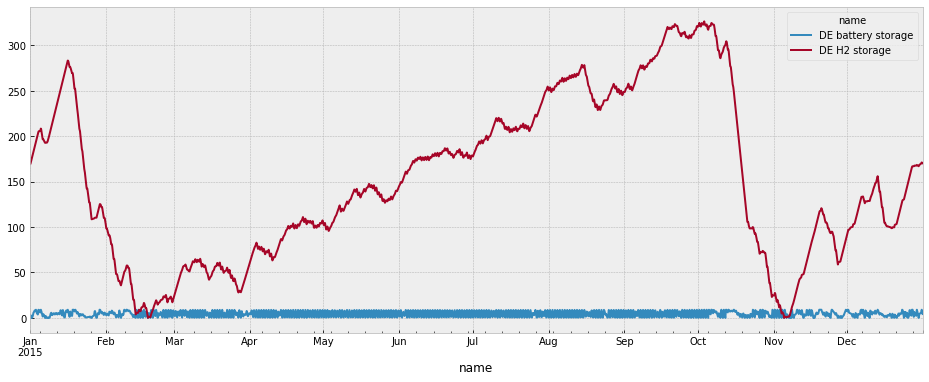

In [17]:
fig, ax = plt.subplots()
fig.set_size_inches((16,6))
n_operation.stores_t.e.plot(ax=ax)

<AxesSubplot:xlabel='name'>

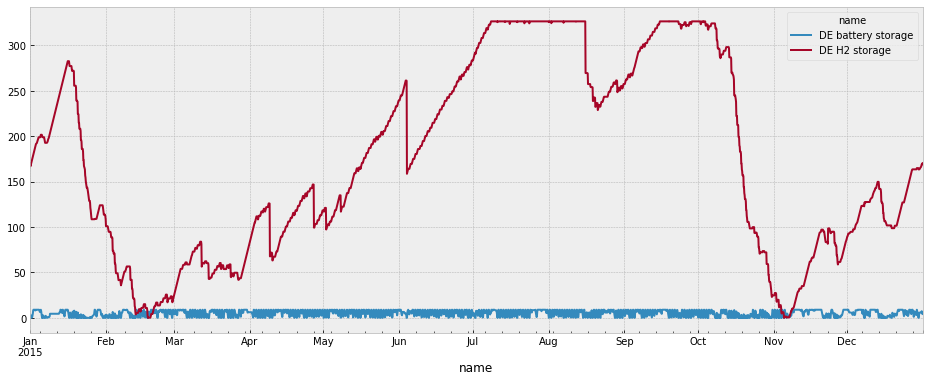

In [18]:
fig, ax = plt.subplots()
fig.set_size_inches((16,6))
n_de_rh_sp.stores_t.e.plot(ax=ax)

In [19]:
n_operation.buses_t.marginal_price

name,DE,DE battery,DE H2
name,,,
2015-01-01 00:00:00,31.170052,28.053046,18.702032
2015-01-01 03:00:00,31.170051,28.053046,18.702032
2015-01-01 06:00:00,31.170051,28.053046,18.702032
2015-01-01 09:00:00,0.000016,0.000017,18.702032
2015-01-01 12:00:00,0.000015,0.000016,18.702032
...,...,...,...
2015-12-31 09:00:00,14.961625,16.624028,18.702032
2015-12-31 12:00:00,14.961625,16.624028,18.702032
2015-12-31 15:00:00,31.170051,28.053046,18.702032


In [20]:
n_operation.links_t.mu_upper

name,DE battery charge,DE battery discharge,DE H2 electrolysis,DE H2 to power
name,,,,
2015-01-01 00:00:00,1.530924e-07,1.949631e-07,4.374887e-07,2.571071e-07
2015-01-01 03:00:00,1.531111e-07,1.869866e-07,4.374585e-07,2.561423e-07
2015-01-01 06:00:00,1.531375e-07,1.772422e-07,4.371465e-07,2.531627e-07
2015-01-01 09:00:00,1.690287e-07,1.371930e-07,4.488483e+01,2.337196e-07
2015-01-01 12:00:00,2.994187e-07,1.378195e-07,4.488483e+01,2.337251e-07
...,...,...,...,...
2015-12-31 09:00:00,2.283240e-07,1.378564e-07,7.880541e-07,2.337075e-07
2015-12-31 12:00:00,2.616755e-07,1.378481e-07,7.278993e-07,2.337001e-07
2015-12-31 15:00:00,1.531185e-07,1.699044e-07,4.372752e-07,2.512856e-07


In [69]:
n_de_rh_sp_3h.links_t.marginal_cost

,DE H2 electrolysis,DE H2 to power,DE battery charge,DE battery discharge
name,,,,
2015-01-01 00:00:00,-14.961625,31.170053,-25.247742,31.170052
2015-01-01 03:00:00,-14.961625,31.170053,-25.247742,31.170052
2015-01-01 06:00:00,-14.961625,31.170053,-25.247742,31.170051
2015-01-01 09:00:00,-14.961625,31.170053,-0.000015,0.000019
2015-01-01 12:00:00,-14.961625,31.170053,-0.000015,0.000018
...,...,...,...,...
2015-12-31 09:00:00,-14.961625,31.170053,-14.961625,18.471142
2015-12-31 12:00:00,-14.961625,31.170053,-14.961625,18.471142
2015-12-31 15:00:00,-14.961625,31.170053,-25.247742,31.170051


In [64]:
n_de_rh_sp.buses_t.marginal_price

name,DE,DE battery,DE H2
name,,,
2015-01-01 00:00:00,14.961625,13.465463,0.000000
2015-01-01 03:00:00,51.950088,46.755079,0.000000
2015-01-01 06:00:00,51.950088,46.755079,0.000000
2015-01-01 09:00:00,0.000000,0.000000,0.000000
2015-01-01 12:00:00,0.000000,0.000000,0.000000
...,...,...,...
2015-12-31 09:00:00,0.000000,0.000000,0.000000
2015-12-31 12:00:00,0.000000,0.000000,0.000000
2015-12-31 15:00:00,51.950088,46.755079,0.000000


In [66]:
n_de_rh_sp_3h.buses_t.marginal_price

name,DE,DE battery,DE H2
name,,,
2015-01-01 00:00:00,34.633391,0.000000,0.000000
2015-01-01 03:00:00,51.950088,15.585027,0.000000
2015-01-01 06:00:00,51.950088,15.585028,0.000000
2015-01-01 09:00:00,0.000015,0.000000,0.000000
2015-01-01 12:00:00,0.000015,0.000000,0.000000
...,...,...,...
2015-12-31 09:00:00,14.961625,0.000000,0.000000
2015-12-31 12:00:00,14.961625,0.000000,0.000000
2015-12-31 15:00:00,34.633390,0.000000,0.000000


<AxesSubplot:xlabel='name'>

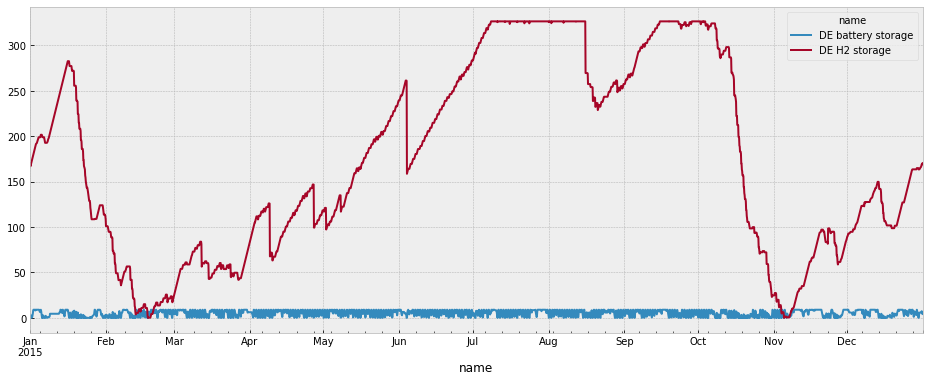

In [56]:
fig, ax = plt.subplots()
fig.set_size_inches((16,6))
n_de_rh_sp_3h.stores_t.e.plot(ax=ax)

<AxesSubplot:xlabel='name'>

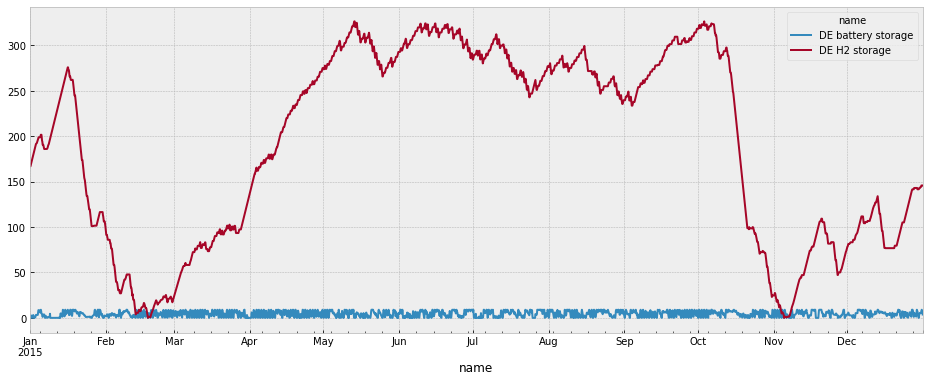

In [49]:
fig, ax = plt.subplots()
fig.set_size_inches((16,6))
n_de_rh.stores_t.e.plot(ax=ax)

<AxesSubplot:xlabel='name'>

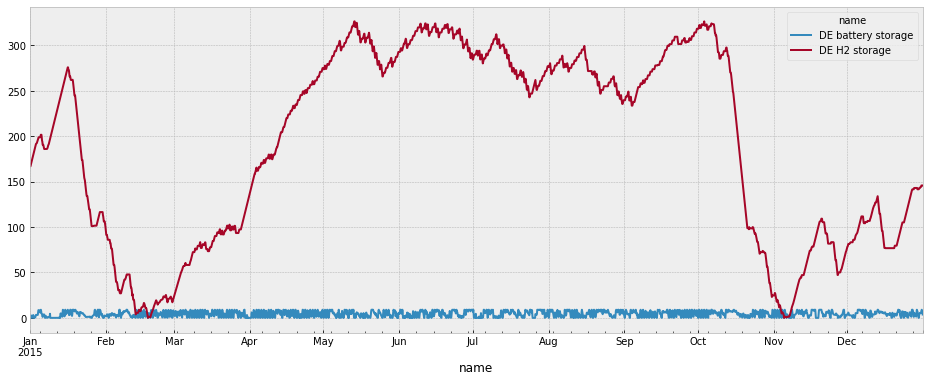

In [46]:
fig, ax = plt.subplots()
fig.set_size_inches((16,6))
n_de_rh_sp_2w.stores_t.e.plot(ax=ax)

<AxesSubplot:xlabel='name'>

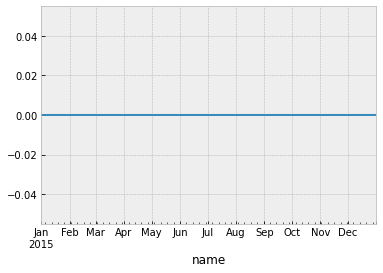

In [63]:
n = n_de_rh_sp_3h
n.generators_t.p[n.generators.index[n.generators.carrier == "load_shedding"]].sum(axis=1).plot()

<AxesSubplot:xlabel='name'>

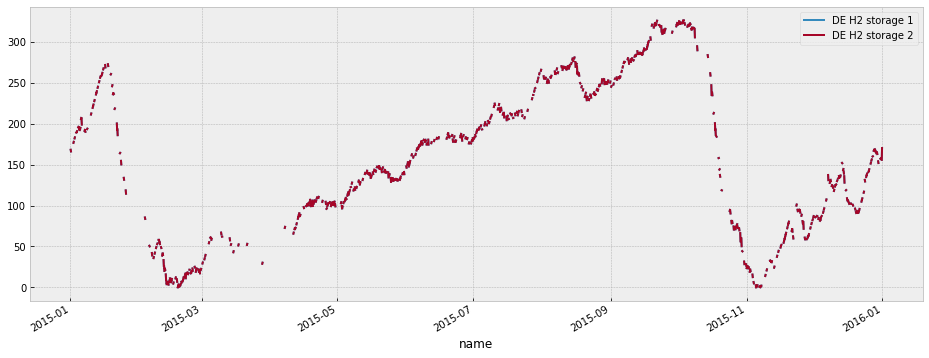

In [26]:
n_de_rh_sp.stores_t.e["DE H2 storage 1"] = n_de_rh_sp.stores_t.e["DE H2 storage"]
n_de_rh_sp.stores_t.e["DE H2 storage 2"] = n_de_rh_sp.stores_t.e["DE H2 storage"]
df = pd.concat([n_de_rh_sp.stores_t.e, n_operation.stores_t.e])
fig, ax = plt.subplots()
fig.set_size_inches((16,6))
df.loc[:, ["DE H2 storage 1", "DE H2 storage 2"]].plot(ax=ax)